In [1]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function
import numpy as np
import tensorflow as tf 
import tensorflow.keras.backend as K
from tensorflow.keras.layers import Layer
from tensorflow.keras.regularizers import Regularizer
from tensorflow.keras.initializers import Zeros, RandomNormal

In [2]:
import sympy
import matplotlib.pyplot as plt 
from tensorflow.keras import Input, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import LambdaCallback
print(tf.__version__)

1.14.0


In [3]:
class Connected(Layer):
    """
    General-purpose Keras connected layer
    Parent class used by my implementations of both the normal EQL layers,
    merely acts as a fully-connected neural network layer with functionality
    for L2 (dynamic) regularization and L0 norm preservation (as discussed in
    the original papers)
    Arguments
        outputShape: integer, number of values to be outputted by the layer
        kernel_initializer: tensorflow variable initializer, defines how
            weights are to be instantiated
        bias_initializer: tensorflow variable initializer, defines how biases
            are to be instantiated
        regularization: coefficient of L2 regularization
    """

    def __init__(self, outputShape, kernel_initializer=RandomNormal,
                 bias_initializer=Zeros, regularization=0., **kwargs):
        self.outputShape = outputShape
        self.kernel_initializer = kernel_initializer
        self.bias_initializer = bias_initializer
        self.regularization = tf.Variable(regularization,
                                          name='regularization',
                                          trainable=False, dtype=tf.float32)
        super(Connected, self).__init__(**kwargs)

    # L0 norm preservation for weights and biases, respectively
    def Wconstraint(self, w):
        return w * self.Wtrimmer

    def bconstraint(self, b):
        return b * self.btrimmer

    def build(self, inputShape):
        self.W = self.add_weight(name='kernel',
                                 shape=(int(inputShape[1]), self.outputShape),
                                 initializer=self.kernel_initializer,
                                 constraint=self.Wconstraint,
                                 trainable=True)
        self.Wtrimmer = tf.Variable(tf.ones_like(self.W), name='Wtrimmer',
                                    trainable=False)
        self.b = self.add_weight(name='bias',
                                 shape=(self.outputShape),
                                 initializer=self.bias_initializer,
                                 constraint=self.bconstraint,
                                 trainable=True)
        self.btrimmer = tf.Variable(tf.ones_like(self.b), name='btrimmer',
                                    trainable=False)
        super(Connected, self).build(inputShape)

    def call(self, x):
        output = tf.matmul(x, self.W) + self.b

        # regularization
        regularizationLoss = self.regularization * (
                tf.reduce_sum(tf.abs(self.W)) + tf.reduce_sum(tf.abs(self.b)))
        self.add_loss(regularizationLoss)

        return output

    def compute_output_shape(self, inputShape):
        return (inputShape[0], self.outputShape)

class EqlLayer(Connected):
    """
    EQL linear-nonlinear layer
    Utilizes the Connected layer defined above and concatenates it with the
    EQL non-linear layer (involving unary nonlinear functions and binary
    product functions, as described in the original papers)
    Arguments
        nodeInfo: two-tuple containing number of unary and binary functions
            in the layer, respectively
        hypSet: list of N unary tensorflow-compatible functions constituting
            the hypothesis set of unary non-linear functions for this layer (as
            described in the original papers)
        unaryFunc: list of length nodeInfo[0] (number of unary functions) where
            each element is a number between 1 and N (inclusive). The ith
            element indicates which hypSet function is to be used for the ith
            unary function in the layer
    """

    def __init__(self, nodeInfo, hypSet, unaryFunc, **kwargs):
        self.nodeInfo = nodeInfo
        self.hypSet = hypSet
        self.unaryFunc = unaryFunc
        super(EqlLayer, self).__init__(nodeInfo[0] + 2 * nodeInfo[1], **kwargs)

    def build(self, inputShape):
        super(EqlLayer, self).build(inputShape)

    def call(self, x):
        linOutput = super(EqlLayer, self).call(x)

        u, v = self.nodeInfo
        output = [self.hypSet[self.unaryFunc[i]](linOutput[:, i:i+1])
                  for i in range(u)]
        output.extend([linOutput[:, i:i+1] * linOutput[:, i+1:i+2]
                       for i in range(u, u+2*v, 2)])
        output = tf.concat(output, axis=1)

        return output

    def compute_output_shape(self, inputShape):
        return (inputShape[0], self.nodeInfo[0] + self.nodeInfo[1])


class DivLayer(Connected):
    """
    EQL division layer
    Utilizes the Connected layer defined above and concatenates it with the
    EQL-div division layer which concludes a given model (as described in the
    original papers)
    Arguments
        outputShape: integer, number of values to be outputted by the layer
        threshold: individual outputs of this layer are set to 0 when that
            output's associated denominator is below this value (float)
        loss: custom loss function that can be added to layer
    """

    def __init__(self, outputShape, threshold=0.001, loss=None, **kwargs):
        self.outputShape = outputShape
        self.threshold = tf.Variable(threshold, name='threshold',
                                     trainable=False)
        self.loss = loss
        super(DivLayer, self).__init__(outputShape*2, **kwargs)

    def build(self, inputShape):
        super(DivLayer, self).build(inputShape)

    def call(self, x):
        linOutput = super(DivLayer, self).call(x)

        numerators = linOutput[:, ::2]
        denominators = linOutput[:, 1::2]
        # following three lines adapted from
        # https://github.com/martius-lab/EQL_Tensorflow
        zeros = tf.cast(denominators > self.threshold, dtype=tf.float32)
        denominatorsInverse = tf.math.reciprocal(tf.abs(denominators) + 1e-10)
        output = numerators * denominatorsInverse * zeros

        # negative denominator penalty
        denominatorLoss = tf.reduce_sum(
                tf.maximum(self.threshold - denominators,
                           tf.zeros_like(denominators)))
        self.add_loss(denominatorLoss)

        # passed custom loss
        if self.loss is not None:
            self.add_loss(self.loss(output))

        return output

    def compute_output_shape(self, inputShape):
        return (inputShape[0], self.outputShape)


In [4]:
def getNonlinearInfo(numHiddenLayers, numBinary, unaryPerBinary):
    """
    Generates a 2D list to be used as a nonlinearInfo argument in building an
    EQL/EQL-div model
    # Arguments
        numHiddenLayers: integer, number of hidden layers (i.e. layers
            including nonlinear keras layer components)
        numBinary: list of integers, available numbers to be used as number of
            binary functions in a nonlinear layer component
        unaryPerBinary: integer, number of unary function per binary function
            in a nonlinear layer component
    # Returns
        A 2D list of integers with dimension numHiddenLayers x 2. Rows
        represent layers, first column is number of unary functions, second
        column is number of binary functions
    """

    nonlinearInfo = [0 for i in range(numHiddenLayers)]
    for i in range(numHiddenLayers):
        v = np.random.choice(numBinary)  # binary nodes
        u = unaryPerBinary * v  # unary nodes
        nonlinearInfo[i] = [u, v]
    return nonlinearInfo


def rmse(y_true, y_pred):
    return tf.sqrt(tf.reduce_mean(tf.square(y_pred - y_true)))


def make_symbolic(n, m):
    """
    Generates a sympy matrix full of numbered variables. Not original: taken
    from Andrew Walker's post at https://stackoverflow.com/questions/23208838/
    sympy-substitute-sybolic-entries-in-a-matrix
    # Arguments
        n, m: number of rows, columns in matrix, respectively
    """

    rows = []
    for i in range(n):
        col = []
        for j in range(m):
            col.append(sympy.Symbol('x%d' % (j+1)))
        rows.append(col)
    return sympy.Matrix(rows)


In [5]:
class EQLDIV:
    """
    EQL-div function learning network
    # Arguments
        inputSize: number of input variables to model. Integer.
        outputSize: number of variables outputted by model. Integer.
        numLayers: number of layers in model. A layer is either a fully-
            connected linear map and a nonlinear map (hidden layer), or just a
            fully-connected linear map (final layer). The Keras Input layer
            doesn't count.
        layers: list of Keras layers containing all of the layer tensor outputs
            (not the layer object itself) in the EQL model (including the Keras
            Input layer).
        hypothesisSet: list of 2-tuples, first element of tuples is tensorflow
            R -> R function to be applied element-wise in nonlinear layer
            components, second element is the corresponding sympy function for
            use in printing out learned equations. In practice, usually
            contains identity, sine, cosine, and sigmoid.
        nonlinearInfo: list with rows equal to number of hidden layers and 2
            columns. First column is number of unary functions in each hidden
            layer, second column is number of binary functions in each hidden
            layer
        energyInfo: if energy regularization is to be used, is a list with
            length three containing (1) a python function which uses tensorflow
            methods to compute the Hamiltonian associated with each member of
            a batch of predicted state, (2) a float value giving the actual
            Hamilton of the data (NOTE: ENERGYINFO SHOULD ONLY BE USED WITH
            TIMESERIES DATA OR OTHER CONSTANT ENERGY DATA), and (3) a
            coefficient for scaling the energy error in the loss function
            (10^-5 recommended, only activated during the second training
            phase)
        learningRate: optimizer learning rate.
        divThreshold: float, value which denominator must be greater than in
            order for division to occur (division returns 0 otherwise)
        name: TensorFlow scope name (for TensorBoard)
        changeOfVariables: a list with length two containing (1) a python
            function which can transform an arbitrarily large numpy array
            training data set to a different set of variables and (2) the
            number of components per data point in the transformed data that
            the function in the first component outputs
    # References
        - [Learning Equations for Extrapolation and Control](
            https://arxiv.org/abs/1806.07259)
    """

    def __init__(self, inputSize, outputSize, numLayers=3, hypothesisSet=None,
                 nonlinearInfo=None, energyInfo=None, changeOfVariables=None,
                 name='EQLDIV'):
        #self.inputSize = changeOfVariables[1] or inputSize
        self.inputSize = inputSize
        self.outputSize = outputSize
        self.numLayers = numLayers
        self.layers = []
        
        # compulsorily pass hypothesisSet during initialisation of model
        self.hypothesisSet = hypothesisSet
        
        
        #getNonlinearInfo(numHiddenLayers, numBinary, unaryPerBinary)
        self.nonlinearInfo = nonlinearInfo or getNonlinearInfo(self.numLayers-1, [1], len(self.hypothesisSet[0]))
        self.energyInfo = energyInfo
        self.changeOfVariables = changeOfVariables
        self.name = name
        self.unaryFunctions = [
                [j % len(self.hypothesisSet[0])
                 for j in range(self.nonlinearInfo[i][0])]
                for i in range(self.numLayers-1)]

    def build(self, divThreshold=0.001, learningRate=0.001, method=Adam,
              loss='mse', metrics=[rmse]):
        """
        __init__ defines all of the variables this model depends upon, this
        function actual creates the tensorflow Model variable
        # Arguments
            learningRate: model learning rate
            method: model learning method
            loss: loss function used to penalize model based on accuracy
            metrics: metric used for gauging model performance when evaluated
                on data points post-training
        """

        self.layers.append(Input((self.inputSize,)))
        inp = int(self.layers[-1].shape[1])

        for i in range(self.numLayers):
            if (i == self.numLayers - 1):
                stddev = np.sqrt(1 / (self.outputSize * 2 * inp))
                randNorm = RandomNormal(0, stddev=stddev)
                self.layers.append(DivLayer(self.outputSize,
                                            threshold=divThreshold,
                                            kernel_initializer=randNorm,
                                            )(self.layers[-1]))
                break
            u, v = self.nonlinearInfo[i] or None
            out = u + 2 * v or None
            stddev = np.sqrt(1 / (inp * out))
            randNorm = RandomNormal(0, stddev=stddev)
            self.layers.append(EqlLayer(self.nonlinearInfo[i],
                                        self.hypothesisSet[0],
                                        self.unaryFunctions[i],
                                        kernel_initializer=randNorm,
                                        )(self.layers[-1]))
            inp = u + v

        # Optimizer
        optimizer = method(lr=learningRate)

        # Model
        self.model = Model(inputs=self.layers[0],
                           outputs=self.layers[-1])

        # Compilation
        self.model.compile(optimizer=optimizer, loss=loss, metrics=metrics)

    def fit(self, predictors, labels, numEpoch, regStrength=10**-3,
            batchSize=20, normThreshold=0.001, verbose=0):
        """
        Trains EQL model on a dataset following the training schedule defined
        in the reference.
        # Arguments
            predictors: ? x inputSize array containing data to be trained on
            labels: ? x outputSize array containing corresponding correct
                output for predictors, compared with model output
            numEpoch: integer, number of epochs
            reg: regularization (in the range [10^-4, 10^-2.5] is usually
                ideal)
            batchSize: number of datapoints trained on per gradient descent
                update
            normThreshold: float, weight/bias elements below this value are
                kept at zero during the final training phase
            verbose: 0, 1, or 2, determines whether Keras is silent, prints a
                progress bar, or prints a line every epoch.
        """
        if self.changeOfVariables:
            predictors = self.changeOfVariables[0](predictors)

        # Division threshold callbacks
        def phase1DivisionThresholdSchedule(epoch, logs):
            K.set_value(self.model.layers[-1].threshold,
                        1 / np.sqrt(epoch + 1))

        def phase2DivisionThresholdSchedule(epoch, logs):
            K.set_value(self.model.layers[-1].threshold,
                        1 / np.sqrt(int(numEpoch * (1 / 4)) + epoch + 1))

        def phase3DivisionThresholdSchedule(epoch, logs):
            K.set_value(
                    self.model.layers[-1].threshold,
                    1 / np.sqrt(int(numEpoch * (7/10))
                                + int(numEpoch * (1/4))
                                + epoch + 1))

        # PHASE 1: NO REGULARIZATION (T/4)
        for i in range(1, self.numLayers+1):
            K.set_value(self.model.layers[i].regularization, 0.)
            K.set_value(self.model.layers[i].Wtrimmer,
                        np.ones(self.model.layers[i].W.shape))
            K.set_value(self.model.layers[i].btrimmer,
                        np.ones(self.model.layers[i].b.shape))
        dynamicDivisionThreshold = LambdaCallback(
                on_epoch_begin=phase1DivisionThresholdSchedule)
        self.model.fit(predictors, labels, epochs=int(numEpoch*(1/4)),
                       batch_size=batchSize, verbose=verbose,
                       callbacks=[dynamicDivisionThreshold])

        # PHASE 2: REGULARIZATION (7T/10)
        if self.energyInfo is not None:
            K.set_value(self.model.layers[-1].loss.coef, self.coef)
        for i in range(1, self.numLayers+1):
            K.set_value(self.model.layers[i].regularization, regStrength)
        dynamicDivisionThreshold = LambdaCallback(
                on_epoch_begin=phase2DivisionThresholdSchedule)
        self.model.fit(predictors, labels, epochs=int(numEpoch*(7/10)),
                       batch_size=batchSize, verbose=verbose,
                       callbacks=[dynamicDivisionThreshold])

        # PHASE 3: NO REGULARIZATION, L0 NORM PRESERVATION (T/20)
        for i in range(1, self.numLayers+1):
            W, b = self.model.layers[i].get_weights()[:2]
            K.set_value(self.model.layers[i].regularization, 0.)
            K.set_value(self.model.layers[i].Wtrimmer,
                        (np.abs(W) > normThreshold).astype(float))
            K.set_value(self.model.layers[i].btrimmer,
                        (np.abs(b) > normThreshold).astype(float))
        dynamicDivisionThreshold = LambdaCallback(
                on_epoch_begin=phase3DivisionThresholdSchedule)
        self.model.fit(predictors, labels, epochs=int(numEpoch*(1/20)),
                       batch_size=batchSize, verbose=verbose,
                       callbacks=[dynamicDivisionThreshold])

        # Final maintenance
        K.set_value(self.model.layers[-1].threshold, 0.001)

    def evaluate(self, predictors, labels, batchSize=10, verbose=0):
        """Evaluates trained model on data"""
        return self.model.evaluate(predictors, labels, batch_size=batchSize,
                                   verbose=verbose)[1]

    def getEquation(self):
        """Prints learned equation of a trained model."""

        # prepares lists for weights and biases
        weights = []
        bias = []

        # pulls/separates weights and biases from a model
        for i in range(1, self.numLayers+1):
            weights.append(self.model.layers[i].get_weights()[0])
            bias.append(self.model.layers[i].get_weights()[1])

        # creates generic input vector
        X = make_symbolic(1, self.inputSize)

        for i, _ in enumerate(weights):
            # computes the result of the next linear layer
            W = sympy.Matrix(weights[i])
            b = sympy.Transpose(sympy.Matrix(bias[i]))
            Y = sympy.zeros(1, b.cols)
            X = X*W + b

            # computes the result of the next nonlinear layer, if applicable
            if i != (len(weights) - 1):
                u, v = self.nonlinearInfo[i]

                # computes the result of the unary component of the nonlinear
                # layer
                # iterating over unary input
                for j in range(u):
                    Y[0, j] = self.hypothesisSet[1][self.unaryFunctions[i][j]](
                            X[0, j])

                # computes the result of the binary component of the nonlinear
                # layer
                # iterating over binary input
                for j in range(v):
                    Y[0, j+u] = X[0, j * 2 + u] * X[0, j * 2 + u + 1]

                # removes final v rows which are now outdated
                for j in range(u + v, Y.cols):
                    Y.col_del(u + v)

                X = Y

            if i == (len(weights) - 1):
                # computes the result of the binary component of the nonlinear
                # layer
                # iterating over binary input
                for j in range(int(X.cols/2)):
                    if sympy.Abs(X[0, j*2+1]) == 0:
                        Y[0, j] = 0
                    else:
                        Y[0, j] = X[0, j*2] / X[0, j*2+1]
                for j in range(int(X.cols/2)):
                    Y.col_del(int(X.cols/2))

                X = Y

        return X

    def plotSlice(self, function, xmin=-2, xmax=2, step=0.01, width=10,
                  height=10, settings=dict(), save=False):
        """
        Plots the x_1 = ... = x_n slice of the learned function in each output
        variable.
        """

        # x values
        X = np.asarray(
                [[(i * step) + xmin for i in range(int((xmax - xmin)/step))]
                    for j in range(self.inputSize)])
        # goal function values
        F_Y = np.apply_along_axis(function, 0, X)
        # model predictions
        model_Y = self.model.predict(np.transpose(X))
        model_Y = np.transpose(model_Y)

        settings['figure.figsize'] = (width, height)
        with plt.rc_context(settings):
            fig, axs = plt.subplots(self.outputSize, figsize=(width, height))

            if self.outputSize == 1:
                axs = [axs]

            for i in range(self.outputSize):
                axs[i].plot(X[0], F_Y[i], linestyle='-', label='Goal Function')
                axs[i].plot(X[0], model_Y[i], linestyle=':',
                            label='Learned Function')

            plt.legend()

        if save:
            plt.savefig(self.name + '.png', bbox_inches='tight', dpi=300)

    def percentError(self, predictors, labels):
        """
        Returns the average percent error in each variable of a trained model
        with respect to a testing data set
        """

        labels = np.reshape(labels, (-1, self.outputSize))
        predictions = self.model.predict(predictors)
        error = np.divide(np.abs(predictions - labels), np.abs(labels))
        error = np.sum(error, 0)
        error *= (100 / labels.shape[0])
        return error

    def sparsity(self, minMag=0.01):
        """Returns the sparsity of a trained model (number of active nodes)"""

        vec = np.ones((1, self.inputSize))
        weights = self.model.get_weights()
        sparsity = 0
        for i in range(self.numLayers - 1):
            u, v = self.nonlinearInfo[i]
            w, b = weights[i*2], weights[i*2+1]
            vec = np.dot(vec, w) + b
            vec = np.concatenate(
                    (vec[:, :u], vec[:, u::2] * vec[:, u+1::2]), axis=1)
            sparsity += np.sum(
                    (np.abs(vec) > np.full_like(vec, minMag)).astype(int))

        w, b = weights[len(weights)-2], weights[len(weights)-1]
        vec = np.dot(vec, w) + b
        vec = vec[0, ::2] * vec[0, 1::2]
        sparsity += np.sum(
                (np.abs(vec) > np.full_like(vec, minMag)).astype(int))
        return sparsity

    def setPipeline(self, pipeline):
        """
        Saves the scikit_learn pipeline used to modify training data so that
        the same pipeline can be applied to testing data
        """

        self.pipeline = pipeline

    def applyPipeline(self, x):
        """Applies a saved scikit_learn pipeline to a dataset"""

        if self.pipeline is not None:
            for op in self.pipeline:
                x = op.transform(x)
        return x

    def odecompat(self, t, x):
        """Wrapper for Keras' function, solve_ivp compatible"""

        # if statement is bad hack for experimentations with feature
        # engineering for double pendulum
#        if self.inputSize == 7:
#            if len(np.array(x).shape) == 2:
#                y = [x[0, 0] - x[0, 2], x[0, 1]**2, x[0, 3]**2]
#                x = np.append(x, y)
#            else:
#                y = [x[0] - x[2], x[1]**2, x[3]**2]
#                x = np.append(x, y)

        prediction = self.model.predict(np.reshape(x, (1, -1)))
        return prediction

    def printJacobian(self, x):
        """
        Prints the Jacobian of the learned function, evaluated at a point
        # Arguments
            x: point at which Jacobian is evaluated, array-like with
                self.inputSize elements
        """
        x = np.reshape(x, (1, 1, self.inputSize)).tolist()
        gradients = [tf.gradients(self.model.output[:, i], self.model.input)[0]
                     for i in range(4)]
        funcs = [K.function((self.model.input, ), [g]) for g in gradients]
        jacobian = np.concatenate([func(x)[0] for func in funcs], axis=0)

        with tf.Session() as sess:
            sess.run(tf.global_variables_initializer())
            print(jacobian)

In [6]:
# Hyothesis fns: only identity
hypset1 = [[tf.identity], [sympy.Id]]
        
# Hyothesis fns: identity and exp
hypset2 = [[tf.identity, tf.exp], [sympy.Id, sympy.exp]]

# Hyothesis fns: identity and reciprocal        
hypset3 = [[tf.identity, tf.reciprocal], [sympy.Id, sympy.Function("inv")]]

# Hypothesis fns: sin, cos, identity
hypset4 = [[tf.identity, tf.sin, tf.cos], [sympy.Id, sympy.sin, sympy.cos]]
        
# Hyothesis fns: identity, exp and reciprocal (removing cos as per paper)        
hypset5 = [[tf.identity, tf.exp, tf.reciprocal], [sympy.Id, sympy.exp, sympy.Function("inv")]]

superset = [hypset1, hypset2, hypset3, hypset4, hypset5]

# Pade Approximation

In [15]:
x1 = np.linspace(1, 5, num=500)
out = (1-0.5*x1)/(1+0.5*x1)
x = x1
y = out

In [16]:
x_test = np.linspace(6,8, num=100)
y_test = (1-0.5*x_test)/(1+0.5*x_test)

# Adding noise to train and test data

In [17]:
std_dev = np.std(x1)
noise = np.random.normal(loc=0, scale=std_dev/10, size=len(x1))
x1 = x1 + noise
out = (1-0.5*x1)/(1+0.5*x1)
x = x1
y = out
noise = np.random.normal(loc=0, scale=std_dev/10, size=len(x_test))
x_test = x_test + noise
y_test = (1-0.5*x_test)/(1+0.5*x_test)

In [18]:
for hypset in superset:
    print("For the hypothesis set:", str(hypset))
    my_eql_model = EQLDIV(inputSize=1, outputSize=1, numLayers=2, hypothesisSet=hypset)
    my_eql_model.build(learningRate=0.001, method=Adam, loss='mse')
    my_eql_model.fit(x, y, numEpoch=3000, batchSize=20, regStrength=10**-3, verbose=1)
    print(my_eql_model.getEquation())
    # Final RMSE on the training data
    print("Final RMSE on training data = ", my_eql_model.evaluate(x,y))
    print("Final RMSE on test data = ", my_eql_model.evaluate(x_test,y_test))
    print("\n\n\n")

For the hypothesis set: [[<function add_dispatch_support.<locals>.wrapper at 0x000001F4A5D309D8>], [Lambda(_x, _x)]]
Epoch 1/750
500/500 [==============================] - 0s 281us/sample - loss: 20.2527 - rmse: 0.2571
Epoch 2/750
500/500 [==============================] - 0s 52us/sample - loss: 11.3976 - rmse: 0.2574
Epoch 3/750
500/500 [==============================] - 0s 50us/sample - loss: 5.4259 - rmse: 0.4113
Epoch 4/750
500/500 [==============================] - 0s 46us/sample - loss: 2.4856 - rmse: 0.5961
Epoch 5/750
500/500 [==============================] - 0s 46us/sample - loss: 1.2875 - rmse: 0.5194
Epoch 6/750
500/500 [==============================] - 0s 44us/sample - loss: 0.7085 - rmse: 0.4351
Epoch 7/750
500/500 [==============================] - 0s 42us/sample - loss: 0.3998 - rmse: 0.3801
Epoch 8/750
500/500 [==============================] - 0s 42us/sample - loss: 0.2456 - rmse: 0.3639
Epoch 9/750
500/500 [==============================] - 0s 40us/sample - loss: 0.

500/500 [==============================] - 0s 37us/sample - loss: 0.0012 - rmse: 0.0350
Epoch 159/750
500/500 [==============================] - 0s 42us/sample - loss: 0.0012 - rmse: 0.0346
Epoch 160/750
500/500 [==============================] - 0s 40us/sample - loss: 0.0012 - rmse: 0.0344
Epoch 161/750
500/500 [==============================] - 0s 38us/sample - loss: 0.0012 - rmse: 0.0341
Epoch 162/750
500/500 [==============================] - 0s 40us/sample - loss: 0.0012 - rmse: 0.0339
Epoch 163/750
500/500 [==============================] - 0s 38us/sample - loss: 0.0012 - rmse: 0.0336
Epoch 164/750
500/500 [==============================] - 0s 40us/sample - loss: 0.0011 - rmse: 0.0333
Epoch 165/750
500/500 [==============================] - 0s 42us/sample - loss: 0.0011 - rmse: 0.0330
Epoch 166/750
500/500 [==============================] - 0s 41us/sample - loss: 0.0011 - rmse: 0.0330
Epoch 167/750
500/500 [==============================] - 0s 41us/sample - loss: 0.0011 - rmse: 0

500/500 [==============================] - 0s 40us/sample - loss: 1.0082e-05 - rmse: 0.0031
Epoch 311/750
500/500 [==============================] - 0s 40us/sample - loss: 1.0622e-05 - rmse: 0.0032
Epoch 312/750
500/500 [==============================] - 0s 41us/sample - loss: 9.8729e-06 - rmse: 0.0031
Epoch 313/750
500/500 [==============================] - 0s 42us/sample - loss: 1.0139e-05 - rmse: 0.0031
Epoch 314/750
500/500 [==============================] - 0s 39us/sample - loss: 1.0391e-05 - rmse: 0.0032
Epoch 315/750
500/500 [==============================] - 0s 39us/sample - loss: 1.0255e-05 - rmse: 0.0032
Epoch 316/750
500/500 [==============================] - 0s 39us/sample - loss: 9.9706e-06 - rmse: 0.0031
Epoch 317/750
500/500 [==============================] - 0s 44us/sample - loss: 9.6381e-06 - rmse: 0.0031
Epoch 318/750
500/500 [==============================] - 0s 42us/sample - loss: 9.7882e-06 - rmse: 0.0031
Epoch 319/750
500/500 [==============================] - 0s 

500/500 [==============================] - 0s 40us/sample - loss: 7.6117e-06 - rmse: 0.0027
Epoch 462/750
500/500 [==============================] - 0s 40us/sample - loss: 7.4074e-06 - rmse: 0.0027
Epoch 463/750
500/500 [==============================] - 0s 40us/sample - loss: 8.3125e-06 - rmse: 0.0028
Epoch 464/750
500/500 [==============================] - 0s 41us/sample - loss: 6.4928e-06 - rmse: 0.0025
Epoch 465/750
500/500 [==============================] - 0s 42us/sample - loss: 6.8849e-06 - rmse: 0.0026
Epoch 466/750
500/500 [==============================] - 0s 42us/sample - loss: 7.0777e-06 - rmse: 0.0026
Epoch 467/750
500/500 [==============================] - 0s 40us/sample - loss: 7.5010e-06 - rmse: 0.0027
Epoch 468/750
500/500 [==============================] - 0s 43us/sample - loss: 5.9142e-06 - rmse: 0.0024
Epoch 469/750
500/500 [==============================] - 0s 39us/sample - loss: 6.4062e-06 - rmse: 0.0025
Epoch 470/750
500/500 [==============================] - 0s 

500/500 [==============================] - 0s 38us/sample - loss: 4.1164e-07 - rmse: 6.3195e-04
Epoch 613/750
500/500 [==============================] - 0s 42us/sample - loss: 4.5502e-07 - rmse: 6.5643e-04
Epoch 614/750
500/500 [==============================] - 0s 42us/sample - loss: 4.0167e-07 - rmse: 6.1908e-04
Epoch 615/750
500/500 [==============================] - 0s 51us/sample - loss: 3.7046e-07 - rmse: 5.9490e-04
Epoch 616/750
500/500 [==============================] - 0s 39us/sample - loss: 3.4012e-07 - rmse: 5.6885e-04
Epoch 617/750
500/500 [==============================] - 0s 40us/sample - loss: 4.1699e-07 - rmse: 6.3141e-04
Epoch 618/750
500/500 [==============================] - 0s 40us/sample - loss: 4.2587e-07 - rmse: 6.3530e-04
Epoch 619/750
500/500 [==============================] - 0s 40us/sample - loss: 3.7110e-07 - rmse: 5.9338e-04
Epoch 620/750
500/500 [==============================] - 0s 40us/sample - loss: 3.7569e-07 - rmse: 5.9712e-04
Epoch 621/750
500/500 [=

500/500 [==============================] - 0s 39us/sample - loss: 7.7215e-04 - rmse: 3.5436e-04
Epoch 12/2100
500/500 [==============================] - 0s 38us/sample - loss: 6.9228e-04 - rmse: 3.3635e-04
Epoch 13/2100
500/500 [==============================] - 0s 39us/sample - loss: 6.1496e-04 - rmse: 6.7098e-04
Epoch 14/2100
500/500 [==============================] - 0s 41us/sample - loss: 5.5531e-04 - rmse: 0.0028
Epoch 15/2100
500/500 [==============================] - 0s 39us/sample - loss: 5.1972e-04 - rmse: 0.0020
Epoch 16/2100
500/500 [==============================] - 0s 38us/sample - loss: 4.9461e-04 - rmse: 0.0011
Epoch 17/2100
500/500 [==============================] - 0s 38us/sample - loss: 4.8135e-04 - rmse: 0.0021
Epoch 18/2100
500/500 [==============================] - ETA: 0s - loss: 4.7915e-04 - rmse: 0.00 - 0s 40us/sample - loss: 4.6825e-04 - rmse: 0.0033
Epoch 19/2100
500/500 [==============================] - 0s 40us/sample - loss: 4.4361e-04 - rmse: 0.0017
Epoch 

Epoch 160/2100
500/500 [==============================] - 0s 43us/sample - loss: 6.5864e-04 - rmse: 0.0069
Epoch 161/2100
500/500 [==============================] - ETA: 0s - loss: 5.1419e-04 - rmse: 0.01 - 0s 42us/sample - loss: 4.2319e-04 - rmse: 0.0075
Epoch 162/2100
500/500 [==============================] - 0s 41us/sample - loss: 3.8669e-04 - rmse: 0.0044
Epoch 163/2100
500/500 [==============================] - 0s 41us/sample - loss: 3.6979e-04 - rmse: 0.0024
Epoch 164/2100
500/500 [==============================] - 0s 39us/sample - loss: 3.6311e-04 - rmse: 0.0015
Epoch 165/2100
500/500 [==============================] - 0s 42us/sample - loss: 3.5755e-04 - rmse: 9.0136e-04
Epoch 166/2100
500/500 [==============================] - 0s 40us/sample - loss: 3.5330e-04 - rmse: 7.6498e-04
Epoch 167/2100
500/500 [==============================] - 0s 39us/sample - loss: 3.4901e-04 - rmse: 6.9193e-04
Epoch 168/2100
500/500 [==============================] - 0s 38us/sample - loss: 3.4477e-0

500/500 [==============================] - 0s 40us/sample - loss: 3.4201e-04 - rmse: 7.5309e-04
Epoch 309/2100
500/500 [==============================] - 0s 39us/sample - loss: 3.3812e-04 - rmse: 5.8396e-04
Epoch 310/2100
500/500 [==============================] - 0s 41us/sample - loss: 3.3431e-04 - rmse: 5.0812e-04
Epoch 311/2100
500/500 [==============================] - 0s 39us/sample - loss: 3.3054e-04 - rmse: 5.4847e-04
Epoch 312/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.1419e-04 - rmse: 0.0070
Epoch 313/2100
500/500 [==============================] - 0s 40us/sample - loss: 4.2398e-04 - rmse: 0.0086
Epoch 314/2100
500/500 [==============================] - 0s 38us/sample - loss: 3.7345e-04 - rmse: 0.0051
Epoch 315/2100
500/500 [==============================] - 0s 39us/sample - loss: 3.5105e-04 - rmse: 0.0023
Epoch 316/2100
500/500 [==============================] - 0s 38us/sample - loss: 3.4329e-04 - rmse: 0.0012
Epoch 317/2100
500/500 [============

500/500 [==============================] - 0s 39us/sample - loss: 3.2777e-04 - rmse: 5.1996e-04
Epoch 457/2100
500/500 [==============================] - 0s 40us/sample - loss: 3.2426e-04 - rmse: 4.5858e-04
Epoch 458/2100
500/500 [==============================] - 0s 41us/sample - loss: 3.2101e-04 - rmse: 4.8385e-04
Epoch 459/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.1966e-04 - rmse: 0.0056
Epoch 460/2100
500/500 [==============================] - 0s 41us/sample - loss: 4.9345e-04 - rmse: 0.0123
Epoch 461/2100
500/500 [==============================] - 0s 40us/sample - loss: 3.8513e-04 - rmse: 0.0067
Epoch 462/2100
500/500 [==============================] - 0s 41us/sample - loss: 3.4540e-04 - rmse: 0.0032
Epoch 463/2100
500/500 [==============================] - 0s 37us/sample - loss: 3.3478e-04 - rmse: 0.0015
Epoch 464/2100
500/500 [==============================] - 0s 41us/sample - loss: 3.2973e-04 - rmse: 6.0728e-04
Epoch 465/2100
500/500 [============

500/500 [==============================] - 0s 39us/sample - loss: 3.1332e-04 - rmse: 5.1142e-04
Epoch 607/2100
500/500 [==============================] - 0s 48us/sample - loss: 3.1021e-04 - rmse: 4.8106e-04
Epoch 608/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.6729e-04 - rmse: 0.0097
Epoch 609/2100
500/500 [==============================] - 0s 40us/sample - loss: 3.6885e-04 - rmse: 0.0066
Epoch 610/2100
500/500 [==============================] - 0s 42us/sample - loss: 3.3287e-04 - rmse: 0.0032
Epoch 611/2100
500/500 [==============================] - 0s 39us/sample - loss: 3.2706e-04 - rmse: 0.0024
Epoch 612/2100
500/500 [==============================] - 0s 41us/sample - loss: 3.1924e-04 - rmse: 0.0011
Epoch 613/2100
500/500 [==============================] - 0s 39us/sample - loss: 3.1517e-04 - rmse: 5.7379e-04
Epoch 614/2100
500/500 [==============================] - 0s 38us/sample - loss: 3.1180e-04 - rmse: 4.5873e-04
Epoch 615/2100
500/500 [============

Epoch 754/2100
500/500 [==============================] - 0s 42us/sample - loss: 3.1761e-04 - rmse: 0.0020
Epoch 755/2100
500/500 [==============================] - 0s 40us/sample - loss: 3.1101e-04 - rmse: 9.0975e-04
Epoch 756/2100
500/500 [==============================] - 0s 39us/sample - loss: 3.0706e-04 - rmse: 5.3846e-04
Epoch 757/2100
500/500 [==============================] - 0s 39us/sample - loss: 3.0352e-04 - rmse: 4.4660e-04
Epoch 758/2100
500/500 [==============================] - 0s 38us/sample - loss: 2.9986e-04 - rmse: 4.4054e-04
Epoch 759/2100
500/500 [==============================] - 0s 38us/sample - loss: 7.9123e-04 - rmse: 0.0165
Epoch 760/2100
500/500 [==============================] - 0s 38us/sample - loss: 3.9192e-04 - rmse: 0.0081
Epoch 761/2100
500/500 [==============================] - 0s 39us/sample - loss: 3.4069e-04 - rmse: 0.0046
Epoch 762/2100
500/500 [==============================] - 0s 39us/sample - loss: 3.2053e-04 - rmse: 0.0019
Epoch 763/2100
500/50

500/500 [==============================] - 0s 39us/sample - loss: 2.9477e-04 - rmse: 4.2525e-04
Epoch 903/2100
500/500 [==============================] - 0s 42us/sample - loss: 6.1850e-04 - rmse: 0.0076
Epoch 904/2100
500/500 [==============================] - 0s 40us/sample - loss: 4.4571e-04 - rmse: 0.0114
Epoch 905/2100
500/500 [==============================] - 0s 41us/sample - loss: 3.3266e-04 - rmse: 0.0046
Epoch 906/2100
500/500 [==============================] - 0s 39us/sample - loss: 3.0971e-04 - rmse: 0.0016
Epoch 907/2100
500/500 [==============================] - 0s 40us/sample - loss: 3.0484e-04 - rmse: 6.5453e-04
Epoch 908/2100
500/500 [==============================] - 0s 41us/sample - loss: 3.0170e-04 - rmse: 4.4291e-04
Epoch 909/2100
500/500 [==============================] - 0s 42us/sample - loss: 2.9878e-04 - rmse: 5.0656e-04
Epoch 910/2100
500/500 [==============================] - 0s 39us/sample - loss: 2.9580e-04 - rmse: 4.9113e-04
Epoch 911/2100
500/500 [========

500/500 [==============================] - 0s 41us/sample - loss: 3.2494e-04 - rmse: 0.0046
Epoch 1049/2100
500/500 [==============================] - 0s 39us/sample - loss: 3.0910e-04 - rmse: 0.0027
Epoch 1050/2100
500/500 [==============================] - 0s 40us/sample - loss: 2.9920e-04 - rmse: 9.6973e-04
Epoch 1051/2100
500/500 [==============================] - 0s 42us/sample - loss: 2.9585e-04 - rmse: 5.9166e-04
Epoch 1052/2100
500/500 [==============================] - 0s 38us/sample - loss: 2.9278e-04 - rmse: 4.9441e-04
Epoch 1053/2100
500/500 [==============================] - 0s 40us/sample - loss: 2.8997e-04 - rmse: 5.2232e-04
Epoch 1054/2100
500/500 [==============================] - 0s 39us/sample - loss: 2.8692e-04 - rmse: 4.7099e-04
Epoch 1055/2100
500/500 [==============================] - 0s 42us/sample - loss: 6.1315e-04 - rmse: 0.0073
Epoch 1056/2100
500/500 [==============================] - 0s 62us/sample - loss: 4.3415e-04 - rmse: 0.0110
Epoch 1057/2100
500/500 

500/500 [==============================] - 0s 39us/sample - loss: 2.8471e-04 - rmse: 3.7642e-04
Epoch 1197/2100
500/500 [==============================] - 0s 40us/sample - loss: 2.8193e-04 - rmse: 4.2073e-04
Epoch 1198/2100
500/500 [==============================] - 0s 40us/sample - loss: 5.9272e-04 - rmse: 0.0069
Epoch 1199/2100
500/500 [==============================] - 0s 40us/sample - loss: 3.6033e-04 - rmse: 0.0080
Epoch 1200/2100
500/500 [==============================] - 0s 40us/sample - loss: 3.1538e-04 - rmse: 0.0045
Epoch 1201/2100
500/500 [==============================] - 0s 38us/sample - loss: 2.9412e-04 - rmse: 0.0018
Epoch 1202/2100
500/500 [==============================] - 0s 38us/sample - loss: 2.8845e-04 - rmse: 5.1182e-04
Epoch 1203/2100
500/500 [==============================] - 0s 40us/sample - loss: 2.8544e-04 - rmse: 4.0507e-04
Epoch 1204/2100
500/500 [==============================] - 0s 42us/sample - loss: 2.8256e-04 - rmse: 4.3528e-04
Epoch 1205/2100
500/500 

500/500 [==============================] - 0s 40us/sample - loss: 3.0657e-04 - rmse: 0.0042
Epoch 1344/2100
500/500 [==============================] - 0s 40us/sample - loss: 2.8688e-04 - rmse: 0.0011
Epoch 1345/2100
500/500 [==============================] - 0s 39us/sample - loss: 2.8321e-04 - rmse: 4.3710e-04
Epoch 1346/2100
500/500 [==============================] - 0s 39us/sample - loss: 2.8048e-04 - rmse: 3.4533e-04
Epoch 1347/2100
500/500 [==============================] - 0s 40us/sample - loss: 2.7761e-04 - rmse: 3.7941e-04
Epoch 1348/2100
500/500 [==============================] - 0s 39us/sample - loss: 2.7487e-04 - rmse: 4.0343e-04
Epoch 1349/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.0482e-04 - rmse: 0.0079
Epoch 1350/2100
500/500 [==============================] - 0s 39us/sample - loss: 3.3609e-04 - rmse: 0.0071
Epoch 1351/2100
500/500 [==============================] - 0s 39us/sample - loss: 3.0459e-04 - rmse: 0.0040
Epoch 1352/2100
500/500 [===

500/500 [==============================] - 0s 40us/sample - loss: 6.9733e-04 - rmse: 0.0145
Epoch 1490/2100
500/500 [==============================] - 0s 40us/sample - loss: 3.4377e-04 - rmse: 0.0074
Epoch 1491/2100
500/500 [==============================] - 0s 42us/sample - loss: 2.9201e-04 - rmse: 0.0026
Epoch 1492/2100
500/500 [==============================] - 0s 40us/sample - loss: 2.8120e-04 - rmse: 6.1876e-04
Epoch 1493/2100
500/500 [==============================] - 0s 41us/sample - loss: 2.7850e-04 - rmse: 4.2467e-04
Epoch 1494/2100
500/500 [==============================] - 0s 39us/sample - loss: 2.7601e-04 - rmse: 5.0115e-04
Epoch 1495/2100
500/500 [==============================] - 0s 42us/sample - loss: 2.7332e-04 - rmse: 4.8494e-04
Epoch 1496/2100
500/500 [==============================] - ETA: 0s - loss: 2.7173e-04 - rmse: 4.0785e- - 0s 40us/sample - loss: 2.7055e-04 - rmse: 3.4754e-04
Epoch 1497/2100
500/500 [==============================] - 0s 42us/sample - loss: 5.90

500/500 [==============================] - 0s 40us/sample - loss: 2.7504e-04 - rmse: 9.5579e-04
Epoch 1635/2100
500/500 [==============================] - 0s 40us/sample - loss: 2.7198e-04 - rmse: 4.7717e-04
Epoch 1636/2100
500/500 [==============================] - 0s 41us/sample - loss: 2.6912e-04 - rmse: 3.8272e-04
Epoch 1637/2100
500/500 [==============================] - 0s 39us/sample - loss: 2.6658e-04 - rmse: 4.4175e-04
Epoch 1638/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.3818e-04 - rmse: 0.0103
Epoch 1639/2100
500/500 [==============================] - 0s 39us/sample - loss: 3.5805e-04 - rmse: 0.0088
Epoch 1640/2100
500/500 [==============================] - 0s 41us/sample - loss: 2.8387e-04 - rmse: 0.0025
Epoch 1641/2100
500/500 [==============================] - 0s 40us/sample - loss: 2.7754e-04 - rmse: 0.0012
Epoch 1642/2100
500/500 [==============================] - 0s 38us/sample - loss: 2.7363e-04 - rmse: 3.1919e-04
Epoch 1643/2100
500/500 

500/500 [==============================] - 0s 38us/sample - loss: 2.7233e-04 - rmse: 0.0013
Epoch 1708/2100
500/500 [==============================] - 0s 40us/sample - loss: 2.6795e-04 - rmse: 5.7478e-04
Epoch 1709/2100
500/500 [==============================] - ETA: 0s - loss: 2.6686e-04 - rmse: 5.9751e- - 0s 40us/sample - loss: 2.6532e-04 - rmse: 4.0904e-04
Epoch 1710/2100
500/500 [==============================] - 0s 41us/sample - loss: 5.6873e-04 - rmse: 0.0060
Epoch 1711/2100
500/500 [==============================] - 0s 41us/sample - loss: 4.2557e-04 - rmse: 0.0115
Epoch 1712/2100
500/500 [==============================] - 0s 39us/sample - loss: 2.9785e-04 - rmse: 0.0044
Epoch 1713/2100
500/500 [==============================] - 0s 39us/sample - loss: 2.7619e-04 - rmse: 0.0012
Epoch 1714/2100
500/500 [==============================] - 0s 37us/sample - loss: 2.7283e-04 - rmse: 5.1642e-04
Epoch 1715/2100
500/500 [==============================] - 0s 39us/sample - loss: 2.7019e-04 -

500/500 [==============================] - 0s 38us/sample - loss: 3.8207e-04 - rmse: 0.0092
Epoch 1782/2100
500/500 [==============================] - 0s 39us/sample - loss: 2.8985e-04 - rmse: 0.0037
Epoch 1783/2100
500/500 [==============================] - 0s 40us/sample - loss: 2.7685e-04 - rmse: 0.0016
Epoch 1784/2100
500/500 [==============================] - 0s 39us/sample - loss: 2.7214e-04 - rmse: 7.1823e-04
Epoch 1785/2100
500/500 [==============================] - 0s 44us/sample - loss: 2.6920e-04 - rmse: 3.9589e-04
Epoch 1786/2100
500/500 [==============================] - 0s 40us/sample - loss: 2.6678e-04 - rmse: 3.5949e-04
Epoch 1787/2100
500/500 [==============================] - 0s 40us/sample - loss: 2.6442e-04 - rmse: 3.9053e-04
Epoch 1788/2100
500/500 [==============================] - 0s 40us/sample - loss: 2.6206e-04 - rmse: 4.2272e-04
Epoch 1789/2100
500/500 [==============================] - 0s 38us/sample - loss: 2.5954e-04 - rmse: 4.3451e-04
Epoch 1790/2100
500/

500/500 [==============================] - 0s 44us/sample - loss: 3.1169e-04 - rmse: 0.0062
Epoch 1930/2100
500/500 [==============================] - 0s 42us/sample - loss: 2.7679e-04 - rmse: 0.0026
Epoch 1931/2100
500/500 [==============================] - 0s 40us/sample - loss: 2.6731e-04 - rmse: 7.5364e-04
Epoch 1932/2100
500/500 [==============================] - 0s 40us/sample - loss: 2.6437e-04 - rmse: 4.1302e-04
Epoch 1933/2100
500/500 [==============================] - 0s 48us/sample - loss: 2.6164e-04 - rmse: 3.5427e-04
Epoch 1934/2100
500/500 [==============================] - 0s 42us/sample - loss: 2.5896e-04 - rmse: 3.6741e-04
Epoch 1935/2100
500/500 [==============================] - 0s 42us/sample - loss: 5.9229e-04 - rmse: 0.0075
Epoch 1936/2100
500/500 [==============================] - 0s 40us/sample - loss: 4.1223e-04 - rmse: 0.0114
Epoch 1937/2100
500/500 [==============================] - 0s 39us/sample - loss: 3.0815e-04 - rmse: 0.0057
Epoch 1938/2100
500/500 [===

500/500 [==============================] - 0s 42us/sample - loss: 2.5371e-04 - rmse: 3.6331e-04
Epoch 2078/2100
500/500 [==============================] - 0s 38us/sample - loss: 5.6865e-04 - rmse: 0.0062
Epoch 2079/2100
500/500 [==============================] - 0s 42us/sample - loss: 4.6641e-04 - rmse: 0.0137
Epoch 2080/2100
500/500 [==============================] - 0s 41us/sample - loss: 3.4163e-04 - rmse: 0.0081
Epoch 2081/2100
500/500 [==============================] - 0s 42us/sample - loss: 2.7534e-04 - rmse: 0.0028
Epoch 2082/2100
500/500 [==============================] - 0s 42us/sample - loss: 2.6426e-04 - rmse: 8.8301e-04
Epoch 2083/2100
500/500 [==============================] - 0s 42us/sample - loss: 2.6167e-04 - rmse: 5.0194e-04
Epoch 2084/2100
500/500 [==============================] - 0s 42us/sample - loss: 2.5929e-04 - rmse: 3.9362e-04
Epoch 2085/2100
500/500 [==============================] - 0s 41us/sample - loss: 2.5724e-04 - rmse: 4.8231e-04
Epoch 2086/2100
500/500 

500/500 [==============================] - 0s 42us/sample - loss: 4.8085e-15 - rmse: 6.4749e-08
Epoch 53/150
500/500 [==============================] - 0s 50us/sample - loss: 5.6160e-15 - rmse: 6.9182e-08
Epoch 54/150
500/500 [==============================] - 0s 52us/sample - loss: 4.0030e-15 - rmse: 5.6036e-08
Epoch 55/150
500/500 [==============================] - 0s 46us/sample - loss: 1.0475e-14 - rmse: 9.3174e-08
Epoch 56/150
500/500 [==============================] - 0s 40us/sample - loss: 6.5050e-15 - rmse: 7.1068e-08
Epoch 57/150
500/500 [==============================] - 0s 38us/sample - loss: 1.2886e-14 - rmse: 1.0475e-07
Epoch 58/150
500/500 [==============================] - 0s 40us/sample - loss: 5.1210e-15 - rmse: 6.7866e-08
Epoch 59/150
500/500 [==============================] - 0s 42us/sample - loss: 2.1279e-15 - rmse: 4.2757e-08
Epoch 60/150
500/500 [==============================] - 0s 41us/sample - loss: 1.0359e-14 - rmse: 7.8881e-08
Epoch 61/150
500/500 [==========

500/500 [==============================] - 0s 39us/sample - loss: 0.0059 - rmse: 0.0763
Epoch 53/750
500/500 [==============================] - 0s 37us/sample - loss: 0.0058 - rmse: 0.0755
Epoch 54/750
500/500 [==============================] - 0s 39us/sample - loss: 0.0056 - rmse: 0.0740
Epoch 55/750
500/500 [==============================] - 0s 38us/sample - loss: 0.0055 - rmse: 0.0733
Epoch 56/750
500/500 [==============================] - 0s 37us/sample - loss: 0.0054 - rmse: 0.0728
Epoch 57/750
500/500 [==============================] - 0s 39us/sample - loss: 0.0053 - rmse: 0.0718
Epoch 58/750
500/500 [==============================] - 0s 38us/sample - loss: 0.0052 - rmse: 0.0714
Epoch 59/750
500/500 [==============================] - 0s 41us/sample - loss: 0.0051 - rmse: 0.0710
Epoch 60/750
500/500 [==============================] - 0s 39us/sample - loss: 0.0051 - rmse: 0.0706
Epoch 61/750
500/500 [==============================] - 0s 41us/sample - loss: 0.0050 - rmse: 0.0700
Epo

500/500 [==============================] - 0s 43us/sample - loss: 8.7571e-04 - rmse: 0.0294
Epoch 211/750
500/500 [==============================] - 0s 41us/sample - loss: 8.7402e-04 - rmse: 0.0293
Epoch 212/750
500/500 [==============================] - 0s 42us/sample - loss: 8.5514e-04 - rmse: 0.0291
Epoch 213/750
500/500 [==============================] - 0s 43us/sample - loss: 8.4270e-04 - rmse: 0.0288
Epoch 214/750
500/500 [==============================] - 0s 43us/sample - loss: 8.3555e-04 - rmse: 0.0287
Epoch 215/750
500/500 [==============================] - 0s 39us/sample - loss: 8.2481e-04 - rmse: 0.0285
Epoch 216/750
500/500 [==============================] - 0s 42us/sample - loss: 8.1731e-04 - rmse: 0.0284
Epoch 217/750
500/500 [==============================] - 0s 40us/sample - loss: 8.0380e-04 - rmse: 0.0282
Epoch 218/750
500/500 [==============================] - 0s 40us/sample - loss: 7.9070e-04 - rmse: 0.0279
Epoch 219/750
500/500 [==============================] - 0s 

500/500 [==============================] - 0s 40us/sample - loss: 3.3097e-04 - rmse: 0.0177
Epoch 365/750
500/500 [==============================] - 0s 40us/sample - loss: 3.2558e-04 - rmse: 0.0176
Epoch 366/750
500/500 [==============================] - 0s 41us/sample - loss: 3.2440e-04 - rmse: 0.0178
Epoch 367/750
500/500 [==============================] - 0s 40us/sample - loss: 3.2724e-04 - rmse: 0.0178
Epoch 368/750
500/500 [==============================] - 0s 42us/sample - loss: 3.2181e-04 - rmse: 0.0176
Epoch 369/750
500/500 [==============================] - 0s 38us/sample - loss: 3.2242e-04 - rmse: 0.0177
Epoch 370/750
500/500 [==============================] - 0s 42us/sample - loss: 3.1724e-04 - rmse: 0.0174
Epoch 371/750
500/500 [==============================] - 0s 40us/sample - loss: 3.1696e-04 - rmse: 0.0174
Epoch 372/750
500/500 [==============================] - 0s 40us/sample - loss: 3.1534e-04 - rmse: 0.0175
Epoch 373/750
500/500 [==============================] - 0s 

500/500 [==============================] - 0s 39us/sample - loss: 1.1365e-04 - rmse: 0.0105
Epoch 519/750
500/500 [==============================] - 0s 38us/sample - loss: 1.1018e-04 - rmse: 0.0103
Epoch 520/750
500/500 [==============================] - 0s 41us/sample - loss: 1.0870e-04 - rmse: 0.0102
Epoch 521/750
500/500 [==============================] - 0s 40us/sample - loss: 1.0829e-04 - rmse: 0.0102
Epoch 522/750
500/500 [==============================] - 0s 41us/sample - loss: 1.0667e-04 - rmse: 0.0102
Epoch 523/750
500/500 [==============================] - 0s 42us/sample - loss: 1.1150e-04 - rmse: 0.0103
Epoch 524/750
500/500 [==============================] - 0s 39us/sample - loss: 1.0762e-04 - rmse: 0.0102
Epoch 525/750
500/500 [==============================] - 0s 41us/sample - loss: 1.0712e-04 - rmse: 0.0101
Epoch 526/750
500/500 [==============================] - 0s 42us/sample - loss: 1.0403e-04 - rmse: 0.0100
Epoch 527/750
500/500 [==============================] - 0s 

500/500 [==============================] - 0s 42us/sample - loss: 5.2400e-05 - rmse: 0.0071
Epoch 673/750
500/500 [==============================] - 0s 42us/sample - loss: 4.9152e-05 - rmse: 0.0069
Epoch 674/750
500/500 [==============================] - 0s 38us/sample - loss: 4.9011e-05 - rmse: 0.0069
Epoch 675/750
500/500 [==============================] - 0s 41us/sample - loss: 4.9003e-05 - rmse: 0.0069
Epoch 676/750
500/500 [==============================] - 0s 40us/sample - loss: 4.9748e-05 - rmse: 0.0070
Epoch 677/750
500/500 [==============================] - 0s 40us/sample - loss: 4.9189e-05 - rmse: 0.0069
Epoch 678/750
500/500 [==============================] - 0s 41us/sample - loss: 4.7864e-05 - rmse: 0.0068
Epoch 679/750
500/500 [==============================] - 0s 40us/sample - loss: 5.2091e-05 - rmse: 0.0071
Epoch 680/750
500/500 [==============================] - 0s 41us/sample - loss: 4.7332e-05 - rmse: 0.0067
Epoch 681/750
500/500 [==============================] - 0s 

500/500 [==============================] - 0s 42us/sample - loss: 9.1124e-04 - rmse: 0.0119
Epoch 79/2100
500/500 [==============================] - 0s 41us/sample - loss: 8.2785e-04 - rmse: 0.0084
Epoch 80/2100
500/500 [==============================] - 0s 40us/sample - loss: 8.2520e-04 - rmse: 0.0087
Epoch 81/2100
500/500 [==============================] - 0s 42us/sample - loss: 8.1297e-04 - rmse: 0.0087
Epoch 82/2100
500/500 [==============================] - 0s 40us/sample - loss: 7.8764e-04 - rmse: 0.0078
Epoch 83/2100
500/500 [==============================] - 0s 41us/sample - loss: 8.4529e-04 - rmse: 0.0108
Epoch 84/2100
500/500 [==============================] - 0s 40us/sample - loss: 7.8915e-04 - rmse: 0.0086
Epoch 85/2100
500/500 [==============================] - 0s 40us/sample - loss: 7.7299e-04 - rmse: 0.0081
Epoch 86/2100
500/500 [==============================] - 0s 40us/sample - loss: 7.8020e-04 - rmse: 0.0091
Epoch 87/2100
500/500 [==============================] - 0s 

500/500 [==============================] - 0s 41us/sample - loss: 0.0012 - rmse: 0.0181
Epoch 233/2100
500/500 [==============================] - 0s 42us/sample - loss: 8.3574e-04 - rmse: 0.0112
Epoch 234/2100
500/500 [==============================] - 0s 40us/sample - loss: 7.6685e-04 - rmse: 0.0088
Epoch 235/2100
500/500 [==============================] - 0s 40us/sample - loss: 7.7827e-04 - rmse: 0.0100
Epoch 236/2100
500/500 [==============================] - 0s 41us/sample - loss: 7.6208e-04 - rmse: 0.0093
Epoch 237/2100
500/500 [==============================] - 0s 42us/sample - loss: 7.6917e-04 - rmse: 0.0099
Epoch 238/2100
500/500 [==============================] - ETA: 0s - loss: 7.1226e-04 - rmse: 0.00 - 0s 42us/sample - loss: 7.4831e-04 - rmse: 0.0091
Epoch 239/2100
500/500 [==============================] - 0s 41us/sample - loss: 0.0011 - rmse: 0.0130
Epoch 240/2100
500/500 [==============================] - 0s 40us/sample - loss: 8.8096e-04 - rmse: 0.0134
Epoch 241/2100
500

500/500 [==============================] - 0s 40us/sample - loss: 7.3003e-04 - rmse: 0.0092
Epoch 386/2100
500/500 [==============================] - 0s 39us/sample - loss: 9.7183e-04 - rmse: 0.0112
Epoch 387/2100
500/500 [==============================] - 0s 41us/sample - loss: 9.2987e-04 - rmse: 0.0158
Epoch 388/2100
500/500 [==============================] - 0s 41us/sample - loss: 8.0708e-04 - rmse: 0.0111
Epoch 389/2100
500/500 [==============================] - 0s 40us/sample - loss: 7.9021e-04 - rmse: 0.0103
Epoch 390/2100
500/500 [==============================] - 0s 39us/sample - loss: 7.6990e-04 - rmse: 0.0100
Epoch 391/2100
500/500 [==============================] - 0s 40us/sample - loss: 7.5312e-04 - rmse: 0.0095
Epoch 392/2100
500/500 [==============================] - 0s 41us/sample - loss: 8.1747e-04 - rmse: 0.0121
Epoch 393/2100
500/500 [==============================] - 0s 40us/sample - loss: 7.4837e-04 - rmse: 0.0096
Epoch 394/2100
500/500 [============================

500/500 [==============================] - 0s 41us/sample - loss: 7.1771e-04 - rmse: 0.0086
Epoch 463/2100
500/500 [==============================] - 0s 38us/sample - loss: 6.9902e-04 - rmse: 0.0079
Epoch 464/2100
500/500 [==============================] - 0s 44us/sample - loss: 0.0010 - rmse: 0.0141
Epoch 465/2100
500/500 [==============================] - 0s 41us/sample - loss: 8.9407e-04 - rmse: 0.0148
Epoch 466/2100
500/500 [==============================] - 0s 42us/sample - loss: 8.9467e-04 - rmse: 0.0144
Epoch 467/2100
500/500 [==============================] - 0s 40us/sample - loss: 7.4547e-04 - rmse: 0.0088
Epoch 468/2100
500/500 [==============================] - 0s 40us/sample - loss: 7.7735e-04 - rmse: 0.0106
Epoch 469/2100
500/500 [==============================] - 0s 41us/sample - loss: 7.7263e-04 - rmse: 0.0105
Epoch 470/2100
500/500 [==============================] - 0s 41us/sample - loss: 7.8885e-04 - rmse: 0.0115
Epoch 471/2100
500/500 [==============================] 

500/500 [==============================] - 0s 41us/sample - loss: 7.0053e-04 - rmse: 0.0079
Epoch 540/2100
500/500 [==============================] - 0s 42us/sample - loss: 7.1532e-04 - rmse: 0.0088
Epoch 541/2100
500/500 [==============================] - 0s 40us/sample - loss: 7.1393e-04 - rmse: 0.0092
Epoch 542/2100
500/500 [==============================] - 0s 41us/sample - loss: 0.0010 - rmse: 0.0148
Epoch 543/2100
500/500 [==============================] - 0s 41us/sample - loss: 8.2859e-04 - rmse: 0.0129
Epoch 544/2100
500/500 [==============================] - 0s 41us/sample - loss: 7.4990e-04 - rmse: 0.0095
Epoch 545/2100
500/500 [==============================] - 0s 41us/sample - loss: 7.2886e-04 - rmse: 0.0090
Epoch 546/2100
500/500 [==============================] - 0s 40us/sample - loss: 7.2028e-04 - rmse: 0.0088
Epoch 547/2100
500/500 [==============================] - 0s 40us/sample - loss: 7.1694e-04 - rmse: 0.0090
Epoch 548/2100
500/500 [==============================] 

500/500 [==============================] - 0s 40us/sample - loss: 7.6008e-04 - rmse: 0.0109
Epoch 617/2100
500/500 [==============================] - 0s 39us/sample - loss: 6.9852e-04 - rmse: 0.0087
Epoch 618/2100
500/500 [==============================] - 0s 41us/sample - loss: 0.0010 - rmse: 0.0134
Epoch 619/2100
500/500 [==============================] - 0s 41us/sample - loss: 0.0011 - rmse: 0.0193
Epoch 620/2100
500/500 [==============================] - 0s 42us/sample - loss: 7.7703e-04 - rmse: 0.0105
Epoch 621/2100
500/500 [==============================] - 0s 40us/sample - loss: 7.2107e-04 - rmse: 0.0082
Epoch 622/2100
500/500 [==============================] - 0s 39us/sample - loss: 7.2122e-04 - rmse: 0.0087
Epoch 623/2100
500/500 [==============================] - 0s 41us/sample - loss: 7.1402e-04 - rmse: 0.0087
Epoch 624/2100
500/500 [==============================] - 0s 40us/sample - loss: 7.0841e-04 - rmse: 0.0087
Epoch 625/2100
500/500 [==============================] - 0s

500/500 [==============================] - 0s 39us/sample - loss: 9.1260e-04 - rmse: 0.0114
Epoch 694/2100
500/500 [==============================] - 0s 40us/sample - loss: 9.3262e-04 - rmse: 0.0167
Epoch 695/2100
500/500 [==============================] - 0s 40us/sample - loss: 7.4710e-04 - rmse: 0.0099
Epoch 696/2100
500/500 [==============================] - 0s 41us/sample - loss: 7.4317e-04 - rmse: 0.0101
Epoch 697/2100
500/500 [==============================] - 0s 40us/sample - loss: 7.3364e-04 - rmse: 0.0099
Epoch 698/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.9441e-04 - rmse: 0.0083
Epoch 699/2100
500/500 [==============================] - 0s 41us/sample - loss: 7.1460e-04 - rmse: 0.0094
Epoch 700/2100
500/500 [==============================] - 0s 41us/sample - loss: 6.8754e-04 - rmse: 0.0085
Epoch 701/2100
500/500 [==============================] - 0s 41us/sample - loss: 0.0011 - rmse: 0.0164
Epoch 702/2100
500/500 [==============================] 

Epoch 846/2100
500/500 [==============================] - 0s 40us/sample - loss: 7.6717e-04 - rmse: 0.0110
Epoch 847/2100
500/500 [==============================] - 0s 39us/sample - loss: 7.0839e-04 - rmse: 0.0084
Epoch 848/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.9379e-04 - rmse: 0.0083
Epoch 849/2100
500/500 [==============================] - 0s 41us/sample - loss: 6.9295e-04 - rmse: 0.0086
Epoch 850/2100
500/500 [==============================] - 0s 40us/sample - loss: 7.0909e-04 - rmse: 0.0094
Epoch 851/2100
500/500 [==============================] - 0s 41us/sample - loss: 6.8023e-04 - rmse: 0.0083
Epoch 852/2100
500/500 [==============================] - 0s 39us/sample - loss: 6.6715e-04 - rmse: 0.0080
Epoch 853/2100
500/500 [==============================] - 0s 45us/sample - loss: 9.5754e-04 - rmse: 0.0116
Epoch 854/2100
500/500 [==============================] - 0s 40us/sample - loss: 8.8957e-04 - rmse: 0.0155
Epoch 855/2100
500/500 [=============

500/500 [==============================] - 0s 42us/sample - loss: 7.7452e-04 - rmse: 0.0118
Epoch 999/2100
500/500 [==============================] - 0s 39us/sample - loss: 7.0308e-04 - rmse: 0.0089
Epoch 1000/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.8774e-04 - rmse: 0.0085
Epoch 1001/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.9047e-04 - rmse: 0.0090
Epoch 1002/2100
500/500 [==============================] - 0s 41us/sample - loss: 6.7771e-04 - rmse: 0.0084
Epoch 1003/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.7307e-04 - rmse: 0.0085
Epoch 1004/2100
500/500 [==============================] - 0s 42us/sample - loss: 6.8429e-04 - rmse: 0.0093
Epoch 1005/2100
500/500 [==============================] - 0s 41us/sample - loss: 0.0012 - rmse: 0.0203
Epoch 1006/2100
500/500 [==============================] - 0s 40us/sample - loss: 7.7733e-04 - rmse: 0.0119
Epoch 1007/2100
500/500 [========================

500/500 [==============================] - 0s 40us/sample - loss: 9.2896e-04 - rmse: 0.0115
Epoch 1151/2100
500/500 [==============================] - 0s 39us/sample - loss: 9.0504e-04 - rmse: 0.0168
Epoch 1152/2100
500/500 [==============================] - 0s 41us/sample - loss: 7.8389e-04 - rmse: 0.0124
Epoch 1153/2100
500/500 [==============================] - 0s 41us/sample - loss: 7.1572e-04 - rmse: 0.0100
Epoch 1154/2100
500/500 [==============================] - 0s 40us/sample - loss: 7.5863e-04 - rmse: 0.0117
Epoch 1155/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.9180e-04 - rmse: 0.0093
Epoch 1156/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.6906e-04 - rmse: 0.0083
Epoch 1157/2100
500/500 [==============================] - 0s 39us/sample - loss: 6.7569e-04 - rmse: 0.0089
Epoch 1158/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.7166e-04 - rmse: 0.0090
Epoch 1159/2100
500/500 [===================

500/500 [==============================] - 0s 38us/sample - loss: 6.6984e-04 - rmse: 0.0088
Epoch 1303/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.7896e-04 - rmse: 0.0094
Epoch 1304/2100
500/500 [==============================] - 0s 39us/sample - loss: 7.1082e-04 - rmse: 0.0111
Epoch 1305/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.4963e-04 - rmse: 0.0084
Epoch 1306/2100
500/500 [==============================] - 0s 39us/sample - loss: 6.9804e-04 - rmse: 0.0107
Epoch 1307/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.6299e-04 - rmse: 0.0092
Epoch 1308/2100
500/500 [==============================] - 0s 39us/sample - loss: 6.6057e-04 - rmse: 0.0095
Epoch 1309/2100
500/500 [==============================] - 0s 40us/sample - loss: 0.0011 - rmse: 0.0183
Epoch 1310/2100
500/500 [==============================] - 0s 39us/sample - loss: 7.6110e-04 - rmse: 0.0120
Epoch 1311/2100
500/500 [=======================

500/500 [==============================] - 0s 40us/sample - loss: 6.7860e-04 - rmse: 0.0100
Epoch 1455/2100
500/500 [==============================] - 0s 41us/sample - loss: 7.9440e-04 - rmse: 0.0144
Epoch 1456/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.6341e-04 - rmse: 0.0094
Epoch 1457/2100
500/500 [==============================] - 0s 40us/sample - loss: 0.0012 - rmse: 0.0186
Epoch 1458/2100
500/500 [==============================] - 0s 40us/sample - loss: 7.7789e-04 - rmse: 0.0127
Epoch 1459/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.6178e-04 - rmse: 0.0080
Epoch 1460/2100
500/500 [==============================] - 0s 38us/sample - loss: 6.5024e-04 - rmse: 0.0078
Epoch 1461/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.9762e-04 - rmse: 0.0104
Epoch 1462/2100
500/500 [==============================] - 0s 39us/sample - loss: 6.7005e-04 - rmse: 0.0094
Epoch 1463/2100
500/500 [=======================

500/500 [==============================] - 0s 38us/sample - loss: 6.5933e-04 - rmse: 0.0093
Epoch 1607/2100
500/500 [==============================] - 0s 42us/sample - loss: 6.5496e-04 - rmse: 0.0093
Epoch 1608/2100
500/500 [==============================] - 0s 42us/sample - loss: 6.4561e-04 - rmse: 0.0090
Epoch 1609/2100
500/500 [==============================] - 0s 40us/sample - loss: 9.3300e-04 - rmse: 0.0138
Epoch 1610/2100
500/500 [==============================] - 0s 41us/sample - loss: 7.9463e-04 - rmse: 0.0143
Epoch 1611/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.9215e-04 - rmse: 0.0101
Epoch 1612/2100
500/500 [==============================] - 0s 39us/sample - loss: 6.6382e-04 - rmse: 0.0092
Epoch 1613/2100
500/500 [==============================] - 0s 40us/sample - loss: 7.6595e-04 - rmse: 0.0135
Epoch 1614/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.5726e-04 - rmse: 0.0089
Epoch 1615/2100
500/500 [===================

500/500 [==============================] - 0s 40us/sample - loss: 6.4677e-04 - rmse: 0.0086
Epoch 1759/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.3237e-04 - rmse: 0.0080
Epoch 1760/2100
500/500 [==============================] - 0s 39us/sample - loss: 6.5003e-04 - rmse: 0.0092
Epoch 1761/2100
500/500 [==============================] - 0s 39us/sample - loss: 6.3394e-04 - rmse: 0.0086
Epoch 1762/2100
500/500 [==============================] - 0s 39us/sample - loss: 6.5003e-04 - rmse: 0.0096
Epoch 1763/2100
500/500 [==============================] - 0s 38us/sample - loss: 0.0012 - rmse: 0.0209
Epoch 1764/2100
500/500 [==============================] - 0s 42us/sample - loss: 7.3429e-04 - rmse: 0.0117
Epoch 1765/2100
500/500 [==============================] - 0s 39us/sample - loss: 6.5491e-04 - rmse: 0.0086
Epoch 1766/2100
500/500 [==============================] - 0s 38us/sample - loss: 6.7033e-04 - rmse: 0.0096
Epoch 1767/2100
500/500 [=======================

500/500 [==============================] - 0s 39us/sample - loss: 6.6200e-04 - rmse: 0.0091
Epoch 1911/2100
500/500 [==============================] - 0s 39us/sample - loss: 6.5735e-04 - rmse: 0.0092
Epoch 1912/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.4309e-04 - rmse: 0.0087
Epoch 1913/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.3247e-04 - rmse: 0.0084
Epoch 1914/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.7459e-04 - rmse: 0.0105
Epoch 1915/2100
500/500 [==============================] - 0s 38us/sample - loss: 6.6031e-04 - rmse: 0.0100
Epoch 1916/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.5014e-04 - rmse: 0.0096
Epoch 1917/2100
500/500 [==============================] - 0s 40us/sample - loss: 0.0010 - rmse: 0.0162
Epoch 1918/2100
500/500 [==============================] - 0s 40us/sample - loss: 8.1646e-04 - rmse: 0.0152
Epoch 1919/2100
500/500 [=======================

500/500 [==============================] - 0s 41us/sample - loss: 8.9755e-04 - rmse: 0.0177
Epoch 2062/2100
500/500 [==============================] - 0s 38us/sample - loss: 8.9797e-04 - rmse: 0.0169
Epoch 2063/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.5157e-04 - rmse: 0.0086
Epoch 2064/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.4973e-04 - rmse: 0.0089
Epoch 2065/2100
500/500 [==============================] - 0s 38us/sample - loss: 7.0498e-04 - rmse: 0.0116
Epoch 2066/2100
500/500 [==============================] - 0s 41us/sample - loss: 6.7258e-04 - rmse: 0.0104
Epoch 2067/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.5118e-04 - rmse: 0.0095
Epoch 2068/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.3521e-04 - rmse: 0.0087
Epoch 2069/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.7309e-04 - rmse: 0.0108
Epoch 2070/2100
500/500 [===================

Epoch 116/150
500/500 [==============================] - 0s 39us/sample - loss: 4.5537e-05 - rmse: 0.0066
Epoch 117/150
500/500 [==============================] - 0s 41us/sample - loss: 5.7967e-05 - rmse: 0.0073
Epoch 118/150
500/500 [==============================] - 0s 36us/sample - loss: 5.2809e-05 - rmse: 0.0071
Epoch 119/150
500/500 [==============================] - 0s 42us/sample - loss: 4.0272e-05 - rmse: 0.0062
Epoch 120/150
500/500 [==============================] - 0s 43us/sample - loss: 5.0277e-05 - rmse: 0.0070
Epoch 121/150
500/500 [==============================] - 0s 39us/sample - loss: 4.0954e-05 - rmse: 0.0063
Epoch 122/150
500/500 [==============================] - 0s 42us/sample - loss: 3.6393e-05 - rmse: 0.0058
Epoch 123/150
500/500 [==============================] - 0s 40us/sample - loss: 4.2667e-05 - rmse: 0.0064
Epoch 124/150
500/500 [==============================] - 0s 40us/sample - loss: 4.4809e-05 - rmse: 0.0065
Epoch 125/150
500/500 [=======================

500/500 [==============================] - 0s 40us/sample - loss: 2.4932 - rmse: 1.5650
Epoch 42/750
500/500 [==============================] - 0s 40us/sample - loss: 2.3391 - rmse: 1.5117
Epoch 43/750
500/500 [==============================] - 0s 39us/sample - loss: 2.1935 - rmse: 1.4712
Epoch 44/750
500/500 [==============================] - 0s 39us/sample - loss: 2.0575 - rmse: 1.4267
Epoch 45/750
500/500 [==============================] - 0s 39us/sample - loss: 1.9291 - rmse: 1.3690
Epoch 46/750
500/500 [==============================] - 0s 41us/sample - loss: 1.8088 - rmse: 1.3332
Epoch 47/750
500/500 [==============================] - 0s 40us/sample - loss: 1.6970 - rmse: 1.2824
Epoch 48/750
500/500 [==============================] - 0s 40us/sample - loss: 1.5901 - rmse: 1.2436
Epoch 49/750
500/500 [==============================] - 0s 39us/sample - loss: 1.4889 - rmse: 1.2106
Epoch 50/750
500/500 [==============================] - 0s 39us/sample - loss: 1.3950 - rmse: 1.1717
Epo

500/500 [==============================] - 0s 40us/sample - loss: 0.0361 - rmse: 0.1887
Epoch 123/750
500/500 [==============================] - 0s 40us/sample - loss: 0.0357 - rmse: 0.1880
Epoch 124/750
500/500 [==============================] - 0s 41us/sample - loss: 0.0353 - rmse: 0.1865
Epoch 125/750
500/500 [==============================] - 0s 39us/sample - loss: 0.0349 - rmse: 0.1857
Epoch 126/750
500/500 [==============================] - 0s 40us/sample - loss: 0.0345 - rmse: 0.1851
Epoch 127/750
500/500 [==============================] - 0s 40us/sample - loss: 0.0341 - rmse: 0.1838
Epoch 128/750
500/500 [==============================] - 0s 40us/sample - loss: 0.0338 - rmse: 0.1825
Epoch 129/750
500/500 [==============================] - 0s 40us/sample - loss: 0.0334 - rmse: 0.1820
Epoch 130/750
500/500 [==============================] - 0s 40us/sample - loss: 0.0331 - rmse: 0.1811
Epoch 131/750
500/500 [==============================] - 0s 39us/sample - loss: 0.0327 - rmse: 0

500/500 [==============================] - 0s 40us/sample - loss: 0.0016 - rmse: 0.0396
Epoch 283/750
500/500 [==============================] - 0s 40us/sample - loss: 0.0016 - rmse: 0.0392
Epoch 284/750
500/500 [==============================] - 0s 40us/sample - loss: 0.0015 - rmse: 0.0388
Epoch 285/750
500/500 [==============================] - 0s 40us/sample - loss: 0.0015 - rmse: 0.0386
Epoch 286/750
500/500 [==============================] - 0s 42us/sample - loss: 0.0015 - rmse: 0.0385
Epoch 287/750
500/500 [==============================] - 0s 41us/sample - loss: 0.0015 - rmse: 0.0382
Epoch 288/750
500/500 [==============================] - 0s 40us/sample - loss: 0.0015 - rmse: 0.0380
Epoch 289/750
500/500 [==============================] - 0s 41us/sample - loss: 0.0014 - rmse: 0.0378
Epoch 290/750
500/500 [==============================] - 0s 39us/sample - loss: 0.0014 - rmse: 0.0375
Epoch 291/750
500/500 [==============================] - 0s 40us/sample - loss: 0.0014 - rmse: 0

500/500 [==============================] - 0s 40us/sample - loss: 9.1657e-04 - rmse: 0.0300
Epoch 441/750
500/500 [==============================] - 0s 46us/sample - loss: 9.1002e-04 - rmse: 0.0300
Epoch 442/750
500/500 [==============================] - 0s 40us/sample - loss: 9.0725e-04 - rmse: 0.0299
Epoch 443/750
500/500 [==============================] - 0s 40us/sample - loss: 9.0533e-04 - rmse: 0.0299
Epoch 444/750
500/500 [==============================] - 0s 41us/sample - loss: 8.9984e-04 - rmse: 0.0298
Epoch 445/750
500/500 [==============================] - 0s 40us/sample - loss: 8.9710e-04 - rmse: 0.0298
Epoch 446/750
500/500 [==============================] - 0s 39us/sample - loss: 8.9371e-04 - rmse: 0.0297
Epoch 447/750
500/500 [==============================] - 0s 42us/sample - loss: 8.9058e-04 - rmse: 0.0297
Epoch 448/750
500/500 [==============================] - 0s 40us/sample - loss: 8.8598e-04 - rmse: 0.0296
Epoch 449/750
500/500 [==============================] - 0s 

500/500 [==============================] - 0s 44us/sample - loss: 2.2049e-04 - rmse: 0.0148
Epoch 595/750
500/500 [==============================] - 0s 42us/sample - loss: 2.1470e-04 - rmse: 0.0146
Epoch 596/750
500/500 [==============================] - 0s 42us/sample - loss: 2.1510e-04 - rmse: 0.0146
Epoch 597/750
500/500 [==============================] - 0s 40us/sample - loss: 2.0933e-04 - rmse: 0.0144
Epoch 598/750
500/500 [==============================] - 0s 40us/sample - loss: 2.0496e-04 - rmse: 0.0142
Epoch 599/750
500/500 [==============================] - 0s 42us/sample - loss: 2.0130e-04 - rmse: 0.0141
Epoch 600/750
500/500 [==============================] - 0s 42us/sample - loss: 2.0138e-04 - rmse: 0.0141
Epoch 601/750
500/500 [==============================] - 0s 40us/sample - loss: 1.9545e-04 - rmse: 0.0139
Epoch 602/750
500/500 [==============================] - 0s 40us/sample - loss: 1.9241e-04 - rmse: 0.0138
Epoch 603/750
500/500 [==============================] - 0s 

500/500 [==============================] - 0s 41us/sample - loss: 3.5832e-05 - rmse: 0.0059
Epoch 749/750
500/500 [==============================] - 0s 39us/sample - loss: 4.0095e-05 - rmse: 0.0062
Epoch 750/750
500/500 [==============================] - 0s 41us/sample - loss: 3.3170e-05 - rmse: 0.0056
Epoch 1/2100
500/500 [==============================] - 0s 40us/sample - loss: 0.0062 - rmse: 0.0058
Epoch 2/2100
500/500 [==============================] - 0s 41us/sample - loss: 0.0061 - rmse: 0.0057
Epoch 3/2100
500/500 [==============================] - 0s 40us/sample - loss: 0.0061 - rmse: 0.0056
Epoch 4/2100
500/500 [==============================] - 0s 40us/sample - loss: 0.0060 - rmse: 0.0057
Epoch 5/2100
500/500 [==============================] - 0s 42us/sample - loss: 0.0060 - rmse: 0.0066
Epoch 6/2100
500/500 [==============================] - 0s 40us/sample - loss: 0.0060 - rmse: 0.0064
Epoch 7/2100
500/500 [==============================] - 0s 41us/sample - loss: 0.0060 - rm

500/500 [==============================] - 0s 41us/sample - loss: 0.0026 - rmse: 0.0164
Epoch 158/2100
500/500 [==============================] - 0s 46us/sample - loss: 0.0024 - rmse: 0.0125
Epoch 159/2100
500/500 [==============================] - 0s 42us/sample - loss: 0.0024 - rmse: 0.0108
Epoch 160/2100
500/500 [==============================] - 0s 40us/sample - loss: 0.0023 - rmse: 0.0096
Epoch 161/2100
500/500 [==============================] - 0s 40us/sample - loss: 0.0023 - rmse: 0.0110
Epoch 162/2100
500/500 [==============================] - 0s 41us/sample - loss: 0.0023 - rmse: 0.0113
Epoch 163/2100
500/500 [==============================] - 0s 39us/sample - loss: 0.0022 - rmse: 0.0100
Epoch 164/2100
500/500 [==============================] - 0s 38us/sample - loss: 0.0022 - rmse: 0.0095
Epoch 165/2100
500/500 [==============================] - 0s 42us/sample - loss: 0.0022 - rmse: 0.0101
Epoch 166/2100
500/500 [==============================] - 0s 40us/sample - loss: 0.0023 

500/500 [==============================] - 0s 40us/sample - loss: 0.0017 - rmse: 0.0220
Epoch 316/2100
500/500 [==============================] - 0s 39us/sample - loss: 0.0014 - rmse: 0.0150
Epoch 317/2100
500/500 [==============================] - 0s 40us/sample - loss: 0.0014 - rmse: 0.0159
Epoch 318/2100
500/500 [==============================] - 0s 39us/sample - loss: 0.0014 - rmse: 0.0154
Epoch 319/2100
500/500 [==============================] - 0s 40us/sample - loss: 0.0014 - rmse: 0.0179
Epoch 320/2100
500/500 [==============================] - 0s 39us/sample - loss: 0.0015 - rmse: 0.0180
Epoch 321/2100
500/500 [==============================] - 0s 38us/sample - loss: 0.0013 - rmse: 0.0139
Epoch 322/2100
500/500 [==============================] - 0s 41us/sample - loss: 0.0013 - rmse: 0.0137
Epoch 323/2100
500/500 [==============================] - 0s 39us/sample - loss: 0.0013 - rmse: 0.0153
Epoch 324/2100
500/500 [==============================] - 0s 39us/sample - loss: 0.0013 

500/500 [==============================] - 0s 39us/sample - loss: 0.0011 - rmse: 0.0122
Epoch 474/2100
500/500 [==============================] - 0s 41us/sample - loss: 0.0011 - rmse: 0.0118
Epoch 475/2100
500/500 [==============================] - 0s 38us/sample - loss: 0.0010 - rmse: 0.0109
Epoch 476/2100
500/500 [==============================] - 0s 42us/sample - loss: 0.0011 - rmse: 0.0125
Epoch 477/2100
500/500 [==============================] - 0s 40us/sample - loss: 0.0010 - rmse: 0.0100
Epoch 478/2100
500/500 [==============================] - 0s 39us/sample - loss: 0.0012 - rmse: 0.0145
Epoch 479/2100
500/500 [==============================] - 0s 38us/sample - loss: 0.0011 - rmse: 0.0121
Epoch 480/2100
500/500 [==============================] - 0s 39us/sample - loss: 0.0010 - rmse: 0.0111
Epoch 481/2100
500/500 [==============================] - 0s 39us/sample - loss: 0.0011 - rmse: 0.0135
Epoch 482/2100
500/500 [==============================] - 0s 43us/sample - loss: 0.0010 

500/500 [==============================] - 0s 41us/sample - loss: 5.7058e-04 - rmse: 0.0061
Epoch 627/2100
500/500 [==============================] - 0s 41us/sample - loss: 6.0335e-04 - rmse: 0.0085
Epoch 628/2100
500/500 [==============================] - 0s 41us/sample - loss: 5.9804e-04 - rmse: 0.0080
Epoch 629/2100
500/500 [==============================] - 0s 42us/sample - loss: 6.5328e-04 - rmse: 0.0114
Epoch 630/2100
500/500 [==============================] - 0s 42us/sample - loss: 7.5684e-04 - rmse: 0.0148
Epoch 631/2100
500/500 [==============================] - 0s 41us/sample - loss: 8.1559e-04 - rmse: 0.0158
Epoch 632/2100
500/500 [==============================] - 0s 42us/sample - loss: 5.4456e-04 - rmse: 0.0048
Epoch 633/2100
500/500 [==============================] - 0s 40us/sample - loss: 5.1256e-04 - rmse: 0.0023
Epoch 634/2100
500/500 [==============================] - 0s 40us/sample - loss: 5.0261e-04 - rmse: 0.0017
Epoch 635/2100
500/500 [============================

Epoch 702/2100
500/500 [==============================] - 0s 39us/sample - loss: 8.7758e-04 - rmse: 0.0211
Epoch 703/2100
500/500 [==============================] - 0s 40us/sample - loss: 7.1508e-04 - rmse: 0.0210
Epoch 704/2100
500/500 [==============================] - 0s 40us/sample - loss: 2.6102e-04 - rmse: 0.0104
Epoch 705/2100
500/500 [==============================] - 0s 39us/sample - loss: 1.9814e-04 - rmse: 0.0070
Epoch 706/2100
500/500 [==============================] - 0s 40us/sample - loss: 1.4783e-04 - rmse: 0.0027
Epoch 707/2100
500/500 [==============================] - 0s 40us/sample - loss: 1.3913e-04 - rmse: 0.0010
Epoch 708/2100
500/500 [==============================] - 0s 39us/sample - loss: 1.3759e-04 - rmse: 6.6270e-04
Epoch 709/2100
500/500 [==============================] - 0s 42us/sample - loss: 1.3635e-04 - rmse: 4.3621e-04
Epoch 710/2100
500/500 [==============================] - 0s 39us/sample - loss: 1.3534e-04 - rmse: 2.7649e-04
Epoch 711/2100
500/500 [=

500/500 [==============================] - 0s 43us/sample - loss: 1.2802e-04 - rmse: 5.0671e-04
Epoch 852/2100
500/500 [==============================] - 0s 40us/sample - loss: 1.3130e-04 - rmse: 0.0019
Epoch 853/2100
500/500 [==============================] - 0s 40us/sample - loss: 1.2833e-04 - rmse: 0.0013
Epoch 854/2100
500/500 [==============================] - 0s 40us/sample - loss: 1.2815e-04 - rmse: 0.0015
Epoch 855/2100
500/500 [==============================] - 0s 40us/sample - loss: 1.5174e-04 - rmse: 0.0046
Epoch 856/2100
500/500 [==============================] - 0s 39us/sample - loss: 1.4883e-04 - rmse: 0.0046
Epoch 857/2100
500/500 [==============================] - 0s 40us/sample - loss: 4.0824e-04 - rmse: 0.0147
Epoch 858/2100
500/500 [==============================] - 0s 40us/sample - loss: 4.3017e-04 - rmse: 0.0162
Epoch 859/2100
500/500 [==============================] - 0s 40us/sample - loss: 2.2551e-04 - rmse: 0.0086
Epoch 860/2100
500/500 [========================

500/500 [==============================] - 0s 40us/sample - loss: 1.4477e-04 - rmse: 0.0014
Epoch 927/2100
500/500 [==============================] - 0s 40us/sample - loss: 1.4189e-04 - rmse: 5.7219e-04
Epoch 928/2100
500/500 [==============================] - 0s 39us/sample - loss: 1.4102e-04 - rmse: 3.7898e-04
Epoch 929/2100
500/500 [==============================] - 0s 39us/sample - loss: 1.4018e-04 - rmse: 2.7798e-04
Epoch 930/2100
500/500 [==============================] - 0s 40us/sample - loss: 1.3954e-04 - rmse: 3.0352e-04
Epoch 931/2100
500/500 [==============================] - 0s 40us/sample - loss: 1.3878e-04 - rmse: 3.5871e-04
Epoch 932/2100
500/500 [==============================] - 0s 39us/sample - loss: 1.3829e-04 - rmse: 6.2417e-04
Epoch 933/2100
500/500 [==============================] - 0s 39us/sample - loss: 1.3733e-04 - rmse: 3.5422e-04
Epoch 934/2100
500/500 [==============================] - 0s 40us/sample - loss: 1.3647e-04 - rmse: 2.9274e-04
Epoch 935/2100
500/5

500/500 [==============================] - 0s 40us/sample - loss: 2.1179e-04 - rmse: 0.0081
Epoch 1002/2100
500/500 [==============================] - 0s 38us/sample - loss: 1.6730e-04 - rmse: 0.0055
Epoch 1003/2100
500/500 [==============================] - 0s 40us/sample - loss: 1.3921e-04 - rmse: 0.0022
Epoch 1004/2100
500/500 [==============================] - 0s 41us/sample - loss: 1.3488e-04 - rmse: 0.0013
Epoch 1005/2100
500/500 [==============================] - 0s 40us/sample - loss: 1.4103e-04 - rmse: 0.0026
Epoch 1006/2100
500/500 [==============================] - 0s 40us/sample - loss: 1.3425e-04 - rmse: 0.0015
Epoch 1007/2100
500/500 [==============================] - 0s 40us/sample - loss: 1.3084e-04 - rmse: 3.5227e-04
Epoch 1008/2100
500/500 [==============================] - 0s 38us/sample - loss: 1.3050e-04 - rmse: 7.6222e-04
Epoch 1009/2100
500/500 [==============================] - 0s 42us/sample - loss: 1.2982e-04 - rmse: 7.7842e-04
Epoch 1010/2100
500/500 [=======

Epoch 1149/2100
500/500 [==============================] - 0s 41us/sample - loss: 2.0674e-04 - rmse: 0.0083
Epoch 1150/2100
500/500 [==============================] - 0s 40us/sample - loss: 2.5929e-04 - rmse: 0.0099
Epoch 1151/2100
500/500 [==============================] - 0s 39us/sample - loss: 1.7847e-04 - rmse: 0.0064
Epoch 1152/2100
500/500 [==============================] - 0s 40us/sample - loss: 1.9890e-04 - rmse: 0.0076
Epoch 1153/2100
500/500 [==============================] - 0s 43us/sample - loss: 1.5178e-04 - rmse: 0.0039
Epoch 1154/2100
500/500 [==============================] - 0s 40us/sample - loss: 1.3425e-04 - rmse: 0.0016
Epoch 1155/2100
500/500 [==============================] - 0s 40us/sample - loss: 1.4537e-04 - rmse: 0.0036
Epoch 1156/2100
500/500 [==============================] - 0s 41us/sample - loss: 1.4506e-04 - rmse: 0.0035
Epoch 1157/2100
500/500 [==============================] - 0s 40us/sample - loss: 1.5606e-04 - rmse: 0.0048
Epoch 1158/2100
500/500 [===

500/500 [==============================] - 0s 41us/sample - loss: 1.2913e-04 - rmse: 6.6293e-04
Epoch 1297/2100
500/500 [==============================] - 0s 42us/sample - loss: 1.2815e-04 - rmse: 6.0983e-04
Epoch 1298/2100
500/500 [==============================] - 0s 40us/sample - loss: 1.2725e-04 - rmse: 4.9308e-04
Epoch 1299/2100
500/500 [==============================] - 0s 40us/sample - loss: 1.2658e-04 - rmse: 6.0428e-04
Epoch 1300/2100
500/500 [==============================] - 0s 42us/sample - loss: 1.5087e-04 - rmse: 0.0040
Epoch 1301/2100
500/500 [==============================] - 0s 42us/sample - loss: 3.6643e-04 - rmse: 0.0128
Epoch 1302/2100
500/500 [==============================] - 0s 41us/sample - loss: 3.2484e-04 - rmse: 0.0130
Epoch 1303/2100
500/500 [==============================] - 0s 41us/sample - loss: 4.0916e-04 - rmse: 0.0155
Epoch 1304/2100
500/500 [==============================] - 0s 41us/sample - loss: 2.7901e-04 - rmse: 0.0105
Epoch 1305/2100
500/500 [===

500/500 [==============================] - 0s 42us/sample - loss: 1.4036e-04 - rmse: 0.0033
Epoch 1371/2100
500/500 [==============================] - 0s 42us/sample - loss: 5.1196e-04 - rmse: 0.0175
Epoch 1372/2100
500/500 [==============================] - 0s 40us/sample - loss: 7.4970e-04 - rmse: 0.0226
Epoch 1373/2100
500/500 [==============================] - 0s 43us/sample - loss: 3.7132e-04 - rmse: 0.0133
Epoch 1374/2100
500/500 [==============================] - 0s 41us/sample - loss: 1.9414e-04 - rmse: 0.0066
Epoch 1375/2100
500/500 [==============================] - 0s 41us/sample - loss: 1.5782e-04 - rmse: 0.0032
Epoch 1376/2100
500/500 [==============================] - 0s 40us/sample - loss: 1.4477e-04 - rmse: 9.0412e-04
Epoch 1377/2100
500/500 [==============================] - 0s 42us/sample - loss: 1.4362e-04 - rmse: 6.7542e-04
Epoch 1378/2100
500/500 [==============================] - 0s 41us/sample - loss: 1.4274e-04 - rmse: 5.6443e-04
Epoch 1379/2100
500/500 [=======

500/500 [==============================] - 0s 40us/sample - loss: 1.7450e-04 - rmse: 0.0056
Epoch 1518/2100
500/500 [==============================] - 0s 39us/sample - loss: 1.5801e-04 - rmse: 0.0050
Epoch 1519/2100
500/500 [==============================] - 0s 40us/sample - loss: 2.9792e-04 - rmse: 0.0114
Epoch 1520/2100
500/500 [==============================] - 0s 42us/sample - loss: 4.5084e-04 - rmse: 0.0159
Epoch 1521/2100
500/500 [==============================] - 0s 42us/sample - loss: 3.4962e-04 - rmse: 0.0132
Epoch 1522/2100
500/500 [==============================] - 0s 40us/sample - loss: 1.9217e-04 - rmse: 0.0063
Epoch 1523/2100
500/500 [==============================] - 0s 41us/sample - loss: 1.4775e-04 - rmse: 0.0023
Epoch 1524/2100
500/500 [==============================] - 0s 40us/sample - loss: 1.4854e-04 - rmse: 0.0025
Epoch 1525/2100
500/500 [==============================] - 0s 42us/sample - loss: 1.4214e-04 - rmse: 0.0012
Epoch 1526/2100
500/500 [===================

500/500 [==============================] - 0s 41us/sample - loss: 2.5662e-04 - rmse: 0.0094
Epoch 1666/2100
500/500 [==============================] - 0s 41us/sample - loss: 2.7803e-04 - rmse: 0.0105
Epoch 1667/2100
500/500 [==============================] - 0s 43us/sample - loss: 6.4293e-04 - rmse: 0.0204
Epoch 1668/2100
500/500 [==============================] - 0s 39us/sample - loss: 2.3890e-04 - rmse: 0.0081
Epoch 1669/2100
500/500 [==============================] - 0s 39us/sample - loss: 1.4649e-04 - rmse: 0.0014
Epoch 1670/2100
500/500 [==============================] - 0s 42us/sample - loss: 1.4436e-04 - rmse: 9.4187e-04
Epoch 1671/2100
500/500 [==============================] - 0s 39us/sample - loss: 1.4317e-04 - rmse: 6.7880e-04
Epoch 1672/2100
500/500 [==============================] - 0s 42us/sample - loss: 1.4208e-04 - rmse: 4.0011e-04
Epoch 1673/2100
500/500 [==============================] - 0s 43us/sample - loss: 1.4131e-04 - rmse: 3.1529e-04
Epoch 1674/2100
500/500 [===

500/500 [==============================] - 0s 40us/sample - loss: 1.3865e-04 - rmse: 0.0018
Epoch 1813/2100
500/500 [==============================] - 0s 40us/sample - loss: 1.3530e-04 - rmse: 0.0011
Epoch 1814/2100
500/500 [==============================] - 0s 38us/sample - loss: 1.3320e-04 - rmse: 4.6506e-04
Epoch 1815/2100
500/500 [==============================] - 0s 41us/sample - loss: 1.3227e-04 - rmse: 2.5217e-04
Epoch 1816/2100
500/500 [==============================] - 0s 42us/sample - loss: 1.3155e-04 - rmse: 3.7096e-04
Epoch 1817/2100
500/500 [==============================] - 0s 41us/sample - loss: 1.3365e-04 - rmse: 0.0015
Epoch 1818/2100
500/500 [==============================] - 0s 41us/sample - loss: 1.3046e-04 - rmse: 6.6214e-04
Epoch 1819/2100
500/500 [==============================] - 0s 39us/sample - loss: 1.2916e-04 - rmse: 2.7865e-04
Epoch 1820/2100
500/500 [==============================] - 0s 40us/sample - loss: 1.2853e-04 - rmse: 4.1505e-04
Epoch 1821/2100
500/

500/500 [==============================] - 0s 42us/sample - loss: 1.3298e-04 - rmse: 4.6095e-04
Epoch 1887/2100
500/500 [==============================] - 0s 43us/sample - loss: 1.3226e-04 - rmse: 5.6342e-04
Epoch 1888/2100
500/500 [==============================] - 0s 42us/sample - loss: 1.3132e-04 - rmse: 4.3715e-04
Epoch 1889/2100
500/500 [==============================] - 0s 40us/sample - loss: 1.3035e-04 - rmse: 3.3013e-04
Epoch 1890/2100
500/500 [==============================] - 0s 39us/sample - loss: 1.2980e-04 - rmse: 5.8869e-04
Epoch 1891/2100
500/500 [==============================] - 0s 40us/sample - loss: 1.2977e-04 - rmse: 9.7423e-04
Epoch 1892/2100
500/500 [==============================] - 0s 41us/sample - loss: 1.2928e-04 - rmse: 0.0012
Epoch 1893/2100
500/500 [==============================] - 0s 42us/sample - loss: 1.3141e-04 - rmse: 0.0017
Epoch 1894/2100
500/500 [==============================] - 0s 39us/sample - loss: 0.0010 - rmse: 0.0272
Epoch 1895/2100
500/500 

500/500 [==============================] - 0s 40us/sample - loss: 1.5214e-04 - rmse: 6.2102e-04
Epoch 2034/2100
500/500 [==============================] - 0s 42us/sample - loss: 1.5101e-04 - rmse: 4.1003e-04
Epoch 2035/2100
500/500 [==============================] - 0s 40us/sample - loss: 1.5013e-04 - rmse: 2.1501e-04
Epoch 2036/2100
500/500 [==============================] - 0s 40us/sample - loss: 1.4946e-04 - rmse: 2.0267e-04
Epoch 2037/2100
500/500 [==============================] - 0s 41us/sample - loss: 1.4887e-04 - rmse: 2.7651e-04
Epoch 2038/2100
500/500 [==============================] - 0s 41us/sample - loss: 1.4815e-04 - rmse: 3.2865e-04
Epoch 2039/2100
500/500 [==============================] - 0s 43us/sample - loss: 1.4751e-04 - rmse: 2.5995e-04
Epoch 2040/2100
500/500 [==============================] - 0s 39us/sample - loss: 1.4678e-04 - rmse: 3.2247e-04
Epoch 2041/2100
500/500 [==============================] - 0s 40us/sample - loss: 1.4606e-04 - rmse: 2.8818e-04
Epoch 20

500/500 [==============================] - 0s 42us/sample - loss: 2.2871e-14 - rmse: 1.4016e-07
Epoch 82/150
500/500 [==============================] - 0s 41us/sample - loss: 3.7765e-14 - rmse: 1.7520e-07
Epoch 83/150
500/500 [==============================] - 0s 41us/sample - loss: 1.6102e-14 - rmse: 1.1579e-07
Epoch 84/150
500/500 [==============================] - 0s 40us/sample - loss: 1.9954e-14 - rmse: 1.2905e-07
Epoch 85/150
500/500 [==============================] - 0s 42us/sample - loss: 3.0513e-14 - rmse: 1.5705e-07
Epoch 86/150
500/500 [==============================] - 0s 39us/sample - loss: 1.7189e-14 - rmse: 1.2303e-07
Epoch 87/150
500/500 [==============================] - 0s 41us/sample - loss: 2.6504e-14 - rmse: 1.4424e-07
Epoch 88/150
500/500 [==============================] - 0s 40us/sample - loss: 3.9994e-14 - rmse: 1.8379e-07
Epoch 89/150
500/500 [==============================] - 0s 43us/sample - loss: 2.5320e-14 - rmse: 1.4828e-07
Epoch 90/150
500/500 [==========

500/500 [==============================] - 0s 42us/sample - loss: 0.0053 - rmse: 0.0719
Epoch 84/750
500/500 [==============================] - 0s 41us/sample - loss: 0.0051 - rmse: 0.0711
Epoch 85/750
500/500 [==============================] - 0s 39us/sample - loss: 0.0050 - rmse: 0.0696
Epoch 86/750
500/500 [==============================] - 0s 43us/sample - loss: 0.0048 - rmse: 0.0684
Epoch 87/750
500/500 [==============================] - 0s 42us/sample - loss: 0.0047 - rmse: 0.0676
Epoch 88/750
500/500 [==============================] - 0s 42us/sample - loss: 0.0045 - rmse: 0.0663
Epoch 89/750
500/500 [==============================] - 0s 41us/sample - loss: 0.0044 - rmse: 0.0653
Epoch 90/750
500/500 [==============================] - 0s 41us/sample - loss: 0.0042 - rmse: 0.0642
Epoch 91/750
500/500 [==============================] - 0s 41us/sample - loss: 0.0041 - rmse: 0.0637
Epoch 92/750
500/500 [==============================] - 0s 42us/sample - loss: 0.0040 - rmse: 0.0626
Epo

500/500 [==============================] - 0s 44us/sample - loss: 1.1184e-05 - rmse: 0.0033
Epoch 240/750
500/500 [==============================] - 0s 44us/sample - loss: 1.0393e-05 - rmse: 0.0032
Epoch 241/750
500/500 [==============================] - 0s 52us/sample - loss: 9.8319e-06 - rmse: 0.0030
Epoch 242/750
500/500 [==============================] - 0s 60us/sample - loss: 9.2658e-06 - rmse: 0.0029
Epoch 243/750
500/500 [==============================] - 0s 46us/sample - loss: 8.6278e-06 - rmse: 0.0029
Epoch 244/750
500/500 [==============================] - 0s 46us/sample - loss: 8.1324e-06 - rmse: 0.0027
Epoch 245/750
500/500 [==============================] - 0s 51us/sample - loss: 7.6688e-06 - rmse: 0.0027
Epoch 246/750
500/500 [==============================] - 0s 48us/sample - loss: 7.1296e-06 - rmse: 0.0026
Epoch 247/750
500/500 [==============================] - 0s 44us/sample - loss: 6.7130e-06 - rmse: 0.0025
Epoch 248/750
500/500 [==============================] - 0s 

Epoch 315/750
500/500 [==============================] - 0s 42us/sample - loss: 6.1582e-07 - rmse: 7.5065e-04
Epoch 316/750
500/500 [==============================] - 0s 42us/sample - loss: 6.5124e-07 - rmse: 7.6508e-04
Epoch 317/750
500/500 [==============================] - 0s 42us/sample - loss: 6.0419e-07 - rmse: 7.3098e-04
Epoch 318/750
500/500 [==============================] - 0s 42us/sample - loss: 6.1155e-07 - rmse: 7.3368e-04
Epoch 319/750
500/500 [==============================] - 0s 44us/sample - loss: 6.2203e-07 - rmse: 7.6376e-04
Epoch 320/750
500/500 [==============================] - 0s 42us/sample - loss: 6.2016e-07 - rmse: 7.6423e-04
Epoch 321/750
500/500 [==============================] - 0s 44us/sample - loss: 6.1488e-07 - rmse: 7.3004e-04
Epoch 322/750
500/500 [==============================] - 0s 42us/sample - loss: 6.0243e-07 - rmse: 7.4556e-04
Epoch 323/750
500/500 [==============================] - 0s 43us/sample - loss: 6.9271e-07 - rmse: 7.9478e-04
Epoch 324/

500/500 [==============================] - 0s 44us/sample - loss: 4.1143e-07 - rmse: 6.1725e-04
Epoch 464/750
500/500 [==============================] - 0s 44us/sample - loss: 4.2384e-07 - rmse: 6.2558e-04
Epoch 465/750
500/500 [==============================] - 0s 42us/sample - loss: 4.2694e-07 - rmse: 6.2770e-04
Epoch 466/750
500/500 [==============================] - 0s 42us/sample - loss: 4.8315e-07 - rmse: 6.6773e-04
Epoch 467/750
500/500 [==============================] - 0s 42us/sample - loss: 5.0116e-07 - rmse: 6.8006e-04
Epoch 468/750
500/500 [==============================] - 0s 44us/sample - loss: 4.4548e-07 - rmse: 6.2795e-04
Epoch 469/750
500/500 [==============================] - 0s 43us/sample - loss: 4.1573e-07 - rmse: 6.2109e-04
Epoch 470/750
500/500 [==============================] - 0s 43us/sample - loss: 4.3157e-07 - rmse: 6.3731e-04
Epoch 471/750
500/500 [==============================] - 0s 43us/sample - loss: 4.0782e-07 - rmse: 6.1824e-04
Epoch 472/750
500/500 [=

500/500 [==============================] - 0s 43us/sample - loss: 2.3634e-07 - rmse: 4.5994e-04
Epoch 612/750
500/500 [==============================] - 0s 43us/sample - loss: 2.6203e-07 - rmse: 4.7880e-04
Epoch 613/750
500/500 [==============================] - 0s 44us/sample - loss: 1.3363e-07 - rmse: 3.4849e-04
Epoch 614/750
500/500 [==============================] - 0s 43us/sample - loss: 1.0038e-07 - rmse: 2.9905e-04
Epoch 615/750
500/500 [==============================] - 0s 50us/sample - loss: 8.7117e-08 - rmse: 2.7813e-04
Epoch 616/750
500/500 [==============================] - 0s 43us/sample - loss: 8.1289e-08 - rmse: 2.6513e-04
Epoch 617/750
500/500 [==============================] - 0s 42us/sample - loss: 1.3003e-07 - rmse: 3.2893e-04
Epoch 618/750
500/500 [==============================] - 0s 43us/sample - loss: 1.0511e-07 - rmse: 3.0212e-04
Epoch 619/750
500/500 [==============================] - 0s 44us/sample - loss: 1.8437e-07 - rmse: 4.0338e-04
Epoch 620/750
500/500 [=

500/500 [==============================] - 0s 42us/sample - loss: 0.0018 - rmse: 0.0064
Epoch 11/2100
500/500 [==============================] - 0s 43us/sample - loss: 0.0018 - rmse: 0.0093
Epoch 12/2100
500/500 [==============================] - 0s 43us/sample - loss: 0.0017 - rmse: 0.0078
Epoch 13/2100
500/500 [==============================] - 0s 43us/sample - loss: 0.0017 - rmse: 0.0085
Epoch 14/2100
500/500 [==============================] - 0s 43us/sample - loss: 0.0017 - rmse: 0.0089
Epoch 15/2100
500/500 [==============================] - 0s 42us/sample - loss: 0.0017 - rmse: 0.0081
Epoch 16/2100
500/500 [==============================] - 0s 41us/sample - loss: 0.0017 - rmse: 0.0099
Epoch 17/2100
500/500 [==============================] - 0s 43us/sample - loss: 0.0017 - rmse: 0.0091
Epoch 18/2100
500/500 [==============================] - 0s 42us/sample - loss: 0.0016 - rmse: 0.0078
Epoch 19/2100
500/500 [==============================] - 0s 42us/sample - loss: 0.0017 - rmse: 0

500/500 [==============================] - 0s 45us/sample - loss: 8.0684e-04 - rmse: 0.0100
Epoch 168/2100
500/500 [==============================] - 0s 43us/sample - loss: 7.8737e-04 - rmse: 0.0093
Epoch 169/2100
500/500 [==============================] - 0s 45us/sample - loss: 8.0314e-04 - rmse: 0.0104
Epoch 170/2100
500/500 [==============================] - 0s 42us/sample - loss: 0.0012 - rmse: 0.0167
Epoch 171/2100
500/500 [==============================] - 0s 44us/sample - loss: 9.8344e-04 - rmse: 0.0156
Epoch 172/2100
500/500 [==============================] - 0s 44us/sample - loss: 8.4108e-04 - rmse: 0.0101
Epoch 173/2100
500/500 [==============================] - 0s 43us/sample - loss: 7.9849e-04 - rmse: 0.0086
Epoch 174/2100
500/500 [==============================] - 0s 42us/sample - loss: 7.9932e-04 - rmse: 0.0089
Epoch 175/2100
500/500 [==============================] - 0s 44us/sample - loss: 7.7575e-04 - rmse: 0.0082
Epoch 176/2100
500/500 [==============================] 

500/500 [==============================] - 0s 42us/sample - loss: 7.4943e-04 - rmse: 0.0089
Epoch 245/2100
500/500 [==============================] - 0s 44us/sample - loss: 7.2935e-04 - rmse: 0.0081
Epoch 246/2100
500/500 [==============================] - 0s 42us/sample - loss: 0.0011 - rmse: 0.0164
Epoch 247/2100
500/500 [==============================] - 0s 42us/sample - loss: 9.6046e-04 - rmse: 0.0156
Epoch 248/2100
500/500 [==============================] - 0s 42us/sample - loss: 8.5136e-04 - rmse: 0.0121
Epoch 249/2100
500/500 [==============================] - 0s 42us/sample - loss: 7.7749e-04 - rmse: 0.0091
Epoch 250/2100
500/500 [==============================] - 0s 44us/sample - loss: 7.7461e-04 - rmse: 0.0092
Epoch 251/2100
500/500 [==============================] - 0s 43us/sample - loss: 7.9576e-04 - rmse: 0.0104
Epoch 252/2100
500/500 [==============================] - 0s 43us/sample - loss: 7.7338e-04 - rmse: 0.0097
Epoch 253/2100
500/500 [==============================] 

500/500 [==============================] - 0s 42us/sample - loss: 7.3935e-04 - rmse: 0.0089
Epoch 322/2100
500/500 [==============================] - 0s 42us/sample - loss: 7.5047e-04 - rmse: 0.0098
Epoch 323/2100
500/500 [==============================] - 0s 46us/sample - loss: 7.4573e-04 - rmse: 0.0096
Epoch 324/2100
500/500 [==============================] - 0s 45us/sample - loss: 0.0011 - rmse: 0.0150
Epoch 325/2100
500/500 [==============================] - 0s 44us/sample - loss: 8.5138e-04 - rmse: 0.0129
Epoch 326/2100
500/500 [==============================] - 0s 45us/sample - loss: 7.8224e-04 - rmse: 0.0097
Epoch 327/2100
500/500 [==============================] - 0s 43us/sample - loss: 7.9363e-04 - rmse: 0.0107
Epoch 328/2100
500/500 [==============================] - 0s 44us/sample - loss: 7.4483e-04 - rmse: 0.0087
Epoch 329/2100
500/500 [==============================] - 0s 46us/sample - loss: 7.3830e-04 - rmse: 0.0086
Epoch 330/2100
500/500 [==============================] 

500/500 [==============================] - 0s 42us/sample - loss: 7.3158e-04 - rmse: 0.0092
Epoch 475/2100
500/500 [==============================] - 0s 44us/sample - loss: 7.1649e-04 - rmse: 0.0087
Epoch 476/2100
500/500 [==============================] - 0s 45us/sample - loss: 7.0489e-04 - rmse: 0.0085
Epoch 477/2100
500/500 [==============================] - 0s 43us/sample - loss: 7.0984e-04 - rmse: 0.0089
Epoch 478/2100
500/500 [==============================] - 0s 42us/sample - loss: 0.0017 - rmse: 0.0260
Epoch 479/2100
500/500 [==============================] - 0s 42us/sample - loss: 9.7705e-04 - rmse: 0.0154
Epoch 480/2100
500/500 [==============================] - 0s 42us/sample - loss: 8.0143e-04 - rmse: 0.0093
Epoch 481/2100
500/500 [==============================] - 0s 43us/sample - loss: 7.6605e-04 - rmse: 0.0079
Epoch 482/2100
500/500 [==============================] - 0s 43us/sample - loss: 7.6038e-04 - rmse: 0.0081
Epoch 483/2100
500/500 [==============================] 

Epoch 551/2100
500/500 [==============================] - 0s 42us/sample - loss: 7.1318e-04 - rmse: 0.0086
Epoch 552/2100
500/500 [==============================] - 0s 43us/sample - loss: 7.2546e-04 - rmse: 0.0096
Epoch 553/2100
500/500 [==============================] - 0s 43us/sample - loss: 6.9504e-04 - rmse: 0.0082
Epoch 554/2100
500/500 [==============================] - 0s 42us/sample - loss: 0.0012 - rmse: 0.0172
Epoch 555/2100
500/500 [==============================] - 0s 42us/sample - loss: 9.5637e-04 - rmse: 0.0161
Epoch 556/2100
500/500 [==============================] - 0s 44us/sample - loss: 7.5579e-04 - rmse: 0.0093
Epoch 557/2100
500/500 [==============================] - 0s 43us/sample - loss: 7.2591e-04 - rmse: 0.0082
Epoch 558/2100
500/500 [==============================] - 0s 42us/sample - loss: 7.2387e-04 - rmse: 0.0086
Epoch 559/2100
500/500 [==============================] - 0s 42us/sample - loss: 7.2684e-04 - rmse: 0.0091
Epoch 560/2100
500/500 [=================

Epoch 628/2100
500/500 [==============================] - 0s 43us/sample - loss: 7.2784e-04 - rmse: 0.0097
Epoch 629/2100
500/500 [==============================] - 0s 43us/sample - loss: 7.1919e-04 - rmse: 0.0095
Epoch 630/2100
500/500 [==============================] - 0s 44us/sample - loss: 7.0105e-04 - rmse: 0.0089
Epoch 631/2100
500/500 [==============================] - 0s 41us/sample - loss: 0.0011 - rmse: 0.0169
Epoch 632/2100
500/500 [==============================] - 0s 44us/sample - loss: 8.4512e-04 - rmse: 0.0135
Epoch 633/2100
500/500 [==============================] - 0s 42us/sample - loss: 7.4432e-04 - rmse: 0.0095
Epoch 634/2100
500/500 [==============================] - 0s 42us/sample - loss: 7.2582e-04 - rmse: 0.0090
Epoch 635/2100
500/500 [==============================] - 0s 44us/sample - loss: 7.2762e-04 - rmse: 0.0093
Epoch 636/2100
500/500 [==============================] - 0s 42us/sample - loss: 7.0172e-04 - rmse: 0.0084
Epoch 637/2100
500/500 [=================

500/500 [==============================] - 0s 44us/sample - loss: 7.1598e-04 - rmse: 0.0091
Epoch 781/2100
500/500 [==============================] - 0s 42us/sample - loss: 7.0225e-04 - rmse: 0.0088
Epoch 782/2100
500/500 [==============================] - 0s 41us/sample - loss: 6.9335e-04 - rmse: 0.0086
Epoch 783/2100
500/500 [==============================] - 0s 42us/sample - loss: 6.8530e-04 - rmse: 0.0083
Epoch 784/2100
500/500 [==============================] - 0s 41us/sample - loss: 6.8870e-04 - rmse: 0.0089
Epoch 785/2100
500/500 [==============================] - 0s 43us/sample - loss: 6.8336e-04 - rmse: 0.0089
Epoch 786/2100
500/500 [==============================] - 0s 42us/sample - loss: 0.0011 - rmse: 0.0176
Epoch 787/2100
500/500 [==============================] - 0s 42us/sample - loss: 8.1513e-04 - rmse: 0.0129
Epoch 788/2100
500/500 [==============================] - 0s 43us/sample - loss: 7.1959e-04 - rmse: 0.0092
Epoch 789/2100
500/500 [==============================] 

500/500 [==============================] - 0s 44us/sample - loss: 7.1571e-04 - rmse: 0.0081
Epoch 858/2100
500/500 [==============================] - 0s 44us/sample - loss: 7.0506e-04 - rmse: 0.0079
Epoch 859/2100
500/500 [==============================] - 0s 44us/sample - loss: 7.1052e-04 - rmse: 0.0086
Epoch 860/2100
500/500 [==============================] - 0s 42us/sample - loss: 7.5209e-04 - rmse: 0.0105
Epoch 861/2100
500/500 [==============================] - 0s 43us/sample - loss: 6.9874e-04 - rmse: 0.0084
Epoch 862/2100
500/500 [==============================] - 0s 44us/sample - loss: 6.9489e-04 - rmse: 0.0083
Epoch 863/2100
500/500 [==============================] - 0s 41us/sample - loss: 7.3676e-04 - rmse: 0.0106
Epoch 864/2100
500/500 [==============================] - 0s 42us/sample - loss: 7.1383e-04 - rmse: 0.0095
Epoch 865/2100
500/500 [==============================] - 0s 42us/sample - loss: 6.7378e-04 - rmse: 0.0080
Epoch 866/2100
500/500 [============================

Epoch 1010/2100
500/500 [==============================] - 0s 41us/sample - loss: 6.9154e-04 - rmse: 0.0082
Epoch 1011/2100
500/500 [==============================] - 0s 41us/sample - loss: 6.9766e-04 - rmse: 0.0089
Epoch 1012/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.8335e-04 - rmse: 0.0085
Epoch 1013/2100
500/500 [==============================] - 0s 41us/sample - loss: 6.9729e-04 - rmse: 0.0095
Epoch 1014/2100
500/500 [==============================] - 0s 42us/sample - loss: 6.7079e-04 - rmse: 0.0085
Epoch 1015/2100
500/500 [==============================] - 0s 39us/sample - loss: 7.1186e-04 - rmse: 0.0102
Epoch 1016/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.8565e-04 - rmse: 0.0095
Epoch 1017/2100
500/500 [==============================] - 0s 41us/sample - loss: 0.0012 - rmse: 0.0206
Epoch 1018/2100
500/500 [==============================] - 0s 41us/sample - loss: 8.2871e-04 - rmse: 0.0133
Epoch 1019/2100
500/500 [=======

500/500 [==============================] - 0s 42us/sample - loss: 7.4253e-04 - rmse: 0.0116
Epoch 1163/2100
500/500 [==============================] - 0s 42us/sample - loss: 6.6092e-04 - rmse: 0.0084
Epoch 1164/2100
500/500 [==============================] - 0s 41us/sample - loss: 6.5805e-04 - rmse: 0.0086
Epoch 1165/2100
500/500 [==============================] - 0s 42us/sample - loss: 6.8035e-04 - rmse: 0.0100
Epoch 1166/2100
500/500 [==============================] - 0s 39us/sample - loss: 7.2050e-04 - rmse: 0.0115
Epoch 1167/2100
500/500 [==============================] - 0s 42us/sample - loss: 0.0012 - rmse: 0.0203
Epoch 1168/2100
500/500 [==============================] - 0s 43us/sample - loss: 8.6557e-04 - rmse: 0.0153
Epoch 1169/2100
500/500 [==============================] - 0s 41us/sample - loss: 7.5035e-04 - rmse: 0.0111
Epoch 1170/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.7594e-04 - rmse: 0.0085
Epoch 1171/2100
500/500 [=======================

500/500 [==============================] - 0s 41us/sample - loss: 6.5356e-04 - rmse: 0.0083
Epoch 1315/2100
500/500 [==============================] - 0s 42us/sample - loss: 6.5031e-04 - rmse: 0.0084
Epoch 1316/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.6120e-04 - rmse: 0.0091
Epoch 1317/2100
500/500 [==============================] - 0s 42us/sample - loss: 0.0010 - rmse: 0.0138
Epoch 1318/2100
500/500 [==============================] - 0s 42us/sample - loss: 8.6130e-04 - rmse: 0.0158
Epoch 1319/2100
500/500 [==============================] - 0s 41us/sample - loss: 7.3386e-04 - rmse: 0.0112
Epoch 1320/2100
500/500 [==============================] - 0s 42us/sample - loss: 6.9590e-04 - rmse: 0.0099
Epoch 1321/2100
500/500 [==============================] - 0s 43us/sample - loss: 6.7264e-04 - rmse: 0.0090
Epoch 1322/2100
500/500 [==============================] - 0s 44us/sample - loss: 6.5701e-04 - rmse: 0.0084
Epoch 1323/2100
500/500 [=======================

500/500 [==============================] - 0s 43us/sample - loss: 8.7829e-04 - rmse: 0.0163
Epoch 1467/2100
500/500 [==============================] - 0s 42us/sample - loss: 6.8506e-04 - rmse: 0.0093
Epoch 1468/2100
500/500 [==============================] - 0s 42us/sample - loss: 7.5535e-04 - rmse: 0.0121
Epoch 1469/2100
500/500 [==============================] - 0s 42us/sample - loss: 7.8146e-04 - rmse: 0.0134
Epoch 1470/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.7266e-04 - rmse: 0.0089
Epoch 1471/2100
500/500 [==============================] - 0s 41us/sample - loss: 6.8575e-04 - rmse: 0.0097
Epoch 1472/2100
500/500 [==============================] - 0s 42us/sample - loss: 6.8738e-04 - rmse: 0.0097
Epoch 1473/2100
500/500 [==============================] - 0s 42us/sample - loss: 6.8631e-04 - rmse: 0.0100
Epoch 1474/2100
500/500 [==============================] - 0s 41us/sample - loss: 6.8502e-04 - rmse: 0.0101
Epoch 1475/2100
500/500 [===================

500/500 [==============================] - 0s 41us/sample - loss: 6.8217e-04 - rmse: 0.0100
Epoch 1543/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.4082e-04 - rmse: 0.0083
Epoch 1544/2100
500/500 [==============================] - 0s 41us/sample - loss: 6.3347e-04 - rmse: 0.0082
Epoch 1545/2100
500/500 [==============================] - 0s 41us/sample - loss: 0.0010 - rmse: 0.0155
Epoch 1546/2100
500/500 [==============================] - 0s 42us/sample - loss: 8.2946e-04 - rmse: 0.0148
Epoch 1547/2100
500/500 [==============================] - 0s 42us/sample - loss: 6.7753e-04 - rmse: 0.0088
Epoch 1548/2100
500/500 [==============================] - 0s 41us/sample - loss: 6.5642e-04 - rmse: 0.0084
Epoch 1549/2100
500/500 [==============================] - 0s 43us/sample - loss: 6.6296e-04 - rmse: 0.0090
Epoch 1550/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.7936e-04 - rmse: 0.0100
Epoch 1551/2100
500/500 [=======================

500/500 [==============================] - 0s 44us/sample - loss: 6.2754e-04 - rmse: 0.0083
Epoch 1695/2100
500/500 [==============================] - 0s 41us/sample - loss: 9.2199e-04 - rmse: 0.0129
Epoch 1696/2100
500/500 [==============================] - 0s 42us/sample - loss: 8.3808e-04 - rmse: 0.0158
Epoch 1697/2100
500/500 [==============================] - 0s 42us/sample - loss: 6.6769e-04 - rmse: 0.0093
Epoch 1698/2100
500/500 [==============================] - 0s 41us/sample - loss: 6.4708e-04 - rmse: 0.0086
Epoch 1699/2100
500/500 [==============================] - 0s 44us/sample - loss: 6.4370e-04 - rmse: 0.0087
Epoch 1700/2100
500/500 [==============================] - 0s 41us/sample - loss: 6.5447e-04 - rmse: 0.0094
Epoch 1701/2100
500/500 [==============================] - 0s 43us/sample - loss: 6.4803e-04 - rmse: 0.0091
Epoch 1702/2100
500/500 [==============================] - 0s 44us/sample - loss: 9.9531e-04 - rmse: 0.0146
Epoch 1703/2100
500/500 [===================

500/500 [==============================] - 0s 42us/sample - loss: 6.3615e-04 - rmse: 0.0087
Epoch 1771/2100
500/500 [==============================] - 0s 42us/sample - loss: 0.0011 - rmse: 0.0179
Epoch 1772/2100
500/500 [==============================] - 0s 42us/sample - loss: 8.2546e-04 - rmse: 0.0148
Epoch 1773/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.8723e-04 - rmse: 0.0101
Epoch 1774/2100
500/500 [==============================] - 0s 44us/sample - loss: 6.6338e-04 - rmse: 0.0093
Epoch 1775/2100
500/500 [==============================] - 0s 42us/sample - loss: 7.6973e-04 - rmse: 0.0132
Epoch 1776/2100
500/500 [==============================] - 0s 43us/sample - loss: 7.6252e-04 - rmse: 0.0131
Epoch 1777/2100
500/500 [==============================] - 0s 42us/sample - loss: 6.7459e-04 - rmse: 0.0097
Epoch 1778/2100
500/500 [==============================] - 0s 41us/sample - loss: 6.4782e-04 - rmse: 0.0086
Epoch 1779/2100
500/500 [=======================

500/500 [==============================] - 0s 42us/sample - loss: 6.4000e-04 - rmse: 0.0094
Epoch 1923/2100
500/500 [==============================] - 0s 41us/sample - loss: 9.5481e-04 - rmse: 0.0151
Epoch 1924/2100
500/500 [==============================] - 0s 41us/sample - loss: 8.2555e-04 - rmse: 0.0152
Epoch 1925/2100
500/500 [==============================] - 0s 40us/sample - loss: 7.3492e-04 - rmse: 0.0121
Epoch 1926/2100
500/500 [==============================] - 0s 42us/sample - loss: 6.7355e-04 - rmse: 0.0099
Epoch 1927/2100
500/500 [==============================] - 0s 41us/sample - loss: 6.5082e-04 - rmse: 0.0089
Epoch 1928/2100
500/500 [==============================] - 0s 41us/sample - loss: 6.4815e-04 - rmse: 0.0091
Epoch 1929/2100
500/500 [==============================] - 0s 41us/sample - loss: 6.3508e-04 - rmse: 0.0086
Epoch 1930/2100
500/500 [==============================] - 0s 41us/sample - loss: 6.4678e-04 - rmse: 0.0094
Epoch 1931/2100
500/500 [===================

500/500 [==============================] - 0s 41us/sample - loss: 6.5924e-04 - rmse: 0.0096
Epoch 2075/2100
500/500 [==============================] - 0s 43us/sample - loss: 6.5479e-04 - rmse: 0.0097
Epoch 2076/2100
500/500 [==============================] - 0s 41us/sample - loss: 6.3659e-04 - rmse: 0.0088
Epoch 2077/2100
500/500 [==============================] - 0s 42us/sample - loss: 6.4341e-04 - rmse: 0.0093
Epoch 2078/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.3666e-04 - rmse: 0.0091
Epoch 2079/2100
500/500 [==============================] - 0s 42us/sample - loss: 6.5043e-04 - rmse: 0.0100
Epoch 2080/2100
500/500 [==============================] - 0s 42us/sample - loss: 6.2408e-04 - rmse: 0.0090
Epoch 2081/2100
500/500 [==============================] - 0s 40us/sample - loss: 0.0011 - rmse: 0.0175
Epoch 2082/2100
500/500 [==============================] - 0s 41us/sample - loss: 6.9785e-04 - rmse: 0.0112
Epoch 2083/2100
500/500 [=======================

500/500 [==============================] - 0s 42us/sample - loss: 8.5526e-05 - rmse: 0.0090
Epoch 129/150
500/500 [==============================] - 0s 42us/sample - loss: 7.2479e-05 - rmse: 0.0082
Epoch 130/150
500/500 [==============================] - 0s 42us/sample - loss: 8.2126e-05 - rmse: 0.0088
Epoch 131/150
500/500 [==============================] - 0s 42us/sample - loss: 7.5258e-05 - rmse: 0.0085
Epoch 132/150
500/500 [==============================] - 0s 42us/sample - loss: 6.7255e-05 - rmse: 0.0080
Epoch 133/150
500/500 [==============================] - 0s 42us/sample - loss: 6.4875e-05 - rmse: 0.0079
Epoch 134/150
500/500 [==============================] - 0s 44us/sample - loss: 6.5014e-05 - rmse: 0.0079
Epoch 135/150
500/500 [==============================] - 0s 44us/sample - loss: 6.6498e-05 - rmse: 0.0079
Epoch 136/150
500/500 [==============================] - 0s 41us/sample - loss: 7.3765e-05 - rmse: 0.0084
Epoch 137/150
500/500 [==============================] - 0s 

500/500 [==============================] - 0s 40us/sample - loss: 4.6567e-04 - rmse: 0.0209
Epoch 134/750
500/500 [==============================] - 0s 44us/sample - loss: 4.5698e-04 - rmse: 0.0203
Epoch 135/750
500/500 [==============================] - 0s 46us/sample - loss: 4.4879e-04 - rmse: 0.0202
Epoch 136/750
500/500 [==============================] - 0s 44us/sample - loss: 4.4176e-04 - rmse: 0.0200
Epoch 137/750
500/500 [==============================] - 0s 42us/sample - loss: 4.3431e-04 - rmse: 0.0201
Epoch 138/750
500/500 [==============================] - 0s 42us/sample - loss: 4.2760e-04 - rmse: 0.0199
Epoch 139/750
500/500 [==============================] - 0s 41us/sample - loss: 4.1906e-04 - rmse: 0.0196
Epoch 140/750
500/500 [==============================] - 0s 42us/sample - loss: 4.1275e-04 - rmse: 0.0194
Epoch 141/750
500/500 [==============================] - 0s 41us/sample - loss: 4.0832e-04 - rmse: 0.0193
Epoch 142/750
500/500 [==============================] - 0s 

500/500 [==============================] - 0s 44us/sample - loss: 2.3676e-04 - rmse: 0.0152
Epoch 288/750
500/500 [==============================] - 0s 42us/sample - loss: 2.3423e-04 - rmse: 0.0150
Epoch 289/750
500/500 [==============================] - 0s 42us/sample - loss: 2.3510e-04 - rmse: 0.0151
Epoch 290/750
500/500 [==============================] - 0s 43us/sample - loss: 2.3232e-04 - rmse: 0.0150
Epoch 291/750
500/500 [==============================] - 0s 42us/sample - loss: 2.3103e-04 - rmse: 0.0150
Epoch 292/750
500/500 [==============================] - 0s 43us/sample - loss: 2.3088e-04 - rmse: 0.0149
Epoch 293/750
500/500 [==============================] - 0s 43us/sample - loss: 2.3175e-04 - rmse: 0.0150
Epoch 294/750
500/500 [==============================] - 0s 43us/sample - loss: 2.2804e-04 - rmse: 0.0147
Epoch 295/750
500/500 [==============================] - 0s 42us/sample - loss: 2.3087e-04 - rmse: 0.0150
Epoch 296/750
500/500 [==============================] - 0s 

500/500 [==============================] - 0s 42us/sample - loss: 1.6836e-04 - rmse: 0.0127
Epoch 365/750
500/500 [==============================] - 0s 41us/sample - loss: 1.6745e-04 - rmse: 0.0127
Epoch 366/750
500/500 [==============================] - 0s 42us/sample - loss: 1.5876e-04 - rmse: 0.0123
Epoch 367/750
500/500 [==============================] - 0s 42us/sample - loss: 1.6050e-04 - rmse: 0.0124
Epoch 368/750
500/500 [==============================] - 0s 42us/sample - loss: 1.5846e-04 - rmse: 0.0124
Epoch 369/750
500/500 [==============================] - 0s 45us/sample - loss: 1.5450e-04 - rmse: 0.0121
Epoch 370/750
500/500 [==============================] - 0s 40us/sample - loss: 1.5531e-04 - rmse: 0.0122
Epoch 371/750
500/500 [==============================] - 0s 44us/sample - loss: 1.5175e-04 - rmse: 0.0120
Epoch 372/750
500/500 [==============================] - 0s 42us/sample - loss: 1.4975e-04 - rmse: 0.0120
Epoch 373/750
500/500 [==============================] - 0s 

500/500 [==============================] - 0s 41us/sample - loss: 6.1818e-06 - rmse: 0.0024
Epoch 519/750
500/500 [==============================] - 0s 44us/sample - loss: 6.4163e-06 - rmse: 0.0024
Epoch 520/750
500/500 [==============================] - 0s 43us/sample - loss: 5.6546e-06 - rmse: 0.0023
Epoch 521/750
500/500 [==============================] - 0s 41us/sample - loss: 5.2898e-06 - rmse: 0.0022
Epoch 522/750
500/500 [==============================] - 0s 41us/sample - loss: 5.1324e-06 - rmse: 0.0022
Epoch 523/750
500/500 [==============================] - 0s 43us/sample - loss: 4.7773e-06 - rmse: 0.0021
Epoch 524/750
500/500 [==============================] - 0s 42us/sample - loss: 4.6137e-06 - rmse: 0.0021
Epoch 525/750
500/500 [==============================] - 0s 42us/sample - loss: 4.4680e-06 - rmse: 0.0021
Epoch 526/750
500/500 [==============================] - 0s 42us/sample - loss: 4.4981e-06 - rmse: 0.0021
Epoch 527/750
500/500 [==============================] - 0s 

Epoch 594/750
500/500 [==============================] - 0s 43us/sample - loss: 2.5527e-07 - rmse: 4.6823e-04
Epoch 595/750
500/500 [==============================] - 0s 41us/sample - loss: 2.9433e-07 - rmse: 4.8528e-04
Epoch 596/750
500/500 [==============================] - 0s 48us/sample - loss: 2.3363e-07 - rmse: 4.4492e-04
Epoch 597/750
500/500 [==============================] - 0s 39us/sample - loss: 2.6334e-07 - rmse: 4.5889e-04
Epoch 598/750
500/500 [==============================] - 0s 43us/sample - loss: 2.9742e-07 - rmse: 5.0222e-04
Epoch 599/750
500/500 [==============================] - 0s 41us/sample - loss: 2.5978e-07 - rmse: 4.6337e-04
Epoch 600/750
500/500 [==============================] - 0s 40us/sample - loss: 2.3419e-07 - rmse: 4.4327e-04
Epoch 601/750
500/500 [==============================] - 0s 43us/sample - loss: 2.3626e-07 - rmse: 4.5594e-04
Epoch 602/750
500/500 [==============================] - 0s 41us/sample - loss: 2.3725e-07 - rmse: 4.5352e-04
Epoch 603/

500/500 [==============================] - 0s 41us/sample - loss: 1.4437e-07 - rmse: 3.5933e-04
Epoch 743/750
500/500 [==============================] - 0s 42us/sample - loss: 1.7104e-07 - rmse: 3.9248e-04
Epoch 744/750
500/500 [==============================] - 0s 42us/sample - loss: 2.0817e-07 - rmse: 4.2133e-04
Epoch 745/750
500/500 [==============================] - 0s 42us/sample - loss: 2.6859e-07 - rmse: 4.9825e-04
Epoch 746/750
500/500 [==============================] - 0s 42us/sample - loss: 1.6060e-07 - rmse: 3.8693e-04
Epoch 747/750
500/500 [==============================] - 0s 43us/sample - loss: 1.1095e-07 - rmse: 3.1533e-04
Epoch 748/750
500/500 [==============================] - 0s 42us/sample - loss: 1.3141e-07 - rmse: 3.5097e-04
Epoch 749/750
500/500 [==============================] - 0s 43us/sample - loss: 1.4694e-07 - rmse: 3.6101e-04
Epoch 750/750
500/500 [==============================] - 0s 40us/sample - loss: 2.0562e-07 - rmse: 4.1655e-04
Epoch 1/2100
500/500 [==

500/500 [==============================] - 0s 41us/sample - loss: 7.6286e-04 - rmse: 0.0051
Epoch 149/2100
500/500 [==============================] - 0s 42us/sample - loss: 8.1857e-04 - rmse: 0.0086
Epoch 150/2100
500/500 [==============================] - 0s 41us/sample - loss: 9.4963e-04 - rmse: 0.0137
Epoch 151/2100
500/500 [==============================] - 0s 41us/sample - loss: 9.2075e-04 - rmse: 0.0128
Epoch 152/2100
500/500 [==============================] - 0s 42us/sample - loss: 8.4108e-04 - rmse: 0.0097
Epoch 153/2100
500/500 [==============================] - 0s 41us/sample - loss: 7.6988e-04 - rmse: 0.0058
Epoch 154/2100
500/500 [==============================] - 0s 41us/sample - loss: 7.5397e-04 - rmse: 0.0048
Epoch 155/2100
500/500 [==============================] - 0s 46us/sample - loss: 7.4774e-04 - rmse: 0.0046
Epoch 156/2100
500/500 [==============================] - 0s 45us/sample - loss: 7.5032e-04 - rmse: 0.0053
Epoch 157/2100
500/500 [============================

500/500 [==============================] - 0s 43us/sample - loss: 5.4190e-04 - rmse: 0.0057
Epoch 301/2100
500/500 [==============================] - 0s 40us/sample - loss: 5.8210e-04 - rmse: 0.0079
Epoch 302/2100
500/500 [==============================] - 0s 39us/sample - loss: 5.2794e-04 - rmse: 0.0048
Epoch 303/2100
500/500 [==============================] - 0s 41us/sample - loss: 5.3344e-04 - rmse: 0.0054
Epoch 304/2100
500/500 [==============================] - 0s 41us/sample - loss: 5.2921e-04 - rmse: 0.0052
Epoch 305/2100
500/500 [==============================] - 0s 40us/sample - loss: 5.2595e-04 - rmse: 0.0050
Epoch 306/2100
500/500 [==============================] - 0s 41us/sample - loss: 5.3978e-04 - rmse: 0.0064
Epoch 307/2100
500/500 [==============================] - 0s 41us/sample - loss: 5.2484e-04 - rmse: 0.0053
Epoch 308/2100
500/500 [==============================] - 0s 42us/sample - loss: 5.3451e-04 - rmse: 0.0061
Epoch 309/2100
500/500 [============================

500/500 [==============================] - 0s 43us/sample - loss: 0.0018 - rmse: 0.0180
Epoch 458/2100
500/500 [==============================] - 0s 42us/sample - loss: 0.0018 - rmse: 0.0179
Epoch 459/2100
500/500 [==============================] - 0s 43us/sample - loss: 0.0018 - rmse: 0.0177
Epoch 460/2100
500/500 [==============================] - 0s 43us/sample - loss: 0.0018 - rmse: 0.0176
Epoch 461/2100
500/500 [==============================] - 0s 41us/sample - loss: 0.0018 - rmse: 0.0172
Epoch 462/2100
500/500 [==============================] - 0s 42us/sample - loss: 0.0017 - rmse: 0.0172
Epoch 463/2100
500/500 [==============================] - 0s 41us/sample - loss: 0.0017 - rmse: 0.0170
Epoch 464/2100
500/500 [==============================] - 0s 44us/sample - loss: 0.0017 - rmse: 0.0167
Epoch 465/2100
500/500 [==============================] - 0s 44us/sample - loss: 0.0017 - rmse: 0.0167
Epoch 466/2100
500/500 [==============================] - 0s 43us/sample - loss: 0.0017 

500/500 [==============================] - 0s 42us/sample - loss: 9.8595e-04 - rmse: 0.0070
Epoch 616/2100
500/500 [==============================] - 0s 41us/sample - loss: 9.8405e-04 - rmse: 0.0070
Epoch 617/2100
500/500 [==============================] - 0s 41us/sample - loss: 9.7810e-04 - rmse: 0.0068
Epoch 618/2100
500/500 [==============================] - 0s 40us/sample - loss: 9.7629e-04 - rmse: 0.0069
Epoch 619/2100
500/500 [==============================] - 0s 43us/sample - loss: 9.7373e-04 - rmse: 0.0069
Epoch 620/2100
500/500 [==============================] - 0s 42us/sample - loss: 9.7472e-04 - rmse: 0.0071
Epoch 621/2100
500/500 [==============================] - 0s 42us/sample - loss: 9.7098e-04 - rmse: 0.0069
Epoch 622/2100
500/500 [==============================] - 0s 40us/sample - loss: 9.7171e-04 - rmse: 0.0072
Epoch 623/2100
500/500 [==============================] - 0s 45us/sample - loss: 9.6618e-04 - rmse: 0.0069
Epoch 624/2100
500/500 [============================

500/500 [==============================] - 0s 42us/sample - loss: 7.0231e-04 - rmse: 0.0054
Epoch 768/2100
500/500 [==============================] - 0s 42us/sample - loss: 7.6220e-04 - rmse: 0.0090
Epoch 769/2100
500/500 [==============================] - 0s 42us/sample - loss: 7.1805e-04 - rmse: 0.0066
Epoch 770/2100
500/500 [==============================] - 0s 43us/sample - loss: 7.0834e-04 - rmse: 0.0061
Epoch 771/2100
500/500 [==============================] - 0s 43us/sample - loss: 7.0097e-04 - rmse: 0.0059
Epoch 772/2100
500/500 [==============================] - 0s 42us/sample - loss: 6.8637e-04 - rmse: 0.0048
Epoch 773/2100
500/500 [==============================] - 0s 40us/sample - loss: 6.8857e-04 - rmse: 0.0052
Epoch 774/2100
500/500 [==============================] - 0s 42us/sample - loss: 6.8041e-04 - rmse: 0.0048
Epoch 775/2100
500/500 [==============================] - 0s 41us/sample - loss: 7.1934e-04 - rmse: 0.0076
Epoch 776/2100
500/500 [============================

500/500 [==============================] - 0s 44us/sample - loss: 5.5316e-04 - rmse: 0.0057
Epoch 920/2100
500/500 [==============================] - 0s 44us/sample - loss: 6.3649e-04 - rmse: 0.0103
Epoch 921/2100
500/500 [==============================] - 0s 42us/sample - loss: 5.2534e-04 - rmse: 0.0033
Epoch 922/2100
500/500 [==============================] - 0s 46us/sample - loss: 5.2451e-04 - rmse: 0.0034
Epoch 923/2100
500/500 [==============================] - 0s 44us/sample - loss: 5.3265e-04 - rmse: 0.0044
Epoch 924/2100
500/500 [==============================] - 0s 42us/sample - loss: 5.6877e-04 - rmse: 0.0070
Epoch 925/2100
500/500 [==============================] - 0s 46us/sample - loss: 6.6874e-04 - rmse: 0.0117
Epoch 926/2100
500/500 [==============================] - 0s 44us/sample - loss: 0.0010 - rmse: 0.0214
Epoch 927/2100
500/500 [==============================] - 0s 44us/sample - loss: 6.5857e-04 - rmse: 0.0108
Epoch 928/2100
500/500 [==============================] 

500/500 [==============================] - 0s 41us/sample - loss: 9.6626 - rmse: 0.4346
Epoch 1071/2100
500/500 [==============================] - 0s 44us/sample - loss: 7.3818 - rmse: 1.0731
Epoch 1072/2100
500/500 [==============================] - 0s 42us/sample - loss: 4.5742 - rmse: 0.3208
Epoch 1073/2100
500/500 [==============================] - 0s 42us/sample - loss: 1.3527 - rmse: 0.2404
Epoch 1074/2100
500/500 [==============================] - 0s 40us/sample - loss: 0.2201 - rmse: 0.3000
Epoch 1075/2100
500/500 [==============================] - 0s 42us/sample - loss: 20.6012 - rmse: 0.5178
Epoch 1076/2100
500/500 [==============================] - 0s 44us/sample - loss: 20.9776 - rmse: 1.6101
Epoch 1077/2100
500/500 [==============================] - 0s 44us/sample - loss: 0.0867 - rmse: 0.2902
Epoch 1078/2100
500/500 [==============================] - 0s 42us/sample - loss: 0.0944 - rmse: 0.3024
Epoch 1079/2100
500/500 [==============================] - 0s 44us/sample - lo

Epoch 1227/2100
500/500 [==============================] - 0s 41us/sample - loss: 0.0294 - rmse: 0.1649
Epoch 1228/2100
500/500 [==============================] - 0s 40us/sample - loss: 0.0292 - rmse: 0.1641
Epoch 1229/2100
500/500 [==============================] - 0s 44us/sample - loss: 0.0289 - rmse: 0.1634
Epoch 1230/2100
500/500 [==============================] - 0s 40us/sample - loss: 0.0286 - rmse: 0.1622
Epoch 1231/2100
500/500 [==============================] - 0s 38us/sample - loss: 0.0283 - rmse: 0.1618
Epoch 1232/2100
500/500 [==============================] - 0s 40us/sample - loss: 0.0281 - rmse: 0.1605
Epoch 1233/2100
500/500 [==============================] - 0s 42us/sample - loss: 0.0278 - rmse: 0.1601
Epoch 1234/2100
500/500 [==============================] - 0s 44us/sample - loss: 0.0275 - rmse: 0.1592
Epoch 1235/2100
500/500 [==============================] - 0s 42us/sample - loss: 0.0272 - rmse: 0.1580
Epoch 1236/2100
500/500 [==============================] - 0s 42

500/500 [==============================] - 0s 44us/sample - loss: 0.0031 - rmse: 0.0270
Epoch 1384/2100
500/500 [==============================] - 0s 42us/sample - loss: 0.0030 - rmse: 0.0272
Epoch 1385/2100
500/500 [==============================] - 0s 44us/sample - loss: 0.0030 - rmse: 0.0268
Epoch 1386/2100
500/500 [==============================] - 0s 41us/sample - loss: 0.0030 - rmse: 0.0269
Epoch 1387/2100
500/500 [==============================] - 0s 40us/sample - loss: 0.0030 - rmse: 0.0268
Epoch 1388/2100
500/500 [==============================] - 0s 43us/sample - loss: 0.0030 - rmse: 0.0268
Epoch 1389/2100
500/500 [==============================] - 0s 42us/sample - loss: 0.0030 - rmse: 0.0268
Epoch 1390/2100
500/500 [==============================] - 0s 38us/sample - loss: 0.0030 - rmse: 0.0268
Epoch 1391/2100
500/500 [==============================] - 0s 42us/sample - loss: 0.0030 - rmse: 0.0267
Epoch 1392/2100
500/500 [==============================] - 0s 42us/sample - loss

Epoch 1462/2100
500/500 [==============================] - 0s 40us/sample - loss: 0.0030 - rmse: 0.0256
Epoch 1463/2100
500/500 [==============================] - 0s 43us/sample - loss: 0.0030 - rmse: 0.0260
Epoch 1464/2100
500/500 [==============================] - 0s 42us/sample - loss: 0.0029 - rmse: 0.0256
Epoch 1465/2100
500/500 [==============================] - 0s 44us/sample - loss: 0.0029 - rmse: 0.0257
Epoch 1466/2100
500/500 [==============================] - 0s 40us/sample - loss: 0.0029 - rmse: 0.0258
Epoch 1467/2100
500/500 [==============================] - ETA: 0s - loss: 0.0030 - rmse: 0.02 - 0s 40us/sample - loss: 0.0029 - rmse: 0.0258
Epoch 1468/2100
500/500 [==============================] - 0s 42us/sample - loss: 0.0029 - rmse: 0.0257
Epoch 1469/2100
500/500 [==============================] - 0s 44us/sample - loss: 0.0029 - rmse: 0.0256
Epoch 1470/2100
500/500 [==============================] - 0s 44us/sample - loss: 0.0029 - rmse: 0.0257
Epoch 1471/2100
500/500 [=

Epoch 1539/2100
500/500 [==============================] - 0s 42us/sample - loss: 0.0028 - rmse: 0.0241
Epoch 1540/2100
500/500 [==============================] - 0s 42us/sample - loss: 0.0028 - rmse: 0.0248
Epoch 1541/2100
500/500 [==============================] - 0s 38us/sample - loss: 0.0028 - rmse: 0.0242
Epoch 1542/2100
500/500 [==============================] - 0s 42us/sample - loss: 0.0028 - rmse: 0.0239
Epoch 1543/2100
500/500 [==============================] - 0s 40us/sample - loss: 0.0027 - rmse: 0.0236
Epoch 1544/2100
500/500 [==============================] - 0s 43us/sample - loss: 0.0028 - rmse: 0.0239
Epoch 1545/2100
500/500 [==============================] - 0s 42us/sample - loss: 0.0027 - rmse: 0.0239
Epoch 1546/2100
500/500 [==============================] - 0s 40us/sample - loss: 0.0027 - rmse: 0.0238
Epoch 1547/2100
500/500 [==============================] - 0s 41us/sample - loss: 0.0027 - rmse: 0.0238
Epoch 1548/2100
500/500 [==============================] - 0s 44

Epoch 1696/2100
500/500 [==============================] - 0s 43us/sample - loss: 0.0016 - rmse: 0.0107
Epoch 1697/2100
500/500 [==============================] - 0s 44us/sample - loss: 0.0016 - rmse: 0.0105
Epoch 1698/2100
500/500 [==============================] - 0s 42us/sample - loss: 0.0016 - rmse: 0.0116
Epoch 1699/2100
500/500 [==============================] - 0s 42us/sample - loss: 0.0016 - rmse: 0.0109
Epoch 1700/2100
500/500 [==============================] - 0s 41us/sample - loss: 0.0016 - rmse: 0.0100
Epoch 1701/2100
500/500 [==============================] - 0s 44us/sample - loss: 0.0016 - rmse: 0.0097
Epoch 1702/2100
500/500 [==============================] - 0s 44us/sample - loss: 0.0016 - rmse: 0.0094
Epoch 1703/2100
500/500 [==============================] - 0s 42us/sample - loss: 0.0016 - rmse: 0.0097
Epoch 1704/2100
500/500 [==============================] - 0s 46us/sample - loss: 0.0016 - rmse: 0.0090
Epoch 1705/2100
500/500 [==============================] - 0s 44

500/500 [==============================] - 0s 43us/sample - loss: 5.6769e-04 - rmse: 0.0012
Epoch 1849/2100
500/500 [==============================] - 0s 44us/sample - loss: 5.6582e-04 - rmse: 0.0021
Epoch 1850/2100
500/500 [==============================] - 0s 46us/sample - loss: 5.7450e-04 - rmse: 0.0039
Epoch 1851/2100
500/500 [==============================] - 0s 47us/sample - loss: 6.0315e-04 - rmse: 0.0064
Epoch 1852/2100
500/500 [==============================] - 0s 42us/sample - loss: 5.5696e-04 - rmse: 0.0026
Epoch 1853/2100
500/500 [==============================] - 0s 60us/sample - loss: 5.6187e-04 - rmse: 0.0039
Epoch 1854/2100
500/500 [==============================] - 0s 42us/sample - loss: 5.5020e-04 - rmse: 0.0029
Epoch 1855/2100
500/500 [==============================] - 0s 41us/sample - loss: 5.3867e-04 - rmse: 0.0015
Epoch 1856/2100
500/500 [==============================] - 0s 44us/sample - loss: 8.6957e-04 - rmse: 0.0108
Epoch 1857/2100
500/500 [===================

500/500 [==============================] - 0s 40us/sample - loss: 4.7727e-04 - rmse: 0.0045
Epoch 1999/2100
500/500 [==============================] - 0s 42us/sample - loss: 4.8515e-04 - rmse: 0.0053
Epoch 2000/2100
500/500 [==============================] - 0s 46us/sample - loss: 4.5853e-04 - rmse: 0.0033
Epoch 2001/2100
500/500 [==============================] - 0s 44us/sample - loss: 4.4812e-04 - rmse: 0.0017
Epoch 2002/2100
500/500 [==============================] - 0s 46us/sample - loss: 0.0015 - rmse: 0.0213
Epoch 2003/2100
500/500 [==============================] - 0s 48us/sample - loss: 0.0015 - rmse: 0.0292
Epoch 2004/2100
500/500 [==============================] - 0s 42us/sample - loss: 5.7755e-04 - rmse: 0.0099
Epoch 2005/2100
500/500 [==============================] - 0s 42us/sample - loss: 5.4996e-04 - rmse: 0.0082
Epoch 2006/2100
500/500 [==============================] - 0s 44us/sample - loss: 5.3372e-04 - rmse: 0.0071
Epoch 2007/2100
500/500 [===========================

500/500 [==============================] - 0s 40us/sample - loss: 9.9562e-05 - rmse: 0.0089
Epoch 50/150
500/500 [==============================] - 0s 42us/sample - loss: 1.1491e-04 - rmse: 0.0097
Epoch 51/150
500/500 [==============================] - 0s 43us/sample - loss: 3.7966e-05 - rmse: 0.0056
Epoch 52/150
500/500 [==============================] - 0s 44us/sample - loss: 4.7145e-05 - rmse: 0.0063
Epoch 53/150
500/500 [==============================] - 0s 42us/sample - loss: 1.9841e-05 - rmse: 0.0039
Epoch 54/150
500/500 [==============================] - 0s 40us/sample - loss: 8.5915e-06 - rmse: 0.0027
Epoch 55/150
500/500 [==============================] - 0s 46us/sample - loss: 5.5087e-06 - rmse: 0.0022
Epoch 56/150
500/500 [==============================] - 0s 46us/sample - loss: 1.0777e-05 - rmse: 0.0030
Epoch 57/150
500/500 [==============================] - 0s 44us/sample - loss: 5.7974e-06 - rmse: 0.0023
Epoch 58/150
500/500 [==============================] - 0s 40us/samp

# Attempting to learn inverse

In [7]:
x1 = np.linspace(0.1,1, num=500, endpoint=False)
x2 = np.linspace(1, 50, num=2000)
x = np.hstack((x1,x2))
out = 1/x
y = out

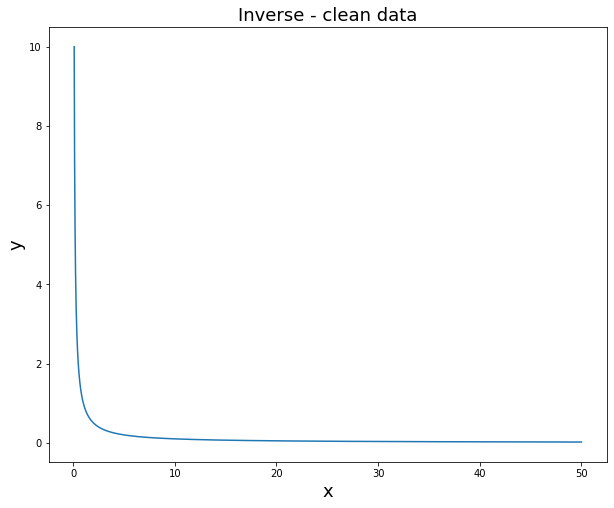

In [14]:
plt.figure(figsize=(10,8))
plt.title('Inverse - clean data', fontsize=18)
plt.xlabel('x', fontsize=18)
plt.ylabel('y', fontsize=18)
plt.plot(x, y)
plt.show()

In [8]:
x_test = np.linspace(51, 65, num=100)
y_test = 1/x_test

In [16]:
#Adding noise to train and test data
std_dev = np.std(x)
noise = np.random.normal(loc=0, scale=std_dev/10, size=len(x))
x = x + noise
out = 1/x
y = out
noise = np.random.normal(loc=0, scale=std_dev/10, size=len(x_test))
x_test = x_test + noise
y_test = 1/x_test

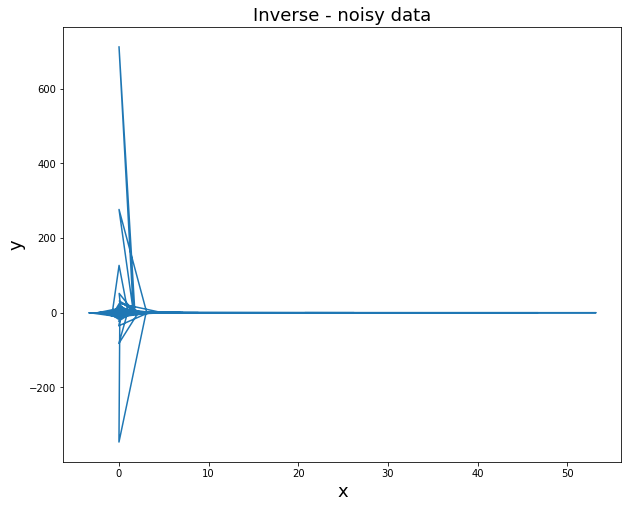

In [20]:
plt.figure(figsize=(10,8))
plt.title('Inverse - noisy data', fontsize=18)
plt.xlabel('x', fontsize=18)
plt.ylabel('y', fontsize=18)
plt.plot(x, y)
plt.show()

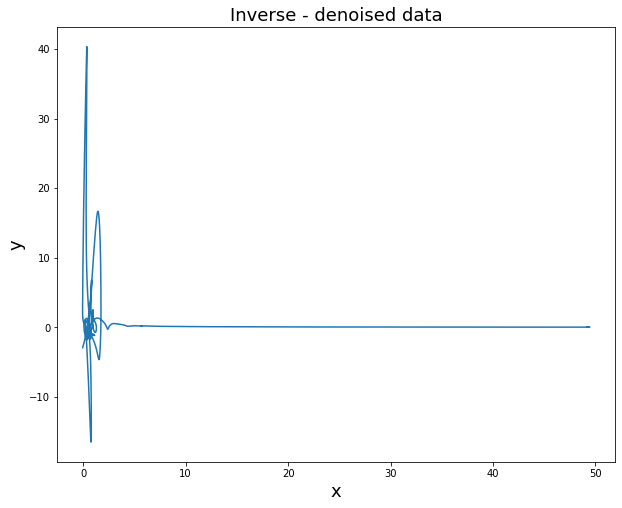

In [22]:
import statsmodels.api as sm
_, x_denoised = sm.tsa.filters.hpfilter(x, 1600)
_, y_denoised = sm.tsa.filters.hpfilter(y, 1600)
plt.figure(figsize=(10,8))
plt.title('Inverse - denoised data', fontsize=18)
plt.xlabel('x', fontsize=18)
plt.ylabel('y', fontsize=18)
plt.plot(x_denoised, y_denoised)
plt.show()

In [23]:
x = x_denoised
y = y_denoised

In [9]:
for hypset in superset:
    print("For the hypothesis set:", str(hypset))
    my_eql_model = EQLDIV(inputSize=1, outputSize=1, numLayers=2, hypothesisSet=hypset)
    my_eql_model.build(learningRate=0.001, method=Adam, loss='mse')
    my_eql_model.fit(x, y, numEpoch=3000, batchSize=20, regStrength=10**-3, verbose=1)
    print(my_eql_model.getEquation())
    print("Final RMSE on training data = ", my_eql_model.evaluate(x,y))
    print("Final RMSE on test data = ", my_eql_model.evaluate(x_test,y_test))
    print("\n\n\n")

W0604 15:16:07.787808 20740 deprecation.py:506] From c:\users\vasistha singhal\appdata\local\programs\python\python37\lib\site-packages\tensorflow\python\keras\initializers.py:143: calling RandomNormal.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


For the hypothesis set: [[<function add_dispatch_support.<locals>.wrapper at 0x00000231663409D8>], [Lambda(_x, _x)]]


W0604 15:16:08.319397 20740 deprecation.py:323] From c:\users\vasistha singhal\appdata\local\programs\python\python37\lib\site-packages\tensorflow\python\ops\math_grad.py:1250: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Epoch 1/750
2500/2500 [==============================] - 0s 100us/sample - loss: 452.6233 - rmse: 1.3356
Epoch 2/750
2500/2500 [==============================] - 0s 45us/sample - loss: 51.5932 - rmse: 1.5006
Epoch 3/750
2500/2500 [==============================] - 0s 36us/sample - loss: 2.3090 - rmse: 1.3545
Epoch 4/750
2500/2500 [==============================] - 0s 36us/sample - loss: 2.0355 - rmse: 1.2832
Epoch 5/750
2500/2500 [==============================] - 0s 37us/sample - loss: 1.7014 - rmse: 1.1269
Epoch 6/750
2500/2500 [==============================] - 0s 38us/sample - loss: 1.3399 - rmse: 0.9890
Epoch 7/750
2500/2500 [==============================] - 0s 37us/sample - loss: 1.1727 - rmse: 0.8817
Epoch 8/750
2500/2500 [==============================] - 0s 38us/sample - loss: 1.1180 - rmse: 0.8198
Epoch 9/750
2500/2500 [==============================] - 0s 37us/sample - loss: 1.1553 - rmse: 0.7676
Epoch 10/750
2500/2500 [==============================] - 0s 37us/sample - los

2500/2500 [==============================] - 0s 37us/sample - loss: 2.7851e-11 - rmse: 2.7574e-06
Epoch 148/750
2500/2500 [==============================] - 0s 37us/sample - loss: 2.4458e-09 - rmse: 2.3502e-05
Epoch 149/750
2500/2500 [==============================] - ETA: 0s - loss: 2.5953e-10 - rmse: 1.6110e- - ETA: 0s - loss: 2.7420e-08 - rmse: 1.0994e- - 0s 37us/sample - loss: 3.8848e-08 - rmse: 1.2239e-04
Epoch 150/750
2500/2500 [==============================] - ETA: 0s - loss: 5.9581e-09 - rmse: 5.7063e- - 0s 36us/sample - loss: 3.4853e-09 - rmse: 3.6923e-05
Epoch 151/750
2500/2500 [==============================] - 0s 37us/sample - loss: 3.7392e-08 - rmse: 1.1098e-04
Epoch 152/750
2500/2500 [==============================] - 0s 37us/sample - loss: 6.6512e-04 - rmse: 0.0116
Epoch 153/750
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0012 - rmse: 0.0185
Epoch 154/750
2500/2500 [==============================] - 0s 39us/sample - loss: 1.1691e-06 - rmse: 7.2

2500/2500 [==============================] - 0s 38us/sample - loss: 2.0838e-05 - rmse: 0.0025
Epoch 286/750
2500/2500 [==============================] - 0s 37us/sample - loss: 5.5825e-04 - rmse: 0.0150
Epoch 287/750
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0022 - rmse: 0.0301
Epoch 288/750
2500/2500 [==============================] - 0s 37us/sample - loss: 1.3466e-05 - rmse: 0.0028
Epoch 289/750
2500/2500 [==============================] - 0s 37us/sample - loss: 2.8417e-07 - rmse: 3.9376e-04s - loss: 4.8998e-07 - rmse: 5.9284e-
Epoch 290/750
2500/2500 [==============================] - 0s 36us/sample - loss: 3.0698e-09 - rmse: 4.5036e-05
Epoch 291/750
2500/2500 [==============================] - 0s 37us/sample - loss: 7.6733e-11 - rmse: 6.7924e-06
Epoch 292/750
2500/2500 [==============================] - 0s 37us/sample - loss: 3.6605e-12 - rmse: 1.4258e-06
Epoch 293/750
2500/2500 [==============================] - 0s 37us/sample - loss: 3.6285e-12 - rmse: 

2500/2500 [==============================] - 0s 37us/sample - loss: 3.7247e-05 - rmse: 0.0033
Epoch 428/750
2500/2500 [==============================] - 0s 37us/sample - loss: 6.3237e-04 - rmse: 0.0130
Epoch 429/750
2500/2500 [==============================] - 0s 37us/sample - loss: 4.9033e-05 - rmse: 0.0031
Epoch 430/750
2500/2500 [==============================] - 0s 38us/sample - loss: 1.2530e-05 - rmse: 0.0020
Epoch 431/750
2500/2500 [==============================] - 0s 37us/sample - loss: 1.4322e-05 - rmse: 0.0015
Epoch 432/750
2500/2500 [==============================] - 0s 38us/sample - loss: 5.4865e-07 - rmse: 4.6519e-04
Epoch 433/750
2500/2500 [==============================] - 0s 38us/sample - loss: 1.7666e-06 - rmse: 9.1584e-04
Epoch 434/750
2500/2500 [==============================] - 0s 38us/sample - loss: 4.3412e-07 - rmse: 3.9120e-04
Epoch 435/750
2500/2500 [==============================] - 0s 37us/sample - loss: 1.7751e-09 - rmse: 2.6212e-05
Epoch 436/750
2500/2500 [=

2500/2500 [==============================] - 0s 36us/sample - loss: 1.0397e-08 - rmse: 4.1979e-05
Epoch 571/750
2500/2500 [==============================] - 0s 37us/sample - loss: 2.9013e-08 - rmse: 1.1835e-04
Epoch 572/750
2500/2500 [==============================] - 0s 36us/sample - loss: 1.3852e-05 - rmse: 0.0024
Epoch 573/750
2500/2500 [==============================] - 0s 36us/sample - loss: 6.4641e-06 - rmse: 0.0015
Epoch 574/750
2500/2500 [==============================] - 0s 36us/sample - loss: 7.1029e-07 - rmse: 5.7558e-04
Epoch 575/750
2500/2500 [==============================] - 0s 36us/sample - loss: 1.1738e-05 - rmse: 0.0021
Epoch 576/750
2500/2500 [==============================] - 0s 36us/sample - loss: 1.7683e-06 - rmse: 8.4329e-04
Epoch 577/750
2500/2500 [==============================] - ETA: 0s - loss: 1.6877e-05 - rmse: 0.00 - 0s 37us/sample - loss: 1.9792e-05 - rmse: 0.0032
Epoch 578/750
2500/2500 [==============================] - 0s 37us/sample - loss: 6.7357e-04

2500/2500 [==============================] - 0s 37us/sample - loss: 3.5574e-05 - rmse: 0.0040
Epoch 716/750
2500/2500 [==============================] - 0s 37us/sample - loss: 6.2770e-04 - rmse: 0.0136
Epoch 717/750
2500/2500 [==============================] - 0s 37us/sample - loss: 1.1616e-06 - rmse: 6.7207e-04
Epoch 718/750
2500/2500 [==============================] - 0s 36us/sample - loss: 5.7777e-08 - rmse: 1.5626e-04
Epoch 719/750
2500/2500 [==============================] - 0s 36us/sample - loss: 6.5767e-10 - rmse: 2.1484e-05
Epoch 720/750
2500/2500 [==============================] - 0s 37us/sample - loss: 3.7039e-09 - rmse: 3.6587e-05
Epoch 721/750
2500/2500 [==============================] - 0s 37us/sample - loss: 4.0830e-06 - rmse: 0.0011
Epoch 722/750
2500/2500 [==============================] - 0s 36us/sample - loss: 1.1330e-05 - rmse: 0.0022
Epoch 723/750
2500/2500 [==============================] - 0s 37us/sample - loss: 4.9452e-06 - rmse: 0.0013
Epoch 724/750
2500/2500 [=

2500/2500 [==============================] - 0s 36us/sample - loss: 0.0029 - rmse: 0.0140
Epoch 112/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0024 - rmse: 0.0011
Epoch 113/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0024 - rmse: 4.4452e-04
Epoch 114/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0024 - rmse: 3.8976e-04
Epoch 115/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0024 - rmse: 5.5801e-04
Epoch 116/2100
2500/2500 [==============================] - ETA: 0s - loss: 0.0024 - rmse: 8.2580e- - 0s 37us/sample - loss: 0.0024 - rmse: 7.1607e-04
Epoch 117/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0024 - rmse: 4.9348e-04
Epoch 118/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0024 - rmse: 3.5834e-04
Epoch 119/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0028 - rmse: 0.0095
Epoc

2500/2500 [==============================] - 0s 37us/sample - loss: 0.0019 - rmse: 0.0035
Epoch 259/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0121 - rmse: 0.0465
Epoch 260/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0107 - rmse: 0.0540
Epoch 261/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0022 - rmse: 0.0116
Epoch 262/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0019 - rmse: 7.8107e-04
Epoch 263/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0019 - rmse: 2.2378e-04
Epoch 264/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0019 - rmse: 1.6970e-04
Epoch 265/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0019 - rmse: 2.6702e-04
Epoch 266/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0019 - rmse: 1.6323e-04
Epoch 267/2100
2500/2500 [========================

2500/2500 [==============================] - ETA: 0s - loss: 0.0018 - rmse: 0.00 - 0s 37us/sample - loss: 0.0017 - rmse: 0.0049
Epoch 409/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0017 - rmse: 2.3042e-04
Epoch 410/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0018 - rmse: 0.0075
Epoch 411/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0169 - rmse: 0.0794
Epoch 412/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0021 - rmse: 0.0162
Epoch 413/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0017 - rmse: 0.0042
Epoch 414/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0017 - rmse: 3.6748e-04
Epoch 415/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0017 - rmse: 1.9079e-04
Epoch 416/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0017 - rmse: 1.4409e-04
Epoch 417/2100
2

2500/2500 [==============================] - 0s 37us/sample - loss: 0.0049 - rmse: 0.0352
Epoch 484/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0028 - rmse: 0.0233s - loss: 0.0027 - rmse: 0.02
Epoch 485/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0018 - rmse: 0.0072
Epoch 486/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0016 - rmse: 7.5437e-04
Epoch 487/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0016 - rmse: 1.5655e-04
Epoch 488/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0016 - rmse: 1.7621e-04
Epoch 489/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0016 - rmse: 4.5429e-04
Epoch 490/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0016 - rmse: 2.0127e-04
Epoch 491/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0016 - rmse: 1.0720e-04
Epoch 492/2100
25

2500/2500 [==============================] - 0s 34us/sample - loss: 0.0015 - rmse: 3.2965e-04
Epoch 634/2100
2500/2500 [==============================] - 0s 34us/sample - loss: 0.0015 - rmse: 2.4855e-04
Epoch 635/2100
2500/2500 [==============================] - 0s 34us/sample - loss: 0.0015 - rmse: 2.1897e-04
Epoch 636/2100
2500/2500 [==============================] - 0s 34us/sample - loss: 0.0015 - rmse: 3.1410e-04
Epoch 637/2100
2500/2500 [==============================] - 0s 34us/sample - loss: 0.0015 - rmse: 4.8517e-04
Epoch 638/2100
2500/2500 [==============================] - 0s 34us/sample - loss: 0.0015 - rmse: 9.1500e-04
Epoch 639/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0015 - rmse: 3.3217e-04
Epoch 640/2100
2500/2500 [==============================] - 0s 34us/sample - loss: 0.0015 - rmse: 1.5456e-04
Epoch 641/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0015 - rmse: 1.2473e-04
Epoch 642/2100
2500/2500 [========

2500/2500 [==============================] - 0s 36us/sample - loss: 0.0014 - rmse: 9.1554e-04
Epoch 785/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0112 - rmse: 0.0605
Epoch 786/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0043 - rmse: 0.0363
Epoch 787/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0027 - rmse: 0.0206
Epoch 788/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0015 - rmse: 0.0012
Epoch 789/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0015 - rmse: 1.6849e-04
Epoch 790/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0015 - rmse: 1.5281e-04
Epoch 791/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0015 - rmse: 2.7987e-04
Epoch 792/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0015 - rmse: 2.1794e-04
Epoch 793/2100
2500/2500 [========================

2500/2500 [==============================] - 0s 35us/sample - loss: 0.0014 - rmse: 3.5559e-04
Epoch 935/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0024 - rmse: 0.0132
Epoch 936/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0083 - rmse: 0.0440
Epoch 937/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0015 - rmse: 0.0044
Epoch 938/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0014 - rmse: 0.0013
Epoch 939/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0014 - rmse: 2.7235e-04
Epoch 940/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0014 - rmse: 1.5501e-04
Epoch 941/2100
2500/2500 [==============================] - 0s 34us/sample - loss: 0.0014 - rmse: 2.0473e-04
Epoch 942/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0014 - rmse: 2.6821e-04
Epoch 943/2100
2500/2500 [========================

2500/2500 [==============================] - 0s 39us/sample - loss: 0.0015 - rmse: 1.8935e-04
Epoch 1010/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0015 - rmse: 3.8964e-04
Epoch 1011/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0015 - rmse: 6.4563e-04
Epoch 1012/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 3.1071e-04
Epoch 1013/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 4.6590e-04
Epoch 1014/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 2.8829e-04
Epoch 1015/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 1.4592e-04
Epoch 1016/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0015 - rmse: 0.0031
Epoch 1017/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0181 - rmse: 0.0577
Epoch 1018/2100
2500/2500 [=======

2500/2500 [==============================] - 0s 37us/sample - loss: 0.0014 - rmse: 8.5030e-04
Epoch 1158/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 0.0014
Epoch 1159/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0015 - rmse: 0.0054
Epoch 1160/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0014 - rmse: 5.2219e-04
Epoch 1161/2100
2500/2500 [==============================] - ETA: 0s - loss: 0.0014 - rmse: 0.0020   - 0s 38us/sample - loss: 0.0014 - rmse: 0.0022
Epoch 1162/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 0.0017
Epoch 1163/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0015 - rmse: 0.0048
Epoch 1164/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0016 - rmse: 0.0081
Epoch 1165/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0019 - rmse: 0.0148
Epoch 1166/2

2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 1.1643e-04
Epoch 1307/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0014 - rmse: 1.2456e-04
Epoch 1308/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 1.3002e-04
Epoch 1309/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 1.4595e-04
Epoch 1310/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 1.9998e-04
Epoch 1311/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0014 - rmse: 1.5350e-04
Epoch 1312/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 1.4595e-04
Epoch 1313/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 2.0601e-04
Epoch 1314/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0014 - rmse: 1.4606e-04
Epoch 1315/2100
2500/2500 

2500/2500 [==============================] - 0s 35us/sample - loss: 0.0014 - rmse: 0.0036
Epoch 1456/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0015 - rmse: 0.0056
Epoch 1457/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0017 - rmse: 0.0133
Epoch 1458/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0078 - rmse: 0.0466
Epoch 1459/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0014 - rmse: 0.0025
Epoch 1460/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0014 - rmse: 6.6117e-04
Epoch 1461/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0014 - rmse: 0.0011
Epoch 1462/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0014 - rmse: 2.0109e-04
Epoch 1463/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0014 - rmse: 1.4777e-04
Epoch 1464/2100
2500/2500 [=======================

2500/2500 [==============================] - 0s 35us/sample - loss: 0.0014 - rmse: 1.4211e-04
Epoch 1531/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0014 - rmse: 2.1434e-04
Epoch 1532/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0014 - rmse: 1.9166e-04
Epoch 1533/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0014 - rmse: 0.0047
Epoch 1534/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0014 - rmse: 0.0027
Epoch 1535/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0016 - rmse: 0.0070
Epoch 1536/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0101 - rmse: 0.0649
Epoch 1537/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0020 - rmse: 0.0134
Epoch 1538/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0014 - rmse: 0.0014
Epoch 1539/2100
2500/2500 [=======================

2500/2500 [==============================] - 0s 38us/sample - loss: 0.0015 - rmse: 0.0070
Epoch 1681/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 0.0015
Epoch 1682/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 1.9165e-04
Epoch 1683/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 1.0758e-04
Epoch 1684/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0014 - rmse: 3.4044e-04
Epoch 1685/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 1.1520e-04
Epoch 1686/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 1.7274e-04
Epoch 1687/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 4.0657e-04
Epoch 1688/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 0.0028
Epoch 1689/2100
2500/2500 [===========

2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 0.0010
Epoch 1831/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0014 - rmse: 1.6891e-04
Epoch 1832/2100
2500/2500 [==============================] - 0s 41us/sample - loss: 0.0014 - rmse: 1.2715e-04
Epoch 1833/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 1.0888e-04
Epoch 1834/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 1.2212e-04
Epoch 1835/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 1.0822e-04
Epoch 1836/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 1.2012e-04
Epoch 1837/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0014 - rmse: 1.1313e-04s - loss: 0.0014 - rmse: 1.1077e-
Epoch 1838/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 1.1375e-

2500/2500 [==============================] - 0s 36us/sample - loss: 0.0405 - rmse: 0.1215
Epoch 1979/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0025 - rmse: 0.0273
Epoch 1980/2100
2500/2500 [==============================] - 0s 34us/sample - loss: 0.0015 - rmse: 0.0063
Epoch 1981/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0014 - rmse: 0.0024
Epoch 1982/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0014 - rmse: 4.8677e-04
Epoch 1983/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0014 - rmse: 1.2409e-04
Epoch 1984/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0014 - rmse: 1.0162e-04
Epoch 1985/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0014 - rmse: 1.0290e-04
Epoch 1986/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0014 - rmse: 1.0909e-04
Epoch 1987/2100
2500/2500 [===============

2500/2500 [==============================] - 0s 36us/sample - loss: 8.4068e-15 - rmse: 7.0317e-08
Epoch 28/150
2500/2500 [==============================] - 0s 37us/sample - loss: 8.4068e-15 - rmse: 7.2552e-08
Epoch 29/150
2500/2500 [==============================] - 0s 38us/sample - loss: 1.0234e-14 - rmse: 8.0414e-08
Epoch 30/150
2500/2500 [==============================] - 0s 37us/sample - loss: 1.1518e-14 - rmse: 8.3400e-08
Epoch 31/150
2500/2500 [==============================] - 0s 36us/sample - loss: 1.9310e-14 - rmse: 1.0250e-07
Epoch 32/150
2500/2500 [==============================] - 0s 37us/sample - loss: 7.2883e-15 - rmse: 6.6967e-08
Epoch 33/150
2500/2500 [==============================] - 0s 37us/sample - loss: 7.2883e-15 - rmse: 6.7021e-08
Epoch 34/150
2500/2500 [==============================] - 0s 36us/sample - loss: 7.2883e-15 - rmse: 6.7642e-08
Epoch 35/150
2500/2500 [==============================] - 0s 39us/sample - loss: 7.2883e-15 - rmse: 6.7003e-08
Epoch 36/150
2

2500/2500 [==============================] - 0s 37us/sample - loss: 7663619948.3120 - rmse: 1.6206
Epoch 22/750
2500/2500 [==============================] - 0s 37us/sample - loss: 6950075969.0120 - rmse: 2.9673
Epoch 23/750
2500/2500 [==============================] - 0s 37us/sample - loss: 6321853958.0600 - rmse: 1.7333
Epoch 24/750
2500/2500 [==============================] - 0s 37us/sample - loss: 5765136063.9680 - rmse: 2.0717
Epoch 25/750
2500/2500 [==============================] - 0s 36us/sample - loss: 5267577397.0320 - rmse: 1.5928
Epoch 26/750
2500/2500 [==============================] - 0s 36us/sample - loss: 4822199879.6800 - rmse: 7.6865
Epoch 27/750
2500/2500 [==============================] - 0s 34us/sample - loss: 4425235813.1360 - rmse: 1.4593
Epoch 28/750
2500/2500 [==============================] - 0s 37us/sample - loss: 4066529606.7830 - rmse: 1.4936
Epoch 29/750
2500/2500 [==============================] - 0s 37us/sample - loss: 3743052887.5600 - rmse: 1.4958
Epoch

2500/2500 [==============================] - 0s 36us/sample - loss: 181354.4313 - rmse: 1.4775
Epoch 169/750
2500/2500 [==============================] - 0s 37us/sample - loss: 181261.6382 - rmse: 1.4825
Epoch 170/750
2500/2500 [==============================] - 0s 37us/sample - loss: 181166.3393 - rmse: 1.4826
Epoch 171/750
2500/2500 [==============================] - 0s 36us/sample - loss: 181066.2864 - rmse: 1.4777
Epoch 172/750
2500/2500 [==============================] - 0s 37us/sample - loss: 180963.6582 - rmse: 1.4587
Epoch 173/750
2500/2500 [==============================] - 0s 37us/sample - loss: 180852.6507 - rmse: 1.4674
Epoch 174/750
2500/2500 [==============================] - 0s 37us/sample - loss: 180739.8604 - rmse: 1.4666
Epoch 175/750
2500/2500 [==============================] - 0s 37us/sample - loss: 180621.2029 - rmse: 1.4619
Epoch 176/750
2500/2500 [==============================] - 0s 36us/sample - loss: 180492.9687 - rmse: 1.4448
Epoch 177/750
2500/2500 [========

2500/2500 [==============================] - 0s 37us/sample - loss: 2.5538 - rmse: 1.4851
Epoch 323/750
2500/2500 [==============================] - 0s 35us/sample - loss: 2.5478 - rmse: 1.4903
Epoch 324/750
2500/2500 [==============================] - 0s 36us/sample - loss: 2.5414 - rmse: 1.4876
Epoch 325/750
2500/2500 [==============================] - 0s 38us/sample - loss: 2.5348 - rmse: 1.4727
Epoch 326/750
2500/2500 [==============================] - 0s 37us/sample - loss: 2.5279 - rmse: 1.4896
Epoch 327/750
2500/2500 [==============================] - 0s 36us/sample - loss: 2.5207 - rmse: 1.4827
Epoch 328/750
2500/2500 [==============================] - 0s 36us/sample - loss: 2.5133 - rmse: 1.4666
Epoch 329/750
2500/2500 [==============================] - 0s 37us/sample - loss: 2.5055 - rmse: 1.4727
Epoch 330/750
2500/2500 [==============================] - 0s 35us/sample - loss: 2.4975 - rmse: 1.4724
Epoch 331/750
2500/2500 [==============================] - 0s 38us/sample - lo

2500/2500 [==============================] - 0s 37us/sample - loss: 0.4013 - rmse: 0.4923
Epoch 479/750
2500/2500 [==============================] - 0s 37us/sample - loss: 0.3908 - rmse: 0.4818
Epoch 480/750
2500/2500 [==============================] - 0s 37us/sample - loss: 0.3808 - rmse: 0.4922
Epoch 481/750
2500/2500 [==============================] - 0s 37us/sample - loss: 0.3712 - rmse: 0.4718
Epoch 482/750
2500/2500 [==============================] - 0s 37us/sample - loss: 0.3614 - rmse: 0.4645
Epoch 483/750
2500/2500 [==============================] - 0s 36us/sample - loss: 0.3524 - rmse: 0.4620
Epoch 484/750
2500/2500 [==============================] - 0s 38us/sample - loss: 0.3441 - rmse: 0.4639
Epoch 485/750
2500/2500 [==============================] - 0s 37us/sample - loss: 0.3357 - rmse: 0.4627
Epoch 486/750
2500/2500 [==============================] - 0s 36us/sample - loss: 0.3281 - rmse: 0.4554
Epoch 487/750
2500/2500 [==============================] - 0s 36us/sample - lo

2500/2500 [==============================] - 0s 36us/sample - loss: 7.0156e-05 - rmse: 0.0048
Epoch 632/750
2500/2500 [==============================] - 0s 37us/sample - loss: 1.4318e-04 - rmse: 0.0088
Epoch 633/750
2500/2500 [==============================] - 0s 37us/sample - loss: 2.5485e-06 - rmse: 9.4334e-04
Epoch 634/750
2500/2500 [==============================] - 0s 37us/sample - loss: 4.4227e-08 - rmse: 1.9105e-04
Epoch 635/750
2500/2500 [==============================] - 0s 36us/sample - loss: 3.1960e-08 - rmse: 1.6062e-04
Epoch 636/750
2500/2500 [==============================] - 0s 36us/sample - loss: 2.9803e-08 - rmse: 1.5910e-04
Epoch 637/750
2500/2500 [==============================] - 0s 37us/sample - loss: 2.4076e-07 - rmse: 3.3205e-04
Epoch 638/750
2500/2500 [==============================] - 0s 38us/sample - loss: 9.0686e-08 - rmse: 2.4219e-04
Epoch 639/750
2500/2500 [==============================] - 0s 36us/sample - loss: 1.1508e-07 - rmse: 2.6110e-04
Epoch 640/750


2500/2500 [==============================] - 0s 36us/sample - loss: 0.0335 - rmse: 0.0220
Epoch 29/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0334 - rmse: 0.0231
Epoch 30/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0332 - rmse: 0.0228
Epoch 31/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0331 - rmse: 0.0231
Epoch 32/2100
2500/2500 [==============================] - 0s 33us/sample - loss: 0.0331 - rmse: 0.0256
Epoch 33/2100
2500/2500 [==============================] - 0s 34us/sample - loss: 0.0329 - rmse: 0.0246
Epoch 34/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0327 - rmse: 0.0237
Epoch 35/2100
2500/2500 [==============================] - 0s 34us/sample - loss: 0.0327 - rmse: 0.0249
Epoch 36/2100
2500/2500 [==============================] - 0s 34us/sample - loss: 0.0325 - rmse: 0.0248
Epoch 37/2100
2500/2500 [==============================] - 0s 34us/sample - lo

2500/2500 [==============================] - 0s 36us/sample - loss: 0.0225 - rmse: 0.0388
Epoch 184/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0224 - rmse: 0.0371
Epoch 185/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0223 - rmse: 0.0364
Epoch 186/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0223 - rmse: 0.0360
Epoch 187/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0222 - rmse: 0.0356
Epoch 188/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0221 - rmse: 0.0346
Epoch 189/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0220 - rmse: 0.0338
Epoch 190/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0219 - rmse: 0.0343
Epoch 191/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0219 - rmse: 0.0340
Epoch 192/2100
2500/2500 [==============================] - 0s 37us/sa

2500/2500 [==============================] - 0s 37us/sample - loss: 0.0141 - rmse: 1.7049e-04
Epoch 336/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0143 - rmse: 0.0084
Epoch 337/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0157 - rmse: 0.0200
Epoch 338/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0150 - rmse: 0.0175
Epoch 339/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0140 - rmse: 0.0011
Epoch 340/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0140 - rmse: 1.3321e-04
Epoch 341/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0140 - rmse: 6.7514e-05
Epoch 342/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0140 - rmse: 7.7236e-05
Epoch 343/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0139 - rmse: 7.8045e-05
Epoch 344/2100
2500/2500 [========================

2500/2500 [==============================] - 0s 36us/sample - loss: 0.0124 - rmse: 6.9394e-05
Epoch 412/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0124 - rmse: 6.1078e-05
Epoch 413/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0123 - rmse: 8.2115e-05
Epoch 414/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0123 - rmse: 7.5349e-05
Epoch 415/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0123 - rmse: 1.8021e-04
Epoch 416/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0123 - rmse: 9.7658e-05
Epoch 417/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0122 - rmse: 1.3149e-04
Epoch 418/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0122 - rmse: 0.0011
Epoch 419/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0122 - rmse: 4.8694e-04
Epoch 420/2100
2500/2500 [============

2500/2500 [==============================] - 0s 38us/sample - loss: 0.0103 - rmse: 5.9789e-05s - loss: 0.0103 - rmse: 5.1132e-
Epoch 563/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0103 - rmse: 6.4002e-05
Epoch 564/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0103 - rmse: 9.1250e-05
Epoch 565/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0103 - rmse: 6.0876e-05
Epoch 566/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0103 - rmse: 5.9607e-05
Epoch 567/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0103 - rmse: 6.7410e-05
Epoch 568/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0103 - rmse: 7.1638e-05
Epoch 569/2100
2500/2500 [==============================] - ETA: 0s - loss: 0.0103 - rmse: 7.7141e- - 0s 35us/sample - loss: 0.0103 - rmse: 1.3434e-04
Epoch 570/2100
2500/2500 [==============================] - 0s 37us/

2500/2500 [==============================] - 0s 36us/sample - loss: 0.0093 - rmse: 0.0021
Epoch 712/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0095 - rmse: 0.0082
Epoch 713/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0212 - rmse: 0.0627
Epoch 714/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0094 - rmse: 0.0010
Epoch 715/2100
2500/2500 [==============================] - ETA: 0s - loss: 0.0093 - rmse: 4.3977e- - 0s 37us/sample - loss: 0.0093 - rmse: 4.2264e-04
Epoch 716/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0093 - rmse: 4.8296e-04
Epoch 717/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0093 - rmse: 3.9861e-04
Epoch 718/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0093 - rmse: 3.5570e-04
Epoch 719/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0092 - rmse: 5.4016e-04
Epoch 72

2500/2500 [==============================] - 0s 36us/sample - loss: 0.0090 - rmse: 3.5793e-04
Epoch 787/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0089 - rmse: 3.0270e-04
Epoch 788/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0089 - rmse: 2.6537e-04
Epoch 789/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0089 - rmse: 1.6397e-04
Epoch 790/2100
2500/2500 [==============================] - 0s 34us/sample - loss: 0.0089 - rmse: 1.0823e-04
Epoch 791/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0089 - rmse: 8.1003e-05
Epoch 792/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0089 - rmse: 6.6909e-05
Epoch 793/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0089 - rmse: 4.9450e-05
Epoch 794/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0089 - rmse: 7.3507e-05
Epoch 795/2100
2500/2500 [========

2500/2500 [==============================] - 0s 37us/sample - loss: 0.0084 - rmse: 4.4298e-05
Epoch 939/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0084 - rmse: 0.0023
Epoch 940/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0187 - rmse: 0.0428
Epoch 941/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0108 - rmse: 0.0202
Epoch 942/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0085 - rmse: 0.0017
Epoch 943/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0085 - rmse: 0.0012
Epoch 944/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0084 - rmse: 9.5815e-04
Epoch 945/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0084 - rmse: 0.0012
Epoch 946/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0084 - rmse: 9.9250e-04
Epoch 947/2100
2500/2500 [==============================] 

2500/2500 [==============================] - 0s 35us/sample - loss: 0.0084 - rmse: 0.0116
Epoch 1090/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0145 - rmse: 0.0309
Epoch 1091/2100
2500/2500 [==============================] - 0s 34us/sample - loss: 0.0138 - rmse: 0.0354
Epoch 1092/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0083 - rmse: 0.0033
Epoch 1093/2100
2500/2500 [==============================] - 0s 34us/sample - loss: 0.0082 - rmse: 0.0020
Epoch 1094/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0082 - rmse: 0.0010
Epoch 1095/2100
2500/2500 [==============================] - 0s 33us/sample - loss: 0.0082 - rmse: 9.9411e-04
Epoch 1096/2100
2500/2500 [==============================] - 0s 33us/sample - loss: 0.0082 - rmse: 9.7769e-04
Epoch 1097/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0082 - rmse: 3.3710e-04
Epoch 1098/2100
2500/2500 [=======================

2500/2500 [==============================] - 0s 36us/sample - loss: 0.0111 - rmse: 0.0314
Epoch 1240/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0132 - rmse: 0.0372
Epoch 1241/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0080 - rmse: 0.0026
Epoch 1242/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0079 - rmse: 0.0017
Epoch 1243/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0079 - rmse: 0.0012
Epoch 1244/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0079 - rmse: 8.9410e-04
Epoch 1245/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0079 - rmse: 7.1644e-04
Epoch 1246/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0079 - rmse: 0.0010
Epoch 1247/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0079 - rmse: 0.0013
Epoch 1248/2100
2500/2500 [===========================

2500/2500 [==============================] - 0s 37us/sample - loss: 0.0079 - rmse: 0.0051
Epoch 1316/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0107 - rmse: 0.0304
Epoch 1317/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0080 - rmse: 0.0090
Epoch 1318/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0084 - rmse: 0.0115
Epoch 1319/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0078 - rmse: 0.0021
Epoch 1320/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0078 - rmse: 9.1636e-04
Epoch 1321/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0081 - rmse: 0.0083
Epoch 1322/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0086 - rmse: 0.0129
Epoch 1323/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0112 - rmse: 0.0266
Epoch 1324/2100
2500/2500 [==============================]

Epoch 1391/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0078 - rmse: 0.0014
Epoch 1392/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0079 - rmse: 0.0032
Epoch 1393/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0078 - rmse: 0.0017
Epoch 1394/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0078 - rmse: 8.5416e-04
Epoch 1395/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0078 - rmse: 7.6864e-04
Epoch 1396/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0078 - rmse: 8.3636e-04
Epoch 1397/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0078 - rmse: 7.6459e-04
Epoch 1398/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0082 - rmse: 0.0099
Epoch 1399/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0268 - rmse: 0.0837
Epoch 1400/2100
2500/2500 [===

2500/2500 [==============================] - 0s 36us/sample - loss: 0.0077 - rmse: 0.0050
Epoch 1543/2100
2500/2500 [==============================] - ETA: 0s - loss: 0.0096 - rmse: 0.02 - 0s 35us/sample - loss: 0.0107 - rmse: 0.0342
Epoch 1544/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0082 - rmse: 0.0147
Epoch 1545/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0083 - rmse: 0.0168
Epoch 1546/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0079 - rmse: 0.0101
Epoch 1547/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0078 - rmse: 0.0080
Epoch 1548/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0076 - rmse: 0.0018
Epoch 1549/2100
2500/2500 [==============================] - 0s 34us/sample - loss: 0.0091 - rmse: 0.0224
Epoch 1550/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0084 - rmse: 0.0188
Epoch 1551/2100
2500/250

2500/2500 [==============================] - 0s 35us/sample - loss: 0.0081 - rmse: 0.0015
Epoch 1694/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0081 - rmse: 0.0014
Epoch 1695/2100
2500/2500 [==============================] - 0s 34us/sample - loss: 0.0081 - rmse: 0.0014
Epoch 1696/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0081 - rmse: 0.0013
Epoch 1697/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0081 - rmse: 0.0012
Epoch 1698/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0081 - rmse: 0.0012
Epoch 1699/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0081 - rmse: 0.0011
Epoch 1700/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0080 - rmse: 0.0012
Epoch 1701/2100
2500/2500 [==============================] - 0s 34us/sample - loss: 0.0080 - rmse: 0.0012
Epoch 1702/2100
2500/2500 [==============================] - 0

2500/2500 [==============================] - 0s 36us/sample - loss: 0.0075 - rmse: 0.0018
Epoch 1845/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0075 - rmse: 0.0012
Epoch 1846/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0075 - rmse: 5.8635e-04
Epoch 1847/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0074 - rmse: 5.1761e-04
Epoch 1848/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0074 - rmse: 2.2123e-04
Epoch 1849/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0074 - rmse: 2.7426e-04
Epoch 1850/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0074 - rmse: 5.7016e-04
Epoch 1851/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0075 - rmse: 0.0026
Epoch 1852/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0081 - rmse: 0.0151
Epoch 1853/2100
2500/2500 [===============

2500/2500 [==============================] - 0s 34us/sample - loss: 0.0097 - rmse: 0.0209
Epoch 1997/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0074 - rmse: 0.0017
Epoch 1998/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0074 - rmse: 0.0023
Epoch 1999/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0081 - rmse: 0.0146
Epoch 2000/2100
2500/2500 [==============================] - 0s 34us/sample - loss: 0.0725 - rmse: 0.1562
Epoch 2001/2100
2500/2500 [==============================] - 0s 34us/sample - loss: 0.0088 - rmse: 0.0245
Epoch 2002/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0077 - rmse: 0.0044
Epoch 2003/2100
2500/2500 [==============================] - 0s 34us/sample - loss: 0.0076 - rmse: 0.0029
Epoch 2004/2100
2500/2500 [==============================] - 0s 34us/sample - loss: 0.0076 - rmse: 0.0027
Epoch 2005/2100
2500/2500 [==============================] - 0

Epoch 2073/2100
2500/2500 [==============================] - 0s 34us/sample - loss: 0.0469 - rmse: 0.1141
Epoch 2074/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0077 - rmse: 0.0071
Epoch 2075/2100
2500/2500 [==============================] - 0s 34us/sample - loss: 0.0076 - rmse: 0.0015
Epoch 2076/2100
2500/2500 [==============================] - 0s 33us/sample - loss: 0.0075 - rmse: 0.0014
Epoch 2077/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0075 - rmse: 0.0014
Epoch 2078/2100
2500/2500 [==============================] - 0s 34us/sample - loss: 0.0075 - rmse: 0.0013
Epoch 2079/2100
2500/2500 [==============================] - 0s 34us/sample - loss: 0.0075 - rmse: 0.0022
Epoch 2080/2100
2500/2500 [==============================] - 0s 34us/sample - loss: 0.0074 - rmse: 0.0015
Epoch 2081/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0074 - rmse: 0.0018
Epoch 2082/2100
2500/2500 [===================

2500/2500 [==============================] - 0s 34us/sample - loss: 0.0011 - rmse: 0.0123
Epoch 126/150
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0137 - rmse: 0.0775
Epoch 127/150
2500/2500 [==============================] - 0s 35us/sample - loss: 3.1129e-04 - rmse: 0.0126
Epoch 128/150
2500/2500 [==============================] - 0s 35us/sample - loss: 2.4714e-05 - rmse: 0.0049
Epoch 129/150
2500/2500 [==============================] - 0s 35us/sample - loss: 2.4189e-05 - rmse: 0.0048
Epoch 130/150
2500/2500 [==============================] - 0s 35us/sample - loss: 2.6871e-05 - rmse: 0.0050
Epoch 131/150
2500/2500 [==============================] - 0s 36us/sample - loss: 2.7236e-05 - rmse: 0.0050
Epoch 132/150
2500/2500 [==============================] - 0s 34us/sample - loss: 2.5899e-05 - rmse: 0.0048
Epoch 133/150
2500/2500 [==============================] - 0s 35us/sample - loss: 2.0843e-05 - rmse: 0.0044
Epoch 134/150
2500/2500 [=========================

2500/2500 [==============================] - 0s 36us/sample - loss: 1.6539e-05 - rmse: 0.0035
Epoch 127/750
2500/2500 [==============================] - 0s 38us/sample - loss: 1.8850e-05 - rmse: 0.0036
Epoch 128/750
2500/2500 [==============================] - 0s 38us/sample - loss: 1.1468e-05 - rmse: 0.0030
Epoch 129/750
2500/2500 [==============================] - 0s 36us/sample - loss: 9.7847e-04 - rmse: 0.0191
Epoch 130/750
2500/2500 [==============================] - 0s 41us/sample - loss: 2.2776e-05 - rmse: 0.0036
Epoch 131/750
2500/2500 [==============================] - 0s 36us/sample - loss: 6.5110e-04 - rmse: 0.0129
Epoch 132/750
2500/2500 [==============================] - 0s 37us/sample - loss: 2.1066e-04 - rmse: 0.0099
Epoch 133/750
2500/2500 [==============================] - 0s 37us/sample - loss: 8.7096e-06 - rmse: 0.0024
Epoch 134/750
2500/2500 [==============================] - 0s 36us/sample - loss: 3.5290e-06 - rmse: 0.0016
Epoch 135/750
2500/2500 [=================

2500/2500 [==============================] - 0s 38us/sample - loss: 7.1581e-06 - rmse: 0.0012
Epoch 274/750
2500/2500 [==============================] - 0s 36us/sample - loss: 3.9288e-06 - rmse: 0.0012
Epoch 275/750
2500/2500 [==============================] - 0s 37us/sample - loss: 9.2425e-07 - rmse: 6.1212e-04
Epoch 276/750
2500/2500 [==============================] - 0s 38us/sample - loss: 8.0135e-08 - rmse: 2.0722e-04
Epoch 277/750
2500/2500 [==============================] - 0s 38us/sample - loss: 6.3780e-06 - rmse: 9.5948e-04
Epoch 278/750
2500/2500 [==============================] - 0s 38us/sample - loss: 1.8306e-04 - rmse: 0.0081
Epoch 279/750
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0019 - rmse: 0.0272
Epoch 280/750
2500/2500 [==============================] - 0s 38us/sample - loss: 1.2533e-05 - rmse: 0.0020
Epoch 281/750
2500/2500 [==============================] - 0s 39us/sample - loss: 2.0570e-07 - rmse: 4.1283e-04
Epoch 282/750
2500/2500 [=====

2500/2500 [==============================] - 0s 43us/sample - loss: 1.3611e-06 - rmse: 6.3622e-04s - loss: 1.0659e-06 - rmse: 5.5462e-
Epoch 421/750
2500/2500 [==============================] - 0s 47us/sample - loss: 4.1610e-04 - rmse: 0.0091
Epoch 422/750
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0011 - rmse: 0.0169
Epoch 423/750
2500/2500 [==============================] - 0s 39us/sample - loss: 3.6007e-07 - rmse: 4.1216e-04
Epoch 424/750
2500/2500 [==============================] - 0s 39us/sample - loss: 5.7755e-08 - rmse: 2.0797e-04
Epoch 425/750
2500/2500 [==============================] - 0s 39us/sample - loss: 6.4404e-08 - rmse: 1.8515e-04
Epoch 426/750
2500/2500 [==============================] - 0s 39us/sample - loss: 1.1452e-07 - rmse: 2.1116e-04
Epoch 427/750
2500/2500 [==============================] - 0s 37us/sample - loss: 4.2256e-07 - rmse: 4.0049e-04
Epoch 428/750
2500/2500 [==============================] - 0s 38us/sample - loss: 9.5567e-06 

2500/2500 [==============================] - 0s 37us/sample - loss: 1.7716e-06 - rmse: 6.1007e-04
Epoch 568/750
2500/2500 [==============================] - 0s 39us/sample - loss: 4.9816e-04 - rmse: 0.0149
Epoch 569/750
2500/2500 [==============================] - 0s 38us/sample - loss: 1.2016e-05 - rmse: 0.0024
Epoch 570/750
2500/2500 [==============================] - 0s 38us/sample - loss: 8.9170e-05 - rmse: 0.0060
Epoch 571/750
2500/2500 [==============================] - 0s 37us/sample - loss: 1.4044e-04 - rmse: 0.0068
Epoch 572/750
2500/2500 [==============================] - 0s 36us/sample - loss: 3.4895e-05 - rmse: 0.0032
Epoch 573/750
2500/2500 [==============================] - 0s 38us/sample - loss: 2.1637e-06 - rmse: 9.0042e-04
Epoch 574/750
2500/2500 [==============================] - 0s 37us/sample - loss: 2.6473e-07 - rmse: 3.8058e-04
Epoch 575/750
2500/2500 [==============================] - ETA: 0s - loss: 8.3966e-08 - rmse: 2.5820e- - 0s 35us/sample - loss: 3.1998e-07

2500/2500 [==============================] - 0s 38us/sample - loss: 1.3834e-06 - rmse: 7.2928e-04
Epoch 714/750
2500/2500 [==============================] - 0s 37us/sample - loss: 1.8133e-04 - rmse: 0.0069
Epoch 715/750
2500/2500 [==============================] - 0s 36us/sample - loss: 3.7679e-04 - rmse: 0.0124
Epoch 716/750
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0015 - rmse: 0.0259
Epoch 717/750
2500/2500 [==============================] - 0s 39us/sample - loss: 2.9666e-05 - rmse: 0.0026
Epoch 718/750
2500/2500 [==============================] - 0s 37us/sample - loss: 2.1449e-07 - rmse: 4.0145e-04
Epoch 719/750
2500/2500 [==============================] - 0s 37us/sample - loss: 1.4307e-07 - rmse: 3.1439e-04
Epoch 720/750
2500/2500 [==============================] - 0s 37us/sample - loss: 1.3067e-07 - rmse: 3.1190e-04
Epoch 721/750
2500/2500 [==============================] - 0s 37us/sample - loss: 1.5952e-07 - rmse: 3.3835e-04
Epoch 722/750
2500/2500 [=

2500/2500 [==============================] - 0s 39us/sample - loss: 0.0089 - rmse: 0.0365
Epoch 118/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0166 - rmse: 0.0690
Epoch 119/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0044 - rmse: 0.0096
Epoch 120/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0042 - rmse: 0.0039
Epoch 121/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0042 - rmse: 0.0033
Epoch 122/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0042 - rmse: 0.0036
Epoch 123/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0042 - rmse: 0.0031
Epoch 124/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0041 - rmse: 0.0030
Epoch 125/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0041 - rmse: 0.0025
Epoch 126/2100
2500/2500 [==============================] - 0s 37us/sa

2500/2500 [==============================] - 0s 36us/sample - loss: 0.0029 - rmse: 6.6236e-04
Epoch 272/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0029 - rmse: 4.8219e-04
Epoch 273/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0029 - rmse: 4.8661e-04
Epoch 274/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0029 - rmse: 6.4830e-04
Epoch 275/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0029 - rmse: 6.3964e-04
Epoch 276/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0028 - rmse: 3.8817e-04
Epoch 277/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0028 - rmse: 5.6210e-04
Epoch 278/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0028 - rmse: 7.0364e-04
Epoch 279/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0029 - rmse: 0.0049
Epoch 280/2100
2500/2500 [============

2500/2500 [==============================] - 0s 41us/sample - loss: 0.0023 - rmse: 2.8020e-04
Epoch 424/2100
2500/2500 [==============================] - 0s 47us/sample - loss: 0.0023 - rmse: 2.2323e-04
Epoch 425/2100
2500/2500 [==============================] - 0s 42us/sample - loss: 0.0023 - rmse: 0.0026
Epoch 426/2100
2500/2500 [==============================] - 0s 44us/sample - loss: 0.0023 - rmse: 0.0012
Epoch 427/2100
2500/2500 [==============================] - 0s 44us/sample - loss: 0.0047 - rmse: 0.0141
Epoch 428/2100
2500/2500 [==============================] - 0s 44us/sample - loss: 0.0128 - rmse: 0.0500
Epoch 429/2100
2500/2500 [==============================] - 0s 46us/sample - loss: 0.0024 - rmse: 0.0091
Epoch 430/2100
2500/2500 [==============================] - 0s 42us/sample - loss: 0.0024 - rmse: 0.0072
Epoch 431/2100
2500/2500 [==============================] - 0s 35us/sample - loss: 0.0023 - rmse: 0.0046s - loss: 0.0024 - rmse: 0.00
Epoch 432/2100
2500/2500 [=======

2500/2500 [==============================] - 0s 37us/sample - loss: 0.0019 - rmse: 0.0011
Epoch 576/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0021 - rmse: 0.0094
Epoch 577/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0019 - rmse: 0.0016
Epoch 578/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0039 - rmse: 0.0254
Epoch 579/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0033 - rmse: 0.0194
Epoch 580/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0019 - rmse: 3.5325e-04
Epoch 581/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0019 - rmse: 5.1048e-04
Epoch 582/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0019 - rmse: 4.3400e-04
Epoch 583/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0019 - rmse: 2.9444e-04
Epoch 584/2100
2500/2500 [============================

2500/2500 [==============================] - 0s 38us/sample - loss: 0.0015 - rmse: 9.4366e-05
Epoch 652/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0015 - rmse: 4.4962e-04
Epoch 653/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0015 - rmse: 0.0013
Epoch 654/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0015 - rmse: 5.4858e-04
Epoch 655/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0015 - rmse: 2.0175e-04
Epoch 656/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0015 - rmse: 4.9306e-04
Epoch 657/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0015 - rmse: 1.0125e-04
Epoch 658/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0015 - rmse: 6.7551e-04
Epoch 659/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0050 - rmse: 0.0356
Epoch 660/2100
2500/2500 [================

2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 1.4726e-04
Epoch 804/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0014 - rmse: 1.6458e-04
Epoch 805/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 3.5749e-04
Epoch 806/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0016 - rmse: 0.0081
Epoch 807/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 8.4658e-04
Epoch 808/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0014 - rmse: 2.1695e-04
Epoch 809/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 2.3451e-04
Epoch 810/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 0.0025
Epoch 811/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0074 - rmse: 0.0437
Epoch 812/2100
2500/2500 [====================

2500/2500 [==============================] - 0s 43us/sample - loss: 0.0014 - rmse: 8.1274e-05
Epoch 955/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0014 - rmse: 8.4246e-05
Epoch 956/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0014 - rmse: 1.1549e-04
Epoch 957/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 1.9747e-04
Epoch 958/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0014 - rmse: 9.8771e-04
Epoch 959/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 0.0010
Epoch 960/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0014 - rmse: 2.1831e-04
Epoch 961/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0014 - rmse: 0.0014
Epoch 962/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 3.0485e-04
Epoch 963/2100
2500/2500 [================

2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 0.0034
Epoch 1105/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0029 - rmse: 0.0275
Epoch 1106/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0143 - rmse: 0.0552
Epoch 1107/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0014 - rmse: 0.0036
Epoch 1108/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0014 - rmse: 2.5566e-04
Epoch 1109/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0014 - rmse: 3.3005e-04
Epoch 1110/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 1.2956e-04
Epoch 1111/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0014 - rmse: 1.8372e-04
Epoch 1112/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0014 - rmse: 1.9208e-04
Epoch 1113/2100
2500/2500 [===============

2500/2500 [==============================] - 0s 39us/sample - loss: 0.0014 - rmse: 1.9548e-04
Epoch 1255/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 7.4756e-04
Epoch 1256/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 2.0160e-04
Epoch 1257/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 1.2970e-04
Epoch 1258/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0014 - rmse: 2.0372e-04
Epoch 1259/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0014 - rmse: 3.2186e-04
Epoch 1260/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0014 - rmse: 2.5090e-04
Epoch 1261/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0014 - rmse: 5.2690e-04
Epoch 1262/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0014 - rmse: 1.1974e-04
Epoch 1263/2100
2500/2500 

2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 2.2988e-04
Epoch 1405/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 1.3604e-04
Epoch 1406/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 3.0013e-04
Epoch 1407/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 0.0051
Epoch 1408/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0334 - rmse: 0.0890
Epoch 1409/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0099 - rmse: 0.0629
Epoch 1410/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0016 - rmse: 0.0127
Epoch 1411/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0015 - rmse: 0.0046
Epoch 1412/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 0.0013
Epoch 1413/2100
2500/2500 [=======================

Epoch 1555/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0014 - rmse: 0.0031
Epoch 1556/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0014 - rmse: 0.0038
Epoch 1557/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0032 - rmse: 0.0252
Epoch 1558/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0022 - rmse: 0.0187
Epoch 1559/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0022 - rmse: 0.0178
Epoch 1560/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0014 - rmse: 2.4046e-04
Epoch 1561/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 1.4695e-04
Epoch 1562/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0014 - rmse: 2.8373e-04
Epoch 1563/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0014 - rmse: 3.0425e-04
Epoch 1564/2100
2500/2500 [===

2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 0.0014
Epoch 1631/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0014 - rmse: 0.0026
Epoch 1632/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0014 - rmse: 0.0037s - loss: 0.0014 - rmse: 0.00
Epoch 1633/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 9.3656e-04
Epoch 1634/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0132 - rmse: 0.0688
Epoch 1635/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0086 - rmse: 0.0485
Epoch 1636/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 0.0034
Epoch 1637/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 0.0015
Epoch 1638/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0014 - rmse: 3.4248e-04
Epoch 1639/2100
2500/2500

2500/2500 [==============================] - 0s 37us/sample - loss: 0.0014 - rmse: 1.3104e-04
Epoch 1781/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0014 - rmse: 1.1487e-04
Epoch 1782/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 1.5797e-04
Epoch 1783/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0014 - rmse: 3.3618e-04
Epoch 1784/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 2.4455e-04
Epoch 1785/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0014 - rmse: 2.3230e-04
Epoch 1786/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 1.2907e-04
Epoch 1787/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0014 - rmse: 2.7681e-04
Epoch 1788/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 2.0076e-04
Epoch 1789/2100
2500/2500 

Epoch 1855/2100
2500/2500 [==============================] - 0s 36us/sample - loss: 0.0014 - rmse: 1.3380e-04
Epoch 1856/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0014 - rmse: 1.4444e-04
Epoch 1857/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 1.7017e-04
Epoch 1858/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0014 - rmse: 2.3987e-04
Epoch 1859/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 1.8579e-04
Epoch 1860/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 1.8251e-04
Epoch 1861/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 5.1310e-04
Epoch 1862/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0098 - rmse: 0.0515
Epoch 1863/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0015 - rmse: 0.0081
Epoch 1864/2100
25

2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 0.0020
Epoch 2006/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0026 - rmse: 0.0211
Epoch 2007/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0088 - rmse: 0.0560
Epoch 2008/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0055 - rmse: 0.0441
Epoch 2009/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0015 - rmse: 0.0055
Epoch 2010/2100
2500/2500 [==============================] - 0s 37us/sample - loss: 0.0014 - rmse: 9.4873e-04
Epoch 2011/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0014 - rmse: 1.5009e-04
Epoch 2012/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0014 - rmse: 1.4643e-04
Epoch 2013/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0014 - rmse: 1.3669e-04
Epoch 2014/2100
2500/2500 [===================

2500/2500 [==============================] - ETA: 0s - loss: 1.8695e-14 - rmse: 1.0306e- - 0s 37us/sample - loss: 5.9173e-14 - rmse: 1.5026e-07
Epoch 55/150
2500/2500 [==============================] - 0s 37us/sample - loss: 9.3353e-14 - rmse: 2.0587e-07
Epoch 56/150
2500/2500 [==============================] - 0s 37us/sample - loss: 3.3617e-14 - rmse: 1.3570e-07
Epoch 57/150
2500/2500 [==============================] - 0s 37us/sample - loss: 8.1642e-14 - rmse: 2.0857e-07
Epoch 58/150
2500/2500 [==============================] - 0s 37us/sample - loss: 2.0483e-10 - rmse: 4.8767e-06
Epoch 59/150
2500/2500 [==============================] - 0s 36us/sample - loss: 1.1887e-09 - rmse: 1.7429e-05
Epoch 60/150
2500/2500 [==============================] - 0s 37us/sample - loss: 1.2306e-09 - rmse: 1.2654e-05
Epoch 61/150
2500/2500 [==============================] - 0s 38us/sample - loss: 5.6067e-08 - rmse: 1.0979e-04
Epoch 62/150
2500/2500 [==============================] - 0s 37us/sample - loss

2500/2500 [==============================] - 0s 39us/sample - loss: 6.4088e-05 - rmse: 0.0052
Epoch 129/150
2500/2500 [==============================] - 0s 36us/sample - loss: 2.4947e-07 - rmse: 3.1316e-04
Epoch 130/150
2500/2500 [==============================] - 0s 36us/sample - loss: 3.4061e-09 - rmse: 3.9099e-05
Epoch 131/150
2500/2500 [==============================] - 0s 37us/sample - loss: 8.3410e-10 - rmse: 1.8497e-05
Epoch 132/150
2500/2500 [==============================] - 0s 37us/sample - loss: 3.0356e-10 - rmse: 9.3793e-06
Epoch 133/150
2500/2500 [==============================] - 0s 38us/sample - loss: 1.5047e-13 - rmse: 2.8197e-07
Epoch 134/150
2500/2500 [==============================] - 0s 36us/sample - loss: 2.7763e-13 - rmse: 3.4061e-07
Epoch 135/150
2500/2500 [==============================] - 0s 35us/sample - loss: 2.1664e-13 - rmse: 2.8396e-07
Epoch 136/150
2500/2500 [==============================] - 0s 38us/sample - loss: 2.9616e-13 - rmse: 3.8537e-07
Epoch 137/

2500/2500 [==============================] - 0s 39us/sample - loss: 4.1148e-04 - rmse: 0.0192
Epoch 129/750
2500/2500 [==============================] - 0s 39us/sample - loss: 4.6282e-04 - rmse: 0.0196
Epoch 130/750
2500/2500 [==============================] - 0s 39us/sample - loss: 4.9528e-04 - rmse: 0.0203
Epoch 131/750
2500/2500 [==============================] - 0s 39us/sample - loss: 3.4704e-04 - rmse: 0.0177
Epoch 132/750
2500/2500 [==============================] - 0s 38us/sample - loss: 3.4316e-04 - rmse: 0.0176
Epoch 133/750
2500/2500 [==============================] - 0s 39us/sample - loss: 8.5464e-04 - rmse: 0.0240
Epoch 134/750
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0046 - rmse: 0.0482
Epoch 135/750
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0011 - rmse: 0.0252
Epoch 136/750
2500/2500 [==============================] - 0s 40us/sample - loss: 5.0839e-04 - rmse: 0.0195
Epoch 137/750
2500/2500 [=========================

2500/2500 [==============================] - 0s 39us/sample - loss: 3.2310e-04 - rmse: 0.0148
Epoch 280/750
2500/2500 [==============================] - 0s 39us/sample - loss: 1.9174e-04 - rmse: 0.0125
Epoch 281/750
2500/2500 [==============================] - 0s 40us/sample - loss: 1.3100e-04 - rmse: 0.0106
Epoch 282/750
2500/2500 [==============================] - 0s 39us/sample - loss: 2.9092e-04 - rmse: 0.0134
Epoch 283/750
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0017 - rmse: 0.0279
Epoch 284/750
2500/2500 [==============================] - 0s 40us/sample - loss: 7.3660e-04 - rmse: 0.0207
Epoch 285/750
2500/2500 [==============================] - 0s 39us/sample - loss: 1.4596e-04 - rmse: 0.0112
Epoch 286/750
2500/2500 [==============================] - 0s 39us/sample - loss: 1.5843e-04 - rmse: 0.0113
Epoch 287/750
2500/2500 [==============================] - 0s 39us/sample - loss: 1.8061e-04 - rmse: 0.0116
Epoch 288/750
2500/2500 [=====================

2500/2500 [==============================] - 0s 40us/sample - loss: 9.2437e-05 - rmse: 0.0091
Epoch 356/750
2500/2500 [==============================] - 0s 40us/sample - loss: 1.7091e-04 - rmse: 0.0113
Epoch 357/750
2500/2500 [==============================] - 0s 40us/sample - loss: 2.4879e-04 - rmse: 0.0124
Epoch 358/750
2500/2500 [==============================] - 0s 40us/sample - loss: 1.9101e-04 - rmse: 0.0121
Epoch 359/750
2500/2500 [==============================] - 0s 41us/sample - loss: 1.7690e-04 - rmse: 0.0113
Epoch 360/750
2500/2500 [==============================] - 0s 40us/sample - loss: 1.0592e-04 - rmse: 0.0096
Epoch 361/750
2500/2500 [==============================] - 0s 39us/sample - loss: 1.0214e-04 - rmse: 0.0094
Epoch 362/750
2500/2500 [==============================] - 0s 40us/sample - loss: 9.6156e-04 - rmse: 0.0215
Epoch 363/750
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0019 - rmse: 0.0245
Epoch 364/750
2500/2500 [=====================

2500/2500 [==============================] - 0s 40us/sample - loss: 1.0599e-04 - rmse: 0.0092
Epoch 505/750
2500/2500 [==============================] - 0s 40us/sample - loss: 2.0822e-04 - rmse: 0.0111
Epoch 506/750
2500/2500 [==============================] - 0s 44us/sample - loss: 8.6553e-05 - rmse: 0.0086
Epoch 507/750
2500/2500 [==============================] - 0s 39us/sample - loss: 1.2851e-04 - rmse: 0.0095
Epoch 508/750
2500/2500 [==============================] - 0s 40us/sample - loss: 1.6421e-04 - rmse: 0.0106
Epoch 509/750
2500/2500 [==============================] - 0s 40us/sample - loss: 3.7242e-04 - rmse: 0.0122
Epoch 510/750
2500/2500 [==============================] - 0s 40us/sample - loss: 8.2785e-04 - rmse: 0.0159
Epoch 511/750
2500/2500 [==============================] - 0s 40us/sample - loss: 1.3886e-04 - rmse: 0.0096
Epoch 512/750
2500/2500 [==============================] - 0s 40us/sample - loss: 2.8171e-04 - rmse: 0.0131
Epoch 513/750
2500/2500 [=================

2500/2500 [==============================] - 0s 40us/sample - loss: 7.2033e-05 - rmse: 0.0076
Epoch 655/750
2500/2500 [==============================] - 0s 40us/sample - loss: 1.3291e-04 - rmse: 0.0087
Epoch 656/750
2500/2500 [==============================] - 0s 39us/sample - loss: 1.0322e-04 - rmse: 0.0087
Epoch 657/750
2500/2500 [==============================] - ETA: 0s - loss: 8.5640e-05 - rmse: 0.00 - 0s 39us/sample - loss: 8.5069e-05 - rmse: 0.0083
Epoch 658/750
2500/2500 [==============================] - 0s 40us/sample - loss: 8.9368e-05 - rmse: 0.0084
Epoch 659/750
2500/2500 [==============================] - 0s 40us/sample - loss: 1.3000e-04 - rmse: 0.0094
Epoch 660/750
2500/2500 [==============================] - 0s 44us/sample - loss: 9.7283e-05 - rmse: 0.0084
Epoch 661/750
2500/2500 [==============================] - 0s 39us/sample - loss: 1.1174e-04 - rmse: 0.0089
Epoch 662/750
2500/2500 [==============================] - 0s 39us/sample - loss: 1.2038e-04 - rmse: 0.0086


2500/2500 [==============================] - 0s 40us/sample - loss: 0.0092 - rmse: 0.0192
Epoch 56/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0088 - rmse: 0.0177
Epoch 57/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0090 - rmse: 0.0196s - loss: 0.0088 - rmse: 0.01
Epoch 58/2100
2500/2500 [==============================] - 0s 41us/sample - loss: 0.0090 - rmse: 0.0206
Epoch 59/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0085 - rmse: 0.0139
Epoch 60/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0084 - rmse: 0.0132
Epoch 61/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0085 - rmse: 0.0153
Epoch 62/2100
2500/2500 [==============================] - 0s 43us/sample - loss: 0.0097 - rmse: 0.0251
Epoch 63/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0084 - rmse: 0.0150
Epoch 64/2100
2500/2500 [========================

2500/2500 [==============================] - 0s 39us/sample - loss: 0.0065 - rmse: 0.0167
Epoch 209/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0063 - rmse: 0.0133
Epoch 210/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0063 - rmse: 0.0141
Epoch 211/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0254 - rmse: 0.0930
Epoch 212/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0068 - rmse: 0.0201
Epoch 213/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0064 - rmse: 0.0153
Epoch 214/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0064 - rmse: 0.0142
Epoch 215/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0064 - rmse: 0.0147
Epoch 216/2100
2500/2500 [==============================] - 0s 43us/sample - loss: 0.0064 - rmse: 0.0142
Epoch 217/2100
2500/2500 [==============================] - 0s 40us/sa

2500/2500 [==============================] - 0s 41us/sample - loss: 0.0065 - rmse: 0.0229
Epoch 363/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0058 - rmse: 0.0152
Epoch 364/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0058 - rmse: 0.0162
Epoch 365/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0057 - rmse: 0.0143
Epoch 366/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0056 - rmse: 0.0132
Epoch 367/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0060 - rmse: 0.0186
Epoch 368/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0111 - rmse: 0.0480
Epoch 369/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0068 - rmse: 0.0275
Epoch 370/2100
2500/2500 [==============================] - 0s 44us/sample - loss: 0.0056 - rmse: 0.0130
Epoch 371/2100
2500/2500 [==============================] - 0s 39us/sa

2500/2500 [==============================] - 0s 39us/sample - loss: 0.0059 - rmse: 0.0202
Epoch 517/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0052 - rmse: 0.0138
Epoch 518/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0052 - rmse: 0.0132
Epoch 519/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0054 - rmse: 0.0166
Epoch 520/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0086 - rmse: 0.0407
Epoch 521/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0076 - rmse: 0.0310
Epoch 522/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0054 - rmse: 0.0160
Epoch 523/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0057 - rmse: 0.0200
Epoch 524/2100
2500/2500 [==============================] - 0s 41us/sample - loss: 0.0057 - rmse: 0.0205
Epoch 525/2100
2500/2500 [==============================] - 0s 40us/sa

2500/2500 [==============================] - 0s 40us/sample - loss: 0.0050 - rmse: 0.0145
Epoch 671/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0050 - rmse: 0.0155
Epoch 672/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0356 - rmse: 0.0837
Epoch 673/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0054 - rmse: 0.0194
Epoch 674/2100
2500/2500 [==============================] - 0s 41us/sample - loss: 0.0053 - rmse: 0.0187
Epoch 675/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0050 - rmse: 0.0149
Epoch 676/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0052 - rmse: 0.0164
Epoch 677/2100
2500/2500 [==============================] - 0s 41us/sample - loss: 0.0052 - rmse: 0.0183s - loss: 0.0051 - rmse: 0.
Epoch 678/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0050 - rmse: 0.0149
Epoch 679/2100
2500/2500 [=================

2500/2500 [==============================] - 0s 40us/sample - loss: 0.0064 - rmse: 0.0298
Epoch 825/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0054 - rmse: 0.0216
Epoch 826/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0050 - rmse: 0.0172
Epoch 827/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0050 - rmse: 0.0179
Epoch 828/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0064 - rmse: 0.0273
Epoch 829/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0055 - rmse: 0.0234
Epoch 830/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0165 - rmse: 0.0615
Epoch 831/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0049 - rmse: 0.0145
Epoch 832/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0048 - rmse: 0.0146
Epoch 833/2100
2500/2500 [==============================] - 0s 39us/sa

2500/2500 [==============================] - 0s 39us/sample - loss: 0.0064 - rmse: 0.0307
Epoch 978/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0050 - rmse: 0.0177
Epoch 979/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0049 - rmse: 0.0172
Epoch 980/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0048 - rmse: 0.0153
Epoch 981/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0049 - rmse: 0.0165
Epoch 982/2100
2500/2500 [==============================] - 0s 41us/sample - loss: 0.0088 - rmse: 0.0456
Epoch 983/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0050 - rmse: 0.0164
Epoch 984/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0050 - rmse: 0.0172
Epoch 985/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0052 - rmse: 0.0186
Epoch 986/2100
2500/2500 [==============================] - 0s 40us/sa

2500/2500 [==============================] - 0s 39us/sample - loss: 0.0048 - rmse: 0.0157
Epoch 1131/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0059 - rmse: 0.0295
Epoch 1132/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0047 - rmse: 0.0140
Epoch 1133/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0050 - rmse: 0.0175
Epoch 1134/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0054 - rmse: 0.0231
Epoch 1135/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0050 - rmse: 0.0177
Epoch 1136/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0050 - rmse: 0.0186
Epoch 1137/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0420 - rmse: 0.1166
Epoch 1138/2100
2500/2500 [==============================] - 0s 41us/sample - loss: 0.0053 - rmse: 0.0184
Epoch 1139/2100
2500/2500 [==============================] - 0

2500/2500 [==============================] - 0s 40us/sample - loss: 0.0049 - rmse: 0.0161
Epoch 1283/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0056 - rmse: 0.0232
Epoch 1284/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0132 - rmse: 0.0628
Epoch 1285/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0074 - rmse: 0.0355
Epoch 1286/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0051 - rmse: 0.0172
Epoch 1287/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0048 - rmse: 0.0141
Epoch 1288/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0049 - rmse: 0.0149
Epoch 1289/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0185 - rmse: 0.0779
Epoch 1290/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0142 - rmse: 0.0630
Epoch 1291/2100
2500/2500 [==============================] - 0

2500/2500 [==============================] - 0s 41us/sample - loss: 0.0135 - rmse: 0.0566
Epoch 1359/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0061 - rmse: 0.0274
Epoch 1360/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0062 - rmse: 0.0306
Epoch 1361/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0061 - rmse: 0.0257
Epoch 1362/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0048 - rmse: 0.0149
Epoch 1363/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0049 - rmse: 0.0156
Epoch 1364/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0049 - rmse: 0.0156
Epoch 1365/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0049 - rmse: 0.0163
Epoch 1366/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0054 - rmse: 0.0210
Epoch 1367/2100
2500/2500 [==============================] - 0

2500/2500 [==============================] - 0s 39us/sample - loss: 0.0051 - rmse: 0.0183
Epoch 1511/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0049 - rmse: 0.0155
Epoch 1512/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0049 - rmse: 0.0153
Epoch 1513/2100
2500/2500 [==============================] - 0s 41us/sample - loss: 0.0049 - rmse: 0.0157
Epoch 1514/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0048 - rmse: 0.0138
Epoch 1515/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0047 - rmse: 0.0135
Epoch 1516/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0048 - rmse: 0.0138s - loss: 0.0047 - rmse: 0.01
Epoch 1517/2100
2500/2500 [==============================] - ETA: 0s - loss: 0.0050 - rmse: 0.01 - 0s 39us/sample - loss: 0.0049 - rmse: 0.0161
Epoch 1518/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0083 - rmse: 0.

2500/2500 [==============================] - 0s 39us/sample - loss: 0.0051 - rmse: 0.0196
Epoch 1663/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0052 - rmse: 0.0195
Epoch 1664/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0050 - rmse: 0.0172
Epoch 1665/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0069 - rmse: 0.0366
Epoch 1666/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0056 - rmse: 0.0242
Epoch 1667/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0051 - rmse: 0.0203
Epoch 1668/2100
2500/2500 [==============================] - ETA: 0s - loss: 0.0094 - rmse: 0.04 - 0s 40us/sample - loss: 0.0073 - rmse: 0.0327
Epoch 1669/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0053 - rmse: 0.0198
Epoch 1670/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0063 - rmse: 0.0297
Epoch 1671/2100
2500/250

2500/2500 [==============================] - 0s 40us/sample - loss: 0.0067 - rmse: 0.0273
Epoch 1815/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0048 - rmse: 0.0139
Epoch 1816/2100
2500/2500 [==============================] - 0s 41us/sample - loss: 0.0049 - rmse: 0.0152
Epoch 1817/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0051 - rmse: 0.0182
Epoch 1818/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0053 - rmse: 0.0207
Epoch 1819/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0051 - rmse: 0.0176
Epoch 1820/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0054 - rmse: 0.0211
Epoch 1821/2100
2500/2500 [==============================] - 0s 41us/sample - loss: 0.0062 - rmse: 0.0292
Epoch 1822/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0050 - rmse: 0.0168
Epoch 1823/2100
2500/2500 [==============================] - 0

2500/2500 [==============================] - 0s 40us/sample - loss: 0.0056 - rmse: 0.0248
Epoch 1967/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0049 - rmse: 0.0172
Epoch 1968/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0050 - rmse: 0.0177
Epoch 1969/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0059 - rmse: 0.0267
Epoch 1970/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0049 - rmse: 0.0164
Epoch 1971/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0167 - rmse: 0.0661
Epoch 1972/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0058 - rmse: 0.0247
Epoch 1973/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0052 - rmse: 0.0212
Epoch 1974/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0050 - rmse: 0.0179
Epoch 1975/2100
2500/2500 [==============================] - E

2500/2500 [==============================] - 0s 39us/sample - loss: 0.0062 - rmse: 0.0286
Epoch 2043/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0049 - rmse: 0.0159
Epoch 2044/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0058 - rmse: 0.0251
Epoch 2045/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0048 - rmse: 0.0151
Epoch 2046/2100
2500/2500 [==============================] - 0s 42us/sample - loss: 0.0048 - rmse: 0.0151
Epoch 2047/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0047 - rmse: 0.0136
Epoch 2048/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0049 - rmse: 0.0160
Epoch 2049/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0053 - rmse: 0.0210
Epoch 2050/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0061 - rmse: 0.0250
Epoch 2051/2100
2500/2500 [==============================] - 0

2500/2500 [==============================] - 0s 39us/sample - loss: 9.5142e-04 - rmse: 0.0234
Epoch 94/150
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0019 - rmse: 0.0292
Epoch 95/150
2500/2500 [==============================] - 0s 42us/sample - loss: 0.0035 - rmse: 0.0430s - loss: 0.0036 - rmse: 0.04
Epoch 96/150
2500/2500 [==============================] - 0s 39us/sample - loss: 2.7918e-04 - rmse: 0.0148s - loss: 2.4483e-04 - rmse: 0.01
Epoch 97/150
2500/2500 [==============================] - 0s 39us/sample - loss: 1.7455e-04 - rmse: 0.0123
Epoch 98/150
2500/2500 [==============================] - 0s 40us/sample - loss: 1.3838e-04 - rmse: 0.0112
Epoch 99/150
2500/2500 [==============================] - 0s 39us/sample - loss: 1.7940e-04 - rmse: 0.0124
Epoch 100/150
2500/2500 [==============================] - 0s 39us/sample - loss: 1.6327e-04 - rmse: 0.0120
Epoch 101/150
2500/2500 [==============================] - 0s 40us/sample - loss: 2.5188e-04 - rmse: 0

2500/2500 [==============================] - 0s 42us/sample - loss: 2.6535 - rmse: 1.4461
Epoch 15/750
2500/2500 [==============================] - 0s 39us/sample - loss: 2.2492 - rmse: 1.3815
Epoch 16/750
2500/2500 [==============================] - 0s 40us/sample - loss: 1.9570 - rmse: 1.3188
Epoch 17/750
2500/2500 [==============================] - 0s 40us/sample - loss: 1.7731 - rmse: 1.2467
Epoch 18/750
2500/2500 [==============================] - 0s 39us/sample - loss: 1.6999 - rmse: 1.2130
Epoch 19/750
2500/2500 [==============================] - 0s 39us/sample - loss: 1.6442 - rmse: 1.1782
Epoch 20/750
2500/2500 [==============================] - 0s 39us/sample - loss: 1.5629 - rmse: 1.1561
Epoch 21/750
2500/2500 [==============================] - 0s 39us/sample - loss: 1.5027 - rmse: 1.1395
Epoch 22/750
2500/2500 [==============================] - 0s 39us/sample - loss: 1.6080 - rmse: 1.1548
Epoch 23/750
2500/2500 [==============================] - 0s 40us/sample - loss: 1.487

2500/2500 [==============================] - 0s 40us/sample - loss: 0.6384 - rmse: 0.6641
Epoch 171/750
2500/2500 [==============================] - 0s 39us/sample - loss: 0.6335 - rmse: 0.6714
Epoch 172/750
2500/2500 [==============================] - 0s 38us/sample - loss: 0.6287 - rmse: 0.6636
Epoch 173/750
2500/2500 [==============================] - 0s 39us/sample - loss: 0.6237 - rmse: 0.6632
Epoch 174/750
2500/2500 [==============================] - 0s 39us/sample - loss: 0.6189 - rmse: 0.6617s - loss: 0.6232 - rmse: 0.68
Epoch 175/750
2500/2500 [==============================] - 0s 39us/sample - loss: 0.6138 - rmse: 0.6661
Epoch 176/750
2500/2500 [==============================] - 0s 40us/sample - loss: 0.6086 - rmse: 0.6513
Epoch 177/750
2500/2500 [==============================] - 0s 40us/sample - loss: 0.6034 - rmse: 0.6577
Epoch 178/750
2500/2500 [==============================] - 0s 39us/sample - loss: 0.5981 - rmse: 0.6560
Epoch 179/750
2500/2500 [========================

2500/2500 [==============================] - 0s 39us/sample - loss: 2.1881e-04 - rmse: 0.0120
Epoch 326/750
2500/2500 [==============================] - 0s 40us/sample - loss: 8.2163e-04 - rmse: 0.0184
Epoch 327/750
2500/2500 [==============================] - 0s 40us/sample - loss: 4.8223e-04 - rmse: 0.0146
Epoch 328/750
2500/2500 [==============================] - 0s 39us/sample - loss: 2.6560e-04 - rmse: 0.0107
Epoch 329/750
2500/2500 [==============================] - 0s 39us/sample - loss: 1.1804e-04 - rmse: 0.0089
Epoch 330/750
2500/2500 [==============================] - 0s 39us/sample - loss: 1.1370e-04 - rmse: 0.0085
Epoch 331/750
2500/2500 [==============================] - 0s 39us/sample - loss: 5.9639e-05 - rmse: 0.0064
Epoch 332/750
2500/2500 [==============================] - 0s 39us/sample - loss: 2.4723e-04 - rmse: 0.0113
Epoch 333/750
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0010 - rmse: 0.0220
Epoch 334/750
2500/2500 [=====================

2500/2500 [==============================] - 0s 40us/sample - loss: 6.9752e-06 - rmse: 0.0023
Epoch 476/750
2500/2500 [==============================] - 0s 40us/sample - loss: 4.4304e-06 - rmse: 0.0019
Epoch 477/750
2500/2500 [==============================] - 0s 45us/sample - loss: 6.0295e-06 - rmse: 0.0021
Epoch 478/750
2500/2500 [==============================] - 0s 41us/sample - loss: 4.0689e-06 - rmse: 0.0018
Epoch 479/750
2500/2500 [==============================] - 0s 40us/sample - loss: 2.8789e-06 - rmse: 0.0015
Epoch 480/750
2500/2500 [==============================] - 0s 40us/sample - loss: 3.5740e-06 - rmse: 0.0015
Epoch 481/750
2500/2500 [==============================] - 0s 40us/sample - loss: 7.1440e-06 - rmse: 0.0019
Epoch 482/750
2500/2500 [==============================] - 0s 41us/sample - loss: 3.7993e-06 - rmse: 0.0015
Epoch 483/750
2500/2500 [==============================] - 0s 40us/sample - loss: 1.8907e-06 - rmse: 0.0012
Epoch 484/750
2500/2500 [=================

Epoch 625/750
2500/2500 [==============================] - 0s 40us/sample - loss: 2.2635 - rmse: 0.3097
Epoch 626/750
2500/2500 [==============================] - 0s 40us/sample - loss: 0.7416 - rmse: 0.3028
Epoch 627/750
2500/2500 [==============================] - 0s 40us/sample - loss: 0.8587 - rmse: 0.2919
Epoch 628/750
2500/2500 [==============================] - 0s 40us/sample - loss: 0.8612 - rmse: 0.2845
Epoch 629/750
2500/2500 [==============================] - 0s 41us/sample - loss: 0.7392 - rmse: 0.2743
Epoch 630/750
2500/2500 [==============================] - 0s 40us/sample - loss: 0.7143 - rmse: 0.2535
Epoch 631/750
2500/2500 [==============================] - 0s 40us/sample - loss: 1.2959 - rmse: 0.2464
Epoch 632/750
2500/2500 [==============================] - 0s 40us/sample - loss: 3.3387 - rmse: 0.2183
Epoch 633/750
2500/2500 [==============================] - 0s 40us/sample - loss: 3.7455 - rmse: 0.2064
Epoch 634/750
2500/2500 [==============================] - 0s 39

2500/2500 [==============================] - 0s 39us/sample - loss: 0.0162 - rmse: 0.0052
Epoch 30/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0162 - rmse: 0.0055
Epoch 31/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0161 - rmse: 0.0049
Epoch 32/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0160 - rmse: 0.0053
Epoch 33/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0171 - rmse: 0.0207
Epoch 34/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0158 - rmse: 0.0041
Epoch 35/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0158 - rmse: 0.0039
Epoch 36/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0157 - rmse: 0.0038
Epoch 37/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0157 - rmse: 0.0049
Epoch 38/2100
2500/2500 [==============================] - 0s 40us/sample - lo

2500/2500 [==============================] - 0s 40us/sample - loss: 0.0101 - rmse: 0.0028
Epoch 185/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0100 - rmse: 0.0025
Epoch 186/2100
2500/2500 [==============================] - 0s 41us/sample - loss: 0.0111 - rmse: 0.0226
Epoch 187/2100
2500/2500 [==============================] - 0s 41us/sample - loss: 0.0100 - rmse: 0.0056
Epoch 188/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0100 - rmse: 0.0034
Epoch 189/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0099 - rmse: 0.0034
Epoch 190/2100
2500/2500 [==============================] - 0s 41us/sample - loss: 0.0099 - rmse: 0.0028
Epoch 191/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0099 - rmse: 0.0034
Epoch 192/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0098 - rmse: 0.0027
Epoch 193/2100
2500/2500 [==============================] - 0s 40us/sa

2500/2500 [==============================] - 0s 40us/sample - loss: 0.0107 - rmse: 0.0244
Epoch 339/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0085 - rmse: 0.0033
Epoch 340/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0085 - rmse: 0.0012
Epoch 341/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0085 - rmse: 0.0013
Epoch 342/2100
2500/2500 [==============================] - 0s 42us/sample - loss: 0.0084 - rmse: 0.0014
Epoch 343/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0084 - rmse: 0.0015
Epoch 344/2100
2500/2500 [==============================] - 0s 41us/sample - loss: 0.0084 - rmse: 0.0014
Epoch 345/2100
2500/2500 [==============================] - 0s 41us/sample - loss: 0.0084 - rmse: 0.0016
Epoch 346/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0084 - rmse: 0.0017
Epoch 347/2100
2500/2500 [==============================] - 0s 40us/sa

2500/2500 [==============================] - 0s 37us/sample - loss: 0.0080 - rmse: 0.0014
Epoch 493/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0080 - rmse: 0.0034
Epoch 494/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0080 - rmse: 0.0032
Epoch 495/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0080 - rmse: 0.0050
Epoch 496/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0079 - rmse: 0.0039
Epoch 497/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0084 - rmse: 0.0147
Epoch 498/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0079 - rmse: 0.0058
Epoch 499/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0079 - rmse: 0.0047
Epoch 500/2100
2500/2500 [==============================] - 0s 45us/sample - loss: 0.0078 - rmse: 0.0024
Epoch 501/2100
2500/2500 [==============================] - 0s 44us/sa

2500/2500 [==============================] - 0s 39us/sample - loss: 0.0096 - rmse: 0.0256
Epoch 649/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0079 - rmse: 0.0019
Epoch 650/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0079 - rmse: 0.0020
Epoch 651/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0079 - rmse: 0.0017
Epoch 652/2100
2500/2500 [==============================] - 0s 43us/sample - loss: 0.0078 - rmse: 0.0016
Epoch 653/2100
2500/2500 [==============================] - 0s 43us/sample - loss: 0.0078 - rmse: 0.0015
Epoch 654/2100
2500/2500 [==============================] - 0s 42us/sample - loss: 0.0078 - rmse: 0.0014
Epoch 655/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0078 - rmse: 0.0014
Epoch 656/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0078 - rmse: 0.0015
Epoch 657/2100
2500/2500 [==============================] - 0s 40us/sa

2500/2500 [==============================] - 0s 37us/sample - loss: 0.0071 - rmse: 0.0029
Epoch 727/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0071 - rmse: 0.0014
Epoch 728/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0073 - rmse: 0.0076
Epoch 729/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0093 - rmse: 0.0330
Epoch 730/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.2267 - rmse: 0.0775
Epoch 731/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0076 - rmse: 0.0135
Epoch 732/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0745 - rmse: 0.0154
Epoch 733/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0077 - rmse: 0.0118
Epoch 734/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.1685 - rmse: 0.0637
Epoch 735/2100
2500/2500 [==============================] - 0s 39us/sa

2500/2500 [==============================] - 0s 39us/sample - loss: 0.0070 - rmse: 7.5342e-04
Epoch 805/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0070 - rmse: 6.8358e-04
Epoch 806/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0070 - rmse: 8.4624e-04
Epoch 807/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0069 - rmse: 8.1938e-04
Epoch 808/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0069 - rmse: 8.1952e-04
Epoch 809/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0069 - rmse: 3.0537e-04
Epoch 810/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0070 - rmse: 0.0083
Epoch 811/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.3049 - rmse: 0.0916
Epoch 812/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.1000 - rmse: 0.1865
Epoch 813/2100
2500/2500 [====================

Epoch 882/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0116 - rmse: 0.0114
Epoch 883/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0105 - rmse: 0.0114
Epoch 884/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0094 - rmse: 0.0112
Epoch 885/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0083 - rmse: 0.0110
Epoch 886/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0337 - rmse: 0.0513
Epoch 887/2100
2500/2500 [==============================] - 0s 41us/sample - loss: 0.5716 - rmse: 0.1464
Epoch 888/2100
2500/2500 [==============================] - 0s 41us/sample - loss: 0.0782 - rmse: 0.0238
Epoch 889/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0717 - rmse: 0.0191
Epoch 890/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0662 - rmse: 0.0174
Epoch 891/2100
2500/2500 [=============================

2500/2500 [==============================] - 0s 40us/sample - loss: 0.0082 - rmse: 0.0082
Epoch 961/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0082 - rmse: 0.0078
Epoch 962/2100
2500/2500 [==============================] - 0s 44us/sample - loss: 0.0082 - rmse: 0.0075
Epoch 963/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0082 - rmse: 0.0071
Epoch 964/2100
2500/2500 [==============================] - 0s 41us/sample - loss: 0.0082 - rmse: 0.0067
Epoch 965/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0082 - rmse: 0.0063
Epoch 966/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0082 - rmse: 0.0058
Epoch 967/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0082 - rmse: 0.0055
Epoch 968/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0082 - rmse: 0.0051
Epoch 969/2100
2500/2500 [==============================] - 0s 40us/sa

2500/2500 [==============================] - 0s 39us/sample - loss: 0.0073 - rmse: 0.0043
Epoch 1114/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0073 - rmse: 0.0034
Epoch 1115/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0073 - rmse: 0.0025
Epoch 1116/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0072 - rmse: 0.0019
Epoch 1117/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0072 - rmse: 0.0013
Epoch 1118/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0072 - rmse: 0.0015
Epoch 1119/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0071 - rmse: 9.5213e-04
Epoch 1120/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0071 - rmse: 0.0011
Epoch 1121/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0071 - rmse: 7.8464e-04
Epoch 1122/2100
2500/2500 [===========================

2500/2500 [==============================] - 0s 39us/sample - loss: 0.0072 - rmse: 0.0011
Epoch 1268/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0072 - rmse: 0.0010
Epoch 1269/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0072 - rmse: 8.8603e-04
Epoch 1270/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0071 - rmse: 8.4585e-04
Epoch 1271/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0071 - rmse: 9.3619e-04
Epoch 1272/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0071 - rmse: 0.0011
Epoch 1273/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0071 - rmse: 0.0014
Epoch 1274/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0071 - rmse: 0.0018
Epoch 1275/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0070 - rmse: 0.0017
Epoch 1276/2100
2500/2500 [=======================

2500/2500 [==============================] - 0s 40us/sample - loss: 0.0233 - rmse: 0.0504
Epoch 1345/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0204 - rmse: 0.0443
Epoch 1346/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0180 - rmse: 0.0402
Epoch 1347/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0160 - rmse: 0.0365
Epoch 1348/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0143 - rmse: 0.0331
Epoch 1349/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0128 - rmse: 0.0303
Epoch 1350/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0114 - rmse: 0.0291
Epoch 1351/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0102 - rmse: 0.0271
Epoch 1352/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0091 - rmse: 0.0264
Epoch 1353/2100
2500/2500 [==============================] - 0

2500/2500 [==============================] - 0s 40us/sample - loss: 0.0086 - rmse: 0.0181
Epoch 1499/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0086 - rmse: 0.0177
Epoch 1500/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0085 - rmse: 0.0170
Epoch 1501/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0085 - rmse: 0.0162
Epoch 1502/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0085 - rmse: 0.0154
Epoch 1503/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0085 - rmse: 0.0146
Epoch 1504/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0084 - rmse: 0.0139
Epoch 1505/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0084 - rmse: 0.0133
Epoch 1506/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0084 - rmse: 0.0125
Epoch 1507/2100
2500/2500 [==============================] - 0

2500/2500 [==============================] - 0s 38us/sample - loss: 0.0087 - rmse: 0.0026
Epoch 1653/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0087 - rmse: 0.0026
Epoch 1654/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0086 - rmse: 0.0026
Epoch 1655/2100
2500/2500 [==============================] - 0s 42us/sample - loss: 0.0086 - rmse: 0.0028s - loss: 0.0086 - rmse: 0.00
Epoch 1656/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0086 - rmse: 0.0034
Epoch 1657/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0120 - rmse: 0.0355
Epoch 1658/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0086 - rmse: 0.0049
Epoch 1659/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0086 - rmse: 0.0036
Epoch 1660/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0086 - rmse: 0.0037
Epoch 1661/2100
2500/2500 [======

2500/2500 [==============================] - 0s 37us/sample - loss: 1.0586 - rmse: 0.7275
Epoch 1806/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 1.0366 - rmse: 0.7139
Epoch 1807/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 1.0177 - rmse: 0.7135
Epoch 1808/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 1.0015 - rmse: 0.7117
Epoch 1809/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.9856 - rmse: 0.7033
Epoch 1810/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.9719 - rmse: 0.7190
Epoch 1811/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.9588 - rmse: 0.7020
Epoch 1812/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.9467 - rmse: 0.6841
Epoch 1813/2100
2500/2500 [==============================] - ETA: 0s - loss: 0.8109 - rmse: 0.71 - 0s 40us/sample - loss: 0.9346 - rmse: 0.6830
Epoch 1814/2100
2500/250

2500/2500 [==============================] - 0s 40us/sample - loss: 0.8671 - rmse: 0.7399
Epoch 1883/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.8634 - rmse: 0.7349
Epoch 1884/2100
2500/2500 [==============================] - 0s 41us/sample - loss: 0.8595 - rmse: 0.7487
Epoch 1885/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.8555 - rmse: 0.7241
Epoch 1886/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.8514 - rmse: 0.7316
Epoch 1887/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.8470 - rmse: 0.7248
Epoch 1888/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.8425 - rmse: 0.7283
Epoch 1889/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.8378 - rmse: 0.7121s - loss: 0.9843 - rmse: 0.77
Epoch 1890/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.8330 - rmse: 0.7061
Epoch 1891/2100
2500/2500 [======

2500/2500 [==============================] - 0s 39us/sample - loss: 0.0134 - rmse: 0.0145
Epoch 2036/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0132 - rmse: 0.0127
Epoch 2037/2100
2500/2500 [==============================] - 0s 38us/sample - loss: 0.0130 - rmse: 0.0109
Epoch 2038/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0127 - rmse: 0.0089
Epoch 2039/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0125 - rmse: 0.0070
Epoch 2040/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0123 - rmse: 0.0051
Epoch 2041/2100
2500/2500 [==============================] - 0s 40us/sample - loss: 0.0121 - rmse: 0.0034
Epoch 2042/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0119 - rmse: 0.0022
Epoch 2043/2100
2500/2500 [==============================] - 0s 39us/sample - loss: 0.0116 - rmse: 0.0023
Epoch 2044/2100
2500/2500 [==============================] - 0

2500/2500 [==============================] - 0s 41us/sample - loss: 34.3840 - rmse: 2.4584
Epoch 88/150
2500/2500 [==============================] - 0s 39us/sample - loss: 7.2312 - rmse: 1.8324
Epoch 89/150
2500/2500 [==============================] - 0s 38us/sample - loss: 8.8943 - rmse: 1.8677
Epoch 90/150
2500/2500 [==============================] - 0s 38us/sample - loss: 37.2541 - rmse: 2.1870
Epoch 91/150
2500/2500 [==============================] - 0s 40us/sample - loss: 51.2719 - rmse: 2.3194
Epoch 92/150
2500/2500 [==============================] - 0s 41us/sample - loss: 2.9075 - rmse: 1.3436
Epoch 93/150
2500/2500 [==============================] - 0s 39us/sample - loss: 5.5522 - rmse: 1.4898
Epoch 94/150
2500/2500 [==============================] - 0s 40us/sample - loss: 4.3753 - rmse: 1.3960
Epoch 95/150
2500/2500 [==============================] - 0s 39us/sample - loss: 6.7143 - rmse: 1.4545
Epoch 96/150
2500/2500 [==============================] - 0s 40us/sample - loss: 13

# Exponential

In [29]:
x = np.linspace(-5, 30, num=1000)
out = np.exp(-x)
y = out

In [31]:
x1_test = np.linspace(-6, -5, num=100)
x2_test = np.linspace(30, 32, num=100)
x_test = np.hstack((x1_test, x2_test))
y_test = np.exp(-x_test)

In [32]:
y.min()

9.357622968840175e-14

In [33]:
#Trying with only exp(-x) in the hypothesis set
# exp_set = [[tf.exp], [sympy.Function("negexp")]]
# my_eql_model = EQLDIV(inputSize=1, outputSize=1, numLayers=2, hypothesisSet=exp_set)
# my_eql_model.build(learningRate=0.001, method=Adam, loss='mse')
# my_eql_model.fit(x, y, numEpoch=100, batchSize=20, regStrength=10**-3, verbose=1)
# print(my_eql_model.getEquation())
# print("Final RMSE on training data = ", my_eql_model.evaluate(x,y))

In [33]:
for hypset in superset:
    print("For the hypothesis set:", str(hypset))
    my_eql_model = EQLDIV(inputSize=1, outputSize=1, numLayers=2, hypothesisSet=hypset)
    my_eql_model.build(learningRate=0.001, method=Adam, loss='mse')
    my_eql_model.fit(x, y, numEpoch=3000, batchSize=20, regStrength=10**-3, verbose=1)
    print(my_eql_model.getEquation())
    print("Final RMSE on training data = ", my_eql_model.evaluate(x,y))
    print("Final RMSE on test data = ", my_eql_model.evaluate(x_test,y_test))
    print("\n\n\n")

For the hypothesis set: [[<function add_dispatch_support.<locals>.wrapper at 0x00000211C42E09D8>], [Lambda(_x, _x)]]
Epoch 1/750
1000/1000 [==============================] - 1s 649us/sample - loss: 374.4329 - rmse: 14.3364
Epoch 2/750
1000/1000 [==============================] - 0s 132us/sample - loss: 372.1491 - rmse: 15.8872
Epoch 3/750
1000/1000 [==============================] - 0s 137us/sample - loss: 340.8844 - rmse: 14.8879
Epoch 4/750
1000/1000 [==============================] - 0s 150us/sample - loss: 336.3772 - rmse: 15.0911
Epoch 5/750
1000/1000 [==============================] - 0s 177us/sample - loss: 333.8635 - rmse: 14.7037
Epoch 6/750
1000/1000 [==============================] - 0s 183us/sample - loss: 332.1327 - rmse: 14.2729
Epoch 7/750
1000/1000 [==============================] - 0s 177us/sample - loss: 330.8908 - rmse: 14.2071
Epoch 8/750
1000/1000 [==============================] - 0s 187us/sample - loss: 329.9576 - rmse: 15.0520
Epoch 9/750
1000/1000 [============

1000/1000 [==============================] - 0s 169us/sample - loss: 323.6920 - rmse: 13.4206
Epoch 151/750
1000/1000 [==============================] - 0s 127us/sample - loss: 323.4035 - rmse: 13.8438
Epoch 152/750
1000/1000 [==============================] - 0s 126us/sample - loss: 323.6863 - rmse: 13.3955
Epoch 153/750
1000/1000 [==============================] - 0s 157us/sample - loss: 323.5459 - rmse: 13.6888
Epoch 154/750
1000/1000 [==============================] - 0s 170us/sample - loss: 323.5449 - rmse: 13.5098
Epoch 155/750
1000/1000 [==============================] - 0s 160us/sample - loss: 323.5439 - rmse: 13.1415
Epoch 156/750
1000/1000 [==============================] - 0s 177us/sample - loss: 323.5308 - rmse: 13.9774
Epoch 157/750
1000/1000 [==============================] - 0s 160us/sample - loss: 323.3805 - rmse: 13.0992
Epoch 158/750
1000/1000 [==============================] - 0s 161us/sample - loss: 323.5110 - rmse: 14.2186
Epoch 159/750
1000/1000 [=================

Epoch 301/750
1000/1000 [==============================] - 0s 159us/sample - loss: 322.1235 - rmse: 13.3478
Epoch 302/750
1000/1000 [==============================] - 0s 154us/sample - loss: 322.1224 - rmse: 13.1440
Epoch 303/750
1000/1000 [==============================] - 0s 155us/sample - loss: 322.1225 - rmse: 13.6153
Epoch 304/750
1000/1000 [==============================] - 0s 154us/sample - loss: 322.1061 - rmse: 13.3900
Epoch 305/750
1000/1000 [==============================] - 0s 156us/sample - loss: 322.1198 - rmse: 14.4252
Epoch 306/750
1000/1000 [==============================] - 0s 153us/sample - loss: 322.1202 - rmse: 12.8855
Epoch 307/750
1000/1000 [==============================] - 0s 170us/sample - loss: 321.8725 - rmse: 12.5956
Epoch 308/750
1000/1000 [==============================] - 0s 171us/sample - loss: 321.8714 - rmse: 13.1952
Epoch 309/750
1000/1000 [==============================] - 0s 166us/sample - loss: 321.8690 - rmse: 13.2836
Epoch 310/750
1000/1000 [===

Epoch 452/750
1000/1000 [==============================] - 0s 160us/sample - loss: 320.3330 - rmse: 13.4601
Epoch 453/750
1000/1000 [==============================] - 0s 166us/sample - loss: 320.3322 - rmse: 13.3153
Epoch 454/750
1000/1000 [==============================] - 0s 163us/sample - loss: 320.3312 - rmse: 13.5973
Epoch 455/750
1000/1000 [==============================] - 0s 118us/sample - loss: 320.3304 - rmse: 13.1817
Epoch 456/750
1000/1000 [==============================] - 0s 113us/sample - loss: 320.3296 - rmse: 13.3079
Epoch 457/750
1000/1000 [==============================] - 0s 144us/sample - loss: 320.3290 - rmse: 13.8434
Epoch 458/750
1000/1000 [==============================] - 0s 177us/sample - loss: 319.9499 - rmse: 13.4437
Epoch 459/750
1000/1000 [==============================] - 0s 139us/sample - loss: 319.9495 - rmse: 13.5896
Epoch 460/750
1000/1000 [==============================] - 0s 103us/sample - loss: 319.9487 - rmse: 13.2138
Epoch 461/750
1000/1000 [===

1000/1000 [==============================] - 0s 179us/sample - loss: 321.1265 - rmse: 13.2165
Epoch 604/750
1000/1000 [==============================] - 0s 126us/sample - loss: 321.1178 - rmse: 13.6037
Epoch 605/750
1000/1000 [==============================] - 0s 141us/sample - loss: 321.4087 - rmse: 13.5841
Epoch 606/750
1000/1000 [==============================] - 0s 155us/sample - loss: 321.1017 - rmse: 13.0155
Epoch 607/750
1000/1000 [==============================] - 0s 152us/sample - loss: 320.7714 - rmse: 13.4355
Epoch 608/750
1000/1000 [==============================] - 0s 152us/sample - loss: 320.7648 - rmse: 13.4469
Epoch 609/750
1000/1000 [==============================] - 0s 154us/sample - loss: 320.7570 - rmse: 14.0016
Epoch 610/750
1000/1000 [==============================] - 0s 201us/sample - loss: 320.7505 - rmse: 13.8138
Epoch 611/750
1000/1000 [==============================] - 0s 186us/sample - loss: 319.6258 - rmse: 12.8496
Epoch 612/750
1000/1000 [=================

Epoch 679/750
1000/1000 [==============================] - 0s 140us/sample - loss: 325.3436 - rmse: 13.7814
Epoch 680/750
1000/1000 [==============================] - 0s 106us/sample - loss: 324.9682 - rmse: 14.1187
Epoch 681/750
1000/1000 [==============================] - 0s 151us/sample - loss: 324.4158 - rmse: 12.8025
Epoch 682/750
1000/1000 [==============================] - 0s 154us/sample - loss: 323.3565 - rmse: 13.8624
Epoch 683/750
1000/1000 [==============================] - 0s 158us/sample - loss: 322.3248 - rmse: 13.6741
Epoch 684/750
1000/1000 [==============================] - 0s 151us/sample - loss: 321.4603 - rmse: 13.7315
Epoch 685/750
1000/1000 [==============================] - 0s 110us/sample - loss: 320.4912 - rmse: 13.4727
Epoch 686/750
1000/1000 [==============================] - 0s 158us/sample - loss: 319.7177 - rmse: 13.6074
Epoch 687/750
1000/1000 [==============================] - 0s 150us/sample - loss: 319.2887 - rmse: 13.6728
Epoch 688/750
1000/1000 [===

1000/1000 [==============================] - 0s 239us/sample - loss: 292.4414 - rmse: 11.8468
Epoch 81/2100
1000/1000 [==============================] - 0s 205us/sample - loss: 287.7618 - rmse: 10.9098
Epoch 82/2100
1000/1000 [==============================] - 0s 120us/sample - loss: 290.7703 - rmse: 10.9879
Epoch 83/2100
1000/1000 [==============================] - 0s 116us/sample - loss: 290.1781 - rmse: 12.4940
Epoch 84/2100
1000/1000 [==============================] - 0s 104us/sample - loss: 285.9795 - rmse: 11.5996
Epoch 85/2100
1000/1000 [==============================] - 0s 103us/sample - loss: 290.2992 - rmse: 11.5029
Epoch 86/2100
1000/1000 [==============================] - 0s 171us/sample - loss: 289.3784 - rmse: 10.8275
Epoch 87/2100
1000/1000 [==============================] - 0s 105us/sample - loss: 291.0234 - rmse: 11.2350
Epoch 88/2100
1000/1000 [==============================] - 0s 89us/sample - loss: 291.0895 - rmse: 11.2146
Epoch 89/2100
1000/1000 [==================

1000/1000 [==============================] - 0s 174us/sample - loss: 194.6365 - rmse: 7.7678
Epoch 231/2100
1000/1000 [==============================] - 0s 137us/sample - loss: 209.2964 - rmse: 7.6674
Epoch 232/2100
1000/1000 [==============================] - 0s 129us/sample - loss: 191.7025 - rmse: 7.5192
Epoch 233/2100
1000/1000 [==============================] - 0s 131us/sample - loss: 196.7607 - rmse: 7.3895
Epoch 234/2100
1000/1000 [==============================] - 0s 111us/sample - loss: 186.6278 - rmse: 7.4421
Epoch 235/2100
1000/1000 [==============================] - 0s 158us/sample - loss: 194.1961 - rmse: 6.8349
Epoch 236/2100
1000/1000 [==============================] - 0s 158us/sample - loss: 146.6323 - rmse: 5.5314
Epoch 237/2100
1000/1000 [==============================] - 0s 192us/sample - loss: 203.3815 - rmse: 7.9877
Epoch 238/2100
1000/1000 [==============================] - 0s 160us/sample - loss: 185.5380 - rmse: 7.3589
Epoch 239/2100
1000/1000 [=================

1000/1000 [==============================] - 0s 118us/sample - loss: 5.5936 - rmse: 2.0180
Epoch 382/2100
1000/1000 [==============================] - 0s 140us/sample - loss: 7.0409 - rmse: 2.1229
Epoch 383/2100
1000/1000 [==============================] - 0s 152us/sample - loss: 3.9557 - rmse: 1.8312
Epoch 384/2100
1000/1000 [==============================] - 0s 176us/sample - loss: 7.6316 - rmse: 2.2632
Epoch 385/2100
1000/1000 [==============================] - 0s 190us/sample - loss: 11.6386 - rmse: 2.6117
Epoch 386/2100
1000/1000 [==============================] - 0s 190us/sample - loss: 27.0865 - rmse: 2.4708
Epoch 387/2100
1000/1000 [==============================] - 0s 211us/sample - loss: 3.0628 - rmse: 1.6631
Epoch 388/2100
1000/1000 [==============================] - 0s 124us/sample - loss: 3.1758 - rmse: 1.6790
Epoch 389/2100
1000/1000 [==============================] - 0s 111us/sample - loss: 4.1096 - rmse: 1.8233
Epoch 390/2100
1000/1000 [==============================] -

1000/1000 [==============================] - 0s 235us/sample - loss: 11.4496 - rmse: 2.6965
Epoch 535/2100
1000/1000 [==============================] - 0s 104us/sample - loss: 4.1440 - rmse: 1.9136
Epoch 536/2100
1000/1000 [==============================] - 0s 125us/sample - loss: 3.0750 - rmse: 1.7213
Epoch 537/2100
1000/1000 [==============================] - 0s 142us/sample - loss: 3.2039 - rmse: 1.7431
Epoch 538/2100
1000/1000 [==============================] - 0s 146us/sample - loss: 3.3062 - rmse: 1.7640
Epoch 539/2100
1000/1000 [==============================] - 0s 155us/sample - loss: 3.6737 - rmse: 1.8278
Epoch 540/2100
1000/1000 [==============================] - 0s 185us/sample - loss: 3.3328 - rmse: 1.7332
Epoch 541/2100
1000/1000 [==============================] - 0s 213us/sample - loss: 2.9380 - rmse: 1.6751
Epoch 542/2100
1000/1000 [==============================] - 0s 162us/sample - loss: 3.4026 - rmse: 1.7664
Epoch 543/2100
1000/1000 [==============================] - 

Epoch 611/2100
1000/1000 [==============================] - 0s 161us/sample - loss: 16.1790 - rmse: 2.9169
Epoch 612/2100
1000/1000 [==============================] - 0s 159us/sample - loss: 20.5658 - rmse: 3.3888
Epoch 613/2100
1000/1000 [==============================] - 0s 155us/sample - loss: 4.9095 - rmse: 2.0336
Epoch 614/2100
1000/1000 [==============================] - 0s 156us/sample - loss: 3.4850 - rmse: 1.7683
Epoch 615/2100
1000/1000 [==============================] - 0s 163us/sample - loss: 7.5345 - rmse: 2.3223
Epoch 616/2100
1000/1000 [==============================] - 0s 151us/sample - loss: 3.0604 - rmse: 1.7126
Epoch 617/2100
1000/1000 [==============================] - 0s 155us/sample - loss: 4.2169 - rmse: 1.9081
Epoch 618/2100
1000/1000 [==============================] - 0s 152us/sample - loss: 2.9524 - rmse: 1.6796
Epoch 619/2100
1000/1000 [==============================] - 0s 151us/sample - loss: 3.1413 - rmse: 1.7285
Epoch 620/2100
1000/1000 [==================

1000/1000 [==============================] - 0s 160us/sample - loss: 3.4667 - rmse: 1.8002
Epoch 765/2100
1000/1000 [==============================] - 0s 145us/sample - loss: 5.6973 - rmse: 2.1245
Epoch 766/2100
1000/1000 [==============================] - 0s 100us/sample - loss: 6.0672 - rmse: 2.1883
Epoch 767/2100
1000/1000 [==============================] - 0s 100us/sample - loss: 3.7340 - rmse: 1.8513
Epoch 768/2100
1000/1000 [==============================] - 0s 119us/sample - loss: 4.1795 - rmse: 1.9192
Epoch 769/2100
1000/1000 [==============================] - 0s 143us/sample - loss: 3.4208 - rmse: 1.7630
Epoch 770/2100
1000/1000 [==============================] - 0s 199us/sample - loss: 3.4803 - rmse: 1.7998
Epoch 771/2100
1000/1000 [==============================] - 0s 209us/sample - loss: 3.0158 - rmse: 1.7007
Epoch 772/2100
1000/1000 [==============================] - 0s 167us/sample - loss: 3.3594 - rmse: 1.7632
Epoch 773/2100
1000/1000 [==============================] - 0

1000/1000 [==============================] - 0s 126us/sample - loss: 6.6856 - rmse: 2.1190
Epoch 842/2100
1000/1000 [==============================] - 0s 148us/sample - loss: 2.8179 - rmse: 1.6465
Epoch 843/2100
1000/1000 [==============================] - 0s 157us/sample - loss: 3.1365 - rmse: 1.7121
Epoch 844/2100
1000/1000 [==============================] - 0s 154us/sample - loss: 2.7494 - rmse: 1.6344
Epoch 845/2100
1000/1000 [==============================] - 0s 153us/sample - loss: 3.3300 - rmse: 1.7578
Epoch 846/2100
1000/1000 [==============================] - 0s 157us/sample - loss: 3.2725 - rmse: 1.7408
Epoch 847/2100
1000/1000 [==============================] - 0s 157us/sample - loss: 5.8765 - rmse: 2.1091
Epoch 848/2100
1000/1000 [==============================] - 0s 167us/sample - loss: 4.3628 - rmse: 1.8839
Epoch 849/2100
1000/1000 [==============================] - 0s 145us/sample - loss: 4.3356 - rmse: 1.8915
Epoch 850/2100
1000/1000 [==============================] - 0

1000/1000 [==============================] - 0s 206us/sample - loss: 4.1702 - rmse: 1.8790
Epoch 996/2100
1000/1000 [==============================] - 0s 209us/sample - loss: 3.1787 - rmse: 1.7196
Epoch 997/2100
1000/1000 [==============================] - 0s 159us/sample - loss: 3.6031 - rmse: 1.7682
Epoch 998/2100
1000/1000 [==============================] - 0s 88us/sample - loss: 2.9264 - rmse: 1.6576
Epoch 999/2100
1000/1000 [==============================] - 0s 92us/sample - loss: 2.8853 - rmse: 1.6556
Epoch 1000/2100
1000/1000 [==============================] - 0s 124us/sample - loss: 3.6326 - rmse: 1.7770
Epoch 1001/2100
1000/1000 [==============================] - 0s 103us/sample - loss: 4.1819 - rmse: 1.7492
Epoch 1002/2100
1000/1000 [==============================] - 0s 110us/sample - loss: 3.8125 - rmse: 1.8074
Epoch 1003/2100
1000/1000 [==============================] - 0s 176us/sample - loss: 2.6691 - rmse: 1.6008
Epoch 1004/2100
1000/1000 [==============================] 

1000/1000 [==============================] - 0s 162us/sample - loss: 5.4666 - rmse: 1.7965
Epoch 1148/2100
1000/1000 [==============================] - 0s 165us/sample - loss: 2.3586 - rmse: 1.4992
Epoch 1149/2100
1000/1000 [==============================] - 0s 164us/sample - loss: 2.7144 - rmse: 1.5767
Epoch 1150/2100
1000/1000 [==============================] - 0s 163us/sample - loss: 2.8468 - rmse: 1.6265
Epoch 1151/2100
1000/1000 [==============================] - 0s 162us/sample - loss: 2.4172 - rmse: 1.5083
Epoch 1152/2100
1000/1000 [==============================] - 0s 169us/sample - loss: 2.9458 - rmse: 1.6184
Epoch 1153/2100
1000/1000 [==============================] - 0s 225us/sample - loss: 3.1419 - rmse: 1.6449
Epoch 1154/2100
1000/1000 [==============================] - 0s 218us/sample - loss: 6.2315 - rmse: 1.9985
Epoch 1155/2100
1000/1000 [==============================] - 0s 223us/sample - loss: 17.5812 - rmse: 3.1826
Epoch 1156/2100
1000/1000 [=========================

1000/1000 [==============================] - 0s 233us/sample - loss: 3.2617 - rmse: 1.5969
Epoch 1300/2100
1000/1000 [==============================] - 0s 270us/sample - loss: 4.2161 - rmse: 1.7725
Epoch 1301/2100
1000/1000 [==============================] - 0s 106us/sample - loss: 2.6425 - rmse: 1.5416
Epoch 1302/2100
1000/1000 [==============================] - 0s 125us/sample - loss: 3.9536 - rmse: 1.7552
Epoch 1303/2100
1000/1000 [==============================] - 0s 188us/sample - loss: 5.7268 - rmse: 1.8669
Epoch 1304/2100
1000/1000 [==============================] - 0s 122us/sample - loss: 6.2272 - rmse: 2.0195
Epoch 1305/2100
1000/1000 [==============================] - 0s 155us/sample - loss: 4.7775 - rmse: 1.8257
Epoch 1306/2100
1000/1000 [==============================] - 0s 181us/sample - loss: 7.8395 - rmse: 2.1420
Epoch 1307/2100
1000/1000 [==============================] - 0s 189us/sample - loss: 2.3236 - rmse: 1.4658
Epoch 1308/2100
1000/1000 [==========================

1000/1000 [==============================] - 0s 119us/sample - loss: 1.8752 - rmse: 1.3398
Epoch 1452/2100
1000/1000 [==============================] - 0s 158us/sample - loss: 1.9662 - rmse: 1.3610
Epoch 1453/2100
1000/1000 [==============================] - 0s 123us/sample - loss: 1.7294 - rmse: 1.2920
Epoch 1454/2100
1000/1000 [==============================] - 0s 158us/sample - loss: 1.8170 - rmse: 1.3201
Epoch 1455/2100
1000/1000 [==============================] - 0s 152us/sample - loss: 2.5782 - rmse: 1.4240
Epoch 1456/2100
1000/1000 [==============================] - 0s 167us/sample - loss: 2.1948 - rmse: 1.3931
Epoch 1457/2100
1000/1000 [==============================] - 0s 159us/sample - loss: 1.9234 - rmse: 1.3554
Epoch 1458/2100
1000/1000 [==============================] - 0s 161us/sample - loss: 7.9353 - rmse: 2.0859
Epoch 1459/2100
1000/1000 [==============================] - 0s 142us/sample - loss: 2.2632 - rmse: 1.4371
Epoch 1460/2100
1000/1000 [==========================

1000/1000 [==============================] - 0s 194us/sample - loss: 2.9517 - rmse: 1.5861
Epoch 1604/2100
1000/1000 [==============================] - 0s 193us/sample - loss: 3.6199 - rmse: 1.6495
Epoch 1605/2100
1000/1000 [==============================] - 0s 187us/sample - loss: 7.1422 - rmse: 2.0753
Epoch 1606/2100
1000/1000 [==============================] - 0s 156us/sample - loss: 8.5780 - rmse: 1.9434
Epoch 1607/2100
1000/1000 [==============================] - 0s 147us/sample - loss: 2.7546 - rmse: 1.4674
Epoch 1608/2100
1000/1000 [==============================] - 0s 142us/sample - loss: 3.9700 - rmse: 1.7113
Epoch 1609/2100
1000/1000 [==============================] - 0s 106us/sample - loss: 2.5285 - rmse: 1.4721
Epoch 1610/2100
1000/1000 [==============================] - 0s 114us/sample - loss: 3.3261 - rmse: 1.6268
Epoch 1611/2100
1000/1000 [==============================] - 0s 97us/sample - loss: 9.7146 - rmse: 2.2653
Epoch 1612/2100
1000/1000 [===========================

1000/1000 [==============================] - 0s 176us/sample - loss: 1.6282 - rmse: 1.2360
Epoch 1756/2100
1000/1000 [==============================] - 0s 158us/sample - loss: 4.0900 - rmse: 1.4985
Epoch 1757/2100
1000/1000 [==============================] - 0s 257us/sample - loss: 55.8336 - rmse: 5.1811
Epoch 1758/2100
1000/1000 [==============================] - 0s 290us/sample - loss: 16.5861 - rmse: 2.8786
Epoch 1759/2100
1000/1000 [==============================] - 0s 313us/sample - loss: 39.8036 - rmse: 4.2690
Epoch 1760/2100
1000/1000 [==============================] - 0s 302us/sample - loss: 89.2006 - rmse: 6.4812
Epoch 1761/2100
1000/1000 [==============================] - 0s 284us/sample - loss: 20.1763 - rmse: 2.9539
Epoch 1762/2100
1000/1000 [==============================] - 0s 285us/sample - loss: 2.0406 - rmse: 1.3947
Epoch 1763/2100
1000/1000 [==============================] - 0s 310us/sample - loss: 1.7198 - rmse: 1.2899
Epoch 1764/2100
1000/1000 [=====================

1000/1000 [==============================] - 0s 168us/sample - loss: 2.4650 - rmse: 1.3756
Epoch 1908/2100
1000/1000 [==============================] - 0s 185us/sample - loss: 1.5506 - rmse: 1.1319
Epoch 1909/2100
1000/1000 [==============================] - 0s 253us/sample - loss: 1.2772 - rmse: 1.0922
Epoch 1910/2100
1000/1000 [==============================] - 0s 307us/sample - loss: 7.7994 - rmse: 2.0368
Epoch 1911/2100
1000/1000 [==============================] - 0s 287us/sample - loss: 21.9853 - rmse: 3.3267
Epoch 1912/2100
1000/1000 [==============================] - 0s 273us/sample - loss: 1.6984 - rmse: 1.2265
Epoch 1913/2100
1000/1000 [==============================] - 0s 260us/sample - loss: 1.2267 - rmse: 1.0922
Epoch 1914/2100
1000/1000 [==============================] - 0s 235us/sample - loss: 1.8325 - rmse: 1.2646
Epoch 1915/2100
1000/1000 [==============================] - 0s 132us/sample - loss: 1.1443 - rmse: 1.0495
Epoch 1916/2100
1000/1000 [=========================

1000/1000 [==============================] - 0s 196us/sample - loss: 1.1340 - rmse: 1.0480
Epoch 2060/2100
1000/1000 [==============================] - 0s 129us/sample - loss: 1.1567 - rmse: 1.0603
Epoch 2061/2100
1000/1000 [==============================] - 0s 100us/sample - loss: 1.1152 - rmse: 1.0380
Epoch 2062/2100
1000/1000 [==============================] - 0s 118us/sample - loss: 1.0952 - rmse: 1.0331
Epoch 2063/2100
1000/1000 [==============================] - 0s 153us/sample - loss: 1.0972 - rmse: 1.0325
Epoch 2064/2100
1000/1000 [==============================] - 0s 229us/sample - loss: 1.1085 - rmse: 1.0376
Epoch 2065/2100
1000/1000 [==============================] - 0s 242us/sample - loss: 1.0929 - rmse: 1.0319
Epoch 2066/2100
1000/1000 [==============================] - 0s 170us/sample - loss: 1.0896 - rmse: 1.0278
Epoch 2067/2100
1000/1000 [==============================] - 0s 157us/sample - loss: 1.0942 - rmse: 1.0263
Epoch 2068/2100
1000/1000 [==========================

1000/1000 [==============================] - 0s 115us/sample - loss: 0.9530 - rmse: 0.9649
Epoch 115/150
1000/1000 [==============================] - 0s 108us/sample - loss: 1.0114 - rmse: 0.9868
Epoch 116/150
1000/1000 [==============================] - 0s 156us/sample - loss: 1.1510 - rmse: 1.0386
Epoch 117/150
1000/1000 [==============================] - 0s 117us/sample - loss: 1.0109 - rmse: 0.9952
Epoch 118/150
1000/1000 [==============================] - 0s 95us/sample - loss: 0.9444 - rmse: 0.9653
Epoch 119/150
1000/1000 [==============================] - 0s 123us/sample - loss: 0.9440 - rmse: 0.9623
Epoch 120/150
1000/1000 [==============================] - 0s 137us/sample - loss: 0.9101 - rmse: 0.9439
Epoch 121/150
1000/1000 [==============================] - 0s 108us/sample - loss: 0.9289 - rmse: 0.9525
Epoch 122/150
1000/1000 [==============================] - 0s 100us/sample - loss: 0.9176 - rmse: 0.9495
Epoch 123/150
1000/1000 [==============================] - 0s 98us/sam

1000/1000 [==============================] - 0s 170us/sample - loss: 324.5834 - rmse: 13.9234
Epoch 113/750
1000/1000 [==============================] - 0s 171us/sample - loss: 324.5689 - rmse: 13.4200
Epoch 114/750
1000/1000 [==============================] - 0s 176us/sample - loss: 324.5722 - rmse: 13.3138s - loss: 233.1629 - rmse: 11.22
Epoch 115/750
1000/1000 [==============================] - 0s 167us/sample - loss: 324.4896 - rmse: 13.4592
Epoch 116/750
1000/1000 [==============================] - 0s 157us/sample - loss: 324.5539 - rmse: 13.7910
Epoch 117/750
1000/1000 [==============================] - 0s 156us/sample - loss: 324.5621 - rmse: 14.5176
Epoch 118/750
1000/1000 [==============================] - 0s 117us/sample - loss: 324.4822 - rmse: 13.2538
Epoch 119/750
1000/1000 [==============================] - 0s 147us/sample - loss: 324.5709 - rmse: 13.4057
Epoch 120/750
1000/1000 [==============================] - 0s 155us/sample - loss: 324.5641 - rmse: 14.0338
Epoch 121/

1000/1000 [==============================] - 0s 283us/sample - loss: 324.6184 - rmse: 13.7749
Epoch 263/750
1000/1000 [==============================] - 0s 312us/sample - loss: 324.7829 - rmse: 14.1896
Epoch 264/750
1000/1000 [==============================] - 0s 352us/sample - loss: 324.7193 - rmse: 13.9035
Epoch 265/750
1000/1000 [==============================] - 0s 362us/sample - loss: 324.6276 - rmse: 14.4572
Epoch 266/750
1000/1000 [==============================] - 0s 297us/sample - loss: 324.8402 - rmse: 13.5673
Epoch 267/750
1000/1000 [==============================] - 0s 308us/sample - loss: 324.5841 - rmse: 13.6254
Epoch 268/750
1000/1000 [==============================] - 0s 151us/sample - loss: 324.7187 - rmse: 13.6120
Epoch 269/750
1000/1000 [==============================] - 0s 165us/sample - loss: 324.7156 - rmse: 13.9606
Epoch 270/750
1000/1000 [==============================] - 0s 169us/sample - loss: 324.7608 - rmse: 14.6372
Epoch 271/750
1000/1000 [=================

1000/1000 [==============================] - ETA: 0s - loss: 336.4877 - rmse: 14.014 - 0s 124us/sample - loss: 324.7527 - rmse: 13.8568
Epoch 338/750
1000/1000 [==============================] - 0s 140us/sample - loss: 324.8224 - rmse: 13.2542
Epoch 339/750
1000/1000 [==============================] - 0s 118us/sample - loss: 324.8195 - rmse: 13.6036
Epoch 340/750
1000/1000 [==============================] - 0s 166us/sample - loss: 324.8221 - rmse: 13.6083
Epoch 341/750
1000/1000 [==============================] - 0s 173us/sample - loss: 324.6924 - rmse: 14.2165
Epoch 342/750
1000/1000 [==============================] - 0s 175us/sample - loss: 324.8201 - rmse: 13.9201
Epoch 343/750
1000/1000 [==============================] - 0s 200us/sample - loss: 324.8060 - rmse: 13.4325
Epoch 344/750
1000/1000 [==============================] - 0s 190us/sample - loss: 324.8158 - rmse: 13.7338
Epoch 345/750
1000/1000 [==============================] - 0s 117us/sample - loss: 324.7614 - rmse: 14.0970


Epoch 488/750
1000/1000 [==============================] - 0s 255us/sample - loss: 324.8681 - rmse: 13.8503
Epoch 489/750
1000/1000 [==============================] - 0s 271us/sample - loss: 324.8610 - rmse: 13.7748
Epoch 490/750
1000/1000 [==============================] - 0s 206us/sample - loss: 324.7826 - rmse: 14.3616
Epoch 491/750
1000/1000 [==============================] - 0s 105us/sample - loss: 324.8384 - rmse: 14.5385
Epoch 492/750
1000/1000 [==============================] - 0s 159us/sample - loss: 324.8278 - rmse: 13.2411
Epoch 493/750
1000/1000 [==============================] - 0s 168us/sample - loss: 324.8198 - rmse: 13.7756
Epoch 494/750
1000/1000 [==============================] - 0s 161us/sample - loss: 324.8382 - rmse: 13.5552
Epoch 495/750
1000/1000 [==============================] - 0s 160us/sample - loss: 324.8407 - rmse: 13.3087
Epoch 496/750
1000/1000 [==============================] - 0s 159us/sample - loss: 324.7864 - rmse: 13.6088
Epoch 497/750
1000/1000 [===

Epoch 639/750
1000/1000 [==============================] - 0s 152us/sample - loss: 325.7770 - rmse: 12.8053
Epoch 640/750
1000/1000 [==============================] - 0s 165us/sample - loss: 325.7470 - rmse: 13.9378
Epoch 641/750
1000/1000 [==============================] - 0s 189us/sample - loss: 325.7139 - rmse: 13.7877
Epoch 642/750
1000/1000 [==============================] - 0s 191us/sample - loss: 325.6778 - rmse: 13.4427
Epoch 643/750
1000/1000 [==============================] - 0s 191us/sample - loss: 325.6397 - rmse: 13.9619
Epoch 644/750
1000/1000 [==============================] - 0s 209us/sample - loss: 325.5995 - rmse: 13.9020
Epoch 645/750
1000/1000 [==============================] - 0s 194us/sample - loss: 325.5681 - rmse: 13.3705
Epoch 646/750
1000/1000 [==============================] - 0s 191us/sample - loss: 325.5283 - rmse: 13.8731
Epoch 647/750
1000/1000 [==============================] - 0s 169us/sample - loss: 325.4861 - rmse: 14.1793
Epoch 648/750
1000/1000 [===

1000/1000 [==============================] - 0s 202us/sample - loss: 323.8438 - rmse: 13.5171
Epoch 41/2100
1000/1000 [==============================] - 0s 168us/sample - loss: 323.7208 - rmse: 13.6944
Epoch 42/2100
1000/1000 [==============================] - 0s 175us/sample - loss: 323.7198 - rmse: 14.3232
Epoch 43/2100
1000/1000 [==============================] - 0s 178us/sample - loss: 323.8253 - rmse: 13.4596
Epoch 44/2100
1000/1000 [==============================] - 0s 181us/sample - loss: 323.8335 - rmse: 14.2591
Epoch 45/2100
1000/1000 [==============================] - 0s 180us/sample - loss: 323.6920 - rmse: 13.7130
Epoch 46/2100
1000/1000 [==============================] - 0s 143us/sample - loss: 323.7173 - rmse: 13.1622
Epoch 47/2100
1000/1000 [==============================] - 0s 132us/sample - loss: 323.7169 - rmse: 13.4282
Epoch 48/2100
1000/1000 [==============================] - 0s 144us/sample - loss: 323.7020 - rmse: 13.4188s - loss: 340.1345 - rmse: 13.457
Epoch 49/

1000/1000 [==============================] - 0s 160us/sample - loss: 323.6026 - rmse: 14.2535
Epoch 191/2100
1000/1000 [==============================] - 0s 165us/sample - loss: 323.6014 - rmse: 13.5701
Epoch 192/2100
1000/1000 [==============================] - 0s 169us/sample - loss: 323.6000 - rmse: 13.1213
Epoch 193/2100
1000/1000 [==============================] - 0s 161us/sample - loss: 323.5990 - rmse: 13.3413
Epoch 194/2100
1000/1000 [==============================] - 0s 167us/sample - loss: 323.4560 - rmse: 13.2700
Epoch 195/2100
1000/1000 [==============================] - 0s 168us/sample - loss: 323.5970 - rmse: 14.2454
Epoch 196/2100
1000/1000 [==============================] - 0s 177us/sample - loss: 323.4542 - rmse: 13.7868
Epoch 197/2100
1000/1000 [==============================] - 0s 167us/sample - loss: 323.4533 - rmse: 12.9674
Epoch 198/2100
1000/1000 [==============================] - 0s 165us/sample - loss: 323.4524 - rmse: 13.6741
Epoch 199/2100
1000/1000 [========

1000/1000 [==============================] - 0s 167us/sample - loss: 325.7852 - rmse: 14.0087
Epoch 340/2100
1000/1000 [==============================] - 0s 148us/sample - loss: 325.7438 - rmse: 13.9430
Epoch 341/2100
1000/1000 [==============================] - 0s 231us/sample - loss: 325.6915 - rmse: 13.9680
Epoch 342/2100
1000/1000 [==============================] - 0s 178us/sample - loss: 325.6593 - rmse: 13.7438
Epoch 343/2100
1000/1000 [==============================] - 0s 146us/sample - loss: 325.6266 - rmse: 13.7937
Epoch 344/2100
1000/1000 [==============================] - 0s 167us/sample - loss: 325.5921 - rmse: 14.3351
Epoch 345/2100
1000/1000 [==============================] - 0s 154us/sample - loss: 325.5528 - rmse: 13.0438
Epoch 346/2100
1000/1000 [==============================] - 0s 167us/sample - loss: 325.5138 - rmse: 14.3397
Epoch 347/2100
1000/1000 [==============================] - 0s 133us/sample - loss: 325.4673 - rmse: 13.9586
Epoch 348/2100
1000/1000 [========

Epoch 489/2100
1000/1000 [==============================] - 0s 214us/sample - loss: 322.3609 - rmse: 14.3681
Epoch 490/2100
1000/1000 [==============================] - 0s 263us/sample - loss: 321.8815 - rmse: 13.2056
Epoch 491/2100
1000/1000 [==============================] - 0s 262us/sample - loss: 321.6141 - rmse: 13.6407
Epoch 492/2100
1000/1000 [==============================] - 0s 303us/sample - loss: 321.8627 - rmse: 13.5646
Epoch 493/2100
1000/1000 [==============================] - 0s 296us/sample - loss: 321.8762 - rmse: 13.9066
Epoch 494/2100
1000/1000 [==============================] - 0s 202us/sample - loss: 321.8755 - rmse: 13.1244
Epoch 495/2100
1000/1000 [==============================] - 0s 264us/sample - loss: 321.6081 - rmse: 13.3389
Epoch 496/2100
1000/1000 [==============================] - 0s 281us/sample - loss: 321.3216 - rmse: 13.8920
Epoch 497/2100
1000/1000 [==============================] - 0s 268us/sample - loss: 321.6061 - rmse: 13.6294
Epoch 498/2100
1000

1000/1000 [==============================] - 0s 120us/sample - loss: 319.9348 - rmse: 13.0176
Epoch 639/2100
1000/1000 [==============================] - 0s 161us/sample - loss: 319.4516 - rmse: 12.7316
Epoch 640/2100
1000/1000 [==============================] - 0s 157us/sample - loss: 319.9333 - rmse: 12.8830
Epoch 641/2100
1000/1000 [==============================] - 0s 169us/sample - loss: 319.9453 - rmse: 13.8021
Epoch 642/2100
1000/1000 [==============================] - 0s 121us/sample - loss: 316.6967 - rmse: 13.6388
Epoch 643/2100
1000/1000 [==============================] - 0s 101us/sample - loss: 326.1890 - rmse: 13.4107
Epoch 644/2100
1000/1000 [==============================] - 0s 144us/sample - loss: 326.0873 - rmse: 12.8271
Epoch 645/2100
1000/1000 [==============================] - 0s 199us/sample - loss: 326.0907 - rmse: 13.5864
Epoch 646/2100
1000/1000 [==============================] - 0s 101us/sample - loss: 325.7985 - rmse: 13.7814
Epoch 647/2100
1000/1000 [========

1000/1000 [==============================] - 0s 275us/sample - loss: 317.6116 - rmse: 13.6768
Epoch 714/2100
1000/1000 [==============================] - 0s 149us/sample - loss: 316.3283 - rmse: 12.8079
Epoch 715/2100
1000/1000 [==============================] - 0s 101us/sample - loss: 317.6330 - rmse: 13.0517
Epoch 716/2100
1000/1000 [==============================] - 0s 125us/sample - loss: 319.2522 - rmse: 13.2506
Epoch 717/2100
1000/1000 [==============================] - 0s 180us/sample - loss: 319.8987 - rmse: 13.0121
Epoch 718/2100
1000/1000 [==============================] - 0s 159us/sample - loss: 317.5579 - rmse: 13.2507
Epoch 719/2100
1000/1000 [==============================] - 0s 102us/sample - loss: 318.6551 - rmse: 13.1010
Epoch 720/2100
1000/1000 [==============================] - 0s 150us/sample - loss: 317.6241 - rmse: 13.2663
Epoch 721/2100
1000/1000 [==============================] - 0s 194us/sample - loss: 318.1541 - rmse: 12.8088
Epoch 722/2100
1000/1000 [========

1000/1000 [==============================] - 0s 117us/sample - loss: 290.8517 - rmse: 11.1102
Epoch 862/2100
1000/1000 [==============================] - 0s 121us/sample - loss: 293.2452 - rmse: 10.9253
Epoch 863/2100
1000/1000 [==============================] - 0s 129us/sample - loss: 292.9567 - rmse: 11.8721
Epoch 864/2100
1000/1000 [==============================] - 0s 172us/sample - loss: 299.1693 - rmse: 11.2761
Epoch 865/2100
1000/1000 [==============================] - 0s 202us/sample - loss: 290.7510 - rmse: 11.5244
Epoch 866/2100
1000/1000 [==============================] - 0s 196us/sample - loss: 287.0043 - rmse: 11.9946
Epoch 867/2100
1000/1000 [==============================] - 0s 200us/sample - loss: 288.7216 - rmse: 11.4085
Epoch 868/2100
1000/1000 [==============================] - 0s 229us/sample - loss: 290.1327 - rmse: 10.8098
Epoch 869/2100
1000/1000 [==============================] - 0s 145us/sample - loss: 285.3257 - rmse: 11.3336
Epoch 870/2100
1000/1000 [========

1000/1000 [==============================] - 0s 156us/sample - loss: 204.8206 - rmse: 7.9738
Epoch 1011/2100
1000/1000 [==============================] - 0s 195us/sample - loss: 211.3573 - rmse: 8.1255
Epoch 1012/2100
1000/1000 [==============================] - 0s 212us/sample - loss: 194.2222 - rmse: 8.5132
Epoch 1013/2100
1000/1000 [==============================] - 0s 250us/sample - loss: 178.7919 - rmse: 6.9242
Epoch 1014/2100
1000/1000 [==============================] - 0s 215us/sample - loss: 186.1776 - rmse: 7.3831
Epoch 1015/2100
1000/1000 [==============================] - 0s 111us/sample - loss: 176.4640 - rmse: 6.6684
Epoch 1016/2100
1000/1000 [==============================] - 0s 128us/sample - loss: 158.9416 - rmse: 6.3758
Epoch 1017/2100
1000/1000 [==============================] - 0s 158us/sample - loss: 177.6561 - rmse: 6.9182
Epoch 1018/2100
1000/1000 [==============================] - 0s 183us/sample - loss: 183.7584 - rmse: 7.1364
Epoch 1019/2100
1000/1000 [========

1000/1000 [==============================] - 0s 164us/sample - loss: 5.1802 - rmse: 2.1074
Epoch 1162/2100
1000/1000 [==============================] - 0s 165us/sample - loss: 8.8894 - rmse: 2.4886
Epoch 1163/2100
1000/1000 [==============================] - 0s 226us/sample - loss: 7.1511 - rmse: 2.2750
Epoch 1164/2100
1000/1000 [==============================] - 0s 232us/sample - loss: 15.4617 - rmse: 2.7774
Epoch 1165/2100
1000/1000 [==============================] - 0s 155us/sample - loss: 5.2674 - rmse: 2.0615
Epoch 1166/2100
1000/1000 [==============================] - 0s 162us/sample - loss: 11.9389 - rmse: 2.7012
Epoch 1167/2100
1000/1000 [==============================] - 0s 163us/sample - loss: 15.0000 - rmse: 3.0468
Epoch 1168/2100
1000/1000 [==============================] - 0s 169us/sample - loss: 4.4790 - rmse: 1.9877
Epoch 1169/2100
1000/1000 [==============================] - 0s 176us/sample - loss: 4.7698 - rmse: 2.0101
Epoch 1170/2100
1000/1000 [=======================

1000/1000 [==============================] - 0s 184us/sample - loss: 4.8399 - rmse: 2.0384
Epoch 1314/2100
1000/1000 [==============================] - 0s 250us/sample - loss: 4.7976 - rmse: 2.0964
Epoch 1315/2100
1000/1000 [==============================] - 0s 202us/sample - loss: 4.4423 - rmse: 2.0051
Epoch 1316/2100
1000/1000 [==============================] - 0s 170us/sample - loss: 5.9128 - rmse: 2.2591
Epoch 1317/2100
1000/1000 [==============================] - 0s 118us/sample - loss: 4.1531 - rmse: 1.9834
Epoch 1318/2100
1000/1000 [==============================] - 0s 208us/sample - loss: 4.0096 - rmse: 1.9390
Epoch 1319/2100
1000/1000 [==============================] - 0s 232us/sample - loss: 4.0103 - rmse: 1.9320
Epoch 1320/2100
1000/1000 [==============================] - 0s 149us/sample - loss: 5.0734 - rmse: 2.1160
Epoch 1321/2100
1000/1000 [==============================] - 0s 146us/sample - loss: 5.6279 - rmse: 2.1987
Epoch 1322/2100
1000/1000 [==========================

1000/1000 [==============================] - 0s 150us/sample - loss: 4.2766 - rmse: 2.0186
Epoch 1390/2100
1000/1000 [==============================] - 0s 164us/sample - loss: 4.3095 - rmse: 2.0162
Epoch 1391/2100
1000/1000 [==============================] - 0s 153us/sample - loss: 4.5204 - rmse: 2.0544
Epoch 1392/2100
1000/1000 [==============================] - 0s 228us/sample - loss: 8.1918 - rmse: 2.5115
Epoch 1393/2100
1000/1000 [==============================] - 0s 241us/sample - loss: 5.0824 - rmse: 2.1165
Epoch 1394/2100
1000/1000 [==============================] - 0s 279us/sample - loss: 7.7360 - rmse: 2.4462
Epoch 1395/2100
1000/1000 [==============================] - 0s 272us/sample - loss: 6.4773 - rmse: 2.2866
Epoch 1396/2100
1000/1000 [==============================] - 0s 299us/sample - loss: 8.4814 - rmse: 2.3902
Epoch 1397/2100
1000/1000 [==============================] - 0s 282us/sample - loss: 5.9642 - rmse: 2.2586
Epoch 1398/2100
1000/1000 [==========================

1000/1000 [==============================] - 0s 214us/sample - loss: 4.5044 - rmse: 2.0538
Epoch 1542/2100
1000/1000 [==============================] - 0s 228us/sample - loss: 4.3168 - rmse: 2.0128
Epoch 1543/2100
1000/1000 [==============================] - 0s 204us/sample - loss: 4.9186 - rmse: 2.0987
Epoch 1544/2100
1000/1000 [==============================] - 0s 207us/sample - loss: 12.7015 - rmse: 2.9445
Epoch 1545/2100
1000/1000 [==============================] - 0s 182us/sample - loss: 9.0358 - rmse: 2.5770
Epoch 1546/2100
1000/1000 [==============================] - 0s 218us/sample - loss: 10.3319 - rmse: 2.5829
Epoch 1547/2100
1000/1000 [==============================] - 0s 157us/sample - loss: 5.1218 - rmse: 2.1708
Epoch 1548/2100
1000/1000 [==============================] - 0s 117us/sample - loss: 4.0303 - rmse: 1.9588
Epoch 1549/2100
1000/1000 [==============================] - 0s 148us/sample - loss: 4.8657 - rmse: 2.1051
Epoch 1550/2100
1000/1000 [========================

1000/1000 [==============================] - 0s 271us/sample - loss: 4.7139 - rmse: 2.0768
Epoch 1694/2100
1000/1000 [==============================] - 0s 203us/sample - loss: 5.6576 - rmse: 2.2271
Epoch 1695/2100
1000/1000 [==============================] - 0s 203us/sample - loss: 4.2608 - rmse: 1.9959
Epoch 1696/2100
1000/1000 [==============================] - 0s 113us/sample - loss: 4.3414 - rmse: 2.0191
Epoch 1697/2100
1000/1000 [==============================] - 0s 123us/sample - loss: 8.9979 - rmse: 2.5402
Epoch 1698/2100
1000/1000 [==============================] - 0s 129us/sample - loss: 16.4439 - rmse: 3.2240
Epoch 1699/2100
1000/1000 [==============================] - 0s 124us/sample - loss: 5.5969 - rmse: 2.2058
Epoch 1700/2100
1000/1000 [==============================] - 0s 164us/sample - loss: 4.9076 - rmse: 2.1197
Epoch 1701/2100
1000/1000 [==============================] - 0s 165us/sample - loss: 5.3175 - rmse: 2.1855
Epoch 1702/2100
1000/1000 [=========================

1000/1000 [==============================] - 0s 166us/sample - loss: 4.3943 - rmse: 2.0492
Epoch 1846/2100
1000/1000 [==============================] - 0s 174us/sample - loss: 4.0867 - rmse: 1.9742
Epoch 1847/2100
1000/1000 [==============================] - 0s 185us/sample - loss: 5.2264 - rmse: 2.1128
Epoch 1848/2100
1000/1000 [==============================] - 0s 112us/sample - loss: 32.7482 - rmse: 4.2726
Epoch 1849/2100
1000/1000 [==============================] - 0s 139us/sample - loss: 40.0670 - rmse: 4.2854
Epoch 1850/2100
1000/1000 [==============================] - 0s 128us/sample - loss: 134.7197 - rmse: 8.5616
Epoch 1851/2100
1000/1000 [==============================] - 0s 147us/sample - loss: 91.7779 - rmse: 7.1834
Epoch 1852/2100
1000/1000 [==============================] - 0s 155us/sample - loss: 14.9897 - rmse: 3.0426
Epoch 1853/2100
1000/1000 [==============================] - 0s 155us/sample - loss: 4.5198 - rmse: 2.0812
Epoch 1854/2100
1000/1000 [====================

1000/1000 [==============================] - 0s 198us/sample - loss: 5.4524 - rmse: 2.1522
Epoch 1998/2100
1000/1000 [==============================] - 0s 215us/sample - loss: 3.5776 - rmse: 1.8578
Epoch 1999/2100
1000/1000 [==============================] - 0s 232us/sample - loss: 3.5498 - rmse: 1.8563
Epoch 2000/2100
1000/1000 [==============================] - 0s 232us/sample - loss: 6.2389 - rmse: 2.1596
Epoch 2001/2100
1000/1000 [==============================] - 0s 209us/sample - loss: 10.7523 - rmse: 2.6499
Epoch 2002/2100
1000/1000 [==============================] - 0s 169us/sample - loss: 7.7899 - rmse: 2.4712
Epoch 2003/2100
1000/1000 [==============================] - 0s 168us/sample - loss: 4.4507 - rmse: 1.9710
Epoch 2004/2100
1000/1000 [==============================] - 0s 166us/sample - loss: 7.2763 - rmse: 2.4233
Epoch 2005/2100
1000/1000 [==============================] - 0s 196us/sample - loss: 13.3376 - rmse: 2.9311
Epoch 2006/2100
1000/1000 [========================

1000/1000 [==============================] - 0s 207us/sample - loss: 3.7538 - rmse: 1.8960
Epoch 51/150
1000/1000 [==============================] - 0s 214us/sample - loss: 3.6266 - rmse: 1.8660
Epoch 52/150
1000/1000 [==============================] - 0s 206us/sample - loss: 4.4325 - rmse: 1.9898
Epoch 53/150
1000/1000 [==============================] - 0s 223us/sample - loss: 4.4020 - rmse: 2.0053
Epoch 54/150
1000/1000 [==============================] - 0s 214us/sample - loss: 8.0284 - rmse: 2.4820
Epoch 55/150
1000/1000 [==============================] - 0s 200us/sample - loss: 8.2991 - rmse: 2.4107
Epoch 56/150
1000/1000 [==============================] - 0s 121us/sample - loss: 17.2001 - rmse: 3.2414
Epoch 57/150
1000/1000 [==============================] - 0s 157us/sample - loss: 18.0341 - rmse: 3.2249
Epoch 58/150
1000/1000 [==============================] - 0s 164us/sample - loss: 15.4197 - rmse: 3.1729
Epoch 59/150
1000/1000 [==============================] - 0s 161us/sample 

1000/1000 [==============================] - 0s 168us/sample - loss: 326.4321 - rmse: 14.5166
Epoch 51/750
1000/1000 [==============================] - 0s 170us/sample - loss: 326.3922 - rmse: 14.4849
Epoch 52/750
1000/1000 [==============================] - 0s 135us/sample - loss: 326.3523 - rmse: 13.6854
Epoch 53/750
1000/1000 [==============================] - 0s 142us/sample - loss: 326.3114 - rmse: 14.0950
Epoch 54/750
1000/1000 [==============================] - 0s 169us/sample - loss: 326.2708 - rmse: 13.9746
Epoch 55/750
1000/1000 [==============================] - 0s 163us/sample - loss: 326.2292 - rmse: 14.7428
Epoch 56/750
1000/1000 [==============================] - 0s 110us/sample - loss: 326.1853 - rmse: 14.1169
Epoch 57/750
1000/1000 [==============================] - 0s 136us/sample - loss: 326.1427 - rmse: 14.3901
Epoch 58/750
1000/1000 [==============================] - 0s 171us/sample - loss: 326.0994 - rmse: 13.8287
Epoch 59/750
1000/1000 [==========================

1000/1000 [==============================] - 0s 155us/sample - loss: 324.6989 - rmse: 13.6175
Epoch 202/750
1000/1000 [==============================] - 0s 160us/sample - loss: 324.3887 - rmse: 14.1996
Epoch 203/750
1000/1000 [==============================] - 0s 156us/sample - loss: 324.0216 - rmse: 13.1196
Epoch 204/750
1000/1000 [==============================] - 0s 171us/sample - loss: 323.7304 - rmse: 13.5162
Epoch 205/750
1000/1000 [==============================] - 0s 164us/sample - loss: 323.4161 - rmse: 14.0032
Epoch 206/750
1000/1000 [==============================] - 0s 214us/sample - loss: 323.0669 - rmse: 12.8163
Epoch 207/750
1000/1000 [==============================] - 0s 196us/sample - loss: 322.8711 - rmse: 13.6699
Epoch 208/750
1000/1000 [==============================] - 0s 218us/sample - loss: 322.6650 - rmse: 13.7632
Epoch 209/750
1000/1000 [==============================] - 0s 112us/sample - loss: 322.6598 - rmse: 13.3970
Epoch 210/750
1000/1000 [=================

Epoch 277/750
1000/1000 [==============================] - 0s 155us/sample - loss: 318.6358 - rmse: 13.5039
Epoch 278/750
1000/1000 [==============================] - 0s 158us/sample - loss: 318.6348 - rmse: 13.8702
Epoch 279/750
1000/1000 [==============================] - 0s 169us/sample - loss: 318.1335 - rmse: 13.1912
Epoch 280/750
1000/1000 [==============================] - 0s 160us/sample - loss: 318.6324 - rmse: 12.9974
Epoch 281/750
1000/1000 [==============================] - 0s 160us/sample - loss: 318.6332 - rmse: 13.2124
Epoch 282/750
1000/1000 [==============================] - 0s 163us/sample - loss: 318.6325 - rmse: 13.0529
Epoch 283/750
1000/1000 [==============================] - 0s 172us/sample - loss: 311.1486 - rmse: 12.9656
Epoch 284/750
1000/1000 [==============================] - 0s 214us/sample - loss: 325.9344 - rmse: 13.9401
Epoch 285/750
1000/1000 [==============================] - 0s 202us/sample - loss: 325.8893 - rmse: 13.6765
Epoch 286/750
1000/1000 [===

1000/1000 [==============================] - 0s 138us/sample - loss: 312.5845 - rmse: 12.5055
Epoch 428/750
1000/1000 [==============================] - 0s 187us/sample - loss: 312.5808 - rmse: 13.3001
Epoch 429/750
1000/1000 [==============================] - 0s 152us/sample - loss: 312.5828 - rmse: 13.1642
Epoch 430/750
1000/1000 [==============================] - 0s 163us/sample - loss: 312.5785 - rmse: 13.1756
Epoch 431/750
1000/1000 [==============================] - 0s 184us/sample - loss: 312.5770 - rmse: 12.3391
Epoch 432/750
1000/1000 [==============================] - 0s 178us/sample - loss: 312.5768 - rmse: 12.8057loss: 237.7890 - rmse: 11.3
Epoch 433/750
1000/1000 [==============================] - 0s 204us/sample - loss: 312.5833 - rmse: 13.5387
Epoch 434/750
1000/1000 [==============================] - 0s 255us/sample - loss: 310.6275 - rmse: 12.9528
Epoch 435/750
1000/1000 [==============================] - 0s 129us/sample - loss: 312.5750 - rmse: 12.4406
Epoch 436/750
1

1000/1000 [==============================] - 0s 197us/sample - loss: 295.9098 - rmse: 11.4156
Epoch 577/750
1000/1000 [==============================] - 0s 206us/sample - loss: 298.9856 - rmse: 12.1620
Epoch 578/750
1000/1000 [==============================] - 0s 145us/sample - loss: 297.2435 - rmse: 11.7727
Epoch 579/750
1000/1000 [==============================] - 0s 118us/sample - loss: 291.3498 - rmse: 12.0857
Epoch 580/750
1000/1000 [==============================] - 0s 147us/sample - loss: 295.8101 - rmse: 11.3663
Epoch 581/750
1000/1000 [==============================] - 0s 156us/sample - loss: 298.9067 - rmse: 11.7981
Epoch 582/750
1000/1000 [==============================] - 0s 167us/sample - loss: 295.6053 - rmse: 11.7368
Epoch 583/750
1000/1000 [==============================] - 0s 159us/sample - loss: 290.4708 - rmse: 11.6724
Epoch 584/750
1000/1000 [==============================] - 0s 211us/sample - loss: 297.6835 - rmse: 12.0357
Epoch 585/750
1000/1000 [=================

1000/1000 [==============================] - 0s 143us/sample - loss: 267.5394 - rmse: 9.5751
Epoch 728/750
1000/1000 [==============================] - 0s 167us/sample - loss: 251.1488 - rmse: 10.2698
Epoch 729/750
1000/1000 [==============================] - 0s 168us/sample - loss: 256.3126 - rmse: 9.8645
Epoch 730/750
1000/1000 [==============================] - 0s 158us/sample - loss: 250.6573 - rmse: 9.8440
Epoch 731/750
1000/1000 [==============================] - 0s 159us/sample - loss: 257.0875 - rmse: 10.4140
Epoch 732/750
1000/1000 [==============================] - 0s 160us/sample - loss: 234.1183 - rmse: 9.3207
Epoch 733/750
1000/1000 [==============================] - 0s 154us/sample - loss: 246.4303 - rmse: 9.8145
Epoch 734/750
1000/1000 [==============================] - 0s 164us/sample - loss: 243.6002 - rmse: 9.3463
Epoch 735/750
1000/1000 [==============================] - 0s 167us/sample - loss: 227.5941 - rmse: 8.1533
Epoch 736/750
1000/1000 [========================

1000/1000 [==============================] - 0s 253us/sample - loss: 75.7286 - rmse: 3.1477
Epoch 130/2100
1000/1000 [==============================] - 0s 230us/sample - loss: 95.1227 - rmse: 4.2489
Epoch 131/2100
1000/1000 [==============================] - 0s 249us/sample - loss: 63.3251 - rmse: 3.3030
Epoch 132/2100
1000/1000 [==============================] - 0s 233us/sample - loss: 62.6246 - rmse: 3.4696
Epoch 133/2100
1000/1000 [==============================] - 0s 195us/sample - loss: 25.7357 - rmse: 2.4067
Epoch 134/2100
1000/1000 [==============================] - 0s 156us/sample - loss: 4.0282 - rmse: 1.6971
Epoch 135/2100
1000/1000 [==============================] - 0s 154us/sample - loss: 100.5239 - rmse: 4.3053
Epoch 136/2100
1000/1000 [==============================] - 0s 153us/sample - loss: 23.6566 - rmse: 1.8372
Epoch 137/2100
1000/1000 [==============================] - 0s 151us/sample - loss: 73.3790 - rmse: 4.0133
Epoch 138/2100
1000/1000 [==========================

1000/1000 [==============================] - 0s 173us/sample - loss: 7.4414 - rmse: 2.0759
Epoch 207/2100
1000/1000 [==============================] - 0s 197us/sample - loss: 9.8927 - rmse: 2.3331
Epoch 208/2100
1000/1000 [==============================] - 0s 193us/sample - loss: 31.1730 - rmse: 2.8320
Epoch 209/2100
1000/1000 [==============================] - 0s 185us/sample - loss: 2.9798 - rmse: 1.5687
Epoch 210/2100
1000/1000 [==============================] - 0s 112us/sample - loss: 29.7001 - rmse: 2.6282
Epoch 211/2100
1000/1000 [==============================] - 0s 108us/sample - loss: 2.0293 - rmse: 1.3614
Epoch 212/2100
1000/1000 [==============================] - 0s 145us/sample - loss: 3.8923 - rmse: 1.6953
Epoch 213/2100
1000/1000 [==============================] - 0s 158us/sample - loss: 2.5114 - rmse: 1.4848
Epoch 214/2100
1000/1000 [==============================] - 0s 163us/sample - loss: 5.9146 - rmse: 1.9653
Epoch 215/2100
1000/1000 [==============================] -

Epoch 359/2100
1000/1000 [==============================] - 0s 168us/sample - loss: 2.6129 - rmse: 1.5456
Epoch 360/2100
1000/1000 [==============================] - 0s 238us/sample - loss: 2.5032 - rmse: 1.5153
Epoch 361/2100
1000/1000 [==============================] - 0s 239us/sample - loss: 2.7066 - rmse: 1.5145
Epoch 362/2100
1000/1000 [==============================] - 0s 230us/sample - loss: 18.1026 - rmse: 3.0212
Epoch 363/2100
1000/1000 [==============================] - 0s 166us/sample - loss: 7.2335 - rmse: 2.0016
Epoch 364/2100
1000/1000 [==============================] - 0s 174us/sample - loss: 2.1668 - rmse: 1.4257
Epoch 365/2100
1000/1000 [==============================] - 0s 218us/sample - loss: 1.9794 - rmse: 1.3771
Epoch 366/2100
1000/1000 [==============================] - ETA: 0s - loss: 2.0388 - rmse: 1.39 - 0s 259us/sample - loss: 2.1075 - rmse: 1.4067
Epoch 367/2100
1000/1000 [==============================] - 0s 238us/sample - loss: 3.3925 - rmse: 1.6746
Epoch 3

1000/1000 [==============================] - 0s 212us/sample - loss: 4.0993 - rmse: 1.7239
Epoch 512/2100
1000/1000 [==============================] - 0s 152us/sample - loss: 2.0999 - rmse: 1.4067
Epoch 513/2100
1000/1000 [==============================] - 0s 157us/sample - loss: 2.2450 - rmse: 1.4581
Epoch 514/2100
1000/1000 [==============================] - 0s 159us/sample - loss: 2.0614 - rmse: 1.4012
Epoch 515/2100
1000/1000 [==============================] - 0s 155us/sample - loss: 5.0085 - rmse: 1.8957
Epoch 516/2100
1000/1000 [==============================] - 0s 156us/sample - loss: 2.5835 - rmse: 1.5109
Epoch 517/2100
1000/1000 [==============================] - 0s 153us/sample - loss: 2.1992 - rmse: 1.4465
Epoch 518/2100
1000/1000 [==============================] - 0s 183us/sample - loss: 9.9003 - rmse: 2.4688
Epoch 519/2100
1000/1000 [==============================] - 0s 157us/sample - loss: 2.3025 - rmse: 1.4560
Epoch 520/2100
1000/1000 [==============================] - 0

1000/1000 [==============================] - 0s 235us/sample - loss: 2.6789 - rmse: 1.5740
Epoch 666/2100
1000/1000 [==============================] - 0s 257us/sample - loss: 2.2598 - rmse: 1.4643
Epoch 667/2100
1000/1000 [==============================] - 0s 173us/sample - loss: 2.2598 - rmse: 1.4695
Epoch 668/2100
1000/1000 [==============================] - 0s 183us/sample - loss: 3.9168 - rmse: 1.7590
Epoch 669/2100
1000/1000 [==============================] - 0s 161us/sample - loss: 7.1959 - rmse: 2.2099
Epoch 670/2100
1000/1000 [==============================] - 0s 106us/sample - loss: 3.3889 - rmse: 1.6906
Epoch 671/2100
1000/1000 [==============================] - 0s 140us/sample - loss: 5.3873 - rmse: 1.9268
Epoch 672/2100
1000/1000 [==============================] - 0s 149us/sample - loss: 7.8264 - rmse: 2.2283
Epoch 673/2100
1000/1000 [==============================] - 0s 156us/sample - loss: 14.2392 - rmse: 2.7401
Epoch 674/2100
1000/1000 [==============================] - 

1000/1000 [==============================] - 0s 161us/sample - loss: 2.3018 - rmse: 1.4908
Epoch 743/2100
1000/1000 [==============================] - 0s 196us/sample - loss: 2.2834 - rmse: 1.4888
Epoch 744/2100
1000/1000 [==============================] - 0s 194us/sample - loss: 2.4404 - rmse: 1.5303
Epoch 745/2100
1000/1000 [==============================] - 0s 216us/sample - loss: 2.1975 - rmse: 1.4554
Epoch 746/2100
1000/1000 [==============================] - 0s 176us/sample - loss: 2.2268 - rmse: 1.4665
Epoch 747/2100
1000/1000 [==============================] - 0s 327us/sample - loss: 2.1766 - rmse: 1.4494
Epoch 748/2100
1000/1000 [==============================] - 0s 199us/sample - loss: 2.6364 - rmse: 1.5695
Epoch 749/2100
1000/1000 [==============================] - 0s 250us/sample - loss: 3.1231 - rmse: 1.6552
Epoch 750/2100
1000/1000 [==============================] - 0s 261us/sample - loss: 2.2331 - rmse: 1.4627
Epoch 751/2100
1000/1000 [==============================] - 0

1000/1000 [==============================] - 0s 219us/sample - loss: 2.1286 - rmse: 1.4168
Epoch 897/2100
1000/1000 [==============================] - 0s 318us/sample - loss: 5.7584 - rmse: 1.7492
Epoch 898/2100
1000/1000 [==============================] - 0s 253us/sample - loss: 12.8156 - rmse: 2.6760
Epoch 899/2100
1000/1000 [==============================] - 0s 115us/sample - loss: 17.4628 - rmse: 2.9188
Epoch 900/2100
1000/1000 [==============================] - 0s 173us/sample - loss: 20.6568 - rmse: 3.2669
Epoch 901/2100
1000/1000 [==============================] - 0s 136us/sample - loss: 23.2499 - rmse: 3.4012
Epoch 902/2100
1000/1000 [==============================] - 0s 151us/sample - loss: 2.4097 - rmse: 1.5033 - loss: 2.8528 - rmse: 1.
Epoch 903/2100
1000/1000 [==============================] - 0s 192us/sample - loss: 2.2153 - rmse: 1.4504
Epoch 904/2100
1000/1000 [==============================] - 0s 91us/sample - loss: 2.2819 - rmse: 1.4771
Epoch 905/2100
1000/1000 [======

1000/1000 [==============================] - 0s 151us/sample - loss: 76.8867 - rmse: 5.4484
Epoch 974/2100
1000/1000 [==============================] - 0s 196us/sample - loss: 148.0225 - rmse: 9.0837
Epoch 975/2100
1000/1000 [==============================] - 0s 237us/sample - loss: 121.0427 - rmse: 8.0654
Epoch 976/2100
1000/1000 [==============================] - 0s 316us/sample - loss: 69.2129 - rmse: 5.6592
Epoch 977/2100
1000/1000 [==============================] - 0s 322us/sample - loss: 6.2965 - rmse: 2.1375
Epoch 978/2100
1000/1000 [==============================] - 0s 243us/sample - loss: 2.4182 - rmse: 1.5284
Epoch 979/2100
1000/1000 [==============================] - 0s 271us/sample - loss: 2.3597 - rmse: 1.5117
Epoch 980/2100
1000/1000 [==============================] - 0s 328us/sample - loss: 2.3301 - rmse: 1.4966
Epoch 981/2100
1000/1000 [==============================] - 0s 195us/sample - loss: 2.3034 - rmse: 1.4921
Epoch 982/2100
1000/1000 [=============================

1000/1000 [==============================] - 0s 210us/sample - loss: 2.1292 - rmse: 1.4254
Epoch 1126/2100
1000/1000 [==============================] - 0s 127us/sample - loss: 2.1370 - rmse: 1.4090
Epoch 1127/2100
1000/1000 [==============================] - 0s 246us/sample - loss: 1.9934 - rmse: 1.3849
Epoch 1128/2100
1000/1000 [==============================] - 0s 244us/sample - loss: 2.0789 - rmse: 1.4061
Epoch 1129/2100
1000/1000 [==============================] - 0s 237us/sample - loss: 2.0336 - rmse: 1.3999 - loss: 2.0051 - rmse
Epoch 1130/2100
1000/1000 [==============================] - 0s 214us/sample - loss: 2.0057 - rmse: 1.3867
Epoch 1131/2100
1000/1000 [==============================] - 0s 183us/sample - loss: 1.9442 - rmse: 1.3686
Epoch 1132/2100
1000/1000 [==============================] - 0s 237us/sample - loss: 2.5513 - rmse: 1.5096
Epoch 1133/2100
1000/1000 [==============================] - 0s 297us/sample - loss: 2.4032 - rmse: 1.4674
Epoch 1134/2100
1000/1000 [====

1000/1000 [==============================] - 0s 244us/sample - loss: 2.2895 - rmse: 1.4442
Epoch 1278/2100
1000/1000 [==============================] - 0s 244us/sample - loss: 2.6080 - rmse: 1.4794
Epoch 1279/2100
1000/1000 [==============================] - 0s 169us/sample - loss: 3.7297 - rmse: 1.7191
Epoch 1280/2100
1000/1000 [==============================] - 0s 155us/sample - loss: 2.7841 - rmse: 1.5309
Epoch 1281/2100
1000/1000 [==============================] - 0s 166us/sample - loss: 2.6194 - rmse: 1.4975
Epoch 1282/2100
1000/1000 [==============================] - 0s 203us/sample - loss: 2.2357 - rmse: 1.4117
Epoch 1283/2100
1000/1000 [==============================] - 0s 219us/sample - loss: 2.0353 - rmse: 1.3839
Epoch 1284/2100
1000/1000 [==============================] - 0s 197us/sample - loss: 3.3850 - rmse: 1.6160
Epoch 1285/2100
1000/1000 [==============================] - 0s 228us/sample - loss: 8.9527 - rmse: 2.3226
Epoch 1286/2100
1000/1000 [==========================

1000/1000 [==============================] - 0s 255us/sample - loss: 1.8258 - rmse: 1.3314
Epoch 1430/2100
1000/1000 [==============================] - 0s 268us/sample - loss: 1.8050 - rmse: 1.3258
Epoch 1431/2100
1000/1000 [==============================] - 0s 245us/sample - loss: 1.8004 - rmse: 1.3217
Epoch 1432/2100
1000/1000 [==============================] - 0s 167us/sample - loss: 2.2188 - rmse: 1.4293
Epoch 1433/2100
1000/1000 [==============================] - 0s 237us/sample - loss: 3.1816 - rmse: 1.6188
Epoch 1434/2100
1000/1000 [==============================] - 0s 272us/sample - loss: 1.9635 - rmse: 1.3701
Epoch 1435/2100
1000/1000 [==============================] - 0s 290us/sample - loss: 1.9833 - rmse: 1.3718
Epoch 1436/2100
1000/1000 [==============================] - 0s 119us/sample - loss: 1.9819 - rmse: 1.3559
Epoch 1437/2100
1000/1000 [==============================] - 0s 138us/sample - loss: 1.8778 - rmse: 1.3429
Epoch 1438/2100
1000/1000 [==========================

1000/1000 [==============================] - ETA: 0s - loss: 2.2991 - rmse: 1.45 - 0s 165us/sample - loss: 2.2701 - rmse: 1.4479
Epoch 1506/2100
1000/1000 [==============================] - 0s 163us/sample - loss: 2.4158 - rmse: 1.4481
Epoch 1507/2100
1000/1000 [==============================] - 0s 170us/sample - loss: 1.7366 - rmse: 1.2937
Epoch 1508/2100
1000/1000 [==============================] - 0s 273us/sample - loss: 1.7878 - rmse: 1.3051
Epoch 1509/2100
1000/1000 [==============================] - 0s 255us/sample - loss: 1.8260 - rmse: 1.3201
Epoch 1510/2100
1000/1000 [==============================] - 0s 205us/sample - loss: 1.6559 - rmse: 1.2689
Epoch 1511/2100
1000/1000 [==============================] - 0s 170us/sample - loss: 1.6058 - rmse: 1.2462
Epoch 1512/2100
1000/1000 [==============================] - 0s 160us/sample - loss: 2.9787 - rmse: 1.5661
Epoch 1513/2100
1000/1000 [==============================] - 0s 174us/sample - loss: 7.2798 - rmse: 2.1146
Epoch 1514/2100

1000/1000 [==============================] - 0s 141us/sample - loss: 2.7251 - rmse: 1.4668
Epoch 1658/2100
1000/1000 [==============================] - 0s 167us/sample - loss: 2.8828 - rmse: 1.5131
Epoch 1659/2100
1000/1000 [==============================] - 0s 258us/sample - loss: 2.5998 - rmse: 1.4627
Epoch 1660/2100
1000/1000 [==============================] - 0s 110us/sample - loss: 1.5838 - rmse: 1.2197
Epoch 1661/2100
1000/1000 [==============================] - 0s 131us/sample - loss: 1.6288 - rmse: 1.2238
Epoch 1662/2100
1000/1000 [==============================] - 0s 256us/sample - loss: 1.7983 - rmse: 1.2788
Epoch 1663/2100
1000/1000 [==============================] - 0s 153us/sample - loss: 1.4428 - rmse: 1.1757
Epoch 1664/2100
1000/1000 [==============================] - 0s 177us/sample - loss: 1.7763 - rmse: 1.2526
Epoch 1665/2100
1000/1000 [==============================] - 0s 105us/sample - loss: 4.0509 - rmse: 1.6742
Epoch 1666/2100
1000/1000 [==========================

1000/1000 [==============================] - 0s 125us/sample - loss: 1.4013 - rmse: 1.1554
Epoch 1734/2100
1000/1000 [==============================] - 0s 151us/sample - loss: 1.3278 - rmse: 1.1346
Epoch 1735/2100
1000/1000 [==============================] - 0s 155us/sample - loss: 1.6855 - rmse: 1.2395
Epoch 1736/2100
1000/1000 [==============================] - 0s 205us/sample - loss: 1.7467 - rmse: 1.2588
Epoch 1737/2100
1000/1000 [==============================] - 0s 196us/sample - loss: 1.5701 - rmse: 1.2018
Epoch 1738/2100
1000/1000 [==============================] - 0s 201us/sample - loss: 1.7623 - rmse: 1.2582
Epoch 1739/2100
1000/1000 [==============================] - 0s 211us/sample - loss: 1.2699 - rmse: 1.1100
Epoch 1740/2100
1000/1000 [==============================] - 0s 130us/sample - loss: 1.3609 - rmse: 1.1311
Epoch 1741/2100
1000/1000 [==============================] - 0s 154us/sample - loss: 1.5760 - rmse: 1.2026
Epoch 1742/2100
1000/1000 [==========================

1000/1000 [==============================] - 0s 236us/sample - loss: 6.5400 - rmse: 1.8122
Epoch 1886/2100
1000/1000 [==============================] - 0s 257us/sample - loss: 17.3404 - rmse: 2.6515
Epoch 1887/2100
1000/1000 [==============================] - 0s 119us/sample - loss: 68.1052 - rmse: 5.0691
Epoch 1888/2100
1000/1000 [==============================] - 0s 118us/sample - loss: 3.6632 - rmse: 1.5646
Epoch 1889/2100
1000/1000 [==============================] - 0s 121us/sample - loss: 1.2273 - rmse: 1.0871
Epoch 1890/2100
1000/1000 [==============================] - 0s 161us/sample - loss: 2.2699 - rmse: 1.2992
Epoch 1891/2100
1000/1000 [==============================] - 0s 236us/sample - loss: 1.4397 - rmse: 1.1547
Epoch 1892/2100
1000/1000 [==============================] - 0s 190us/sample - loss: 1.6479 - rmse: 1.1900
Epoch 1893/2100
1000/1000 [==============================] - 0s 213us/sample - loss: 1.3036 - rmse: 1.1088
Epoch 1894/2100
1000/1000 [========================

Epoch 1961/2100
1000/1000 [==============================] - 0s 103us/sample - loss: 1.3131 - rmse: 1.1087
Epoch 1962/2100
1000/1000 [==============================] - 0s 150us/sample - loss: 1.4322 - rmse: 1.1356
Epoch 1963/2100
1000/1000 [==============================] - 0s 206us/sample - loss: 4.3369 - rmse: 1.5740
Epoch 1964/2100
1000/1000 [==============================] - 0s 196us/sample - loss: 17.8459 - rmse: 3.0271
Epoch 1965/2100
1000/1000 [==============================] - 0s 191us/sample - loss: 10.6620 - rmse: 2.1056
Epoch 1966/2100
1000/1000 [==============================] - 0s 205us/sample - loss: 49.3963 - rmse: 3.9891
Epoch 1967/2100
1000/1000 [==============================] - 0s 148us/sample - loss: 28.1143 - rmse: 3.6074
Epoch 1968/2100
1000/1000 [==============================] - 0s 245us/sample - loss: 4.8164 - rmse: 1.6840
Epoch 1969/2100
1000/1000 [==============================] - 0s 238us/sample - loss: 1.5419 - rmse: 1.1956
Epoch 1970/2100
1000/1000 [======

1000/1000 [==============================] - 0s 184us/sample - loss: 1.2300 - rmse: 1.0778
Epoch 2038/2100
1000/1000 [==============================] - 0s 238us/sample - loss: 1.2851 - rmse: 1.0799
Epoch 2039/2100
1000/1000 [==============================] - 0s 277us/sample - loss: 1.1694 - rmse: 1.0526
Epoch 2040/2100
1000/1000 [==============================] - 0s 290us/sample - loss: 1.2349 - rmse: 1.0760
Epoch 2041/2100
1000/1000 [==============================] - 0s 241us/sample - loss: 1.1661 - rmse: 1.0544
Epoch 2042/2100
1000/1000 [==============================] - 0s 227us/sample - loss: 2.2095 - rmse: 1.2846
Epoch 2043/2100
1000/1000 [==============================] - 0s 229us/sample - loss: 3.9847 - rmse: 1.5701
Epoch 2044/2100
1000/1000 [==============================] - 0s 238us/sample - loss: 1.3319 - rmse: 1.1212
Epoch 2045/2100
1000/1000 [==============================] - 0s 157us/sample - loss: 1.0985 - rmse: 1.0265
Epoch 2046/2100
1000/1000 [==========================

1000/1000 [==============================] - 0s 115us/sample - loss: 0.9733 - rmse: 0.9777
Epoch 92/150
1000/1000 [==============================] - 0s 157us/sample - loss: 1.4647 - rmse: 1.1275
Epoch 93/150
1000/1000 [==============================] - 0s 120us/sample - loss: 1.0522 - rmse: 1.0090
Epoch 94/150
1000/1000 [==============================] - 0s 139us/sample - loss: 3.5819 - rmse: 1.5590
Epoch 95/150
1000/1000 [==============================] - 0s 173us/sample - loss: 2.5248 - rmse: 1.3529
Epoch 96/150
1000/1000 [==============================] - 0s 165us/sample - loss: 1.4169 - rmse: 1.0799
Epoch 97/150
1000/1000 [==============================] - 0s 163us/sample - loss: 1.2073 - rmse: 1.0614
Epoch 98/150
1000/1000 [==============================] - 0s 129us/sample - loss: 1.0687 - rmse: 1.0139
Epoch 99/150
1000/1000 [==============================] - 0s 110us/sample - loss: 1.1547 - rmse: 1.0265
Epoch 100/150
1000/1000 [==============================] - 0s 138us/sample - 

1000/1000 [==============================] - 0s 192us/sample - loss: 327.4457 - rmse: 13.5364
Epoch 91/750
1000/1000 [==============================] - 0s 178us/sample - loss: 327.3882 - rmse: 13.9590
Epoch 92/750
1000/1000 [==============================] - 0s 164us/sample - loss: 327.3898 - rmse: 13.8239
Epoch 93/750
1000/1000 [==============================] - 0s 160us/sample - loss: 327.3263 - rmse: 13.5698
Epoch 94/750
1000/1000 [==============================] - 0s 153us/sample - loss: 327.3283 - rmse: 14.1785
Epoch 95/750
1000/1000 [==============================] - 0s 150us/sample - loss: 327.2492 - rmse: 14.4095
Epoch 96/750
1000/1000 [==============================] - 0s 303us/sample - loss: 327.2464 - rmse: 13.4100
Epoch 97/750
1000/1000 [==============================] - 0s 311us/sample - loss: 327.1655 - rmse: 13.6753
Epoch 98/750
1000/1000 [==============================] - 0s 256us/sample - loss: 327.1608 - rmse: 14.1993
Epoch 99/750
1000/1000 [==========================

Epoch 165/750
1000/1000 [==============================] - 0s 165us/sample - loss: 326.6418 - rmse: 14.1754
Epoch 166/750
1000/1000 [==============================] - 0s 177us/sample - loss: 326.7730 - rmse: 13.6937
Epoch 167/750
1000/1000 [==============================] - 0s 174us/sample - loss: 326.6044 - rmse: 14.6617
Epoch 168/750
1000/1000 [==============================] - 0s 203us/sample - loss: 326.5839 - rmse: 14.0724
Epoch 169/750
1000/1000 [==============================] - 0s 167us/sample - loss: 326.6793 - rmse: 14.1335
Epoch 170/750
1000/1000 [==============================] - 0s 114us/sample - loss: 326.4656 - rmse: 13.7818
Epoch 171/750
1000/1000 [==============================] - 0s 124us/sample - loss: 326.5177 - rmse: 14.4061
Epoch 172/750
1000/1000 [==============================] - 0s 118us/sample - loss: 326.3913 - rmse: 13.6132
Epoch 173/750
1000/1000 [==============================] - 0s 169us/sample - loss: 326.3892 - rmse: 13.5555
Epoch 174/750
1000/1000 [===

1000/1000 [==============================] - 0s 171us/sample - loss: 172.5696 - rmse: 6.5088
Epoch 317/750
1000/1000 [==============================] - 0s 157us/sample - loss: 181.6685 - rmse: 6.8918
Epoch 318/750
1000/1000 [==============================] - 0s 113us/sample - loss: 140.5558 - rmse: 5.4673
Epoch 319/750
1000/1000 [==============================] - 0s 148us/sample - loss: 190.3240 - rmse: 7.6800
Epoch 320/750
1000/1000 [==============================] - 0s 156us/sample - loss: 152.2051 - rmse: 5.8764
Epoch 321/750
1000/1000 [==============================] - 0s 181us/sample - loss: 124.8157 - rmse: 4.8158
Epoch 322/750
1000/1000 [==============================] - 0s 192us/sample - loss: 235.4561 - rmse: 9.5942
Epoch 323/750
1000/1000 [==============================] - 0s 201us/sample - loss: 140.4439 - rmse: 5.3669 - loss: 120.1236 - rmse: 4.
Epoch 324/750
1000/1000 [==============================] - 0s 238us/sample - loss: 163.1720 - rmse: 6.9305
Epoch 325/750
1000/1000

Epoch 470/750
1000/1000 [==============================] - 0s 249us/sample - loss: 0.7319 - rmse: 0.8496
Epoch 471/750
1000/1000 [==============================] - 0s 272us/sample - loss: 0.7360 - rmse: 0.8529
Epoch 472/750
1000/1000 [==============================] - 0s 152us/sample - loss: 0.7912 - rmse: 0.8763
Epoch 473/750
1000/1000 [==============================] - 0s 172us/sample - loss: 0.9046 - rmse: 0.9247
Epoch 474/750
1000/1000 [==============================] - 0s 168us/sample - loss: 0.8773 - rmse: 0.9067
Epoch 475/750
1000/1000 [==============================] - 0s 170us/sample - loss: 1.6336 - rmse: 1.1343
Epoch 476/750
1000/1000 [==============================] - 0s 203us/sample - loss: 0.8063 - rmse: 0.8839
Epoch 477/750
1000/1000 [==============================] - 0s 135us/sample - loss: 0.7606 - rmse: 0.8663
Epoch 478/750
1000/1000 [==============================] - 0s 118us/sample - loss: 0.7043 - rmse: 0.8345
Epoch 479/750
1000/1000 [==============================

1000/1000 [==============================] - 0s 161us/sample - loss: 0.9808 - rmse: 0.9812
Epoch 625/750
1000/1000 [==============================] - 0s 193us/sample - loss: 1.0369 - rmse: 1.0065
Epoch 626/750
1000/1000 [==============================] - 0s 111us/sample - loss: 1.0945 - rmse: 1.0288
Epoch 627/750
1000/1000 [==============================] - 0s 180us/sample - loss: 1.1064 - rmse: 1.0312
Epoch 628/750
1000/1000 [==============================] - 0s 245us/sample - loss: 1.5651 - rmse: 1.1579
Epoch 629/750
1000/1000 [==============================] - 0s 216us/sample - loss: 1.8265 - rmse: 1.2164
Epoch 630/750
1000/1000 [==============================] - 0s 234us/sample - loss: 2.4626 - rmse: 1.3168
Epoch 631/750
1000/1000 [==============================] - 0s 217us/sample - loss: 7.4142 - rmse: 1.9779
Epoch 632/750
1000/1000 [==============================] - 0s 169us/sample - loss: 3.7521 - rmse: 1.5259
Epoch 633/750
1000/1000 [==============================] - 0s 164us/s

1000/1000 [==============================] - 0s 167us/sample - loss: 1.1940 - rmse: 1.0775
Epoch 30/2100
1000/1000 [==============================] - 0s 107us/sample - loss: 1.1709 - rmse: 1.0661
Epoch 31/2100
1000/1000 [==============================] - 0s 108us/sample - loss: 1.1165 - rmse: 1.0393
Epoch 32/2100
1000/1000 [==============================] - 0s 182us/sample - loss: 1.1801 - rmse: 1.0705
Epoch 33/2100
1000/1000 [==============================] - 0s 214us/sample - loss: 1.4255 - rmse: 1.1416
Epoch 34/2100
1000/1000 [==============================] - 0s 241us/sample - loss: 1.1551 - rmse: 1.0538
Epoch 35/2100
1000/1000 [==============================] - 0s 238us/sample - loss: 1.1816 - rmse: 1.0622
Epoch 36/2100
1000/1000 [==============================] - 0s 173us/sample - loss: 6.1119 - rmse: 1.8429
Epoch 37/2100
1000/1000 [==============================] - 0s 166us/sample - loss: 2.8933 - rmse: 1.4572
Epoch 38/2100
1000/1000 [==============================] - 0s 162us/s

1000/1000 [==============================] - 0s 231us/sample - loss: 1.2535 - rmse: 1.0837
Epoch 184/2100
1000/1000 [==============================] - 0s 230us/sample - loss: 1.5805 - rmse: 1.1908
Epoch 185/2100
1000/1000 [==============================] - 0s 235us/sample - loss: 1.0939 - rmse: 1.0310
Epoch 186/2100
1000/1000 [==============================] - 0s 242us/sample - loss: 1.1084 - rmse: 1.0401
Epoch 187/2100
1000/1000 [==============================] - 0s 230us/sample - loss: 1.4857 - rmse: 1.1629
Epoch 188/2100
1000/1000 [==============================] - 0s 232us/sample - loss: 2.5785 - rmse: 1.4150
Epoch 189/2100
1000/1000 [==============================] - 0s 189us/sample - loss: 1.3322 - rmse: 1.1150
Epoch 190/2100
1000/1000 [==============================] - 0s 153us/sample - loss: 9.5281 - rmse: 2.0572
Epoch 191/2100
1000/1000 [==============================] - 0s 155us/sample - loss: 49.9906 - rmse: 4.8131
Epoch 192/2100
1000/1000 [==============================] - 

1000/1000 [==============================] - 0s 151us/sample - loss: 2.2948 - rmse: 1.3100
Epoch 336/2100
1000/1000 [==============================] - 0s 163us/sample - loss: 1.3837 - rmse: 1.1169
Epoch 337/2100
1000/1000 [==============================] - 0s 156us/sample - loss: 1.0987 - rmse: 1.0281
Epoch 338/2100
1000/1000 [==============================] - 0s 194us/sample - loss: 1.1064 - rmse: 1.0320
Epoch 339/2100
1000/1000 [==============================] - 0s 235us/sample - loss: 1.1023 - rmse: 1.0335
Epoch 340/2100
1000/1000 [==============================] - 0s 158us/sample - loss: 1.3532 - rmse: 1.1097
Epoch 341/2100
1000/1000 [==============================] - 0s 157us/sample - loss: 1.0349 - rmse: 0.9984
Epoch 342/2100
1000/1000 [==============================] - 0s 185us/sample - loss: 1.1856 - rmse: 1.0633
Epoch 343/2100
1000/1000 [==============================] - 0s 238us/sample - loss: 1.0380 - rmse: 1.0059
Epoch 344/2100
1000/1000 [==============================] - 0

1000/1000 [==============================] - 0s 109us/sample - loss: 1.0480 - rmse: 1.0007
Epoch 489/2100
1000/1000 [==============================] - 0s 130us/sample - loss: 1.0227 - rmse: 0.9934
Epoch 490/2100
1000/1000 [==============================] - 0s 181us/sample - loss: 0.9488 - rmse: 0.9604
Epoch 491/2100
1000/1000 [==============================] - 0s 155us/sample - loss: 0.9543 - rmse: 0.9617
Epoch 492/2100
1000/1000 [==============================] - 0s 139us/sample - loss: 0.9229 - rmse: 0.9481
Epoch 493/2100
1000/1000 [==============================] - 0s 154us/sample - loss: 0.9300 - rmse: 0.9487
Epoch 494/2100
1000/1000 [==============================] - 0s 166us/sample - loss: 0.9410 - rmse: 0.9556
Epoch 495/2100
1000/1000 [==============================] - 0s 180us/sample - loss: 1.0290 - rmse: 0.9911
Epoch 496/2100
1000/1000 [==============================] - 0s 203us/sample - loss: 0.9617 - rmse: 0.9662
Epoch 497/2100
1000/1000 [==============================] - 0

1000/1000 [==============================] - 0s 332us/sample - loss: 0.9687 - rmse: 0.9530
Epoch 643/2100
1000/1000 [==============================] - 0s 400us/sample - loss: 1.1068 - rmse: 1.0066
Epoch 644/2100
1000/1000 [==============================] - 0s 260us/sample - loss: 1.7126 - rmse: 1.1576
Epoch 645/2100
1000/1000 [==============================] - 0s 256us/sample - loss: 1.1724 - rmse: 1.0065
Epoch 646/2100
1000/1000 [==============================] - 0s 269us/sample - loss: 0.9963 - rmse: 0.9628
Epoch 647/2100
1000/1000 [==============================] - 0s 224us/sample - loss: 0.9524 - rmse: 0.9410
Epoch 648/2100
1000/1000 [==============================] - 0s 163us/sample - loss: 0.8329 - rmse: 0.9002
Epoch 649/2100
1000/1000 [==============================] - 0s 208us/sample - loss: 0.8013 - rmse: 0.8825
Epoch 650/2100
1000/1000 [==============================] - 0s 375us/sample - loss: 1.0397 - rmse: 0.9724
Epoch 651/2100
1000/1000 [==============================] - 0

1000/1000 [==============================] - 0s 320us/sample - loss: 1.0708 - rmse: 1.0015
Epoch 797/2100
1000/1000 [==============================] - 0s 210us/sample - loss: 1.4727 - rmse: 1.1221
Epoch 798/2100
1000/1000 [==============================] - 0s 292us/sample - loss: 0.8763 - rmse: 0.9201
Epoch 799/2100
1000/1000 [==============================] - 0s 318us/sample - loss: 0.9280 - rmse: 0.9442
Epoch 800/2100
1000/1000 [==============================] - 0s 334us/sample - loss: 1.2199 - rmse: 1.0470
Epoch 801/2100
1000/1000 [==============================] - 0s 324us/sample - loss: 0.9587 - rmse: 0.9562
Epoch 802/2100
1000/1000 [==============================] - 0s 323us/sample - loss: 1.0960 - rmse: 0.9994
Epoch 803/2100
1000/1000 [==============================] - 0s 277us/sample - loss: 1.1090 - rmse: 1.0160
Epoch 804/2100
1000/1000 [==============================] - 0s 327us/sample - loss: 0.9308 - rmse: 0.9437
Epoch 805/2100
1000/1000 [==============================] - 0

1000/1000 [==============================] - 0s 313us/sample - loss: 0.8451 - rmse: 0.9045
Epoch 951/2100
1000/1000 [==============================] - 0s 338us/sample - loss: 0.8430 - rmse: 0.9032
Epoch 952/2100
1000/1000 [==============================] - 0s 311us/sample - loss: 0.8469 - rmse: 0.9042
Epoch 953/2100
1000/1000 [==============================] - 0s 313us/sample - loss: 0.8412 - rmse: 0.9004
Epoch 954/2100
1000/1000 [==============================] - 0s 301us/sample - loss: 0.9278 - rmse: 0.9327
Epoch 955/2100
1000/1000 [==============================] - 0s 227us/sample - loss: 0.8187 - rmse: 0.8921
Epoch 956/2100
1000/1000 [==============================] - 0s 317us/sample - loss: 0.8092 - rmse: 0.8858
Epoch 957/2100
1000/1000 [==============================] - 0s 318us/sample - loss: 0.7991 - rmse: 0.8786
Epoch 958/2100
1000/1000 [==============================] - 0s 217us/sample - loss: 0.9749 - rmse: 0.9549
Epoch 959/2100
1000/1000 [==============================] - 0

1000/1000 [==============================] - 0s 341us/sample - loss: 0.8872 - rmse: 0.9201
Epoch 1028/2100
1000/1000 [==============================] - 0s 288us/sample - loss: 1.7153 - rmse: 1.1600
Epoch 1029/2100
1000/1000 [==============================] - 0s 314us/sample - loss: 0.7796 - rmse: 0.8715
Epoch 1030/2100
1000/1000 [==============================] - 0s 321us/sample - loss: 0.8683 - rmse: 0.9045
Epoch 1031/2100
1000/1000 [==============================] - 0s 159us/sample - loss: 0.8192 - rmse: 0.8851
Epoch 1032/2100
1000/1000 [==============================] - 0s 225us/sample - loss: 0.7778 - rmse: 0.8678
Epoch 1033/2100
1000/1000 [==============================] - 0s 320us/sample - loss: 0.8486 - rmse: 0.9015
Epoch 1034/2100
1000/1000 [==============================] - 0s 325us/sample - loss: 1.0006 - rmse: 0.9542
Epoch 1035/2100
1000/1000 [==============================] - 0s 318us/sample - loss: 0.9300 - rmse: 0.9233
Epoch 1036/2100
1000/1000 [==========================

1000/1000 [==============================] - 0s 354us/sample - loss: 0.7542 - rmse: 0.8511
Epoch 1180/2100
1000/1000 [==============================] - 0s 235us/sample - loss: 0.7548 - rmse: 0.8516
Epoch 1181/2100
1000/1000 [==============================] - 0s 261us/sample - loss: 0.7636 - rmse: 0.8567
Epoch 1182/2100
1000/1000 [==============================] - 0s 304us/sample - loss: 0.7757 - rmse: 0.8608
Epoch 1183/2100
1000/1000 [==============================] - 0s 245us/sample - loss: 0.7353 - rmse: 0.8413
Epoch 1184/2100
1000/1000 [==============================] - 0s 324us/sample - loss: 0.7611 - rmse: 0.8537
Epoch 1185/2100
1000/1000 [==============================] - 0s 330us/sample - loss: 1.5995 - rmse: 1.0829
Epoch 1186/2100
1000/1000 [==============================] - 0s 289us/sample - loss: 0.7716 - rmse: 0.8559
Epoch 1187/2100
1000/1000 [==============================] - 0s 236us/sample - loss: 0.7729 - rmse: 0.8563
Epoch 1188/2100
1000/1000 [==========================

1000/1000 [==============================] - 0s 345us/sample - loss: 0.6472 - rmse: 0.7891
Epoch 1332/2100
1000/1000 [==============================] - 0s 322us/sample - loss: 0.7660 - rmse: 0.8453
Epoch 1333/2100
1000/1000 [==============================] - 0s 347us/sample - loss: 0.6522 - rmse: 0.7946
Epoch 1334/2100
1000/1000 [==============================] - 0s 336us/sample - loss: 0.6451 - rmse: 0.7878
Epoch 1335/2100
1000/1000 [==============================] - 0s 335us/sample - loss: 0.6418 - rmse: 0.7859
Epoch 1336/2100
1000/1000 [==============================] - 0s 345us/sample - loss: 0.6233 - rmse: 0.7767
Epoch 1337/2100
1000/1000 [==============================] - 0s 319us/sample - loss: 0.6059 - rmse: 0.7659
Epoch 1338/2100
1000/1000 [==============================] - 0s 259us/sample - loss: 0.6035 - rmse: 0.7650
Epoch 1339/2100
1000/1000 [==============================] - 0s 295us/sample - loss: 0.6206 - rmse: 0.7747
Epoch 1340/2100
1000/1000 [==========================

1000/1000 [==============================] - 0s 180us/sample - loss: 0.5290 - rmse: 0.7123
Epoch 1484/2100
1000/1000 [==============================] - 0s 293us/sample - loss: 0.5084 - rmse: 0.7005
Epoch 1485/2100
1000/1000 [==============================] - 0s 339us/sample - loss: 0.5665 - rmse: 0.7282
Epoch 1486/2100
1000/1000 [==============================] - 0s 338us/sample - loss: 0.8754 - rmse: 0.8321
Epoch 1487/2100
1000/1000 [==============================] - 0s 315us/sample - loss: 3.4367 - rmse: 1.3837
Epoch 1488/2100
1000/1000 [==============================] - 0s 333us/sample - loss: 1.2579 - rmse: 1.0046
Epoch 1489/2100
1000/1000 [==============================] - 0s 266us/sample - loss: 1.3389 - rmse: 0.9433
Epoch 1490/2100
1000/1000 [==============================] - 0s 248us/sample - loss: 3.8830 - rmse: 1.3096
Epoch 1491/2100
1000/1000 [==============================] - 0s 325us/sample - loss: 1.9327 - rmse: 1.1304
Epoch 1492/2100
1000/1000 [==========================

1000/1000 [==============================] - 0s 330us/sample - loss: 4.3406 - rmse: 1.4199
Epoch 1636/2100
1000/1000 [==============================] - 0s 333us/sample - loss: 2.9777 - rmse: 1.2177
Epoch 1637/2100
1000/1000 [==============================] - 0s 316us/sample - loss: 9.1922 - rmse: 1.9203
Epoch 1638/2100
1000/1000 [==============================] - 0s 317us/sample - loss: 9.1673 - rmse: 1.8391
Epoch 1639/2100
1000/1000 [==============================] - 0s 354us/sample - loss: 0.7918 - rmse: 0.7905
Epoch 1640/2100
1000/1000 [==============================] - 0s 340us/sample - loss: 0.4796 - rmse: 0.6750
Epoch 1641/2100
1000/1000 [==============================] - 0s 335us/sample - loss: 0.4461 - rmse: 0.6556
Epoch 1642/2100
1000/1000 [==============================] - 0s 335us/sample - loss: 0.4248 - rmse: 0.6393
Epoch 1643/2100
1000/1000 [==============================] - 0s 325us/sample - loss: 0.4448 - rmse: 0.6526
Epoch 1644/2100
1000/1000 [==========================

1000/1000 [==============================] - 0s 324us/sample - loss: 0.4240 - rmse: 0.6348
Epoch 1788/2100
1000/1000 [==============================] - 0s 316us/sample - loss: 0.4213 - rmse: 0.6334
Epoch 1789/2100
1000/1000 [==============================] - 0s 317us/sample - loss: 0.4192 - rmse: 0.6325
Epoch 1790/2100
1000/1000 [==============================] - 0s 308us/sample - loss: 0.4181 - rmse: 0.6318
Epoch 1791/2100
1000/1000 [==============================] - 0s 313us/sample - loss: 0.4170 - rmse: 0.6307
Epoch 1792/2100
1000/1000 [==============================] - 0s 299us/sample - loss: 0.4218 - rmse: 0.6348
Epoch 1793/2100
1000/1000 [==============================] - 0s 238us/sample - loss: 0.4230 - rmse: 0.6365
Epoch 1794/2100
1000/1000 [==============================] - 0s 317us/sample - loss: 0.4115 - rmse: 0.6267
Epoch 1795/2100
1000/1000 [==============================] - 0s 316us/sample - loss: 0.4096 - rmse: 0.6253
Epoch 1796/2100
1000/1000 [==========================

1000/1000 [==============================] - 0s 328us/sample - loss: 0.3588 - rmse: 0.5829
Epoch 1940/2100
1000/1000 [==============================] - 0s 322us/sample - loss: 0.3605 - rmse: 0.5854
Epoch 1941/2100
1000/1000 [==============================] - 0s 353us/sample - loss: 0.3557 - rmse: 0.5800
Epoch 1942/2100
1000/1000 [==============================] - 0s 155us/sample - loss: 0.3569 - rmse: 0.5827
Epoch 1943/2100
1000/1000 [==============================] - 0s 209us/sample - loss: 0.3528 - rmse: 0.5798
Epoch 1944/2100
1000/1000 [==============================] - 0s 322us/sample - loss: 0.3583 - rmse: 0.5839
Epoch 1945/2100
1000/1000 [==============================] - 0s 321us/sample - loss: 0.3604 - rmse: 0.5855
Epoch 1946/2100
1000/1000 [==============================] - 0s 338us/sample - loss: 0.3489 - rmse: 0.5770
Epoch 1947/2100
1000/1000 [==============================] - 0s 306us/sample - loss: 0.3537 - rmse: 0.5810
Epoch 1948/2100
1000/1000 [==========================

1000/1000 [==============================] - 0s 255us/sample - loss: 0.2952 - rmse: 0.5282
Epoch 2092/2100
1000/1000 [==============================] - 0s 327us/sample - loss: 0.3046 - rmse: 0.5351
Epoch 2093/2100
1000/1000 [==============================] - 0s 314us/sample - loss: 0.4755 - rmse: 0.6157
Epoch 2094/2100
1000/1000 [==============================] - 0s 349us/sample - loss: 0.2994 - rmse: 0.5313
Epoch 2095/2100
1000/1000 [==============================] - 0s 335us/sample - loss: 0.3057 - rmse: 0.5345
Epoch 2096/2100
1000/1000 [==============================] - 0s 323us/sample - loss: 0.6682 - rmse: 0.7111
Epoch 2097/2100
1000/1000 [==============================] - 0s 327us/sample - loss: 1.5631 - rmse: 0.9628
Epoch 2098/2100
1000/1000 [==============================] - 0s 323us/sample - loss: 0.5516 - rmse: 0.6342
Epoch 2099/2100
1000/1000 [==============================] - 0s 312us/sample - loss: 0.2930 - rmse: 0.5262
Epoch 2100/2100
1000/1000 [==========================

1000/1000 [==============================] - 0s 246us/sample - loss: 6.3714 - rmse: 1.7185
Epoch 148/150
1000/1000 [==============================] - 0s 261us/sample - loss: 2.1328 - rmse: 1.0381
Epoch 149/150
1000/1000 [==============================] - 0s 267us/sample - loss: 0.9259 - rmse: 0.7738
Epoch 150/150
1000/1000 [==============================] - 0s 248us/sample - loss: 0.4431 - rmse: 0.6160
Matrix([[(-2.53588*x1 + 1.36012*(0.235419*x1 + 0.810804)*(0.311778*x1 + 1.27497) + 0.891756)/(0.184735*x1 + 0.694286*(0.235419*x1 + 0.810804)*(0.311778*x1 + 1.27497) + 0.945223)]])
Final RMSE on training data =  0.4306248
Final RMSE on test data =  34.57319




For the hypothesis set: [[<function add_dispatch_support.<locals>.wrapper at 0x00000211C42E09D8>, <function exp at 0x00000211C42FEE58>, <function reciprocal at 0x00000211C431EDC8>], [Lambda(_x, _x), exp, inv]]
Epoch 1/750
1000/1000 [==============================] - 1s 869us/sample - loss: 582.6139 - rmse: 13.7300
Epoch 2/750
1000

1000/1000 [==============================] - 0s 143us/sample - loss: 299.7812 - rmse: 12.2881
Epoch 145/750
1000/1000 [==============================] - 0s 252us/sample - loss: 292.4216 - rmse: 11.5591
Epoch 146/750
1000/1000 [==============================] - 0s 338us/sample - loss: 293.7478 - rmse: 12.1587
Epoch 147/750
1000/1000 [==============================] - 0s 196us/sample - loss: 289.9645 - rmse: 11.4491
Epoch 148/750
1000/1000 [==============================] - 0s 290us/sample - loss: 285.9489 - rmse: 10.3955
Epoch 149/750
1000/1000 [==============================] - 0s 332us/sample - loss: 292.2868 - rmse: 11.8388
Epoch 150/750
1000/1000 [==============================] - 0s 244us/sample - loss: 283.4923 - rmse: 10.2881
Epoch 151/750
1000/1000 [==============================] - 0s 210us/sample - loss: 283.2867 - rmse: 10.9530
Epoch 152/750
1000/1000 [==============================] - 0s 301us/sample - loss: 278.7369 - rmse: 10.8881
Epoch 153/750
1000/1000 [=================

1000/1000 [==============================] - 0s 124us/sample - loss: 5.3615 - rmse: 1.9069
Epoch 298/750
1000/1000 [==============================] - 0s 169us/sample - loss: 21.2328 - rmse: 3.4838
Epoch 299/750
1000/1000 [==============================] - 0s 237us/sample - loss: 13.3388 - rmse: 2.8619
Epoch 300/750
1000/1000 [==============================] - 0s 284us/sample - loss: 48.4573 - rmse: 3.1111
Epoch 301/750
1000/1000 [==============================] - 0s 314us/sample - loss: 8.1093 - rmse: 2.3094
Epoch 302/750
1000/1000 [==============================] - 0s 263us/sample - loss: 42.0788 - rmse: 3.7332
Epoch 303/750
1000/1000 [==============================] - 0s 241us/sample - loss: 28.0525 - rmse: 2.7613
Epoch 304/750
1000/1000 [==============================] - 0s 234us/sample - loss: 15.9559 - rmse: 2.8224
Epoch 305/750
1000/1000 [==============================] - 0s 238us/sample - loss: 16.7012 - rmse: 2.9678
Epoch 306/750
1000/1000 [==============================] - 0s 

1000/1000 [==============================] - 0s 227us/sample - loss: 4.3549 - rmse: 1.7941
Epoch 452/750
1000/1000 [==============================] - 0s 135us/sample - loss: 2.6199 - rmse: 1.5816
Epoch 453/750
1000/1000 [==============================] - 0s 255us/sample - loss: 5.3438 - rmse: 2.0527
Epoch 454/750
1000/1000 [==============================] - 0s 335us/sample - loss: 2.9184 - rmse: 1.6529
Epoch 455/750
1000/1000 [==============================] - 0s 320us/sample - loss: 3.5725 - rmse: 1.7769
Epoch 456/750
1000/1000 [==============================] - 0s 308us/sample - loss: 2.7796 - rmse: 1.5941
Epoch 457/750
1000/1000 [==============================] - 0s 151us/sample - loss: 2.5893 - rmse: 1.5670
Epoch 458/750
1000/1000 [==============================] - 0s 263us/sample - loss: 3.6627 - rmse: 1.7918
Epoch 459/750
1000/1000 [==============================] - 0s 172us/sample - loss: 24.6169 - rmse: 3.3374
Epoch 460/750
1000/1000 [==============================] - 0s 156us/

1000/1000 [==============================] - 0s 241us/sample - loss: 7.8271 - rmse: 2.3260
Epoch 530/750
1000/1000 [==============================] - 0s 234us/sample - loss: 15.8400 - rmse: 2.8369
Epoch 531/750
1000/1000 [==============================] - 0s 234us/sample - loss: 17.7722 - rmse: 3.2647
Epoch 532/750
1000/1000 [==============================] - 0s 229us/sample - loss: 57.0452 - rmse: 5.1039
Epoch 533/750
1000/1000 [==============================] - 0s 228us/sample - loss: 7.6400 - rmse: 2.3543
Epoch 534/750
1000/1000 [==============================] - 0s 240us/sample - loss: 4.4298 - rmse: 1.9446
Epoch 535/750
1000/1000 [==============================] - 0s 237us/sample - loss: 2.9043 - rmse: 1.6669
Epoch 536/750
1000/1000 [==============================] - 0s 228us/sample - loss: 2.6621 - rmse: 1.6123
Epoch 537/750
1000/1000 [==============================] - 0s 238us/sample - loss: 2.7566 - rmse: 1.6194
Epoch 538/750
1000/1000 [==============================] - 0s 227u

1000/1000 [==============================] - 0s 252us/sample - loss: 2.5769 - rmse: 1.5670
Epoch 684/750
1000/1000 [==============================] - 0s 242us/sample - loss: 3.4935 - rmse: 1.7780
Epoch 685/750
1000/1000 [==============================] - 0s 245us/sample - loss: 2.6754 - rmse: 1.5803
Epoch 686/750
1000/1000 [==============================] - 0s 194us/sample - loss: 2.8210 - rmse: 1.6161
Epoch 687/750
1000/1000 [==============================] - 0s 177us/sample - loss: 2.5587 - rmse: 1.5624
Epoch 688/750
1000/1000 [==============================] - 0s 183us/sample - loss: 4.1916 - rmse: 1.8545
Epoch 689/750
1000/1000 [==============================] - 0s 183us/sample - loss: 2.5146 - rmse: 1.5493
Epoch 690/750
1000/1000 [==============================] - 0s 173us/sample - loss: 2.2837 - rmse: 1.4845
Epoch 691/750
1000/1000 [==============================] - 0s 188us/sample - loss: 2.3433 - rmse: 1.5061
Epoch 692/750
1000/1000 [==============================] - 0s 182us/s

1000/1000 [==============================] - 0s 195us/sample - loss: 13.7029 - rmse: 2.5001
Epoch 89/2100
1000/1000 [==============================] - 0s 174us/sample - loss: 20.2331 - rmse: 2.7126
Epoch 90/2100
1000/1000 [==============================] - 0s 165us/sample - loss: 5.7092 - rmse: 2.00520s - loss: 7.4044 - rmse: 2.2
Epoch 91/2100
1000/1000 [==============================] - 0s 138us/sample - loss: 2.2128 - rmse: 1.4656
Epoch 92/2100
1000/1000 [==============================] - 0s 142us/sample - loss: 2.3834 - rmse: 1.4950
Epoch 93/2100
1000/1000 [==============================] - 0s 323us/sample - loss: 2.6252 - rmse: 1.5537
Epoch 94/2100
1000/1000 [==============================] - 0s 247us/sample - loss: 3.8434 - rmse: 1.7831
Epoch 95/2100
1000/1000 [==============================] - 0s 184us/sample - loss: 2.2151 - rmse: 1.4521
Epoch 96/2100
1000/1000 [==============================] - 0s 187us/sample - loss: 2.2860 - rmse: 1.4780
Epoch 97/2100
1000/1000 [=============

Epoch 241/2100
1000/1000 [==============================] - 0s 161us/sample - loss: 4.6817 - rmse: 1.8495
Epoch 242/2100
1000/1000 [==============================] - 0s 166us/sample - loss: 5.8321 - rmse: 2.0785
Epoch 243/2100
1000/1000 [==============================] - 0s 288us/sample - loss: 51.8991 - rmse: 5.1472
Epoch 244/2100
1000/1000 [==============================] - 0s 323us/sample - loss: 10.2110 - rmse: 2.1970
Epoch 245/2100
1000/1000 [==============================] - 0s 280us/sample - loss: 2.0842 - rmse: 1.4269
Epoch 246/2100
1000/1000 [==============================] - 0s 163us/sample - loss: 2.6658 - rmse: 1.5761
Epoch 247/2100
1000/1000 [==============================] - 0s 303us/sample - loss: 2.0601 - rmse: 1.4094
Epoch 248/2100
1000/1000 [==============================] - 0s 323us/sample - loss: 2.0821 - rmse: 1.4192
Epoch 249/2100
1000/1000 [==============================] - 0s 261us/sample - loss: 2.3801 - rmse: 1.4957
Epoch 250/2100
1000/1000 [==================

1000/1000 [==============================] - 0s 264us/sample - loss: 2.9495 - rmse: 1.5485
Epoch 394/2100
1000/1000 [==============================] - 0s 184us/sample - loss: 1.8691 - rmse: 1.3417
Epoch 395/2100
1000/1000 [==============================] - 0s 185us/sample - loss: 3.2600 - rmse: 1.5605
Epoch 396/2100
1000/1000 [==============================] - 0s 184us/sample - loss: 2.7812 - rmse: 1.5215
Epoch 397/2100
1000/1000 [==============================] - 0s 184us/sample - loss: 1.8254 - rmse: 1.3214
Epoch 398/2100
1000/1000 [==============================] - 0s 186us/sample - loss: 1.8995 - rmse: 1.3456
Epoch 399/2100
1000/1000 [==============================] - 0s 160us/sample - loss: 2.5630 - rmse: 1.5034
Epoch 400/2100
1000/1000 [==============================] - 0s 112us/sample - loss: 1.9634 - rmse: 1.3681
Epoch 401/2100
1000/1000 [==============================] - 0s 263us/sample - loss: 9.3314 - rmse: 2.1629
Epoch 402/2100
1000/1000 [==============================] - 0

Epoch 470/2100
1000/1000 [==============================] - 0s 232us/sample - loss: 3.2572 - rmse: 1.6416
Epoch 471/2100
1000/1000 [==============================] - 0s 234us/sample - loss: 1.9590 - rmse: 1.3450
Epoch 472/2100
1000/1000 [==============================] - 0s 232us/sample - loss: 4.6089 - rmse: 1.8255
Epoch 473/2100
1000/1000 [==============================] - 0s 234us/sample - loss: 1.7348 - rmse: 1.3013
Epoch 474/2100
1000/1000 [==============================] - 0s 237us/sample - loss: 1.8513 - rmse: 1.3296
Epoch 475/2100
1000/1000 [==============================] - 0s 234us/sample - loss: 3.3875 - rmse: 1.6046
Epoch 476/2100
1000/1000 [==============================] - 0s 238us/sample - loss: 2.2831 - rmse: 1.4255
Epoch 477/2100
1000/1000 [==============================] - 0s 200us/sample - loss: 2.0891 - rmse: 1.3974
Epoch 478/2100
1000/1000 [==============================] - 0s 169us/sample - loss: 4.3869 - rmse: 1.7535
Epoch 479/2100
1000/1000 [====================

1000/1000 [==============================] - 0s 256us/sample - loss: 9.9216 - rmse: 2.0221
Epoch 623/2100
1000/1000 [==============================] - 0s 190us/sample - loss: 4.5945 - rmse: 1.7504
Epoch 624/2100
1000/1000 [==============================] - 0s 184us/sample - loss: 1.6428 - rmse: 1.2626
Epoch 625/2100
1000/1000 [==============================] - 0s 128us/sample - loss: 2.3214 - rmse: 1.4333
Epoch 626/2100
1000/1000 [==============================] - 0s 342us/sample - loss: 1.8683 - rmse: 1.3117
Epoch 627/2100
1000/1000 [==============================] - 0s 337us/sample - loss: 2.5129 - rmse: 1.4000
Epoch 628/2100
1000/1000 [==============================] - 0s 333us/sample - loss: 7.8621 - rmse: 2.1292
Epoch 629/2100
1000/1000 [==============================] - 0s 256us/sample - loss: 1.6796 - rmse: 1.2756
Epoch 630/2100
1000/1000 [==============================] - 0s 235us/sample - loss: 1.5727 - rmse: 1.2341
Epoch 631/2100
1000/1000 [==============================] - 0

1000/1000 [==============================] - 0s 139us/sample - loss: 1.5876 - rmse: 1.2378
Epoch 777/2100
1000/1000 [==============================] - 0s 116us/sample - loss: 1.6122 - rmse: 1.2483
Epoch 778/2100
1000/1000 [==============================] - 0s 91us/sample - loss: 1.6198 - rmse: 1.2520
Epoch 779/2100
1000/1000 [==============================] - 0s 108us/sample - loss: 1.6626 - rmse: 1.2618
Epoch 780/2100
1000/1000 [==============================] - 0s 108us/sample - loss: 8.6269 - rmse: 2.1379
Epoch 781/2100
1000/1000 [==============================] - 0s 94us/sample - loss: 3.0576 - rmse: 1.5692
Epoch 782/2100
1000/1000 [==============================] - 0s 93us/sample - loss: 1.6740 - rmse: 1.2683
Epoch 783/2100
1000/1000 [==============================] - 0s 89us/sample - loss: 1.8098 - rmse: 1.3111
Epoch 784/2100
1000/1000 [==============================] - 0s 83us/sample - loss: 1.5658 - rmse: 1.2350
Epoch 785/2100
1000/1000 [==============================] - 0s 89u

1000/1000 [==============================] - 0s 62us/sample - loss: 1.6665 - rmse: 1.2711
Epoch 932/2100
1000/1000 [==============================] - 0s 64us/sample - loss: 1.6426 - rmse: 1.2638
Epoch 933/2100
1000/1000 [==============================] - 0s 61us/sample - loss: 1.6385 - rmse: 1.2585
Epoch 934/2100
1000/1000 [==============================] - 0s 62us/sample - loss: 1.6197 - rmse: 1.2563
Epoch 935/2100
1000/1000 [==============================] - 0s 60us/sample - loss: 1.6017 - rmse: 1.2525
Epoch 936/2100
1000/1000 [==============================] - 0s 62us/sample - loss: 1.5855 - rmse: 1.2391
Epoch 937/2100
1000/1000 [==============================] - 0s 61us/sample - loss: 1.5771 - rmse: 1.2354
Epoch 938/2100
1000/1000 [==============================] - 0s 67us/sample - loss: 1.5447 - rmse: 1.2253
Epoch 939/2100
1000/1000 [==============================] - 0s 74us/sample - loss: 1.5695 - rmse: 1.2352
Epoch 940/2100
1000/1000 [==============================] - 0s 70us/sa

1000/1000 [==============================] - 0s 61us/sample - loss: 1.3651 - rmse: 1.1535
Epoch 1009/2100
1000/1000 [==============================] - 0s 73us/sample - loss: 1.3390 - rmse: 1.1403
Epoch 1010/2100
1000/1000 [==============================] - 0s 74us/sample - loss: 1.4687 - rmse: 1.1845
Epoch 1011/2100
1000/1000 [==============================] - 0s 63us/sample - loss: 1.5771 - rmse: 1.2211
Epoch 1012/2100
1000/1000 [==============================] - 0s 63us/sample - loss: 1.7941 - rmse: 1.2812
Epoch 1013/2100
1000/1000 [==============================] - 0s 63us/sample - loss: 1.3827 - rmse: 1.1489
Epoch 1014/2100
1000/1000 [==============================] - 0s 61us/sample - loss: 2.2158 - rmse: 1.3244
Epoch 1015/2100
1000/1000 [==============================] - 0s 62us/sample - loss: 34.4243 - rmse: 3.7357
Epoch 1016/2100
1000/1000 [==============================] - 0s 62us/sample - loss: 69.6024 - rmse: 5.1871
Epoch 1017/2100
1000/1000 [==============================] -

Epoch 1160/2100
1000/1000 [==============================] - 0s 62us/sample - loss: 1.3819 - rmse: 1.1526
Epoch 1161/2100
1000/1000 [==============================] - 0s 59us/sample - loss: 2.6612 - rmse: 1.4125
Epoch 1162/2100
1000/1000 [==============================] - 0s 69us/sample - loss: 1.4041 - rmse: 1.1640
Epoch 1163/2100
1000/1000 [==============================] - 0s 65us/sample - loss: 1.3639 - rmse: 1.1435
Epoch 1164/2100
1000/1000 [==============================] - 0s 61us/sample - loss: 1.7543 - rmse: 1.2551
Epoch 1165/2100
1000/1000 [==============================] - 0s 61us/sample - loss: 1.4005 - rmse: 1.1644
Epoch 1166/2100
1000/1000 [==============================] - 0s 63us/sample - loss: 1.4397 - rmse: 1.1707
Epoch 1167/2100
1000/1000 [==============================] - 0s 62us/sample - loss: 1.5015 - rmse: 1.1871
Epoch 1168/2100
1000/1000 [==============================] - 0s 66us/sample - loss: 1.5635 - rmse: 1.1991
Epoch 1169/2100
1000/1000 [===================

1000/1000 [==============================] - 0s 75us/sample - loss: 1.3869 - rmse: 1.1634
Epoch 1314/2100
1000/1000 [==============================] - 0s 76us/sample - loss: 1.3662 - rmse: 1.1512
Epoch 1315/2100
1000/1000 [==============================] - 0s 66us/sample - loss: 1.3572 - rmse: 1.1521
Epoch 1316/2100
1000/1000 [==============================] - 0s 63us/sample - loss: 1.3584 - rmse: 1.1512
Epoch 1317/2100
1000/1000 [==============================] - 0s 68us/sample - loss: 1.3523 - rmse: 1.1491
Epoch 1318/2100
1000/1000 [==============================] - 0s 64us/sample - loss: 1.3323 - rmse: 1.1390
Epoch 1319/2100
1000/1000 [==============================] - 0s 62us/sample - loss: 1.3335 - rmse: 1.1366
Epoch 1320/2100
1000/1000 [==============================] - 0s 65us/sample - loss: 1.3333 - rmse: 1.1410
Epoch 1321/2100
1000/1000 [==============================] - 0s 75us/sample - loss: 1.3211 - rmse: 1.1361
Epoch 1322/2100
1000/1000 [==============================] - 0

1000/1000 [==============================] - 0s 62us/sample - loss: 3.1804 - rmse: 1.4380
Epoch 1391/2100
1000/1000 [==============================] - 0s 61us/sample - loss: 105.5106 - rmse: 6.2320
Epoch 1392/2100
1000/1000 [==============================] - 0s 70us/sample - loss: 155.8246 - rmse: 9.1207
Epoch 1393/2100
1000/1000 [==============================] - 0s 72us/sample - loss: 142.7830 - rmse: 8.2855
Epoch 1394/2100
1000/1000 [==============================] - 0s 85us/sample - loss: 125.7053 - rmse: 7.7557
Epoch 1395/2100
1000/1000 [==============================] - 0s 89us/sample - loss: 101.7384 - rmse: 7.3509
Epoch 1396/2100
1000/1000 [==============================] - 0s 64us/sample - loss: 65.9308 - rmse: 5.6013
Epoch 1397/2100
1000/1000 [==============================] - 0s 62us/sample - loss: 17.7091 - rmse: 3.0541
Epoch 1398/2100
1000/1000 [==============================] - 0s 65us/sample - loss: 1.9977 - rmse: 1.3872
Epoch 1399/2100
1000/1000 [=======================

1000/1000 [==============================] - 0s 59us/sample - loss: 2.5659 - rmse: 1.3954
Epoch 1545/2100
1000/1000 [==============================] - 0s 62us/sample - loss: 25.7350 - rmse: 3.2937
Epoch 1546/2100
1000/1000 [==============================] - 0s 113us/sample - loss: 11.2189 - rmse: 2.3138
Epoch 1547/2100
1000/1000 [==============================] - 0s 79us/sample - loss: 15.8282 - rmse: 2.6451
Epoch 1548/2100
1000/1000 [==============================] - 0s 64us/sample - loss: 3.1119 - rmse: 1.4914
Epoch 1549/2100
1000/1000 [==============================] - 0s 68us/sample - loss: 1.2637 - rmse: 1.0983
Epoch 1550/2100
1000/1000 [==============================] - 0s 69us/sample - loss: 2.2412 - rmse: 1.3607
Epoch 1551/2100
1000/1000 [==============================] - 0s 82us/sample - loss: 1.2045 - rmse: 1.0842
Epoch 1552/2100
1000/1000 [==============================] - 0s 80us/sample - loss: 1.1844 - rmse: 1.0709
Epoch 1553/2100
1000/1000 [==============================]

1000/1000 [==============================] - 0s 84us/sample - loss: 3.8916 - rmse: 1.5478
Epoch 1622/2100
1000/1000 [==============================] - 0s 86us/sample - loss: 1.7507 - rmse: 1.2145
Epoch 1623/2100
1000/1000 [==============================] - 0s 80us/sample - loss: 2.1083 - rmse: 1.3242
Epoch 1624/2100
1000/1000 [==============================] - 0s 91us/sample - loss: 2.5122 - rmse: 1.3959
Epoch 1625/2100
1000/1000 [==============================] - 0s 81us/sample - loss: 3.6564 - rmse: 1.4973 0s - loss: 4.7437 - rmse: 1.661
Epoch 1626/2100
1000/1000 [==============================] - 0s 83us/sample - loss: 1.6030 - rmse: 1.1612
Epoch 1627/2100
1000/1000 [==============================] - 0s 78us/sample - loss: 1.1731 - rmse: 1.0577
Epoch 1628/2100
1000/1000 [==============================] - 0s 87us/sample - loss: 1.1078 - rmse: 1.0281
Epoch 1629/2100
1000/1000 [==============================] - 0s 90us/sample - loss: 1.0601 - rmse: 1.0132
Epoch 1630/2100
1000/1000 [===

1000/1000 [==============================] - 0s 84us/sample - loss: 7.8794 - rmse: 2.0689
Epoch 1774/2100
1000/1000 [==============================] - 0s 81us/sample - loss: 1.6188 - rmse: 1.1691
Epoch 1775/2100
1000/1000 [==============================] - 0s 76us/sample - loss: 6.4824 - rmse: 1.8939
Epoch 1776/2100
1000/1000 [==============================] - 0s 86us/sample - loss: 3.6634 - rmse: 1.5541
Epoch 1777/2100
1000/1000 [==============================] - 0s 87us/sample - loss: 16.0685 - rmse: 2.6368
Epoch 1778/2100
1000/1000 [==============================] - 0s 80us/sample - loss: 6.1702 - rmse: 1.8526
Epoch 1779/2100
1000/1000 [==============================] - 0s 84us/sample - loss: 3.4790 - rmse: 1.4456
Epoch 1780/2100
1000/1000 [==============================] - 0s 86us/sample - loss: 1.1786 - rmse: 1.0681
Epoch 1781/2100
1000/1000 [==============================] - 0s 81us/sample - loss: 1.9376 - rmse: 1.2645
Epoch 1782/2100
1000/1000 [==============================] - 

1000/1000 [==============================] - 0s 75us/sample - loss: 1.0742 - rmse: 1.0210
Epoch 1851/2100
1000/1000 [==============================] - 0s 79us/sample - loss: 1.2134 - rmse: 1.0697
Epoch 1852/2100
1000/1000 [==============================] - 0s 81us/sample - loss: 1.2251 - rmse: 1.0790
Epoch 1853/2100
1000/1000 [==============================] - 0s 83us/sample - loss: 1.0512 - rmse: 1.0080
Epoch 1854/2100
1000/1000 [==============================] - 0s 88us/sample - loss: 1.0874 - rmse: 1.0216
Epoch 1855/2100
1000/1000 [==============================] - 0s 86us/sample - loss: 1.0489 - rmse: 1.0035
Epoch 1856/2100
1000/1000 [==============================] - 0s 87us/sample - loss: 2.7876 - rmse: 1.4150
Epoch 1857/2100
1000/1000 [==============================] - 0s 86us/sample - loss: 2.5905 - rmse: 1.3779
Epoch 1858/2100
1000/1000 [==============================] - 0s 82us/sample - loss: 1.5681 - rmse: 1.1556
Epoch 1859/2100
1000/1000 [==============================] - 0

1000/1000 [==============================] - 0s 86us/sample - loss: 1.0094 - rmse: 0.9887
Epoch 1928/2100
1000/1000 [==============================] - 0s 87us/sample - loss: 3.1450 - rmse: 1.4441
Epoch 1929/2100
1000/1000 [==============================] - 0s 84us/sample - loss: 3.2158 - rmse: 1.4918
Epoch 1930/2100
1000/1000 [==============================] - 0s 88us/sample - loss: 3.3001 - rmse: 1.3635
Epoch 1931/2100
1000/1000 [==============================] - 0s 82us/sample - loss: 1.1684 - rmse: 1.0422
Epoch 1932/2100
1000/1000 [==============================] - 0s 82us/sample - loss: 1.0891 - rmse: 1.0202
Epoch 1933/2100
1000/1000 [==============================] - 0s 76us/sample - loss: 0.9932 - rmse: 0.9814
Epoch 1934/2100
1000/1000 [==============================] - 0s 88us/sample - loss: 1.0675 - rmse: 1.0114
Epoch 1935/2100
1000/1000 [==============================] - 0s 83us/sample - loss: 1.5345 - rmse: 1.1384
Epoch 1936/2100
1000/1000 [==============================] - 0

1000/1000 [==============================] - 0s 90us/sample - loss: 3.2181 - rmse: 1.3675
Epoch 2005/2100
1000/1000 [==============================] - 0s 87us/sample - loss: 7.4411 - rmse: 1.8846
Epoch 2006/2100
1000/1000 [==============================] - 0s 87us/sample - loss: 1.1264 - rmse: 1.0404
Epoch 2007/2100
1000/1000 [==============================] - 0s 86us/sample - loss: 1.0416 - rmse: 1.0045
Epoch 2008/2100
1000/1000 [==============================] - 0s 78us/sample - loss: 1.0456 - rmse: 1.0076
Epoch 2009/2100
1000/1000 [==============================] - 0s 82us/sample - loss: 1.0629 - rmse: 1.0142
Epoch 2010/2100
1000/1000 [==============================] - 0s 90us/sample - loss: 1.1344 - rmse: 1.0388
Epoch 2011/2100
1000/1000 [==============================] - 0s 87us/sample - loss: 1.2700 - rmse: 1.0827
Epoch 2012/2100
1000/1000 [==============================] - ETA: 0s - loss: 1.1507 - rmse: 1.04 - 0s 83us/sample - loss: 1.1023 - rmse: 1.0273
Epoch 2013/2100
1000/100

1000/1000 [==============================] - 0s 82us/sample - loss: 1.0816 - rmse: 1.0257
Epoch 2081/2100
1000/1000 [==============================] - 0s 87us/sample - loss: 1.0774 - rmse: 1.0245
Epoch 2082/2100
1000/1000 [==============================] - 0s 88us/sample - loss: 1.0652 - rmse: 1.0153
Epoch 2083/2100
1000/1000 [==============================] - 0s 94us/sample - loss: 1.0523 - rmse: 1.0136
Epoch 2084/2100
1000/1000 [==============================] - 0s 88us/sample - loss: 1.0524 - rmse: 1.0103
Epoch 2085/2100
1000/1000 [==============================] - 0s 83us/sample - loss: 1.0510 - rmse: 1.0118
Epoch 2086/2100
1000/1000 [==============================] - 0s 82us/sample - loss: 1.1295 - rmse: 1.0410
Epoch 2087/2100
1000/1000 [==============================] - 0s 82us/sample - loss: 1.0173 - rmse: 0.9926
Epoch 2088/2100
1000/1000 [==============================] - 0s 81us/sample - loss: 1.0552 - rmse: 1.0116
Epoch 2089/2100
1000/1000 [==============================] - 0

1000/1000 [==============================] - 0s 79us/sample - loss: 3.6932 - rmse: 1.4659
Epoch 137/150
1000/1000 [==============================] - 0s 81us/sample - loss: 3.3532 - rmse: 1.5381
Epoch 138/150
1000/1000 [==============================] - 0s 82us/sample - loss: 2.2071 - rmse: 1.2773
Epoch 139/150
1000/1000 [==============================] - 0s 81us/sample - loss: 5.7111 - rmse: 1.7785
Epoch 140/150
1000/1000 [==============================] - 0s 76us/sample - loss: 16.4485 - rmse: 2.6351
Epoch 141/150
1000/1000 [==============================] - 0s 81us/sample - loss: 1.6819 - rmse: 1.2078
Epoch 142/150
1000/1000 [==============================] - 0s 75us/sample - loss: 1.0998 - rmse: 1.0326
Epoch 143/150
1000/1000 [==============================] - 0s 82us/sample - loss: 1.4108 - rmse: 1.1240
Epoch 144/150
1000/1000 [==============================] - 0s 84us/sample - loss: 1.0105 - rmse: 0.9945
Epoch 145/150
1000/1000 [==============================] - 0s 78us/sample - l

# Ratio of polynomials

In [27]:
x1 = np.linspace(1, 5, num=500)
x2 = np.linspace(6, 10, num=500)
out = (2*x1**2 + 3*x2**2 + 0.5)/(2*x2+3*x1)
x = np.column_stack((x1, x2))
y = out

x1_test = np.linspace(0.5,1,num=300)
x2_test = np.linspace(3,4,num=300)
x_test = np.column_stack((x1_test, x2_test))
y_test = (2*x1_test**2 + 3*x2_test**2 + 0.5)/(2*x2_test+3*x1_test)

In [28]:
for hypset in superset:
    print("For the hypothesis set:", str(hypset))
    my_eql_model = EQLDIV(inputSize=2, outputSize=1, numLayers=2, hypothesisSet=hypset)
    my_eql_model.build(learningRate=0.001, method=Adam, loss='mse')
    my_eql_model.fit(x, y, numEpoch=3000, batchSize=20, regStrength=10**-3, verbose=1)
    print(my_eql_model.getEquation())
    print("Final RMSE on training data = ", my_eql_model.evaluate(x,y))
    print("Final RMSE on test data = ", my_eql_model.evaluate(x_test,y_test))
    print("\n\n\n")

For the hypothesis set: [[<function add_dispatch_support.<locals>.wrapper at 0x00000211C42E09D8>], [Lambda(_x, _x)]]
Epoch 1/750
500/500 [==============================] - 0s 698us/sample - loss: 75.2952 - rmse: 8.6218
Epoch 2/750
500/500 [==============================] - 0s 76us/sample - loss: 66.9773 - rmse: 8.1821
Epoch 3/750
500/500 [==============================] - 0s 72us/sample - loss: 56.9117 - rmse: 7.5367
Epoch 4/750
500/500 [==============================] - 0s 60us/sample - loss: 41.4782 - rmse: 6.4238
Epoch 5/750
500/500 [==============================] - 0s 62us/sample - loss: 42.3978 - rmse: 6.3330
Epoch 6/750
500/500 [==============================] - 0s 72us/sample - loss: 52.7316 - rmse: 7.0707
Epoch 7/750
500/500 [==============================] - 0s 68us/sample - loss: 33.4612 - rmse: 5.6592
Epoch 8/750
500/500 [==============================] - 0s 70us/sample - loss: 24.7994 - rmse: 4.8484
Epoch 9/750
500/500 [==============================] - 0s 62us/sample - lo

500/500 [==============================] - 0s 66us/sample - loss: 0.0144 - rmse: 0.1191
Epoch 160/750
500/500 [==============================] - 0s 64us/sample - loss: 0.0166 - rmse: 0.1269
Epoch 161/750
500/500 [==============================] - 0s 60us/sample - loss: 0.0159 - rmse: 0.1246
Epoch 162/750
500/500 [==============================] - 0s 64us/sample - loss: 0.0157 - rmse: 0.1234
Epoch 163/750
500/500 [==============================] - 0s 86us/sample - loss: 0.0145 - rmse: 0.1182
Epoch 164/750
500/500 [==============================] - 0s 74us/sample - loss: 0.0148 - rmse: 0.1205
Epoch 165/750
500/500 [==============================] - 0s 72us/sample - loss: 0.0137 - rmse: 0.1156
Epoch 166/750
500/500 [==============================] - 0s 66us/sample - loss: 0.0138 - rmse: 0.1158
Epoch 167/750
500/500 [==============================] - 0s 68us/sample - loss: 0.0134 - rmse: 0.1150
Epoch 168/750
500/500 [==============================] - 0s 76us/sample - loss: 0.0142 - rmse: 0

500/500 [==============================] - 0s 70us/sample - loss: 8.9741e-04 - rmse: 0.0277
Epoch 319/750
500/500 [==============================] - 0s 76us/sample - loss: 3.7497e-04 - rmse: 0.0190
Epoch 320/750
500/500 [==============================] - 0s 76us/sample - loss: 4.5139e-04 - rmse: 0.0201
Epoch 321/750
500/500 [==============================] - 0s 72us/sample - loss: 3.8688e-04 - rmse: 0.0191
Epoch 322/750
500/500 [==============================] - 0s 76us/sample - loss: 2.8134e-04 - rmse: 0.0165
Epoch 323/750
500/500 [==============================] - 0s 71us/sample - loss: 3.0355e-04 - rmse: 0.0169
Epoch 324/750
500/500 [==============================] - 0s 72us/sample - loss: 4.1819e-04 - rmse: 0.0196
Epoch 325/750
500/500 [==============================] - 0s 73us/sample - loss: 5.0146e-04 - rmse: 0.0208
Epoch 326/750
500/500 [==============================] - 0s 70us/sample - loss: 3.2263e-04 - rmse: 0.0171
Epoch 327/750
500/500 [==============================] - 0s 

500/500 [==============================] - 0s 82us/sample - loss: 1.6499e-04 - rmse: 0.0123
Epoch 472/750
500/500 [==============================] - 0s 64us/sample - loss: 1.5995e-04 - rmse: 0.0123
Epoch 473/750
500/500 [==============================] - 0s 78us/sample - loss: 3.2625e-04 - rmse: 0.0166
Epoch 474/750
500/500 [==============================] - 0s 73us/sample - loss: 2.7402e-04 - rmse: 0.0153
Epoch 475/750
500/500 [==============================] - 0s 74us/sample - loss: 1.4959e-04 - rmse: 0.0118
Epoch 476/750
500/500 [==============================] - 0s 70us/sample - loss: 2.8785e-04 - rmse: 0.0152
Epoch 477/750
500/500 [==============================] - 0s 72us/sample - loss: 0.0013 - rmse: 0.0312
Epoch 478/750
500/500 [==============================] - 0s 72us/sample - loss: 0.0014 - rmse: 0.0333
Epoch 479/750
500/500 [==============================] - 0s 94us/sample - loss: 4.2913e-04 - rmse: 0.0193
Epoch 480/750
500/500 [==============================] - 0s 76us/sam

500/500 [==============================] - 0s 74us/sample - loss: 9.8315e-04 - rmse: 0.0283
Epoch 625/750
500/500 [==============================] - 0s 72us/sample - loss: 2.9994e-04 - rmse: 0.0158
Epoch 626/750
500/500 [==============================] - 0s 70us/sample - loss: 1.2620e-04 - rmse: 0.0109
Epoch 627/750
500/500 [==============================] - ETA: 0s - loss: 7.3827e-05 - rmse: 0.00 - 0s 68us/sample - loss: 4.7487e-04 - rmse: 0.0198
Epoch 628/750
500/500 [==============================] - 0s 72us/sample - loss: 3.6830e-04 - rmse: 0.0176
Epoch 629/750
500/500 [==============================] - 0s 76us/sample - loss: 3.5662e-04 - rmse: 0.0172
Epoch 630/750
500/500 [==============================] - 0s 82us/sample - loss: 1.7153e-04 - rmse: 0.0123
Epoch 631/750
500/500 [==============================] - 0s 86us/sample - loss: 1.7089e-04 - rmse: 0.0123
Epoch 632/750
500/500 [==============================] - 0s 84us/sample - loss: 2.8451e-04 - rmse: 0.0154
Epoch 633/750
500/

500/500 [==============================] - 0s 72us/sample - loss: 0.0032 - rmse: 0.0154
Epoch 29/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0032 - rmse: 0.0153
Epoch 30/2100
500/500 [==============================] - 0s 80us/sample - loss: 0.0036 - rmse: 0.0223
Epoch 31/2100
500/500 [==============================] - 0s 82us/sample - loss: 0.0034 - rmse: 0.0204
Epoch 32/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0032 - rmse: 0.0140
Epoch 33/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0031 - rmse: 0.0102
Epoch 34/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0033 - rmse: 0.0178
Epoch 35/2100
500/500 [==============================] - 0s 62us/sample - loss: 0.0031 - rmse: 0.0122
Epoch 36/2100
500/500 [==============================] - 0s 66us/sample - loss: 0.0031 - rmse: 0.0113
Epoch 37/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0031 - rmse: 0

500/500 [==============================] - 0s 70us/sample - loss: 0.0029 - rmse: 0.0104
Epoch 187/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0030 - rmse: 0.0137
Epoch 188/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0030 - rmse: 0.0146
Epoch 189/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0031 - rmse: 0.0156
Epoch 190/2100
500/500 [==============================] - 0s 78us/sample - loss: 0.0030 - rmse: 0.0144
Epoch 191/2100
500/500 [==============================] - 0s 68us/sample - loss: 0.0029 - rmse: 0.0102
Epoch 192/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0029 - rmse: 0.0112
Epoch 193/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0039 - rmse: 0.0304
Epoch 194/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0042 - rmse: 0.0335
Epoch 195/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0029 

500/500 [==============================] - 0s 70us/sample - loss: 0.0028 - rmse: 0.0137
Epoch 344/2100
500/500 [==============================] - ETA: 0s - loss: 0.0029 - rmse: 0.01 - 0s 66us/sample - loss: 0.0035 - rmse: 0.0251
Epoch 345/2100
500/500 [==============================] - 0s 62us/sample - loss: 0.0035 - rmse: 0.0256
Epoch 346/2100
500/500 [==============================] - 0s 66us/sample - loss: 0.0028 - rmse: 0.0135
Epoch 347/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0028 - rmse: 0.0136
Epoch 348/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0027 - rmse: 0.0091
Epoch 349/2100
500/500 [==============================] - 0s 73us/sample - loss: 0.0033 - rmse: 0.0236
Epoch 350/2100
500/500 [==============================] - 0s 82us/sample - loss: 0.0034 - rmse: 0.0242
Epoch 351/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0028 - rmse: 0.0120
Epoch 352/2100
500/500 [==========================

Epoch 422/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0027 - rmse: 0.0133
Epoch 423/2100
500/500 [==============================] - 0s 81us/sample - loss: 0.0026 - rmse: 0.0086
Epoch 424/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0026 - rmse: 0.0082
Epoch 425/2100
500/500 [==============================] - 0s 77us/sample - loss: 0.0026 - rmse: 0.0088
Epoch 426/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0028 - rmse: 0.0147
Epoch 427/2100
500/500 [==============================] - 0s 78us/sample - loss: 0.0030 - rmse: 0.0208
Epoch 428/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0029 - rmse: 0.0168
Epoch 429/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0026 - rmse: 0.0096
Epoch 430/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0027 - rmse: 0.0109
Epoch 431/2100
500/500 [==============================] - 0s 74us/sample 

500/500 [==============================] - 0s 76us/sample - loss: 0.0028 - rmse: 0.0168
Epoch 581/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0025 - rmse: 0.0115
Epoch 582/2100
500/500 [==============================] - 0s 86us/sample - loss: 0.0025 - rmse: 0.0114
Epoch 583/2100
500/500 [==============================] - 0s 80us/sample - loss: 0.0026 - rmse: 0.0128
Epoch 584/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0026 - rmse: 0.0137
Epoch 585/2100
500/500 [==============================] - 0s 66us/sample - loss: 0.0029 - rmse: 0.0204
Epoch 586/2100
500/500 [==============================] - 0s 62us/sample - loss: 0.0030 - rmse: 0.0227
Epoch 587/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0031 - rmse: 0.0244
Epoch 588/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0028 - rmse: 0.0189
Epoch 589/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0026 

500/500 [==============================] - 0s 74us/sample - loss: 0.0029 - rmse: 0.0226
Epoch 739/2100
500/500 [==============================] - 0s 73us/sample - loss: 0.0024 - rmse: 0.0131
Epoch 740/2100
500/500 [==============================] - 0s 80us/sample - loss: 0.0026 - rmse: 0.0175
Epoch 741/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.0023 - rmse: 0.0092
Epoch 742/2100
500/500 [==============================] - ETA: 0s - loss: 0.0025 - rmse: 0.01 - 0s 72us/sample - loss: 0.0027 - rmse: 0.0197
Epoch 743/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0024 - rmse: 0.0123
Epoch 744/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0025 - rmse: 0.0151
Epoch 745/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0028 - rmse: 0.0213
Epoch 746/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0027 - rmse: 0.0203
Epoch 747/2100
500/500 [==========================

Epoch 896/2100
500/500 [==============================] - 0s 66us/sample - loss: 0.0022 - rmse: 0.0096
Epoch 897/2100
500/500 [==============================] - 0s 68us/sample - loss: 0.0022 - rmse: 0.0113
Epoch 898/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0022 - rmse: 0.0091
Epoch 899/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0022 - rmse: 0.0094
Epoch 900/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0022 - rmse: 0.0092
Epoch 901/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0024 - rmse: 0.0163
Epoch 902/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0023 - rmse: 0.0123
Epoch 903/2100
500/500 [==============================] - 0s 60us/sample - loss: 0.0024 - rmse: 0.0154
Epoch 904/2100
500/500 [==============================] - 0s 66us/sample - loss: 0.0022 - rmse: 0.0111
Epoch 905/2100
500/500 [==============================] - 0s 72us/sample 

500/500 [==============================] - 0s 72us/sample - loss: 0.0024 - rmse: 0.0179
Epoch 1055/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0023 - rmse: 0.0163
Epoch 1056/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0021 - rmse: 0.0113
Epoch 1057/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0022 - rmse: 0.0131
Epoch 1058/2100
500/500 [==============================] - 0s 78us/sample - loss: 0.0025 - rmse: 0.0203
Epoch 1059/2100
500/500 [==============================] - 0s 78us/sample - loss: 0.0026 - rmse: 0.0226
Epoch 1060/2100
500/500 [==============================] - 0s 60us/sample - loss: 0.0026 - rmse: 0.0216
Epoch 1061/2100
500/500 [==============================] - 0s 66us/sample - loss: 0.0023 - rmse: 0.0161
Epoch 1062/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0023 - rmse: 0.0147
Epoch 1063/2100
500/500 [==============================] - 0s 74us/sample - loss

500/500 [==============================] - 0s 68us/sample - loss: 0.0022 - rmse: 0.0147
Epoch 1211/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0021 - rmse: 0.0137
Epoch 1212/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0030 - rmse: 0.0300
Epoch 1213/2100
500/500 [==============================] - 0s 71us/sample - loss: 0.0024 - rmse: 0.0204
Epoch 1214/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0022 - rmse: 0.0166
Epoch 1215/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0021 - rmse: 0.0130
Epoch 1216/2100
500/500 [==============================] - 0s 62us/sample - loss: 0.0021 - rmse: 0.0116
Epoch 1217/2100
500/500 [==============================] - 0s 68us/sample - loss: 0.0021 - rmse: 0.0115
Epoch 1218/2100
500/500 [==============================] - 0s 68us/sample - loss: 0.0023 - rmse: 0.0168
Epoch 1219/2100
500/500 [==============================] - 0s 72us/sample - loss

Epoch 1289/2100
500/500 [==============================] - 0s 68us/sample - loss: 0.0020 - rmse: 0.0103
Epoch 1290/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0021 - rmse: 0.0124
Epoch 1291/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0022 - rmse: 0.0161
Epoch 1292/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0021 - rmse: 0.0132
Epoch 1293/2100
500/500 [==============================] - 0s 77us/sample - loss: 0.0026 - rmse: 0.0240
Epoch 1294/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0025 - rmse: 0.0224
Epoch 1295/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0022 - rmse: 0.0159
Epoch 1296/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0027 - rmse: 0.0255
Epoch 1297/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0021 - rmse: 0.0138
Epoch 1298/2100
500/500 [==============================] - 0s 74

500/500 [==============================] - 0s 70us/sample - loss: 0.0024 - rmse: 0.0219
Epoch 1446/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0022 - rmse: 0.0174
Epoch 1447/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0021 - rmse: 0.0163
Epoch 1448/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0020 - rmse: 0.0140
Epoch 1449/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0019 - rmse: 0.0098
Epoch 1450/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0022 - rmse: 0.0170
Epoch 1451/2100
500/500 [==============================] - 0s 64us/sample - loss: 0.0021 - rmse: 0.0156
Epoch 1452/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0019 - rmse: 0.0090
Epoch 1453/2100
500/500 [==============================] - 0s 69us/sample - loss: 0.0020 - rmse: 0.0130
Epoch 1454/2100
500/500 [==============================] - ETA: 0s - loss: 0.003

Epoch 1602/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0021 - rmse: 0.0176
Epoch 1603/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0020 - rmse: 0.0140
Epoch 1604/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0023 - rmse: 0.0211
Epoch 1605/2100
500/500 [==============================] - 0s 78us/sample - loss: 0.0021 - rmse: 0.0170
Epoch 1606/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0023 - rmse: 0.0186
Epoch 1607/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0019 - rmse: 0.0130
Epoch 1608/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0022 - rmse: 0.0194
Epoch 1609/2100
500/500 [==============================] - 0s 60us/sample - loss: 0.0020 - rmse: 0.0161
Epoch 1610/2100
500/500 [==============================] - 0s 66us/sample - loss: 0.0019 - rmse: 0.0112
Epoch 1611/2100
500/500 [==============================] - 0s 60

Epoch 1759/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0018 - rmse: 0.0085
Epoch 1760/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0019 - rmse: 0.0117
Epoch 1761/2100
500/500 [==============================] - 0s 68us/sample - loss: 0.0020 - rmse: 0.0156
Epoch 1762/2100
500/500 [==============================] - 0s 58us/sample - loss: 0.0020 - rmse: 0.0146
Epoch 1763/2100
500/500 [==============================] - 0s 68us/sample - loss: 0.0022 - rmse: 0.0198
Epoch 1764/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0025 - rmse: 0.0249
Epoch 1765/2100
500/500 [==============================] - 0s 64us/sample - loss: 0.0024 - rmse: 0.0240
Epoch 1766/2100
500/500 [==============================] - 0s 64us/sample - loss: 0.0020 - rmse: 0.0138
Epoch 1767/2100
500/500 [==============================] - 0s 62us/sample - loss: 0.0018 - rmse: 0.0108
Epoch 1768/2100
500/500 [==============================] - 0s 72

500/500 [==============================] - 0s 80us/sample - loss: 0.0018 - rmse: 0.0102
Epoch 1916/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0019 - rmse: 0.0136
Epoch 1917/2100
500/500 [==============================] - 0s 79us/sample - loss: 0.0019 - rmse: 0.0128
Epoch 1918/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0023 - rmse: 0.0235
Epoch 1919/2100
500/500 [==============================] - 0s 66us/sample - loss: 0.0022 - rmse: 0.0204
Epoch 1920/2100
500/500 [==============================] - 0s 62us/sample - loss: 0.0023 - rmse: 0.0228
Epoch 1921/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0019 - rmse: 0.0153
Epoch 1922/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0020 - rmse: 0.0151
Epoch 1923/2100
500/500 [==============================] - 0s 66us/sample - loss: 0.0019 - rmse: 0.0128
Epoch 1924/2100
500/500 [==============================] - 0s 66us/sample - loss

Epoch 1994/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0023 - rmse: 0.0230
Epoch 1995/2100
500/500 [==============================] - 0s 73us/sample - loss: 0.0018 - rmse: 0.0096
Epoch 1996/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0020 - rmse: 0.0163
Epoch 1997/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0023 - rmse: 0.0226
Epoch 1998/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0020 - rmse: 0.0149
Epoch 1999/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0023 - rmse: 0.0228
Epoch 2000/2100
500/500 [==============================] - 0s 64us/sample - loss: 0.0019 - rmse: 0.0130
Epoch 2001/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0018 - rmse: 0.0122
Epoch 2002/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0019 - rmse: 0.0132
Epoch 2003/2100
500/500 [==============================] - 0s 81

500/500 [==============================] - 0s 76us/sample - loss: 4.5308e-04 - rmse: 0.0187
Epoch 51/150
500/500 [==============================] - 0s 78us/sample - loss: 5.2641e-04 - rmse: 0.0212
Epoch 52/150
500/500 [==============================] - 0s 84us/sample - loss: 2.9723e-04 - rmse: 0.0159
Epoch 53/150
500/500 [==============================] - 0s 68us/sample - loss: 4.7638e-04 - rmse: 0.0195
Epoch 54/150
500/500 [==============================] - 0s 74us/sample - loss: 2.3562e-04 - rmse: 0.0141
Epoch 55/150
500/500 [==============================] - 0s 78us/sample - loss: 2.6744e-04 - rmse: 0.0150
Epoch 56/150
500/500 [==============================] - 0s 70us/sample - loss: 2.1472e-04 - rmse: 0.0134
Epoch 57/150
500/500 [==============================] - 0s 76us/sample - loss: 1.8404e-04 - rmse: 0.0129
Epoch 58/150
500/500 [==============================] - 0s 76us/sample - loss: 2.1818e-04 - rmse: 0.0139
Epoch 59/150
500/500 [==============================] - 0s 64us/samp

500/500 [==============================] - 0s 78us/sample - loss: 0.0496 - rmse: 0.2217
Epoch 53/750
500/500 [==============================] - 0s 80us/sample - loss: 0.0492 - rmse: 0.2205
Epoch 54/750
500/500 [==============================] - 0s 76us/sample - loss: 0.0449 - rmse: 0.2095
Epoch 55/750
500/500 [==============================] - 0s 74us/sample - loss: 0.0440 - rmse: 0.2078
Epoch 56/750
500/500 [==============================] - 0s 78us/sample - loss: 0.0417 - rmse: 0.2026
Epoch 57/750
500/500 [==============================] - 0s 66us/sample - loss: 0.0421 - rmse: 0.2035
Epoch 58/750
500/500 [==============================] - 0s 76us/sample - loss: 0.0398 - rmse: 0.1977
Epoch 59/750
500/500 [==============================] - 0s 76us/sample - loss: 0.0413 - rmse: 0.2015
Epoch 60/750
500/500 [==============================] - 0s 76us/sample - loss: 0.0386 - rmse: 0.1946
Epoch 61/750
500/500 [==============================] - 0s 76us/sample - loss: 0.0396 - rmse: 0.1976
Epo

500/500 [==============================] - 0s 78us/sample - loss: 8.9897e-04 - rmse: 0.0292
Epoch 210/750
500/500 [==============================] - 0s 75us/sample - loss: 5.3553e-04 - rmse: 0.0228
Epoch 211/750
500/500 [==============================] - 0s 64us/sample - loss: 5.1569e-04 - rmse: 0.0222
Epoch 212/750
500/500 [==============================] - ETA: 0s - loss: 4.1240e-04 - rmse: 0.02 - 0s 78us/sample - loss: 5.1894e-04 - rmse: 0.0225
Epoch 213/750
500/500 [==============================] - 0s 78us/sample - loss: 6.0610e-04 - rmse: 0.0242
Epoch 214/750
500/500 [==============================] - 0s 64us/sample - loss: 8.3060e-04 - rmse: 0.0278
Epoch 215/750
500/500 [==============================] - 0s 72us/sample - loss: 9.9847e-04 - rmse: 0.0297
Epoch 216/750
500/500 [==============================] - 0s 82us/sample - loss: 0.0017 - rmse: 0.0386
Epoch 217/750
500/500 [==============================] - 0s 80us/sample - loss: 9.3786e-04 - rmse: 0.0290
Epoch 218/750
500/500 

500/500 [==============================] - 0s 82us/sample - loss: 5.4217e-04 - rmse: 0.0229
Epoch 287/750
500/500 [==============================] - 0s 64us/sample - loss: 5.3092e-04 - rmse: 0.0226
Epoch 288/750
500/500 [==============================] - 0s 78us/sample - loss: 0.0010 - rmse: 0.0310
Epoch 289/750
500/500 [==============================] - 0s 81us/sample - loss: 9.3791e-04 - rmse: 0.0295
Epoch 290/750
500/500 [==============================] - 0s 80us/sample - loss: 5.0650e-04 - rmse: 0.0221
Epoch 291/750
500/500 [==============================] - 0s 83us/sample - loss: 9.7000e-04 - rmse: 0.0297
Epoch 292/750
500/500 [==============================] - 0s 84us/sample - loss: 7.4347e-04 - rmse: 0.0259
Epoch 293/750
500/500 [==============================] - 0s 78us/sample - loss: 4.6509e-04 - rmse: 0.0213
Epoch 294/750
500/500 [==============================] - 0s 74us/sample - loss: 7.1629e-04 - rmse: 0.0260
Epoch 295/750
500/500 [==============================] - 0s 70us

500/500 [==============================] - 0s 68us/sample - loss: 6.6790e-04 - rmse: 0.0252
Epoch 441/750
500/500 [==============================] - 0s 74us/sample - loss: 7.4371e-04 - rmse: 0.0256
Epoch 442/750
500/500 [==============================] - 0s 74us/sample - loss: 0.0016 - rmse: 0.0379
Epoch 443/750
500/500 [==============================] - 0s 64us/sample - loss: 6.5596e-04 - rmse: 0.0242
Epoch 444/750
500/500 [==============================] - 0s 74us/sample - loss: 5.6414e-04 - rmse: 0.0233
Epoch 445/750
500/500 [==============================] - 0s 78us/sample - loss: 5.7329e-04 - rmse: 0.0235
Epoch 446/750
500/500 [==============================] - 0s 78us/sample - loss: 5.5482e-04 - rmse: 0.0229
Epoch 447/750
500/500 [==============================] - 0s 78us/sample - loss: 6.3924e-04 - rmse: 0.0248
Epoch 448/750
500/500 [==============================] - 0s 104us/sample - loss: 4.8093e-04 - rmse: 0.0216
Epoch 449/750
500/500 [==============================] - 0s 80u

500/500 [==============================] - 0s 76us/sample - loss: 0.0012 - rmse: 0.0325
Epoch 595/750
500/500 [==============================] - 0s 84us/sample - loss: 0.0012 - rmse: 0.0326
Epoch 596/750
500/500 [==============================] - 0s 84us/sample - loss: 4.6549e-04 - rmse: 0.0208
Epoch 597/750
500/500 [==============================] - 0s 82us/sample - loss: 4.8984e-04 - rmse: 0.0210
Epoch 598/750
500/500 [==============================] - 0s 71us/sample - loss: 4.2462e-04 - rmse: 0.0203
Epoch 599/750
500/500 [==============================] - 0s 78us/sample - loss: 6.2088e-04 - rmse: 0.0233
Epoch 600/750
500/500 [==============================] - 0s 80us/sample - loss: 3.9446e-04 - rmse: 0.0194
Epoch 601/750
500/500 [==============================] - 0s 70us/sample - loss: 3.8932e-04 - rmse: 0.0193
Epoch 602/750
500/500 [==============================] - 0s 72us/sample - loss: 5.1114e-04 - rmse: 0.0219
Epoch 603/750
500/500 [==============================] - 0s 74us/sam

Epoch 671/750
500/500 [==============================] - 0s 73us/sample - loss: 3.5724e-04 - rmse: 0.0185
Epoch 672/750
500/500 [==============================] - 0s 78us/sample - loss: 3.7416e-04 - rmse: 0.0190
Epoch 673/750
500/500 [==============================] - 0s 76us/sample - loss: 4.8707e-04 - rmse: 0.0214
Epoch 674/750
500/500 [==============================] - 0s 78us/sample - loss: 3.3842e-04 - rmse: 0.0182
Epoch 675/750
500/500 [==============================] - 0s 78us/sample - loss: 4.8903e-04 - rmse: 0.0212
Epoch 676/750
500/500 [==============================] - 0s 78us/sample - loss: 4.1986e-04 - rmse: 0.0199
Epoch 677/750
500/500 [==============================] - 0s 78us/sample - loss: 5.0231e-04 - rmse: 0.0220
Epoch 678/750
500/500 [==============================] - 0s 80us/sample - loss: 4.5774e-04 - rmse: 0.0207
Epoch 679/750
500/500 [==============================] - 0s 62us/sample - loss: 6.6511e-04 - rmse: 0.0247
Epoch 680/750
500/500 [=======================

500/500 [==============================] - 0s 74us/sample - loss: 0.0048 - rmse: 0.0198
Epoch 79/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0046 - rmse: 0.0164
Epoch 80/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0050 - rmse: 0.0236
Epoch 81/2100
500/500 [==============================] - 0s 66us/sample - loss: 0.0047 - rmse: 0.0184
Epoch 82/2100
500/500 [==============================] - 0s 64us/sample - loss: 0.0047 - rmse: 0.0186
Epoch 83/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0048 - rmse: 0.0207
Epoch 84/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0053 - rmse: 0.0296
Epoch 85/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0057 - rmse: 0.0339
Epoch 86/2100
500/500 [==============================] - 0s 82us/sample - loss: 0.0047 - rmse: 0.0199
Epoch 87/2100
500/500 [==============================] - 0s 78us/sample - loss: 0.0047 - rmse: 0

500/500 [==============================] - 0s 88us/sample - loss: 0.0042 - rmse: 0.0144
Epoch 237/2100
500/500 [==============================] - 0s 60us/sample - loss: 0.0044 - rmse: 0.0200
Epoch 238/2100
500/500 [==============================] - 0s 66us/sample - loss: 0.0042 - rmse: 0.0156
Epoch 239/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0044 - rmse: 0.0194
Epoch 240/2100
500/500 [==============================] - 0s 68us/sample - loss: 0.0043 - rmse: 0.0189
Epoch 241/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0042 - rmse: 0.0152
Epoch 242/2100
500/500 [==============================] - 0s 78us/sample - loss: 0.0041 - rmse: 0.0138
Epoch 243/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0043 - rmse: 0.0174
Epoch 244/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0043 - rmse: 0.0174
Epoch 245/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0041 

Epoch 394/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0038 - rmse: 0.0144
Epoch 395/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0037 - rmse: 0.0125
Epoch 396/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0038 - rmse: 0.0164
Epoch 397/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0039 - rmse: 0.0170
Epoch 398/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0042 - rmse: 0.0224
Epoch 399/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0038 - rmse: 0.0141
Epoch 400/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0037 - rmse: 0.0123
Epoch 401/2100
500/500 [==============================] - 0s 68us/sample - loss: 0.0042 - rmse: 0.0243
Epoch 402/2100
500/500 [==============================] - ETA: 0s - loss: 0.0042 - rmse: 0.02 - 0s 65us/sample - loss: 0.0038 - rmse: 0.0161
Epoch 403/2100
500/500 [===========

500/500 [==============================] - 0s 60us/sample - loss: 0.0035 - rmse: 0.0102
Epoch 551/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0035 - rmse: 0.0100
Epoch 552/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0040 - rmse: 0.0222
Epoch 553/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0037 - rmse: 0.0165
Epoch 554/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0036 - rmse: 0.0116
Epoch 555/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0037 - rmse: 0.0143
Epoch 556/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0036 - rmse: 0.0134
Epoch 557/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0037 - rmse: 0.0163
Epoch 558/2100
500/500 [==============================] - 0s 66us/sample - loss: 0.0038 - rmse: 0.0192
Epoch 559/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0036 

500/500 [==============================] - 0s 78us/sample - loss: 0.0036 - rmse: 0.0164
Epoch 709/2100
500/500 [==============================] - 0s 80us/sample - loss: 0.0035 - rmse: 0.0131
Epoch 710/2100
500/500 [==============================] - 0s 78us/sample - loss: 0.0035 - rmse: 0.0128
Epoch 711/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0035 - rmse: 0.0138
Epoch 712/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0035 - rmse: 0.0115
Epoch 713/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0035 - rmse: 0.0126
Epoch 714/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0035 - rmse: 0.0136
Epoch 715/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0034 - rmse: 0.0102
Epoch 716/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0034 - rmse: 0.0099
Epoch 717/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0035 

Epoch 865/2100
500/500 [==============================] - ETA: 0s - loss: 0.0033 - rmse: 0.00 - 0s 72us/sample - loss: 0.0033 - rmse: 0.0102
Epoch 866/2100
500/500 [==============================] - 0s 75us/sample - loss: 0.0035 - rmse: 0.0159
Epoch 867/2100
500/500 [==============================] - 0s 62us/sample - loss: 0.0036 - rmse: 0.0176
Epoch 868/2100
500/500 [==============================] - 0s 60us/sample - loss: 0.0035 - rmse: 0.0161
Epoch 869/2100
500/500 [==============================] - 0s 60us/sample - loss: 0.0035 - rmse: 0.0150
Epoch 870/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0034 - rmse: 0.0146
Epoch 871/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0033 - rmse: 0.0108
Epoch 872/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0034 - rmse: 0.0130
Epoch 873/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0035 - rmse: 0.0150
Epoch 874/2100
500/500 [===========

500/500 [==============================] - 0s 76us/sample - loss: 0.0034 - rmse: 0.0164
Epoch 1023/2100
500/500 [==============================] - 0s 62us/sample - loss: 0.0033 - rmse: 0.0123
Epoch 1024/2100
500/500 [==============================] - 0s 64us/sample - loss: 0.0032 - rmse: 0.0081
Epoch 1025/2100
500/500 [==============================] - 0s 68us/sample - loss: 0.0032 - rmse: 0.0085
Epoch 1026/2100
500/500 [==============================] - 0s 82us/sample - loss: 0.0033 - rmse: 0.0138
Epoch 1027/2100
500/500 [==============================] - 0s 80us/sample - loss: 0.0033 - rmse: 0.0117
Epoch 1028/2100
500/500 [==============================] - 0s 82us/sample - loss: 0.0032 - rmse: 0.0098
Epoch 1029/2100
500/500 [==============================] - 0s 82us/sample - loss: 0.0034 - rmse: 0.0150
Epoch 1030/2100
500/500 [==============================] - 0s 80us/sample - loss: 0.0032 - rmse: 0.0103
Epoch 1031/2100
500/500 [==============================] - 0s 76us/sample - loss

500/500 [==============================] - 0s 78us/sample - loss: 0.0031 - rmse: 0.0083
Epoch 1179/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0031 - rmse: 0.0104
Epoch 1180/2100
500/500 [==============================] - 0s 78us/sample - loss: 0.0031 - rmse: 0.0096
Epoch 1181/2100
500/500 [==============================] - 0s 79us/sample - loss: 0.0031 - rmse: 0.0094
Epoch 1182/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0031 - rmse: 0.0096
Epoch 1183/2100
500/500 [==============================] - 0s 78us/sample - loss: 0.0031 - rmse: 0.0098
Epoch 1184/2100
500/500 [==============================] - 0s 78us/sample - loss: 0.0031 - rmse: 0.0096
Epoch 1185/2100
500/500 [==============================] - 0s 68us/sample - loss: 0.0031 - rmse: 0.0086
Epoch 1186/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0035 - rmse: 0.0196
Epoch 1187/2100
500/500 [==============================] - 0s 78us/sample - loss

500/500 [==============================] - 0s 70us/sample - loss: 0.0030 - rmse: 0.0087
Epoch 1333/2100
500/500 [==============================] - 0s 78us/sample - loss: 0.0030 - rmse: 0.0094
Epoch 1334/2100
500/500 [==============================] - 0s 65us/sample - loss: 0.0032 - rmse: 0.0166
Epoch 1335/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0031 - rmse: 0.0133
Epoch 1336/2100
500/500 [==============================] - 0s 75us/sample - loss: 0.0032 - rmse: 0.0146
Epoch 1337/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0031 - rmse: 0.0131
Epoch 1338/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0030 - rmse: 0.0095
Epoch 1339/2100
500/500 [==============================] - 0s 75us/sample - loss: 0.0032 - rmse: 0.0154
Epoch 1340/2100
500/500 [==============================] - 0s 73us/sample - loss: 0.0030 - rmse: 0.0111
Epoch 1341/2100
500/500 [==============================] - 0s 76us/sample - loss

500/500 [==============================] - 0s 74us/sample - loss: 0.0029 - rmse: 0.0086
Epoch 1489/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0031 - rmse: 0.0146
Epoch 1490/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0032 - rmse: 0.0178
Epoch 1491/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0030 - rmse: 0.0127
Epoch 1492/2100
500/500 [==============================] - 0s 73us/sample - loss: 0.0031 - rmse: 0.0167
Epoch 1493/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0030 - rmse: 0.0111
Epoch 1494/2100
500/500 [==============================] - 0s 66us/sample - loss: 0.0029 - rmse: 0.0096
Epoch 1495/2100
500/500 [==============================] - 0s 64us/sample - loss: 0.0032 - rmse: 0.0165
Epoch 1496/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0034 - rmse: 0.0221
Epoch 1497/2100
500/500 [==============================] - 0s 73us/sample - loss

Epoch 1567/2100
500/500 [==============================] - 0s 80us/sample - loss: 0.0030 - rmse: 0.0125
Epoch 1568/2100
500/500 [==============================] - 0s 64us/sample - loss: 0.0030 - rmse: 0.0132
Epoch 1569/2100
500/500 [==============================] - 0s 64us/sample - loss: 0.0037 - rmse: 0.0279
Epoch 1570/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0089 - rmse: 0.0691
Epoch 1571/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0052 - rmse: 0.0440
Epoch 1572/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0029 - rmse: 0.0111
Epoch 1573/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0029 - rmse: 0.0087
Epoch 1574/2100
500/500 [==============================] - 0s 78us/sample - loss: 0.0029 - rmse: 0.0082
Epoch 1575/2100
500/500 [==============================] - 0s 150us/sample - loss: 0.0029 - rmse: 0.0088
Epoch 1576/2100
500/500 [==============================] - 0s 8

Epoch 1724/2100
500/500 [==============================] - 0s 80us/sample - loss: 0.0030 - rmse: 0.0157
Epoch 1725/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0030 - rmse: 0.0157
Epoch 1726/2100
500/500 [==============================] - 0s 82us/sample - loss: 0.0029 - rmse: 0.0131
Epoch 1727/2100
500/500 [==============================] - 0s 80us/sample - loss: 0.0049 - rmse: 0.0419
Epoch 1728/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0032 - rmse: 0.0193
Epoch 1729/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0029 - rmse: 0.0132
Epoch 1730/2100
500/500 [==============================] - 0s 78us/sample - loss: 0.0028 - rmse: 0.0104
Epoch 1731/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0034 - rmse: 0.0219
Epoch 1732/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0029 - rmse: 0.0127
Epoch 1733/2100
500/500 [==============================] - 0s 74

500/500 [==============================] - 0s 74us/sample - loss: 0.0039 - rmse: 0.0331
Epoch 1803/2100
500/500 [==============================] - 0s 78us/sample - loss: 0.0032 - rmse: 0.0197
Epoch 1804/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0029 - rmse: 0.0124
Epoch 1805/2100
500/500 [==============================] - 0s 86us/sample - loss: 0.0028 - rmse: 0.0104
Epoch 1806/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0030 - rmse: 0.0166
Epoch 1807/2100
500/500 [==============================] - 0s 86us/sample - loss: 0.0030 - rmse: 0.0160
Epoch 1808/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0031 - rmse: 0.0180
Epoch 1809/2100
500/500 [==============================] - 0s 80us/sample - loss: 0.0028 - rmse: 0.0103
Epoch 1810/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0032 - rmse: 0.0195
Epoch 1811/2100
500/500 [==============================] - 0s 78us/sample - loss

500/500 [==============================] - 0s 82us/sample - loss: 0.0028 - rmse: 0.0131
Epoch 1959/2100
500/500 [==============================] - 0s 64us/sample - loss: 0.0028 - rmse: 0.0105
Epoch 1960/2100
500/500 [==============================] - 0s 68us/sample - loss: 0.0028 - rmse: 0.0117
Epoch 1961/2100
500/500 [==============================] - 0s 65us/sample - loss: 0.0028 - rmse: 0.0126
Epoch 1962/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.0027 - rmse: 0.0105
Epoch 1963/2100
500/500 [==============================] - 0s 68us/sample - loss: 0.0027 - rmse: 0.0074
Epoch 1964/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0027 - rmse: 0.0084
Epoch 1965/2100
500/500 [==============================] - 0s 56us/sample - loss: 0.0028 - rmse: 0.0117
Epoch 1966/2100
500/500 [==============================] - 0s 60us/sample - loss: 0.0027 - rmse: 0.0092
Epoch 1967/2100
500/500 [==============================] - 0s 70us/sample - loss

500/500 [==============================] - 0s 78us/sample - loss: 8.3974e-05 - rmse: 0.0084
Epoch 15/150
500/500 [==============================] - 0s 76us/sample - loss: 1.0865e-04 - rmse: 0.0094
Epoch 16/150
500/500 [==============================] - 0s 78us/sample - loss: 6.8365e-05 - rmse: 0.0080
Epoch 17/150
500/500 [==============================] - 0s 78us/sample - loss: 1.3936e-04 - rmse: 0.0104
Epoch 18/150
500/500 [==============================] - 0s 72us/sample - loss: 1.0251e-04 - rmse: 0.0094
Epoch 19/150
500/500 [==============================] - 0s 60us/sample - loss: 2.0024e-04 - rmse: 0.0127
Epoch 20/150
500/500 [==============================] - 0s 72us/sample - loss: 2.5906e-04 - rmse: 0.0135
Epoch 21/150
500/500 [==============================] - 0s 72us/sample - loss: 0.0017 - rmse: 0.0369
Epoch 22/150
500/500 [==============================] - 0s 80us/sample - loss: 7.6625e-04 - rmse: 0.0247
Epoch 23/150
500/500 [==============================] - 0s 80us/sample -

500/500 [==============================] - 0s 88us/sample - loss: 52.0849 - rmse: 7.0951
Epoch 15/750
500/500 [==============================] - 0s 94us/sample - loss: 19.4670 - rmse: 4.2958
Epoch 16/750
500/500 [==============================] - 0s 84us/sample - loss: 10.0613 - rmse: 2.7332
Epoch 17/750
500/500 [==============================] - 0s 90us/sample - loss: 7.8535 - rmse: 2.5710
Epoch 18/750
500/500 [==============================] - 0s 76us/sample - loss: 2.0408 - rmse: 0.8625
Epoch 19/750
500/500 [==============================] - 0s 82us/sample - loss: 0.0621 - rmse: 0.2468
Epoch 20/750
500/500 [==============================] - 0s 94us/sample - loss: 0.0576 - rmse: 0.2387
Epoch 21/750
500/500 [==============================] - 0s 94us/sample - loss: 0.0581 - rmse: 0.2400
Epoch 22/750
500/500 [==============================] - 0s 87us/sample - loss: 0.0614 - rmse: 0.2450
Epoch 23/750
500/500 [==============================] - 0s 92us/sample - loss: 0.0690 - rmse: 0.2558


500/500 [==============================] - 0s 76us/sample - loss: 0.0013 - rmse: 0.0342
Epoch 173/750
500/500 [==============================] - 0s 86us/sample - loss: 0.0025 - rmse: 0.0457
Epoch 174/750
500/500 [==============================] - 0s 88us/sample - loss: 8.0354e-04 - rmse: 0.0280
Epoch 175/750
500/500 [==============================] - 0s 88us/sample - loss: 7.7090e-04 - rmse: 0.0273
Epoch 176/750
500/500 [==============================] - 0s 98us/sample - loss: 0.0011 - rmse: 0.0314
Epoch 177/750
500/500 [==============================] - 0s 78us/sample - loss: 0.0013 - rmse: 0.0346
Epoch 178/750
500/500 [==============================] - 0s 96us/sample - loss: 8.3463e-04 - rmse: 0.0284
Epoch 179/750
500/500 [==============================] - 0s 96us/sample - loss: 9.3980e-04 - rmse: 0.0298
Epoch 180/750
500/500 [==============================] - 0s 90us/sample - loss: 0.0044 - rmse: 0.0576
Epoch 181/750
500/500 [==============================] - 0s 90us/sample - loss: 

500/500 [==============================] - 0s 84us/sample - loss: 7.9571e-04 - rmse: 0.0277
Epoch 331/750
500/500 [==============================] - 0s 94us/sample - loss: 0.0013 - rmse: 0.0355
Epoch 332/750
500/500 [==============================] - 0s 90us/sample - loss: 9.5171e-04 - rmse: 0.0301
Epoch 333/750
500/500 [==============================] - 0s 95us/sample - loss: 9.8339e-04 - rmse: 0.0303
Epoch 334/750
500/500 [==============================] - 0s 92us/sample - loss: 0.0018 - rmse: 0.0393
Epoch 335/750
500/500 [==============================] - 0s 94us/sample - loss: 0.0019 - rmse: 0.0382
Epoch 336/750
500/500 [==============================] - 0s 90us/sample - loss: 7.2319e-04 - rmse: 0.0266
Epoch 337/750
500/500 [==============================] - 0s 78us/sample - loss: 7.7233e-04 - rmse: 0.0272
Epoch 338/750
500/500 [==============================] - 0s 88us/sample - loss: 0.0063 - rmse: 0.0716
Epoch 339/750
500/500 [==============================] - 0s 84us/sample - lo

500/500 [==============================] - 0s 98us/sample - loss: 0.0066 - rmse: 0.0772
Epoch 489/750
500/500 [==============================] - 0s 95us/sample - loss: 0.0026 - rmse: 0.0458
Epoch 490/750
500/500 [==============================] - 0s 88us/sample - loss: 0.0011 - rmse: 0.0319
Epoch 491/750
500/500 [==============================] - 0s 89us/sample - loss: 8.9570e-04 - rmse: 0.0292
Epoch 492/750
500/500 [==============================] - 0s 76us/sample - loss: 0.0026 - rmse: 0.0455
Epoch 493/750
500/500 [==============================] - 0s 83us/sample - loss: 0.0015 - rmse: 0.0369
Epoch 494/750
500/500 [==============================] - 0s 88us/sample - loss: 0.0015 - rmse: 0.0372
Epoch 495/750
500/500 [==============================] - 0s 82us/sample - loss: 9.6094e-04 - rmse: 0.0305
Epoch 496/750
500/500 [==============================] - 0s 88us/sample - loss: 6.9683e-04 - rmse: 0.0261
Epoch 497/750
500/500 [==============================] - 0s 78us/sample - loss: 8.35

500/500 [==============================] - 0s 84us/sample - loss: 0.0021 - rmse: 0.0428
Epoch 647/750
500/500 [==============================] - 0s 118us/sample - loss: 9.0229e-04 - rmse: 0.0294
Epoch 648/750
500/500 [==============================] - 0s 114us/sample - loss: 0.0023 - rmse: 0.0435
Epoch 649/750
500/500 [==============================] - 0s 114us/sample - loss: 0.0011 - rmse: 0.0314
Epoch 650/750
500/500 [==============================] - 0s 102us/sample - loss: 0.0010 - rmse: 0.0311
Epoch 651/750
500/500 [==============================] - 0s 98us/sample - loss: 0.0013 - rmse: 0.0345
Epoch 652/750
500/500 [==============================] - 0s 102us/sample - loss: 0.0017 - rmse: 0.0379
Epoch 653/750
500/500 [==============================] - 0s 91us/sample - loss: 0.0023 - rmse: 0.0453
Epoch 654/750
500/500 [==============================] - 0s 90us/sample - loss: 0.0011 - rmse: 0.0321
Epoch 655/750
500/500 [==============================] - 0s 104us/sample - loss: 0.0010

500/500 [==============================] - 0s 90us/sample - loss: 0.0061 - rmse: 0.0312
Epoch 54/2100
500/500 [==============================] - 0s 90us/sample - loss: 0.0061 - rmse: 0.0317
Epoch 55/2100
500/500 [==============================] - 0s 78us/sample - loss: 0.0059 - rmse: 0.0283
Epoch 56/2100
500/500 [==============================] - 0s 90us/sample - loss: 0.0061 - rmse: 0.0322
Epoch 57/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0061 - rmse: 0.0328
Epoch 58/2100
500/500 [==============================] - 0s 96us/sample - loss: 0.0061 - rmse: 0.0313
Epoch 59/2100
500/500 [==============================] - 0s 86us/sample - loss: 0.0060 - rmse: 0.0301
Epoch 60/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.0062 - rmse: 0.0335
Epoch 61/2100
500/500 [==============================] - 0s 82us/sample - loss: 0.0063 - rmse: 0.0343
Epoch 62/2100
500/500 [==============================] - 0s 86us/sample - loss: 0.0068 - rmse: 0

500/500 [==============================] - 0s 82us/sample - loss: 0.0059 - rmse: 0.0306
Epoch 134/2100
500/500 [==============================] - 0s 90us/sample - loss: 0.0058 - rmse: 0.0286
Epoch 135/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0057 - rmse: 0.0269
Epoch 136/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0060 - rmse: 0.0303
Epoch 137/2100
500/500 [==============================] - 0s 98us/sample - loss: 0.0061 - rmse: 0.0325
Epoch 138/2100
500/500 [==============================] - 0s 90us/sample - loss: 0.0060 - rmse: 0.0315
Epoch 139/2100
500/500 [==============================] - 0s 87us/sample - loss: 0.0060 - rmse: 0.0317
Epoch 140/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.0063 - rmse: 0.0358
Epoch 141/2100
500/500 [==============================] - 0s 82us/sample - loss: 0.0059 - rmse: 0.0307
Epoch 142/2100
500/500 [==============================] - 0s 90us/sample - loss: 0.0060 

Epoch 291/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0057 - rmse: 0.0302
Epoch 292/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0056 - rmse: 0.0283
Epoch 293/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0055 - rmse: 0.0266
Epoch 294/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0065 - rmse: 0.0399
Epoch 295/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0066 - rmse: 0.0410
Epoch 296/2100
500/500 [==============================] - 0s 86us/sample - loss: 0.0058 - rmse: 0.0308
Epoch 297/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.0063 - rmse: 0.0374
Epoch 298/2100
500/500 [==============================] - 0s 90us/sample - loss: 0.0064 - rmse: 0.0379
Epoch 299/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0056 - rmse: 0.0283
Epoch 300/2100
500/500 [==============================] - 0s 92us/sample 

500/500 [==============================] - 0s 86us/sample - loss: 0.0055 - rmse: 0.0285
Epoch 450/2100
500/500 [==============================] - 0s 82us/sample - loss: 0.0053 - rmse: 0.0269
Epoch 451/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.0052 - rmse: 0.0246
Epoch 452/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0058 - rmse: 0.0335
Epoch 453/2100
500/500 [==============================] - 0s 86us/sample - loss: 0.0061 - rmse: 0.0355
Epoch 454/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0054 - rmse: 0.0275
Epoch 455/2100
500/500 [==============================] - 0s 90us/sample - loss: 0.0056 - rmse: 0.0304
Epoch 456/2100
500/500 [==============================] - 0s 86us/sample - loss: 0.0058 - rmse: 0.0325
Epoch 457/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0057 - rmse: 0.0329
Epoch 458/2100
500/500 [==============================] - 0s 82us/sample - loss: 0.0059 

500/500 [==============================] - 0s 82us/sample - loss: 0.0052 - rmse: 0.0279
Epoch 608/2100
500/500 [==============================] - 0s 82us/sample - loss: 0.0051 - rmse: 0.0269
Epoch 609/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0057 - rmse: 0.0350
Epoch 610/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0058 - rmse: 0.0367
Epoch 611/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.0055 - rmse: 0.0307
Epoch 612/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0052 - rmse: 0.0282
Epoch 613/2100
500/500 [==============================] - 0s 86us/sample - loss: 0.0053 - rmse: 0.0297
Epoch 614/2100
500/500 [==============================] - 0s 87us/sample - loss: 0.0052 - rmse: 0.0277
Epoch 615/2100
500/500 [==============================] - 0s 94us/sample - loss: 0.0051 - rmse: 0.0264
Epoch 616/2100
500/500 [==============================] - 0s 87us/sample - loss: 0.0053 

500/500 [==============================] - 0s 86us/sample - loss: 0.0050 - rmse: 0.0277
Epoch 766/2100
500/500 [==============================] - 0s 96us/sample - loss: 0.0050 - rmse: 0.0289
Epoch 767/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0050 - rmse: 0.0290
Epoch 768/2100
500/500 [==============================] - 0s 78us/sample - loss: 0.0054 - rmse: 0.0342
Epoch 769/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0052 - rmse: 0.0310
Epoch 770/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0053 - rmse: 0.0324
Epoch 771/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0049 - rmse: 0.0267
Epoch 772/2100
500/500 [==============================] - 0s 94us/sample - loss: 0.0048 - rmse: 0.0253
Epoch 773/2100
500/500 [==============================] - 0s 90us/sample - loss: 0.0053 - rmse: 0.0322
Epoch 774/2100
500/500 [==============================] - 0s 102us/sample - loss: 0.0058

500/500 [==============================] - 0s 88us/sample - loss: 0.0051 - rmse: 0.0341
Epoch 924/2100
500/500 [==============================] - 0s 80us/sample - loss: 0.0054 - rmse: 0.0374
Epoch 925/2100
500/500 [==============================] - 0s 78us/sample - loss: 0.0061 - rmse: 0.0427
Epoch 926/2100
500/500 [==============================] - 0s 68us/sample - loss: 0.0053 - rmse: 0.0359
Epoch 927/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0061 - rmse: 0.0430
Epoch 928/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0046 - rmse: 0.0264
Epoch 929/2100
500/500 [==============================] - 0s 106us/sample - loss: 0.0064 - rmse: 0.0463
Epoch 930/2100
500/500 [==============================] - 0s 107us/sample - loss: 0.0053 - rmse: 0.0361
Epoch 931/2100
500/500 [==============================] - 0s 96us/sample - loss: 0.0065 - rmse: 0.0467
Epoch 932/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.005

500/500 [==============================] - 0s 86us/sample - loss: 0.0046 - rmse: 0.0300
Epoch 1081/2100
500/500 [==============================] - 0s 86us/sample - loss: 0.0055 - rmse: 0.0410
Epoch 1082/2100
500/500 [==============================] - 0s 95us/sample - loss: 0.0058 - rmse: 0.0443
Epoch 1083/2100
500/500 [==============================] - 0s 90us/sample - loss: 0.0047 - rmse: 0.0321
Epoch 1084/2100
500/500 [==============================] - 0s 91us/sample - loss: 0.0043 - rmse: 0.0258
Epoch 1085/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0044 - rmse: 0.0271
Epoch 1086/2100
500/500 [==============================] - 0s 82us/sample - loss: 0.0053 - rmse: 0.0391
Epoch 1087/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0043 - rmse: 0.0257
Epoch 1088/2100
500/500 [==============================] - 0s 93us/sample - loss: 0.0044 - rmse: 0.0280
Epoch 1089/2100
500/500 [==============================] - 0s 76us/sample - loss

500/500 [==============================] - 0s 84us/sample - loss: 0.0043 - rmse: 0.0282
Epoch 1237/2100
500/500 [==============================] - 0s 80us/sample - loss: 0.0041 - rmse: 0.0254
Epoch 1238/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0041 - rmse: 0.0248
Epoch 1239/2100
500/500 [==============================] - ETA: 0s - loss: 0.0042 - rmse: 0.02 - 0s 86us/sample - loss: 0.0042 - rmse: 0.0265
Epoch 1240/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.0044 - rmse: 0.0292
Epoch 1241/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.0042 - rmse: 0.0271
Epoch 1242/2100
500/500 [==============================] - 0s 98us/sample - loss: 0.0044 - rmse: 0.0295
Epoch 1243/2100
500/500 [==============================] - 0s 77us/sample - loss: 0.0049 - rmse: 0.0369
Epoch 1244/2100
500/500 [==============================] - 0s 94us/sample - loss: 0.0043 - rmse: 0.0282
Epoch 1245/2100
500/500 [=================

500/500 [==============================] - 0s 88us/sample - loss: 0.0045 - rmse: 0.0315
Epoch 1393/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0048 - rmse: 0.0355
Epoch 1394/2100
500/500 [==============================] - 0s 80us/sample - loss: 0.0041 - rmse: 0.0261
Epoch 1395/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0043 - rmse: 0.0285
Epoch 1396/2100
500/500 [==============================] - 0s 94us/sample - loss: 0.0042 - rmse: 0.0272
Epoch 1397/2100
500/500 [==============================] - 0s 90us/sample - loss: 0.0041 - rmse: 0.0261
Epoch 1398/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0045 - rmse: 0.0312
Epoch 1399/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0042 - rmse: 0.0279
Epoch 1400/2100
500/500 [==============================] - 0s 94us/sample - loss: 0.0042 - rmse: 0.0274
Epoch 1401/2100
500/500 [==============================] - 0s 84us/sample - loss

500/500 [==============================] - 0s 80us/sample - loss: 0.0045 - rmse: 0.0334
Epoch 1549/2100
500/500 [==============================] - 0s 96us/sample - loss: 0.0042 - rmse: 0.0289
Epoch 1550/2100
500/500 [==============================] - 0s 96us/sample - loss: 0.0045 - rmse: 0.0330
Epoch 1551/2100
500/500 [==============================] - 0s 100us/sample - loss: 0.0045 - rmse: 0.0322
Epoch 1552/2100
500/500 [==============================] - 0s 94us/sample - loss: 0.0051 - rmse: 0.0402
Epoch 1553/2100
500/500 [==============================] - 0s 90us/sample - loss: 0.0069 - rmse: 0.0530
Epoch 1554/2100
500/500 [==============================] - 0s 94us/sample - loss: 0.0053 - rmse: 0.0412
Epoch 1555/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0042 - rmse: 0.0292
Epoch 1556/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0042 - rmse: 0.0285
Epoch 1557/2100
500/500 [==============================] - 0s 88us/sample - los

500/500 [==============================] - 0s 88us/sample - loss: 0.0040 - rmse: 0.0266
Epoch 1705/2100
500/500 [==============================] - 0s 80us/sample - loss: 0.0040 - rmse: 0.0256
Epoch 1706/2100
500/500 [==============================] - 0s 94us/sample - loss: 0.0042 - rmse: 0.0302
Epoch 1707/2100
500/500 [==============================] - 0s 90us/sample - loss: 0.0040 - rmse: 0.0261
Epoch 1708/2100
500/500 [==============================] - 0s 98us/sample - loss: 0.0041 - rmse: 0.0285
Epoch 1709/2100
500/500 [==============================] - 0s 94us/sample - loss: 0.0041 - rmse: 0.0280
Epoch 1710/2100
500/500 [==============================] - 0s 94us/sample - loss: 0.0039 - rmse: 0.0249
Epoch 1711/2100
500/500 [==============================] - 0s 80us/sample - loss: 0.0039 - rmse: 0.0248
Epoch 1712/2100
500/500 [==============================] - 0s 80us/sample - loss: 0.0039 - rmse: 0.0257
Epoch 1713/2100
500/500 [==============================] - 0s 88us/sample - loss

500/500 [==============================] - 0s 92us/sample - loss: 0.0041 - rmse: 0.0288
Epoch 1861/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0044 - rmse: 0.0331
Epoch 1862/2100
500/500 [==============================] - 0s 90us/sample - loss: 0.0040 - rmse: 0.0272
Epoch 1863/2100
500/500 [==============================] - 0s 78us/sample - loss: 0.0040 - rmse: 0.0271
Epoch 1864/2100
500/500 [==============================] - 0s 86us/sample - loss: 0.0041 - rmse: 0.0301
Epoch 1865/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0040 - rmse: 0.0275
Epoch 1866/2100
500/500 [==============================] - 0s 90us/sample - loss: 0.0042 - rmse: 0.0298
Epoch 1867/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.0038 - rmse: 0.0244
Epoch 1868/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0041 - rmse: 0.0294
Epoch 1869/2100
500/500 [==============================] - 0s 90us/sample - loss

Epoch 2017/2100
500/500 [==============================] - 0s 96us/sample - loss: 0.0044 - rmse: 0.0341
Epoch 2018/2100
500/500 [==============================] - 0s 96us/sample - loss: 0.0046 - rmse: 0.0370
Epoch 2019/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.0038 - rmse: 0.0269
Epoch 2020/2100
500/500 [==============================] - 0s 94us/sample - loss: 0.0039 - rmse: 0.0283
Epoch 2021/2100
500/500 [==============================] - 0s 98us/sample - loss: 0.0042 - rmse: 0.0319
Epoch 2022/2100
500/500 [==============================] - 0s 94us/sample - loss: 0.0040 - rmse: 0.0290
Epoch 2023/2100
500/500 [==============================] - 0s 102us/sample - loss: 0.0038 - rmse: 0.0261
Epoch 2024/2100
500/500 [==============================] - 0s 96us/sample - loss: 0.0037 - rmse: 0.0247
Epoch 2025/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.0041 - rmse: 0.0307
Epoch 2026/2100
500/500 [==============================] - 0s 9

500/500 [==============================] - 0s 94us/sample - loss: 0.0038 - rmse: 0.0269
Epoch 2096/2100
500/500 [==============================] - 0s 96us/sample - loss: 0.0041 - rmse: 0.0307
Epoch 2097/2100
500/500 [==============================] - 0s 90us/sample - loss: 0.0039 - rmse: 0.0277
Epoch 2098/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.0048 - rmse: 0.0393
Epoch 2099/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0046 - rmse: 0.0358
Epoch 2100/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0038 - rmse: 0.0269
Epoch 1/150
500/500 [==============================] - 0s 98us/sample - loss: 8.5345e-04 - rmse: 0.0283
Epoch 2/150
500/500 [==============================] - 0s 86us/sample - loss: 6.7091e-04 - rmse: 0.0255
Epoch 3/150
500/500 [==============================] - 0s 92us/sample - loss: 6.9878e-04 - rmse: 0.0259
Epoch 4/150
500/500 [==============================] - 0s 76us/sample - loss: 6.

Final RMSE on training data =  0.028062597
Final RMSE on test data =  21.910734




For the hypothesis set: [[<function add_dispatch_support.<locals>.wrapper at 0x00000211C42E09D8>, <function sin at 0x00000211C432DCA8>, <function cos at 0x00000211C42F8318>], [Lambda(_x, _x), sin, cos]]
Epoch 1/750
500/500 [==============================] - 0s 892us/sample - loss: 130.8532 - rmse: 8.5404
Epoch 2/750
500/500 [==============================] - 0s 102us/sample - loss: 115.0181 - rmse: 8.5397
Epoch 3/750
500/500 [==============================] - 0s 102us/sample - loss: 98.2212 - rmse: 8.5396
Epoch 4/750
500/500 [==============================] - 0s 86us/sample - loss: 74.2601 - rmse: 8.3440
Epoch 5/750
500/500 [==============================] - 0s 79us/sample - loss: 68.5952 - rmse: 8.1873
Epoch 6/750
500/500 [==============================] - 0s 82us/sample - loss: 68.7656 - rmse: 8.2114
Epoch 7/750
500/500 [==============================] - 0s 91us/sample - loss: 67.2704 - rmse: 8.1463
E

Epoch 79/750
500/500 [==============================] - 0s 90us/sample - loss: 0.0020 - rmse: 0.0446
Epoch 80/750
500/500 [==============================] - 0s 94us/sample - loss: 0.0022 - rmse: 0.0453
Epoch 81/750
500/500 [==============================] - 0s 78us/sample - loss: 0.0016 - rmse: 0.0399
Epoch 82/750
500/500 [==============================] - 0s 72us/sample - loss: 0.0020 - rmse: 0.0434
Epoch 83/750
500/500 [==============================] - 0s 70us/sample - loss: 0.0018 - rmse: 0.0414
Epoch 84/750
500/500 [==============================] - 0s 88us/sample - loss: 0.0019 - rmse: 0.0427
Epoch 85/750
500/500 [==============================] - 0s 94us/sample - loss: 0.0018 - rmse: 0.0406
Epoch 86/750
500/500 [==============================] - 0s 88us/sample - loss: 0.0013 - rmse: 0.0353
Epoch 87/750
500/500 [==============================] - 0s 66us/sample - loss: 0.0015 - rmse: 0.0377
Epoch 88/750
500/500 [==============================] - 0s 78us/sample - loss: 0.0013 - rms

500/500 [==============================] - 0s 86us/sample - loss: 0.0021 - rmse: 0.0415
Epoch 237/750
500/500 [==============================] - 0s 82us/sample - loss: 0.0010 - rmse: 0.0309
Epoch 238/750
500/500 [==============================] - 0s 77us/sample - loss: 0.0022 - rmse: 0.0418
Epoch 239/750
500/500 [==============================] - 0s 84us/sample - loss: 0.0059 - rmse: 0.0687
Epoch 240/750
500/500 [==============================] - 0s 98us/sample - loss: 0.0013 - rmse: 0.0347
Epoch 241/750
500/500 [==============================] - 0s 96us/sample - loss: 8.3096e-04 - rmse: 0.0277
Epoch 242/750
500/500 [==============================] - 0s 96us/sample - loss: 7.4365e-04 - rmse: 0.0264
Epoch 243/750
500/500 [==============================] - 0s 94us/sample - loss: 9.1554e-04 - rmse: 0.0293
Epoch 244/750
500/500 [==============================] - 0s 93us/sample - loss: 0.0020 - rmse: 0.0420
Epoch 245/750
500/500 [==============================] - 0s 96us/sample - loss: 9.38

500/500 [==============================] - 0s 76us/sample - loss: 0.0013 - rmse: 0.0347
Epoch 396/750
500/500 [==============================] - 0s 86us/sample - loss: 0.0017 - rmse: 0.0378
Epoch 397/750
500/500 [==============================] - 0s 86us/sample - loss: 0.0013 - rmse: 0.0334
Epoch 398/750
500/500 [==============================] - 0s 72us/sample - loss: 0.0063 - rmse: 0.0716
Epoch 399/750
500/500 [==============================] - 0s 99us/sample - loss: 0.0066 - rmse: 0.0714
Epoch 400/750
500/500 [==============================] - 0s 94us/sample - loss: 0.0025 - rmse: 0.0465
Epoch 401/750
500/500 [==============================] - 0s 107us/sample - loss: 0.0014 - rmse: 0.0355
Epoch 402/750
500/500 [==============================] - 0s 92us/sample - loss: 0.0017 - rmse: 0.0381
Epoch 403/750
500/500 [==============================] - 0s 88us/sample - loss: 0.0028 - rmse: 0.0495
Epoch 404/750
500/500 [==============================] - 0s 74us/sample - loss: 0.0049 - rmse: 

500/500 [==============================] - 0s 92us/sample - loss: 0.0136 - rmse: 0.1049
Epoch 554/750
500/500 [==============================] - 0s 92us/sample - loss: 0.0035 - rmse: 0.0511
Epoch 555/750
500/500 [==============================] - 0s 100us/sample - loss: 0.0011 - rmse: 0.0317
Epoch 556/750
500/500 [==============================] - 0s 80us/sample - loss: 0.0021 - rmse: 0.0426
Epoch 557/750
500/500 [==============================] - 0s 75us/sample - loss: 0.0080 - rmse: 0.0820
Epoch 558/750
500/500 [==============================] - 0s 86us/sample - loss: 0.0058 - rmse: 0.0704
Epoch 559/750
500/500 [==============================] - 0s 96us/sample - loss: 0.0027 - rmse: 0.0480
Epoch 560/750
500/500 [==============================] - 0s 86us/sample - loss: 0.0015 - rmse: 0.0366
Epoch 561/750
500/500 [==============================] - 0s 100us/sample - loss: 0.0083 - rmse: 0.0844
Epoch 562/750
500/500 [==============================] - 0s 94us/sample - loss: 0.0029 - rmse:

500/500 [==============================] - 0s 96us/sample - loss: 9.6102e-04 - rmse: 0.0301
Epoch 714/750
500/500 [==============================] - 0s 91us/sample - loss: 0.0015 - rmse: 0.0352
Epoch 715/750
500/500 [==============================] - 0s 88us/sample - loss: 0.0015 - rmse: 0.0359
Epoch 716/750
500/500 [==============================] - 0s 78us/sample - loss: 7.8787e-04 - rmse: 0.0275
Epoch 717/750
500/500 [==============================] - 0s 74us/sample - loss: 0.0010 - rmse: 0.0313
Epoch 718/750
500/500 [==============================] - 0s 90us/sample - loss: 0.0035 - rmse: 0.0543
Epoch 719/750
500/500 [==============================] - 0s 86us/sample - loss: 0.0021 - rmse: 0.0421
Epoch 720/750
500/500 [==============================] - 0s 92us/sample - loss: 8.7224e-04 - rmse: 0.0287
Epoch 721/750
500/500 [==============================] - 0s 94us/sample - loss: 0.0018 - rmse: 0.0394
Epoch 722/750
500/500 [==============================] - 0s 92us/sample - loss: 0.00

500/500 [==============================] - 0s 88us/sample - loss: 0.0079 - rmse: 0.0491
Epoch 122/2100
500/500 [==============================] - 0s 68us/sample - loss: 0.0084 - rmse: 0.0546
Epoch 123/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0056 - rmse: 0.0299
Epoch 124/2100
500/500 [==============================] - 0s 82us/sample - loss: 0.0060 - rmse: 0.0359
Epoch 125/2100
500/500 [==============================] - 0s 69us/sample - loss: 0.0057 - rmse: 0.0321
Epoch 126/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0061 - rmse: 0.0364
Epoch 127/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0099 - rmse: 0.0682
Epoch 128/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0077 - rmse: 0.0516
Epoch 129/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0057 - rmse: 0.0317
Epoch 130/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0061 

Epoch 200/2100
500/500 [==============================] - 0s 94us/sample - loss: 0.0065 - rmse: 0.0388
Epoch 201/2100
500/500 [==============================] - 0s 75us/sample - loss: 0.0080 - rmse: 0.0549
Epoch 202/2100
500/500 [==============================] - 0s 82us/sample - loss: 0.0056 - rmse: 0.0306
Epoch 203/2100
500/500 [==============================] - 0s 87us/sample - loss: 0.0057 - rmse: 0.0317
Epoch 204/2100
500/500 [==============================] - 0s 86us/sample - loss: 0.0067 - rmse: 0.0434
Epoch 205/2100
500/500 [==============================] - 0s 82us/sample - loss: 0.0072 - rmse: 0.0482
Epoch 206/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0103 - rmse: 0.0690
Epoch 207/2100
500/500 [==============================] - 0s 66us/sample - loss: 0.0066 - rmse: 0.0415
Epoch 208/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0058 - rmse: 0.0325
Epoch 209/2100
500/500 [==============================] - 0s 94us/sample 

500/500 [==============================] - 0s 76us/sample - loss: 0.0097 - rmse: 0.0656
Epoch 280/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0089 - rmse: 0.0612
Epoch 281/2100
500/500 [==============================] - 0s 94us/sample - loss: 0.0077 - rmse: 0.0508
Epoch 282/2100
500/500 [==============================] - ETA: 0s - loss: 0.0060 - rmse: 0.03 - 0s 90us/sample - loss: 0.0065 - rmse: 0.0413
Epoch 283/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0112 - rmse: 0.0763
Epoch 284/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0097 - rmse: 0.0658
Epoch 285/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0103 - rmse: 0.0689
Epoch 286/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0065 - rmse: 0.0403
Epoch 287/2100
500/500 [==============================] - 0s 98us/sample - loss: 0.0060 - rmse: 0.0357
Epoch 288/2100
500/500 [==========================

500/500 [==============================] - 0s 67us/sample - loss: 0.0090 - rmse: 0.0614
Epoch 437/2100
500/500 [==============================] - 0s 71us/sample - loss: 0.0172 - rmse: 0.1025
Epoch 438/2100
500/500 [==============================] - 0s 66us/sample - loss: 0.0068 - rmse: 0.0436
Epoch 439/2100
500/500 [==============================] - 0s 65us/sample - loss: 0.0057 - rmse: 0.0310
Epoch 440/2100
500/500 [==============================] - ETA: 0s - loss: 0.0053 - rmse: 0.02 - 0s 66us/sample - loss: 0.0053 - rmse: 0.0259
Epoch 441/2100
500/500 [==============================] - 0s 64us/sample - loss: 0.0077 - rmse: 0.0467
Epoch 442/2100
500/500 [==============================] - 0s 65us/sample - loss: 0.0075 - rmse: 0.0499
Epoch 443/2100
500/500 [==============================] - 0s 78us/sample - loss: 0.0066 - rmse: 0.0414
Epoch 444/2100
500/500 [==============================] - 0s 69us/sample - loss: 0.0069 - rmse: 0.0450
Epoch 445/2100
500/500 [==========================

500/500 [==============================] - 0s 80us/sample - loss: 0.0058 - rmse: 0.0325
Epoch 593/2100
500/500 [==============================] - 0s 106us/sample - loss: 0.0057 - rmse: 0.0303
Epoch 594/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0056 - rmse: 0.0296
Epoch 595/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0056 - rmse: 0.0295
Epoch 596/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.0056 - rmse: 0.0294
Epoch 597/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0058 - rmse: 0.0320
Epoch 598/2100
500/500 [==============================] - 0s 66us/sample - loss: 0.0056 - rmse: 0.0292
Epoch 599/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0059 - rmse: 0.0335
Epoch 600/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0077 - rmse: 0.0507
Epoch 601/2100
500/500 [==============================] - 0s 68us/sample - loss: 0.0055

500/500 [==============================] - 0s 66us/sample - loss: 0.0077 - rmse: 0.0497
Epoch 751/2100
500/500 [==============================] - 0s 82us/sample - loss: 0.0096 - rmse: 0.0617
Epoch 752/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.0119 - rmse: 0.0777
Epoch 753/2100
500/500 [==============================] - 0s 86us/sample - loss: 0.0102 - rmse: 0.0680
Epoch 754/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0060 - rmse: 0.0345
Epoch 755/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0086 - rmse: 0.0572
Epoch 756/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0073 - rmse: 0.0481
Epoch 757/2100
500/500 [==============================] - 0s 86us/sample - loss: 0.0094 - rmse: 0.0626
Epoch 758/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0125 - rmse: 0.0816
Epoch 759/2100
500/500 [==============================] - 0s 80us/sample - loss: 0.0057 

Epoch 829/2100
500/500 [==============================] - 0s 78us/sample - loss: 0.0075 - rmse: 0.0492
Epoch 830/2100
500/500 [==============================] - 0s 78us/sample - loss: 0.0055 - rmse: 0.0275
Epoch 831/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0053 - rmse: 0.0250
Epoch 832/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0059 - rmse: 0.0335
Epoch 833/2100
500/500 [==============================] - 0s 66us/sample - loss: 0.0061 - rmse: 0.0356
Epoch 834/2100
500/500 [==============================] - 0s 80us/sample - loss: 0.0063 - rmse: 0.0388
Epoch 835/2100
500/500 [==============================] - 0s 86us/sample - loss: 0.0069 - rmse: 0.0440
Epoch 836/2100
500/500 [==============================] - 0s 80us/sample - loss: 0.0069 - rmse: 0.0432
Epoch 837/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.0058 - rmse: 0.0332
Epoch 838/2100
500/500 [==============================] - 0s 82us/sample 

500/500 [==============================] - 0s 66us/sample - loss: 0.0074 - rmse: 0.0486
Epoch 988/2100
500/500 [==============================] - 0s 82us/sample - loss: 0.0068 - rmse: 0.0421
Epoch 989/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.0066 - rmse: 0.0395
Epoch 990/2100
500/500 [==============================] - 0s 80us/sample - loss: 0.0055 - rmse: 0.0280
Epoch 991/2100
500/500 [==============================] - 0s 78us/sample - loss: 0.0059 - rmse: 0.0330
Epoch 992/2100
500/500 [==============================] - 0s 80us/sample - loss: 0.0066 - rmse: 0.0398
Epoch 993/2100
500/500 [==============================] - 0s 64us/sample - loss: 0.0065 - rmse: 0.0372
Epoch 994/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0086 - rmse: 0.0571
Epoch 995/2100
500/500 [==============================] - 0s 96us/sample - loss: 0.0066 - rmse: 0.0396
Epoch 996/2100
500/500 [==============================] - 0s 86us/sample - loss: 0.0067 

500/500 [==============================] - 0s 74us/sample - loss: 0.0098 - rmse: 0.0653
Epoch 1067/2100
500/500 [==============================] - 0s 68us/sample - loss: 0.0078 - rmse: 0.0519
Epoch 1068/2100
500/500 [==============================] - 0s 64us/sample - loss: 0.0065 - rmse: 0.0391
Epoch 1069/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0060 - rmse: 0.0336
Epoch 1070/2100
500/500 [==============================] - 0s 82us/sample - loss: 0.0055 - rmse: 0.0270
Epoch 1071/2100
500/500 [==============================] - 0s 94us/sample - loss: 0.0102 - rmse: 0.0661
Epoch 1072/2100
500/500 [==============================] - 0s 68us/sample - loss: 0.0089 - rmse: 0.0587
Epoch 1073/2100
500/500 [==============================] - 0s 80us/sample - loss: 0.0069 - rmse: 0.0433
Epoch 1074/2100
500/500 [==============================] - 0s 66us/sample - loss: 0.0073 - rmse: 0.0463
Epoch 1075/2100
500/500 [==============================] - 0s 62us/sample - loss

500/500 [==============================] - 0s 70us/sample - loss: 0.0097 - rmse: 0.0626
Epoch 1222/2100
500/500 [==============================] - 0s 66us/sample - loss: 0.0111 - rmse: 0.0718
Epoch 1223/2100
500/500 [==============================] - 0s 78us/sample - loss: 0.0073 - rmse: 0.0473
Epoch 1224/2100
500/500 [==============================] - 0s 78us/sample - loss: 0.0061 - rmse: 0.0358
Epoch 1225/2100
500/500 [==============================] - 0s 66us/sample - loss: 0.0073 - rmse: 0.0467
Epoch 1226/2100
500/500 [==============================] - 0s 65us/sample - loss: 0.0057 - rmse: 0.0306
Epoch 1227/2100
500/500 [==============================] - 0s 82us/sample - loss: 0.0076 - rmse: 0.0480
Epoch 1228/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0056 - rmse: 0.0295
Epoch 1229/2100
500/500 [==============================] - 0s 86us/sample - loss: 0.0062 - rmse: 0.0362
Epoch 1230/2100
500/500 [==============================] - 0s 80us/sample - loss

Epoch 1300/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0057 - rmse: 0.0300
Epoch 1301/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0061 - rmse: 0.0335
Epoch 1302/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.0077 - rmse: 0.0499
Epoch 1303/2100
500/500 [==============================] - 0s 78us/sample - loss: 0.0062 - rmse: 0.0359
Epoch 1304/2100
500/500 [==============================] - 0s 75us/sample - loss: 0.0056 - rmse: 0.0291
Epoch 1305/2100
500/500 [==============================] - 0s 78us/sample - loss: 0.0055 - rmse: 0.0281
Epoch 1306/2100
500/500 [==============================] - 0s 64us/sample - loss: 0.0055 - rmse: 0.0274
Epoch 1307/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0053 - rmse: 0.0249
Epoch 1308/2100
500/500 [==============================] - 0s 80us/sample - loss: 0.0059 - rmse: 0.0326
Epoch 1309/2100
500/500 [==============================] - 0s 80

500/500 [==============================] - 0s 64us/sample - loss: 0.0060 - rmse: 0.0344
Epoch 1457/2100
500/500 [==============================] - 0s 80us/sample - loss: 0.0067 - rmse: 0.0416
Epoch 1458/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.0062 - rmse: 0.0367
Epoch 1459/2100
500/500 [==============================] - 0s 82us/sample - loss: 0.0072 - rmse: 0.0470
Epoch 1460/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0148 - rmse: 0.0914
Epoch 1461/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.0134 - rmse: 0.0841
Epoch 1462/2100
500/500 [==============================] - 0s 80us/sample - loss: 0.0065 - rmse: 0.0402
Epoch 1463/2100
500/500 [==============================] - 0s 68us/sample - loss: 0.0057 - rmse: 0.0293
Epoch 1464/2100
500/500 [==============================] - 0s 78us/sample - loss: 0.0056 - rmse: 0.0284
Epoch 1465/2100
500/500 [==============================] - 0s 88us/sample - loss

500/500 [==============================] - 0s 80us/sample - loss: 0.0070 - rmse: 0.0444
Epoch 1613/2100
500/500 [==============================] - 0s 78us/sample - loss: 0.0126 - rmse: 0.0812
Epoch 1614/2100
500/500 [==============================] - 0s 68us/sample - loss: 0.0118 - rmse: 0.0754
Epoch 1615/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0091 - rmse: 0.0605
Epoch 1616/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.0063 - rmse: 0.0374
Epoch 1617/2100
500/500 [==============================] - 0s 66us/sample - loss: 0.0063 - rmse: 0.0372
Epoch 1618/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0060 - rmse: 0.0349
Epoch 1619/2100
500/500 [==============================] - 0s 78us/sample - loss: 0.0062 - rmse: 0.0365
Epoch 1620/2100
500/500 [==============================] - 0s 82us/sample - loss: 0.0064 - rmse: 0.0392
Epoch 1621/2100
500/500 [==============================] - 0s 72us/sample - loss

Epoch 1769/2100
500/500 [==============================] - 0s 78us/sample - loss: 0.0059 - rmse: 0.0324
Epoch 1770/2100
500/500 [==============================] - ETA: 0s - loss: 0.0051 - rmse: 0.01 - 0s 76us/sample - loss: 0.0059 - rmse: 0.0329
Epoch 1771/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0054 - rmse: 0.0265
Epoch 1772/2100
500/500 [==============================] - 0s 68us/sample - loss: 0.0057 - rmse: 0.0297
Epoch 1773/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0077 - rmse: 0.0515
Epoch 1774/2100
500/500 [==============================] - 0s 82us/sample - loss: 0.0083 - rmse: 0.0565
Epoch 1775/2100
500/500 [==============================] - 0s 64us/sample - loss: 0.0073 - rmse: 0.0457
Epoch 1776/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0080 - rmse: 0.0535
Epoch 1777/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0069 - rmse: 0.0438
Epoch 1778/2100
500/500 [=

500/500 [==============================] - 0s 74us/sample - loss: 0.0083 - rmse: 0.0549
Epoch 1926/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0073 - rmse: 0.0453
Epoch 1927/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0058 - rmse: 0.0311
Epoch 1928/2100
500/500 [==============================] - 0s 78us/sample - loss: 0.0059 - rmse: 0.0324
Epoch 1929/2100
500/500 [==============================] - 0s 94us/sample - loss: 0.0059 - rmse: 0.0326
Epoch 1930/2100
500/500 [==============================] - 0s 98us/sample - loss: 0.0055 - rmse: 0.0271
Epoch 1931/2100
500/500 [==============================] - 0s 80us/sample - loss: 0.0057 - rmse: 0.0307
Epoch 1932/2100
500/500 [==============================] - 0s 78us/sample - loss: 0.0072 - rmse: 0.0467
Epoch 1933/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0064 - rmse: 0.0368
Epoch 1934/2100
500/500 [==============================] - 0s 82us/sample - loss

Epoch 2004/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0058 - rmse: 0.0314
Epoch 2005/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0117 - rmse: 0.0755
Epoch 2006/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.0079 - rmse: 0.0467
Epoch 2007/2100
500/500 [==============================] - 0s 82us/sample - loss: 0.0054 - rmse: 0.0250
Epoch 2008/2100
500/500 [==============================] - 0s 81us/sample - loss: 0.0056 - rmse: 0.0287
Epoch 2009/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0061 - rmse: 0.0354
Epoch 2010/2100
500/500 [==============================] - 0s 64us/sample - loss: 0.0062 - rmse: 0.0367
Epoch 2011/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0055 - rmse: 0.0275
Epoch 2012/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0056 - rmse: 0.0280
Epoch 2013/2100
500/500 [==============================] - 0s 78

500/500 [==============================] - 0s 78us/sample - loss: 8.6896e-04 - rmse: 0.0286
Epoch 63/150
500/500 [==============================] - 0s 80us/sample - loss: 9.1787e-04 - rmse: 0.0292
Epoch 64/150
500/500 [==============================] - 0s 82us/sample - loss: 0.0011 - rmse: 0.0312
Epoch 65/150
500/500 [==============================] - 0s 82us/sample - loss: 0.0018 - rmse: 0.0398
Epoch 66/150
500/500 [==============================] - 0s 88us/sample - loss: 0.0011 - rmse: 0.0308
Epoch 67/150
500/500 [==============================] - 0s 80us/sample - loss: 0.0014 - rmse: 0.0346
Epoch 68/150
500/500 [==============================] - 0s 88us/sample - loss: 0.0117 - rmse: 0.0968
Epoch 69/150
500/500 [==============================] - 0s 72us/sample - loss: 0.0100 - rmse: 0.0910
Epoch 70/150
500/500 [==============================] - 0s 88us/sample - loss: 0.0032 - rmse: 0.0517
Epoch 71/150
500/500 [==============================] - 0s 76us/sample - loss: 0.0011 - rmse: 0.

500/500 [==============================] - 0s 82us/sample - loss: 0.0016 - rmse: 0.0379
Epoch 143/150
500/500 [==============================] - 0s 80us/sample - loss: 6.9664e-04 - rmse: 0.0260
Epoch 144/150
500/500 [==============================] - 0s 82us/sample - loss: 7.3268e-04 - rmse: 0.0265
Epoch 145/150
500/500 [==============================] - 0s 80us/sample - loss: 9.8278e-04 - rmse: 0.0306
Epoch 146/150
500/500 [==============================] - 0s 80us/sample - loss: 7.8325e-04 - rmse: 0.0275
Epoch 147/150
500/500 [==============================] - 0s 68us/sample - loss: 0.0023 - rmse: 0.0442
Epoch 148/150
500/500 [==============================] - 0s 78us/sample - loss: 0.0040 - rmse: 0.0615
Epoch 149/150
500/500 [==============================] - 0s 83us/sample - loss: 0.0029 - rmse: 0.0498
Epoch 150/150
500/500 [==============================] - 0s 74us/sample - loss: 7.5920e-04 - rmse: 0.0270
Matrix([[(0.215147*x1 + 0.181718*x2 - 0.414559*(0.275459*x1 - 0.251364*x2 - 

500/500 [==============================] - 0s 78us/sample - loss: 0.0014 - rmse: 0.0358
Epoch 148/750
500/500 [==============================] - 0s 78us/sample - loss: 9.3976e-04 - rmse: 0.0300
Epoch 149/750
500/500 [==============================] - 0s 88us/sample - loss: 0.0012 - rmse: 0.0333
Epoch 150/750
500/500 [==============================] - 0s 88us/sample - loss: 0.0011 - rmse: 0.0318
Epoch 151/750
500/500 [==============================] - 0s 92us/sample - loss: 9.0770e-04 - rmse: 0.0297
Epoch 152/750
500/500 [==============================] - 0s 92us/sample - loss: 0.0011 - rmse: 0.0318
Epoch 153/750
500/500 [==============================] - 0s 72us/sample - loss: 9.3528e-04 - rmse: 0.0301
Epoch 154/750
500/500 [==============================] - 0s 72us/sample - loss: 8.7412e-04 - rmse: 0.0288
Epoch 155/750
500/500 [==============================] - 0s 84us/sample - loss: 0.0010 - rmse: 0.0311
Epoch 156/750
500/500 [==============================] - 0s 86us/sample - loss: 

500/500 [==============================] - 0s 94us/sample - loss: 0.0014 - rmse: 0.0348
Epoch 302/750
500/500 [==============================] - 0s 96us/sample - loss: 0.0017 - rmse: 0.0376
Epoch 303/750
500/500 [==============================] - 0s 99us/sample - loss: 0.0011 - rmse: 0.0314
Epoch 304/750
500/500 [==============================] - 0s 92us/sample - loss: 7.6082e-04 - rmse: 0.0258
Epoch 305/750
500/500 [==============================] - 0s 96us/sample - loss: 3.5021e-04 - rmse: 0.0185
Epoch 306/750
500/500 [==============================] - 0s 96us/sample - loss: 6.1141e-04 - rmse: 0.0235
Epoch 307/750
500/500 [==============================] - 0s 64us/sample - loss: 8.6127e-04 - rmse: 0.0273
Epoch 308/750
500/500 [==============================] - 0s 76us/sample - loss: 4.4582e-04 - rmse: 0.0204
Epoch 309/750
500/500 [==============================] - 0s 74us/sample - loss: 4.2347e-04 - rmse: 0.0201
Epoch 310/750
500/500 [==============================] - 0s 62us/sample 

500/500 [==============================] - 0s 78us/sample - loss: 4.6338e-04 - rmse: 0.0210
Epoch 456/750
500/500 [==============================] - 0s 92us/sample - loss: 3.4383e-04 - rmse: 0.0179
Epoch 457/750
500/500 [==============================] - 0s 88us/sample - loss: 3.9222e-04 - rmse: 0.0194
Epoch 458/750
500/500 [==============================] - 0s 84us/sample - loss: 3.8201e-04 - rmse: 0.0187
Epoch 459/750
500/500 [==============================] - 0s 72us/sample - loss: 2.8621e-04 - rmse: 0.0167
Epoch 460/750
500/500 [==============================] - 0s 86us/sample - loss: 3.7416e-04 - rmse: 0.0185
Epoch 461/750
500/500 [==============================] - 0s 90us/sample - loss: 0.0012 - rmse: 0.0322
Epoch 462/750
500/500 [==============================] - 0s 90us/sample - loss: 9.1882e-04 - rmse: 0.0281
Epoch 463/750
500/500 [==============================] - 0s 78us/sample - loss: 3.2325e-04 - rmse: 0.0174
Epoch 464/750
500/500 [==============================] - 0s 92us

500/500 [==============================] - 0s 94us/sample - loss: 3.1328e-04 - rmse: 0.0172
Epoch 610/750
500/500 [==============================] - 0s 90us/sample - loss: 3.0654e-04 - rmse: 0.0169
Epoch 611/750
500/500 [==============================] - 0s 92us/sample - loss: 4.9937e-04 - rmse: 0.0212
Epoch 612/750
500/500 [==============================] - 0s 100us/sample - loss: 4.6623e-04 - rmse: 0.0208
Epoch 613/750
500/500 [==============================] - 0s 92us/sample - loss: 4.1736e-04 - rmse: 0.0192
Epoch 614/750
500/500 [==============================] - 0s 76us/sample - loss: 0.0010 - rmse: 0.0294
Epoch 615/750
500/500 [==============================] - 0s 72us/sample - loss: 3.9080e-04 - rmse: 0.0192
Epoch 616/750
500/500 [==============================] - 0s 90us/sample - loss: 4.3382e-04 - rmse: 0.0196
Epoch 617/750
500/500 [==============================] - 0s 88us/sample - loss: 0.0023 - rmse: 0.0444
Epoch 618/750
500/500 [==============================] - 0s 86us/sa

500/500 [==============================] - 0s 90us/sample - loss: 0.0043 - rmse: 0.0189
Epoch 15/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.0047 - rmse: 0.0255
Epoch 16/2100
500/500 [==============================] - 0s 98us/sample - loss: 0.0043 - rmse: 0.0181
Epoch 17/2100
500/500 [==============================] - 0s 90us/sample - loss: 0.0046 - rmse: 0.0236
Epoch 18/2100
500/500 [==============================] - 0s 98us/sample - loss: 0.0042 - rmse: 0.0170
Epoch 19/2100
500/500 [==============================] - 0s 90us/sample - loss: 0.0052 - rmse: 0.0320
Epoch 20/2100
500/500 [==============================] - 0s 94us/sample - loss: 0.0048 - rmse: 0.0272
Epoch 21/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0046 - rmse: 0.0252
Epoch 22/2100
500/500 [==============================] - 0s 96us/sample - loss: 0.0052 - rmse: 0.0329
Epoch 23/2100
500/500 [==============================] - 0s 94us/sample - loss: 0.0045 - rmse: 0

500/500 [==============================] - 0s 86us/sample - loss: 0.0041 - rmse: 0.0169
Epoch 173/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0044 - rmse: 0.0228
Epoch 174/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0044 - rmse: 0.0230
Epoch 175/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0042 - rmse: 0.0197
Epoch 176/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0044 - rmse: 0.0238
Epoch 177/2100
500/500 [==============================] - 0s 80us/sample - loss: 0.0042 - rmse: 0.0196
Epoch 178/2100
500/500 [==============================] - 0s 89us/sample - loss: 0.0042 - rmse: 0.0181
Epoch 179/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0041 - rmse: 0.0179
Epoch 180/2100
500/500 [==============================] - 0s 86us/sample - loss: 0.0042 - rmse: 0.0182
Epoch 181/2100
500/500 [==============================] - 0s 86us/sample - loss: 0.0042 

Epoch 329/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0044 - rmse: 0.0268
Epoch 330/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0040 - rmse: 0.0181
Epoch 331/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.0039 - rmse: 0.0171
Epoch 332/2100
500/500 [==============================] - 0s 98us/sample - loss: 0.0041 - rmse: 0.0202
Epoch 333/2100
500/500 [==============================] - 0s 98us/sample - loss: 0.0058 - rmse: 0.0411
Epoch 334/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.0043 - rmse: 0.0254
Epoch 335/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0040 - rmse: 0.0186
Epoch 336/2100
500/500 [==============================] - 0s 68us/sample - loss: 0.0040 - rmse: 0.0182
Epoch 337/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0040 - rmse: 0.0197
Epoch 338/2100
500/500 [==============================] - 0s 74us/sample 

500/500 [==============================] - 0s 85us/sample - loss: 0.0042 - rmse: 0.0262
Epoch 488/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0037 - rmse: 0.0161
Epoch 489/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0038 - rmse: 0.0186
Epoch 490/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0037 - rmse: 0.0150
Epoch 491/2100
500/500 [==============================] - 0s 80us/sample - loss: 0.0038 - rmse: 0.0183
Epoch 492/2100
500/500 [==============================] - 0s 87us/sample - loss: 0.0037 - rmse: 0.0154
Epoch 493/2100
500/500 [==============================] - 0s 82us/sample - loss: 0.0039 - rmse: 0.0192
Epoch 494/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.0040 - rmse: 0.0221
Epoch 495/2100
500/500 [==============================] - 0s 86us/sample - loss: 0.0039 - rmse: 0.0203
Epoch 496/2100
500/500 [==============================] - 0s 72us/sample - loss: 0.0039 

Epoch 645/2100
500/500 [==============================] - 0s 86us/sample - loss: 0.0035 - rmse: 0.0132
Epoch 646/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0040 - rmse: 0.0238
Epoch 647/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0039 - rmse: 0.0230
Epoch 648/2100
500/500 [==============================] - 0s 90us/sample - loss: 0.0037 - rmse: 0.0202
Epoch 649/2100
500/500 [==============================] - 0s 76us/sample - loss: 0.0041 - rmse: 0.0255
Epoch 650/2100
500/500 [==============================] - 0s 66us/sample - loss: 0.0038 - rmse: 0.0210
Epoch 651/2100
500/500 [==============================] - 0s 90us/sample - loss: 0.0040 - rmse: 0.0255
Epoch 652/2100
500/500 [==============================] - 0s 90us/sample - loss: 0.0037 - rmse: 0.0189
Epoch 653/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0035 - rmse: 0.0140
Epoch 654/2100
500/500 [==============================] - 0s 80us/sample 

Epoch 803/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0034 - rmse: 0.0135
Epoch 804/2100
500/500 [==============================] - ETA: 0s - loss: 0.0034 - rmse: 0.01 - 0s 87us/sample - loss: 0.0035 - rmse: 0.0176
Epoch 805/2100
500/500 [==============================] - 0s 90us/sample - loss: 0.0039 - rmse: 0.0258
Epoch 806/2100
500/500 [==============================] - 0s 90us/sample - loss: 0.0036 - rmse: 0.0200
Epoch 807/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0035 - rmse: 0.0180
Epoch 808/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0035 - rmse: 0.0184
Epoch 809/2100
500/500 [==============================] - 0s 96us/sample - loss: 0.0033 - rmse: 0.0116
Epoch 810/2100
500/500 [==============================] - 0s 94us/sample - loss: 0.0033 - rmse: 0.0131
Epoch 811/2100
500/500 [==============================] - 0s 80us/sample - loss: 0.0035 - rmse: 0.0172
Epoch 812/2100
500/500 [===========

500/500 [==============================] - 0s 84us/sample - loss: 0.0033 - rmse: 0.0149
Epoch 962/2100
500/500 [==============================] - 0s 86us/sample - loss: 0.0033 - rmse: 0.0168
Epoch 963/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0035 - rmse: 0.0205
Epoch 964/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0035 - rmse: 0.0197
Epoch 965/2100
500/500 [==============================] - 0s 98us/sample - loss: 0.0032 - rmse: 0.0132
Epoch 966/2100
500/500 [==============================] - 0s 94us/sample - loss: 0.0034 - rmse: 0.0179
Epoch 967/2100
500/500 [==============================] - 0s 91us/sample - loss: 0.0033 - rmse: 0.0168
Epoch 968/2100
500/500 [==============================] - 0s 94us/sample - loss: 0.0032 - rmse: 0.0139
Epoch 969/2100
500/500 [==============================] - 0s 102us/sample - loss: 0.0033 - rmse: 0.0153
Epoch 970/2100
500/500 [==============================] - 0s 86us/sample - loss: 0.0035

500/500 [==============================] - 0s 85us/sample - loss: 0.0031 - rmse: 0.0137
Epoch 1118/2100
500/500 [==============================] - 0s 82us/sample - loss: 0.0032 - rmse: 0.0150
Epoch 1119/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0031 - rmse: 0.0128
Epoch 1120/2100
500/500 [==============================] - 0s 90us/sample - loss: 0.0031 - rmse: 0.0138
Epoch 1121/2100
500/500 [==============================] - 0s 97us/sample - loss: 0.0032 - rmse: 0.0168
Epoch 1122/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0033 - rmse: 0.0189
Epoch 1123/2100
500/500 [==============================] - 0s 86us/sample - loss: 0.0033 - rmse: 0.0175
Epoch 1124/2100
500/500 [==============================] - 0s 86us/sample - loss: 0.0034 - rmse: 0.0199
Epoch 1125/2100
500/500 [==============================] - 0s 90us/sample - loss: 0.0031 - rmse: 0.0125
Epoch 1126/2100
500/500 [==============================] - 0s 92us/sample - loss

500/500 [==============================] - 0s 92us/sample - loss: 0.0031 - rmse: 0.0156
Epoch 1274/2100
500/500 [==============================] - 0s 86us/sample - loss: 0.0031 - rmse: 0.0158
Epoch 1275/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0031 - rmse: 0.0167
Epoch 1276/2100
500/500 [==============================] - 0s 90us/sample - loss: 0.0030 - rmse: 0.0125
Epoch 1277/2100
500/500 [==============================] - 0s 70us/sample - loss: 0.0030 - rmse: 0.0136
Epoch 1278/2100
500/500 [==============================] - 0s 90us/sample - loss: 0.0033 - rmse: 0.0216
Epoch 1279/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0036 - rmse: 0.0247
Epoch 1280/2100
500/500 [==============================] - 0s 90us/sample - loss: 0.0030 - rmse: 0.0145
Epoch 1281/2100
500/500 [==============================] - 0s 95us/sample - loss: 0.0030 - rmse: 0.0124
Epoch 1282/2100
500/500 [==============================] - 0s 88us/sample - loss

500/500 [==============================] - 0s 96us/sample - loss: 0.0031 - rmse: 0.0178
Epoch 1429/2100
500/500 [==============================] - 0s 100us/sample - loss: 0.0032 - rmse: 0.0187
Epoch 1430/2100
500/500 [==============================] - 0s 90us/sample - loss: 0.0033 - rmse: 0.0213
Epoch 1431/2100
500/500 [==============================] - 0s 90us/sample - loss: 0.0029 - rmse: 0.0147
Epoch 1432/2100
500/500 [==============================] - 0s 94us/sample - loss: 0.0035 - rmse: 0.0261
Epoch 1433/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.0029 - rmse: 0.0146
Epoch 1434/2100
500/500 [==============================] - 0s 90us/sample - loss: 0.0030 - rmse: 0.0173
Epoch 1435/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.0029 - rmse: 0.0144
Epoch 1436/2100
500/500 [==============================] - 0s 82us/sample - loss: 0.0031 - rmse: 0.0195
Epoch 1437/2100
500/500 [==============================] - 0s 94us/sample - los

500/500 [==============================] - 0s 70us/sample - loss: 0.0029 - rmse: 0.0156
Epoch 1585/2100
500/500 [==============================] - 0s 74us/sample - loss: 0.0028 - rmse: 0.0129
Epoch 1586/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0033 - rmse: 0.0251
Epoch 1587/2100
500/500 [==============================] - 0s 87us/sample - loss: 0.0027 - rmse: 0.0119
Epoch 1588/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0028 - rmse: 0.0149
Epoch 1589/2100
500/500 [==============================] - 0s 99us/sample - loss: 0.0029 - rmse: 0.0172
Epoch 1590/2100
500/500 [==============================] - 0s 90us/sample - loss: 0.0028 - rmse: 0.0134
Epoch 1591/2100
500/500 [==============================] - 0s 93us/sample - loss: 0.0029 - rmse: 0.0154
Epoch 1592/2100
500/500 [==============================] - 0s 108us/sample - loss: 0.0028 - rmse: 0.0128
Epoch 1593/2100
500/500 [==============================] - 0s 93us/sample - los

500/500 [==============================] - 0s 102us/sample - loss: 0.0026 - rmse: 0.0118
Epoch 1741/2100
500/500 [==============================] - 0s 94us/sample - loss: 0.0026 - rmse: 0.0117
Epoch 1742/2100
500/500 [==============================] - 0s 104us/sample - loss: 0.0029 - rmse: 0.0200
Epoch 1743/2100
500/500 [==============================] - 0s 96us/sample - loss: 0.0030 - rmse: 0.0224
Epoch 1744/2100
500/500 [==============================] - 0s 102us/sample - loss: 0.0028 - rmse: 0.0159
Epoch 1745/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.0026 - rmse: 0.0122
Epoch 1746/2100
500/500 [==============================] - 0s 86us/sample - loss: 0.0026 - rmse: 0.0123
Epoch 1747/2100
500/500 [==============================] - 0s 96us/sample - loss: 0.0027 - rmse: 0.0158
Epoch 1748/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0026 - rmse: 0.0116
Epoch 1749/2100
500/500 [==============================] - 0s 92us/sample - l

500/500 [==============================] - 0s 77us/sample - loss: 0.0025 - rmse: 0.0123
Epoch 1897/2100
500/500 [==============================] - 0s 82us/sample - loss: 0.0026 - rmse: 0.0160
Epoch 1898/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.0027 - rmse: 0.0174
Epoch 1899/2100
500/500 [==============================] - 0s 86us/sample - loss: 0.0025 - rmse: 0.0125
Epoch 1900/2100
500/500 [==============================] - ETA: 0s - loss: 0.0024 - rmse: 0.00 - 0s 86us/sample - loss: 0.0026 - rmse: 0.0132
Epoch 1901/2100
500/500 [==============================] - 0s 86us/sample - loss: 0.0029 - rmse: 0.0220
Epoch 1902/2100
500/500 [==============================] - 0s 90us/sample - loss: 0.0026 - rmse: 0.0136
Epoch 1903/2100
500/500 [==============================] - 0s 94us/sample - loss: 0.0026 - rmse: 0.0157
Epoch 1904/2100
500/500 [==============================] - 0s 96us/sample - loss: 0.0025 - rmse: 0.0110
Epoch 1905/2100
500/500 [=================

500/500 [==============================] - 0s 92us/sample - loss: 0.0024 - rmse: 0.0109
Epoch 2051/2100
500/500 [==============================] - 0s 92us/sample - loss: 0.0025 - rmse: 0.0165
Epoch 2052/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.0024 - rmse: 0.0141
Epoch 2053/2100
500/500 [==============================] - 0s 80us/sample - loss: 0.0024 - rmse: 0.0139
Epoch 2054/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.0024 - rmse: 0.0138
Epoch 2055/2100
500/500 [==============================] - 0s 84us/sample - loss: 0.0024 - rmse: 0.0129
Epoch 2056/2100
500/500 [==============================] - 0s 90us/sample - loss: 0.0023 - rmse: 0.0106
Epoch 2057/2100
500/500 [==============================] - 0s 85us/sample - loss: 0.0024 - rmse: 0.0139
Epoch 2058/2100
500/500 [==============================] - 0s 88us/sample - loss: 0.0026 - rmse: 0.0182
Epoch 2059/2100
500/500 [==============================] - ETA: 0s - loss: 0.002

500/500 [==============================] - 0s 78us/sample - loss: 1.4111e-04 - rmse: 0.0113
Epoch 29/150
500/500 [==============================] - 0s 92us/sample - loss: 2.3277e-04 - rmse: 0.0143
Epoch 30/150
500/500 [==============================] - 0s 80us/sample - loss: 4.5274e-04 - rmse: 0.0193
Epoch 31/150
500/500 [==============================] - 0s 84us/sample - loss: 4.6078e-04 - rmse: 0.0201
Epoch 32/150
500/500 [==============================] - 0s 86us/sample - loss: 1.1678e-04 - rmse: 0.0103
Epoch 33/150
500/500 [==============================] - 0s 92us/sample - loss: 9.0782e-05 - rmse: 0.0094
Epoch 34/150
500/500 [==============================] - 0s 88us/sample - loss: 2.4390e-04 - rmse: 0.0147
Epoch 35/150
500/500 [==============================] - 0s 86us/sample - loss: 3.1240e-04 - rmse: 0.0159
Epoch 36/150
500/500 [==============================] - 0s 88us/sample - loss: 2.3608e-04 - rmse: 0.0136
Epoch 37/150
500/500 [==============================] - ETA: 0s - lo

In [24]:
#Testing closeness of Pade approximation to exp(-x)
x = np.linspace(1,5, num=1000)
y1 = np.exp(-x)
y2 = (1-0.5*x)/(1+0.5*x)

In [25]:
error = np.sqrt(np.sum((y1-y2)**2))

In [26]:
error

8.584222880068946

In [27]:
y = np.column_stack((y1,y2))

In [28]:
y

array([[ 0.36787944,  0.33333333],
       [ 0.3664094 ,  0.33155615],
       [ 0.36494522,  0.32978369],
       ...,
       [ 0.00679212, -0.42791696],
       [ 0.00676498, -0.42824438],
       [ 0.00673795, -0.42857143]])

# sin(X1)/x2

In [24]:
x1 = np.linspace(-1,1, num=2000)
x2 = np.linspace(1,5, num=2000)
out = np.sin(np.pi*x1)/x2
x = np.column_stack((x1, x2))
y = out

In [25]:
x1_test = np.linspace(2,3,num=100)
x2_test = np.linspace(5,6,num=100)
x_test = np.column_stack((x1_test, x2_test))
y_test = np.sin(np.pi*x1_test)/x2_test

In [26]:
for hypset in superset:
    print("For the hypothesis set:", str(hypset))
    my_eql_model = EQLDIV(inputSize=2, outputSize=1, numLayers=2, hypothesisSet=hypset)
    my_eql_model.build(learningRate=0.001, method=Adam, loss='mse')
    my_eql_model.fit(x, y, numEpoch=6000, batchSize=20, regStrength=10**-3, verbose=1)
    print(my_eql_model.getEquation())
    print("Final RMSE on training data = ", my_eql_model.evaluate(x,y))
    print("Final RMSE on test data = ", my_eql_model.evaluate(x_test,y_test))
    print("\n\n\n")

For the hypothesis set: [[<function add_dispatch_support.<locals>.wrapper at 0x0000027CDDC109D8>], [Lambda(_x, _x)]]
Epoch 1/1500
2000/2000 [==============================] - 1s 255us/sample - loss: 13.4616 - rmse: 0.3172
Epoch 2/1500
2000/2000 [==============================] - 0s 75us/sample - loss: 2.1291 - rmse: 0.3824
Epoch 3/1500
2000/2000 [==============================] - 0s 77us/sample - loss: 0.7505 - rmse: 0.3833
Epoch 4/1500
2000/2000 [==============================] - 0s 120us/sample - loss: 0.2597 - rmse: 0.3254
Epoch 5/1500
2000/2000 [==============================] - 0s 114us/sample - loss: 0.1023 - rmse: 0.2766
Epoch 6/1500
2000/2000 [==============================] - 0s 93us/sample - loss: 0.0673 - rmse: 0.2559
Epoch 7/1500
2000/2000 [==============================] - 0s 113us/sample - loss: 0.0604 - rmse: 0.2436
Epoch 8/1500
2000/2000 [==============================] - 0s 191us/sample - loss: 0.0554 - rmse: 0.2326
Epoch 9/1500
2000/2000 [=============================

2000/2000 [==============================] - 0s 80us/sample - loss: 0.0287 - rmse: 0.1682
Epoch 79/1500
2000/2000 [==============================] - 0s 118us/sample - loss: 0.0288 - rmse: 0.1685
Epoch 80/1500
2000/2000 [==============================] - 0s 68us/sample - loss: 0.0287 - rmse: 0.1682
Epoch 81/1500
2000/2000 [==============================] - 0s 73us/sample - loss: 0.0286 - rmse: 0.1683
Epoch 82/1500
2000/2000 [==============================] - 0s 71us/sample - loss: 0.0285 - rmse: 0.1680
Epoch 83/1500
2000/2000 [==============================] - 0s 86us/sample - loss: 0.0285 - rmse: 0.1676
Epoch 84/1500
2000/2000 [==============================] - 0s 132us/sample - loss: 0.0285 - rmse: 0.1677
Epoch 85/1500
2000/2000 [==============================] - 0s 86us/sample - loss: 0.0285 - rmse: 0.1676
Epoch 86/1500
2000/2000 [==============================] - 0s 99us/sample - loss: 0.0284 - rmse: 0.1676
Epoch 87/1500
2000/2000 [==============================] - 0s 128us/sample -

2000/2000 [==============================] - 0s 134us/sample - loss: 0.0045 - rmse: 0.0662
Epoch 232/1500
2000/2000 [==============================] - 0s 70us/sample - loss: 0.0045 - rmse: 0.0664
Epoch 233/1500
2000/2000 [==============================] - 0s 160us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 234/1500
2000/2000 [==============================] - 0s 177us/sample - loss: 0.0045 - rmse: 0.0664
Epoch 235/1500
2000/2000 [==============================] - 0s 121us/sample - loss: 0.0046 - rmse: 0.0665
Epoch 236/1500
2000/2000 [==============================] - 0s 70us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 237/1500
2000/2000 [==============================] - 0s 113us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 238/1500
2000/2000 [==============================] - 0s 147us/sample - loss: 0.0045 - rmse: 0.0659
Epoch 239/1500
2000/2000 [==============================] - 0s 146us/sample - loss: 0.0045 - rmse: 0.0659
Epoch 240/1500
2000/2000 [==============================] - 0s 

2000/2000 [==============================] - 0s 121us/sample - loss: 0.0045 - rmse: 0.0662
Epoch 386/1500
2000/2000 [==============================] - 0s 122us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 387/1500
2000/2000 [==============================] - 0s 121us/sample - loss: 0.0045 - rmse: 0.0656
Epoch 388/1500
2000/2000 [==============================] - 0s 83us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 389/1500
2000/2000 [==============================] - 0s 86us/sample - loss: 0.0045 - rmse: 0.0663
Epoch 390/1500
2000/2000 [==============================] - 0s 175us/sample - loss: 0.0045 - rmse: 0.0662
Epoch 391/1500
2000/2000 [==============================] - 0s 176us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 392/1500
2000/2000 [==============================] - 0s 77us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 393/1500
2000/2000 [==============================] - 0s 169us/sample - loss: 0.0045 - rmse: 0.0662
Epoch 394/1500
2000/2000 [==============================] - 0s 1

2000/2000 [==============================] - 0s 185us/sample - loss: 0.0045 - rmse: 0.0656
Epoch 539/1500
2000/2000 [==============================] - 0s 155us/sample - loss: 0.0045 - rmse: 0.0658
Epoch 540/1500
2000/2000 [==============================] - 0s 86us/sample - loss: 0.0045 - rmse: 0.0658
Epoch 541/1500
2000/2000 [==============================] - 0s 159us/sample - loss: 0.0045 - rmse: 0.0658
Epoch 542/1500
2000/2000 [==============================] - 0s 189us/sample - loss: 0.0045 - rmse: 0.0659
Epoch 543/1500
2000/2000 [==============================] - 0s 94us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 544/1500
2000/2000 [==============================] - 0s 122us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 545/1500
2000/2000 [==============================] - 0s 119us/sample - loss: 0.0045 - rmse: 0.0662
Epoch 546/1500
2000/2000 [==============================] - 0s 229us/sample - loss: 0.0045 - rmse: 0.0663
Epoch 547/1500
2000/2000 [==============================] - 0s 

2000/2000 [==============================] - 0s 133us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 616/1500
2000/2000 [==============================] - 0s 127us/sample - loss: 0.0045 - rmse: 0.0659
Epoch 617/1500
2000/2000 [==============================] - 0s 121us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 618/1500
2000/2000 [==============================] - 0s 79us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 619/1500
2000/2000 [==============================] - 0s 91us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 620/1500
2000/2000 [==============================] - 0s 132us/sample - loss: 0.0045 - rmse: 0.0663
Epoch 621/1500
2000/2000 [==============================] - 0s 127us/sample - loss: 0.0045 - rmse: 0.0662
Epoch 622/1500
2000/2000 [==============================] - 0s 71us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 623/1500
2000/2000 [==============================] - 0s 74us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 624/1500
2000/2000 [==============================] - 0s 88

2000/2000 [==============================] - 0s 206us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 770/1500
2000/2000 [==============================] - 0s 193us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 771/1500
2000/2000 [==============================] - 0s 189us/sample - loss: 0.0045 - rmse: 0.0662
Epoch 772/1500
2000/2000 [==============================] - 0s 97us/sample - loss: 0.0045 - rmse: 0.0659
Epoch 773/1500
2000/2000 [==============================] - 0s 181us/sample - loss: 0.0045 - rmse: 0.0658
Epoch 774/1500
2000/2000 [==============================] - 0s 91us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 775/1500
2000/2000 [==============================] - 0s 140us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 776/1500
2000/2000 [==============================] - 0s 139us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 777/1500
2000/2000 [==============================] - 0s 153us/sample - loss: 0.0045 - rmse: 0.0659 - loss: 0.0046 - rmse: 0.06
Epoch 778/1500
2000/2000 [=========

2000/2000 [==============================] - 0s 170us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 924/1500
2000/2000 [==============================] - 0s 247us/sample - loss: 0.0045 - rmse: 0.0659
Epoch 925/1500
2000/2000 [==============================] - 0s 164us/sample - loss: 0.0045 - rmse: 0.0656
Epoch 926/1500
2000/2000 [==============================] - 0s 243us/sample - loss: 0.0045 - rmse: 0.0659
Epoch 927/1500
2000/2000 [==============================] - 0s 218us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 928/1500
2000/2000 [==============================] - 0s 220us/sample - loss: 0.0045 - rmse: 0.0659
Epoch 929/1500
2000/2000 [==============================] - 0s 243us/sample - loss: 0.0045 - rmse: 0.0659
Epoch 930/1500
2000/2000 [==============================] - 0s 174us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 931/1500
2000/2000 [==============================] - 0s 239us/sample - loss: 0.0045 - rmse: 0.0657
Epoch 932/1500
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 175us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 1077/1500
2000/2000 [==============================] - 1s 252us/sample - loss: 0.0045 - rmse: 0.0659
Epoch 1078/1500
2000/2000 [==============================] - 1s 251us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 1079/1500
2000/2000 [==============================] - 0s 250us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 1080/1500
2000/2000 [==============================] - 0s 196us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 1081/1500
2000/2000 [==============================] - 0s 179us/sample - loss: 0.0045 - rmse: 0.0662
Epoch 1082/1500
2000/2000 [==============================] - 0s 187us/sample - loss: 0.0045 - rmse: 0.0662
Epoch 1083/1500
2000/2000 [==============================] - 0s 232us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 1084/1500
2000/2000 [==============================] - 0s 234us/sample - loss: 0.0045 - rmse: 0.0659
Epoch 1085/1500
2000/2000 [==========================

2000/2000 [==============================] - 0s 137us/sample - loss: 0.0045 - rmse: 0.0658
Epoch 1229/1500
2000/2000 [==============================] - 1s 253us/sample - loss: 0.0045 - rmse: 0.0658
Epoch 1230/1500
2000/2000 [==============================] - 0s 176us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 1231/1500
2000/2000 [==============================] - 0s 115us/sample - loss: 0.0045 - rmse: 0.0659
Epoch 1232/1500
2000/2000 [==============================] - 0s 249us/sample - loss: 0.0045 - rmse: 0.0658
Epoch 1233/1500
2000/2000 [==============================] - 0s 159us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 1234/1500
2000/2000 [==============================] - 0s 244us/sample - loss: 0.0045 - rmse: 0.0658
Epoch 1235/1500
2000/2000 [==============================] - 0s 174us/sample - loss: 0.0045 - rmse: 0.0659
Epoch 1236/1500
2000/2000 [==============================] - 0s 224us/sample - loss: 0.0045 - rmse: 0.0663
Epoch 1237/1500
2000/2000 [==========================

2000/2000 [==============================] - 0s 243us/sample - loss: 0.0045 - rmse: 0.0656
Epoch 1380/1500
2000/2000 [==============================] - 0s 172us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 1381/1500
2000/2000 [==============================] - 0s 222us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 1382/1500
2000/2000 [==============================] - 0s 233us/sample - loss: 0.0045 - rmse: 0.0657
Epoch 1383/1500
2000/2000 [==============================] - 0s 172us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 1384/1500
2000/2000 [==============================] - 1s 250us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 1385/1500
2000/2000 [==============================] - 0s 185us/sample - loss: 0.0045 - rmse: 0.0659
Epoch 1386/1500
2000/2000 [==============================] - 0s 247us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 1387/1500
2000/2000 [==============================] - 0s 161us/sample - loss: 0.0045 - rmse: 0.0657
Epoch 1388/1500
2000/2000 [==========================

2000/2000 [==============================] - 0s 246us/sample - loss: 0.0086 - rmse: 0.0657
Epoch 33/4200
2000/2000 [==============================] - 0s 145us/sample - loss: 0.0085 - rmse: 0.0663
Epoch 34/4200
2000/2000 [==============================] - 0s 160us/sample - loss: 0.0084 - rmse: 0.0664
Epoch 35/4200
2000/2000 [==============================] - 0s 196us/sample - loss: 0.0084 - rmse: 0.0663
Epoch 36/4200
2000/2000 [==============================] - 0s 175us/sample - loss: 0.0084 - rmse: 0.0669
Epoch 37/4200
2000/2000 [==============================] - 1s 252us/sample - loss: 0.0083 - rmse: 0.0667
Epoch 38/4200
2000/2000 [==============================] - 0s 169us/sample - loss: 0.0083 - rmse: 0.0670
Epoch 39/4200
2000/2000 [==============================] - 0s 109us/sample - loss: 0.0082 - rmse: 0.0663
Epoch 40/4200
2000/2000 [==============================] - 0s 241us/sample - loss: 0.0082 - rmse: 0.0667
Epoch 41/4200
2000/2000 [==============================] - 0s 157us/s

2000/2000 [==============================] - 0s 87us/sample - loss: 0.0067 - rmse: 0.0681
Epoch 187/4200
2000/2000 [==============================] - ETA: 0s - loss: 0.0068 - rmse: 0.06 - 0s 150us/sample - loss: 0.0067 - rmse: 0.0680
Epoch 188/4200
2000/2000 [==============================] - 0s 240us/sample - loss: 0.0065 - rmse: 0.0665
Epoch 189/4200
2000/2000 [==============================] - 0s 151us/sample - loss: 0.0069 - rmse: 0.0690
Epoch 190/4200
2000/2000 [==============================] - 0s 241us/sample - loss: 0.0066 - rmse: 0.0680
Epoch 191/4200
2000/2000 [==============================] - 0s 142us/sample - loss: 0.0067 - rmse: 0.0679
Epoch 192/4200
2000/2000 [==============================] - 0s 235us/sample - loss: 0.0066 - rmse: 0.0676
Epoch 193/4200
2000/2000 [==============================] - 0s 221us/sample - loss: 0.0064 - rmse: 0.0666
Epoch 194/4200
2000/2000 [==============================] - 0s 165us/sample - loss: 0.0068 - rmse: 0.0686
Epoch 195/4200
2000/2000

2000/2000 [==============================] - 0s 164us/sample - loss: 0.0065 - rmse: 0.0674
Epoch 340/4200
2000/2000 [==============================] - 0s 241us/sample - loss: 0.0068 - rmse: 0.0691
Epoch 341/4200
2000/2000 [==============================] - 0s 152us/sample - loss: 0.0067 - rmse: 0.0679
Epoch 342/4200
2000/2000 [==============================] - 0s 226us/sample - loss: 0.0067 - rmse: 0.0686
Epoch 343/4200
2000/2000 [==============================] - 0s 112us/sample - loss: 0.0067 - rmse: 0.0684
Epoch 344/4200
2000/2000 [==============================] - 0s 156us/sample - loss: 0.0067 - rmse: 0.0685
Epoch 345/4200
2000/2000 [==============================] - 0s 243us/sample - loss: 0.0066 - rmse: 0.0678
Epoch 346/4200
2000/2000 [==============================] - 0s 215us/sample - loss: 0.0068 - rmse: 0.0680
Epoch 347/4200
2000/2000 [==============================] - 0s 172us/sample - loss: 0.0065 - rmse: 0.0671
Epoch 348/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 218us/sample - loss: 0.0069 - rmse: 0.0694
Epoch 494/4200
2000/2000 [==============================] - 0s 202us/sample - loss: 0.0067 - rmse: 0.0686
Epoch 495/4200
2000/2000 [==============================] - 0s 108us/sample - loss: 0.0066 - rmse: 0.0680
Epoch 496/4200
2000/2000 [==============================] - 0s 199us/sample - loss: 0.0065 - rmse: 0.0675
Epoch 497/4200
2000/2000 [==============================] - 0s 221us/sample - loss: 0.0065 - rmse: 0.0679
Epoch 498/4200
2000/2000 [==============================] - 0s 175us/sample - loss: 0.0068 - rmse: 0.0693
Epoch 499/4200
2000/2000 [==============================] - 0s 234us/sample - loss: 0.0067 - rmse: 0.0690
Epoch 500/4200
2000/2000 [==============================] - 0s 197us/sample - loss: 0.0067 - rmse: 0.0688
Epoch 501/4200
2000/2000 [==============================] - 0s 231us/sample - loss: 0.0065 - rmse: 0.0673
Epoch 502/4200
2000/2000 [==============================] - 0

Epoch 570/4200
2000/2000 [==============================] - 0s 206us/sample - loss: 0.0067 - rmse: 0.0681
Epoch 571/4200
2000/2000 [==============================] - 0s 107us/sample - loss: 0.0065 - rmse: 0.0677
Epoch 572/4200
2000/2000 [==============================] - 0s 194us/sample - loss: 0.0065 - rmse: 0.0672
Epoch 573/4200
2000/2000 [==============================] - 0s 177us/sample - loss: 0.0066 - rmse: 0.0682
Epoch 574/4200
2000/2000 [==============================] - 0s 227us/sample - loss: 0.0066 - rmse: 0.0682
Epoch 575/4200
2000/2000 [==============================] - 0s 233us/sample - loss: 0.0067 - rmse: 0.0688
Epoch 576/4200
2000/2000 [==============================] - 0s 181us/sample - loss: 0.0065 - rmse: 0.0675
Epoch 577/4200
2000/2000 [==============================] - 0s 236us/sample - loss: 0.0068 - rmse: 0.0686
Epoch 578/4200
2000/2000 [==============================] - 0s 199us/sample - loss: 0.0066 - rmse: 0.0684
Epoch 579/4200
2000/2000 [====================

2000/2000 [==============================] - 0s 133us/sample - loss: 0.0067 - rmse: 0.0683
Epoch 724/4200
2000/2000 [==============================] - 1s 256us/sample - loss: 0.0067 - rmse: 0.0690
Epoch 725/4200
2000/2000 [==============================] - 0s 191us/sample - loss: 0.0066 - rmse: 0.0682
Epoch 726/4200
2000/2000 [==============================] - 0s 239us/sample - loss: 0.0065 - rmse: 0.0678
Epoch 727/4200
2000/2000 [==============================] - 0s 202us/sample - loss: 0.0065 - rmse: 0.0676
Epoch 728/4200
2000/2000 [==============================] - 0s 224us/sample - loss: 0.0067 - rmse: 0.0690
Epoch 729/4200
2000/2000 [==============================] - 0s 246us/sample - loss: 0.0065 - rmse: 0.0676
Epoch 730/4200
2000/2000 [==============================] - 0s 131us/sample - loss: 0.0066 - rmse: 0.0682
Epoch 731/4200
2000/2000 [==============================] - 0s 248us/sample - loss: 0.0065 - rmse: 0.0677
Epoch 732/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 237us/sample - loss: 0.0066 - rmse: 0.0681
Epoch 877/4200
2000/2000 [==============================] - 0s 100us/sample - loss: 0.0067 - rmse: 0.0693
Epoch 878/4200
2000/2000 [==============================] - 0s 176us/sample - loss: 0.0064 - rmse: 0.0674
Epoch 879/4200
2000/2000 [==============================] - 0s 190us/sample - loss: 0.0064 - rmse: 0.0671
Epoch 880/4200
2000/2000 [==============================] - 1s 254us/sample - loss: 0.0067 - rmse: 0.0686
Epoch 881/4200
2000/2000 [==============================] - 0s 97us/sample - loss: 0.0066 - rmse: 0.0678
Epoch 882/4200
2000/2000 [==============================] - 0s 135us/sample - loss: 0.0068 - rmse: 0.0695
Epoch 883/4200
2000/2000 [==============================] - 0s 167us/sample - loss: 0.0065 - rmse: 0.0675
Epoch 884/4200
2000/2000 [==============================] - 0s 103us/sample - loss: 0.0066 - rmse: 0.0681
Epoch 885/4200
2000/2000 [==============================] - 0s

2000/2000 [==============================] - 0s 129us/sample - loss: 0.0065 - rmse: 0.0679
Epoch 1031/4200
2000/2000 [==============================] - 0s 93us/sample - loss: 0.0066 - rmse: 0.0683
Epoch 1032/4200
2000/2000 [==============================] - 0s 93us/sample - loss: 0.0064 - rmse: 0.0673
Epoch 1033/4200
2000/2000 [==============================] - 0s 94us/sample - loss: 0.0068 - rmse: 0.0695
Epoch 1034/4200
2000/2000 [==============================] - 0s 116us/sample - loss: 0.0066 - rmse: 0.0684
Epoch 1035/4200
2000/2000 [==============================] - 0s 163us/sample - loss: 0.0066 - rmse: 0.0681
Epoch 1036/4200
2000/2000 [==============================] - 0s 237us/sample - loss: 0.0065 - rmse: 0.0682
Epoch 1037/4200
2000/2000 [==============================] - 0s 219us/sample - loss: 0.0064 - rmse: 0.0676 - loss: 0.0064 - rmse: 0.
Epoch 1038/4200
2000/2000 [==============================] - 0s 244us/sample - loss: 0.0068 - rmse: 0.0691
Epoch 1039/4200
2000/2000 [===

2000/2000 [==============================] - 0s 172us/sample - loss: 0.0065 - rmse: 0.0680
Epoch 1183/4200
2000/2000 [==============================] - 0s 232us/sample - loss: 0.0070 - rmse: 0.0704
Epoch 1184/4200
2000/2000 [==============================] - 0s 102us/sample - loss: 0.0066 - rmse: 0.0680
Epoch 1185/4200
2000/2000 [==============================] - 0s 197us/sample - loss: 0.0064 - rmse: 0.0677
Epoch 1186/4200
2000/2000 [==============================] - 0s 193us/sample - loss: 0.0065 - rmse: 0.0680
Epoch 1187/4200
2000/2000 [==============================] - 0s 242us/sample - loss: 0.0066 - rmse: 0.0682
Epoch 1188/4200
2000/2000 [==============================] - 0s 219us/sample - loss: 0.0064 - rmse: 0.0673
Epoch 1189/4200
2000/2000 [==============================] - 0s 199us/sample - loss: 0.0065 - rmse: 0.0677
Epoch 1190/4200
2000/2000 [==============================] - 0s 250us/sample - loss: 0.0065 - rmse: 0.0682
Epoch 1191/4200
2000/2000 [==========================

2000/2000 [==============================] - 0s 68us/sample - loss: 0.0064 - rmse: 0.0674
Epoch 1335/4200
2000/2000 [==============================] - 0s 93us/sample - loss: 0.0064 - rmse: 0.0674
Epoch 1336/4200
2000/2000 [==============================] - 0s 142us/sample - loss: 0.0065 - rmse: 0.0679
Epoch 1337/4200
2000/2000 [==============================] - 0s 107us/sample - loss: 0.0068 - rmse: 0.0699
Epoch 1338/4200
2000/2000 [==============================] - 0s 112us/sample - loss: 0.0067 - rmse: 0.0691
Epoch 1339/4200
2000/2000 [==============================] - 0s 143us/sample - loss: 0.0066 - rmse: 0.0687
Epoch 1340/4200
2000/2000 [==============================] - 0s 133us/sample - loss: 0.0063 - rmse: 0.0672
Epoch 1341/4200
2000/2000 [==============================] - 0s 127us/sample - loss: 0.0064 - rmse: 0.0676
Epoch 1342/4200
2000/2000 [==============================] - 0s 183us/sample - loss: 0.0067 - rmse: 0.0695
Epoch 1343/4200
2000/2000 [============================

2000/2000 [==============================] - 0s 115us/sample - loss: 0.0065 - rmse: 0.0680
Epoch 1486/4200
2000/2000 [==============================] - 0s 137us/sample - loss: 0.0065 - rmse: 0.0683
Epoch 1487/4200
2000/2000 [==============================] - 0s 180us/sample - loss: 0.0064 - rmse: 0.0672
Epoch 1488/4200
2000/2000 [==============================] - 0s 151us/sample - loss: 0.0064 - rmse: 0.0680
Epoch 1489/4200
2000/2000 [==============================] - 0s 121us/sample - loss: 0.0066 - rmse: 0.0684
Epoch 1490/4200
2000/2000 [==============================] - 0s 175us/sample - loss: 0.0066 - rmse: 0.0689
Epoch 1491/4200
2000/2000 [==============================] - 0s 69us/sample - loss: 0.0065 - rmse: 0.0683
Epoch 1492/4200
2000/2000 [==============================] - 0s 88us/sample - loss: 0.0066 - rmse: 0.0685
Epoch 1493/4200
2000/2000 [==============================] - 0s 76us/sample - loss: 0.0066 - rmse: 0.0691
Epoch 1494/4200
2000/2000 [=============================

Epoch 1561/4200
2000/2000 [==============================] - 0s 107us/sample - loss: 0.0067 - rmse: 0.0691
Epoch 1562/4200
2000/2000 [==============================] - 0s 147us/sample - loss: 0.0063 - rmse: 0.0670
Epoch 1563/4200
2000/2000 [==============================] - 0s 173us/sample - loss: 0.0063 - rmse: 0.0674
Epoch 1564/4200
2000/2000 [==============================] - 0s 89us/sample - loss: 0.0066 - rmse: 0.0685
Epoch 1565/4200
2000/2000 [==============================] - 0s 165us/sample - loss: 0.0069 - rmse: 0.0706
Epoch 1566/4200
2000/2000 [==============================] - 0s 174us/sample - loss: 0.0063 - rmse: 0.0671
Epoch 1567/4200
2000/2000 [==============================] - 0s 128us/sample - loss: 0.0065 - rmse: 0.0682
Epoch 1568/4200
2000/2000 [==============================] - 0s 130us/sample - loss: 0.0064 - rmse: 0.0675
Epoch 1569/4200
2000/2000 [==============================] - 0s 169us/sample - loss: 0.0065 - rmse: 0.0680
Epoch 1570/4200
2000/2000 [===========

Epoch 1637/4200
2000/2000 [==============================] - 0s 152us/sample - loss: 0.0064 - rmse: 0.0676
Epoch 1638/4200
2000/2000 [==============================] - 0s 160us/sample - loss: 0.0065 - rmse: 0.0684
Epoch 1639/4200
2000/2000 [==============================] - 0s 148us/sample - loss: 0.0066 - rmse: 0.0688
Epoch 1640/4200
2000/2000 [==============================] - 0s 95us/sample - loss: 0.0066 - rmse: 0.0685
Epoch 1641/4200
2000/2000 [==============================] - 0s 184us/sample - loss: 0.0066 - rmse: 0.0687
Epoch 1642/4200
2000/2000 [==============================] - 0s 184us/sample - loss: 0.0064 - rmse: 0.0676
Epoch 1643/4200
2000/2000 [==============================] - 0s 154us/sample - loss: 0.0065 - rmse: 0.0683
Epoch 1644/4200
2000/2000 [==============================] - 0s 144us/sample - loss: 0.0066 - rmse: 0.0683
Epoch 1645/4200
2000/2000 [==============================] - 0s 157us/sample - loss: 0.0065 - rmse: 0.0685
Epoch 1646/4200
2000/2000 [===========

2000/2000 [==============================] - 0s 177us/sample - loss: 0.0067 - rmse: 0.0688
Epoch 1789/4200
2000/2000 [==============================] - 0s 175us/sample - loss: 0.0065 - rmse: 0.0682
Epoch 1790/4200
2000/2000 [==============================] - 0s 89us/sample - loss: 0.0064 - rmse: 0.0678
Epoch 1791/4200
2000/2000 [==============================] - 0s 174us/sample - loss: 0.0066 - rmse: 0.0687
Epoch 1792/4200
2000/2000 [==============================] - 0s 184us/sample - loss: 0.0064 - rmse: 0.0681
Epoch 1793/4200
2000/2000 [==============================] - 0s 127us/sample - loss: 0.0067 - rmse: 0.0694
Epoch 1794/4200
2000/2000 [==============================] - 0s 101us/sample - loss: 0.0068 - rmse: 0.0701
Epoch 1795/4200
2000/2000 [==============================] - 0s 206us/sample - loss: 0.0063 - rmse: 0.0669
Epoch 1796/4200
2000/2000 [==============================] - 0s 144us/sample - loss: 0.0064 - rmse: 0.0676
Epoch 1797/4200
2000/2000 [===========================

2000/2000 [==============================] - 0s 127us/sample - loss: 0.0067 - rmse: 0.0686
Epoch 1941/4200
2000/2000 [==============================] - 0s 120us/sample - loss: 0.0064 - rmse: 0.0677
Epoch 1942/4200
2000/2000 [==============================] - 0s 73us/sample - loss: 0.0063 - rmse: 0.0672
Epoch 1943/4200
2000/2000 [==============================] - 0s 116us/sample - loss: 0.0065 - rmse: 0.0683
Epoch 1944/4200
2000/2000 [==============================] - 0s 120us/sample - loss: 0.0066 - rmse: 0.0688
Epoch 1945/4200
2000/2000 [==============================] - 0s 120us/sample - loss: 0.0068 - rmse: 0.0700
Epoch 1946/4200
2000/2000 [==============================] - 0s 179us/sample - loss: 0.0063 - rmse: 0.0666
Epoch 1947/4200
2000/2000 [==============================] - 0s 182us/sample - loss: 0.0064 - rmse: 0.0679
Epoch 1948/4200
2000/2000 [==============================] - 0s 84us/sample - loss: 0.0063 - rmse: 0.0674
Epoch 1949/4200
2000/2000 [============================

2000/2000 [==============================] - 0s 75us/sample - loss: 0.0064 - rmse: 0.0678
Epoch 2093/4200
2000/2000 [==============================] - 0s 80us/sample - loss: 0.0067 - rmse: 0.0694
Epoch 2094/4200
2000/2000 [==============================] - 0s 112us/sample - loss: 0.0066 - rmse: 0.0685
Epoch 2095/4200
2000/2000 [==============================] - 0s 119us/sample - loss: 0.0065 - rmse: 0.0685
Epoch 2096/4200
2000/2000 [==============================] - 0s 124us/sample - loss: 0.0066 - rmse: 0.0695
Epoch 2097/4200
2000/2000 [==============================] - 0s 147us/sample - loss: 0.0063 - rmse: 0.0671
Epoch 2098/4200
2000/2000 [==============================] - 0s 86us/sample - loss: 0.0063 - rmse: 0.0677
Epoch 2099/4200
2000/2000 [==============================] - 0s 108us/sample - loss: 0.0065 - rmse: 0.0686
Epoch 2100/4200
2000/2000 [==============================] - 0s 124us/sample - loss: 0.0067 - rmse: 0.0692
Epoch 2101/4200
2000/2000 [=============================

2000/2000 [==============================] - 0s 104us/sample - loss: 0.0065 - rmse: 0.0685
Epoch 2244/4200
2000/2000 [==============================] - 0s 121us/sample - loss: 0.0066 - rmse: 0.0697
Epoch 2245/4200
2000/2000 [==============================] - 0s 120us/sample - loss: 0.0067 - rmse: 0.0698
Epoch 2246/4200
2000/2000 [==============================] - 0s 146us/sample - loss: 0.0063 - rmse: 0.0674
Epoch 2247/4200
2000/2000 [==============================] - 0s 76us/sample - loss: 0.0065 - rmse: 0.0687
Epoch 2248/4200
2000/2000 [==============================] - 0s 138us/sample - loss: 0.0063 - rmse: 0.0671
Epoch 2249/4200
2000/2000 [==============================] - 0s 154us/sample - loss: 0.0064 - rmse: 0.0675
Epoch 2250/4200
2000/2000 [==============================] - 0s 136us/sample - loss: 0.0066 - rmse: 0.0688
Epoch 2251/4200
2000/2000 [==============================] - 0s 158us/sample - loss: 0.0065 - rmse: 0.0681
Epoch 2252/4200
2000/2000 [===========================

2000/2000 [==============================] - 0s 83us/sample - loss: 0.0064 - rmse: 0.0680
Epoch 2396/4200
2000/2000 [==============================] - 0s 201us/sample - loss: 0.0064 - rmse: 0.0677
Epoch 2397/4200
2000/2000 [==============================] - 0s 175us/sample - loss: 0.0065 - rmse: 0.0686
Epoch 2398/4200
2000/2000 [==============================] - 0s 80us/sample - loss: 0.0066 - rmse: 0.0690
Epoch 2399/4200
2000/2000 [==============================] - 0s 136us/sample - loss: 0.0064 - rmse: 0.0677
Epoch 2400/4200
2000/2000 [==============================] - 0s 198us/sample - loss: 0.0064 - rmse: 0.0678
Epoch 2401/4200
2000/2000 [==============================] - 0s 102us/sample - loss: 0.0065 - rmse: 0.0685
Epoch 2402/4200
2000/2000 [==============================] - 0s 83us/sample - loss: 0.0066 - rmse: 0.0695
Epoch 2403/4200
2000/2000 [==============================] - 0s 120us/sample - loss: 0.0063 - rmse: 0.0673
Epoch 2404/4200
2000/2000 [=============================

Epoch 2472/4200
2000/2000 [==============================] - 0s 159us/sample - loss: 0.0064 - rmse: 0.0678
Epoch 2473/4200
2000/2000 [==============================] - 0s 175us/sample - loss: 0.0064 - rmse: 0.0678
Epoch 2474/4200
2000/2000 [==============================] - 0s 133us/sample - loss: 0.0067 - rmse: 0.0698
Epoch 2475/4200
2000/2000 [==============================] - 0s 126us/sample - loss: 0.0064 - rmse: 0.0682
Epoch 2476/4200
2000/2000 [==============================] - 0s 182us/sample - loss: 0.0064 - rmse: 0.0682
Epoch 2477/4200
2000/2000 [==============================] - 0s 68us/sample - loss: 0.0063 - rmse: 0.0677
Epoch 2478/4200
2000/2000 [==============================] - 0s 101us/sample - loss: 0.0063 - rmse: 0.0676
Epoch 2479/4200
2000/2000 [==============================] - 0s 75us/sample - loss: 0.0065 - rmse: 0.0687
Epoch 2480/4200
2000/2000 [==============================] - 0s 191us/sample - loss: 0.0065 - rmse: 0.0688
Epoch 2481/4200
2000/2000 [============

2000/2000 [==============================] - 0s 152us/sample - loss: 0.0062 - rmse: 0.0667
Epoch 2625/4200
2000/2000 [==============================] - 0s 141us/sample - loss: 0.0065 - rmse: 0.0688
Epoch 2626/4200
2000/2000 [==============================] - 0s 183us/sample - loss: 0.0063 - rmse: 0.0675
Epoch 2627/4200
2000/2000 [==============================] - 0s 147us/sample - loss: 0.0067 - rmse: 0.0697
Epoch 2628/4200
2000/2000 [==============================] - 0s 140us/sample - loss: 0.0067 - rmse: 0.0697
Epoch 2629/4200
2000/2000 [==============================] - 0s 179us/sample - loss: 0.0063 - rmse: 0.0673
Epoch 2630/4200
2000/2000 [==============================] - 0s 105us/sample - loss: 0.0064 - rmse: 0.0680
Epoch 2631/4200
2000/2000 [==============================] - 0s 118us/sample - loss: 0.0063 - rmse: 0.0672
Epoch 2632/4200
2000/2000 [==============================] - 0s 124us/sample - loss: 0.0067 - rmse: 0.0693
Epoch 2633/4200
2000/2000 [==========================

2000/2000 [==============================] - 0s 150us/sample - loss: 0.0063 - rmse: 0.0677
Epoch 2777/4200
2000/2000 [==============================] - 0s 161us/sample - loss: 0.0064 - rmse: 0.0677
Epoch 2778/4200
2000/2000 [==============================] - 0s 120us/sample - loss: 0.0064 - rmse: 0.0681
Epoch 2779/4200
2000/2000 [==============================] - 0s 156us/sample - loss: 0.0064 - rmse: 0.0680
Epoch 2780/4200
2000/2000 [==============================] - 0s 183us/sample - loss: 0.0066 - rmse: 0.0691
Epoch 2781/4200
2000/2000 [==============================] - 0s 185us/sample - loss: 0.0063 - rmse: 0.0675
Epoch 2782/4200
2000/2000 [==============================] - 0s 125us/sample - loss: 0.0065 - rmse: 0.0684
Epoch 2783/4200
2000/2000 [==============================] - 0s 187us/sample - loss: 0.0064 - rmse: 0.0677
Epoch 2784/4200
2000/2000 [==============================] - 0s 178us/sample - loss: 0.0064 - rmse: 0.0682
Epoch 2785/4200
2000/2000 [==========================

2000/2000 [==============================] - 0s 173us/sample - loss: 0.0068 - rmse: 0.0697
Epoch 2928/4200
2000/2000 [==============================] - 0s 142us/sample - loss: 0.0063 - rmse: 0.0673
Epoch 2929/4200
2000/2000 [==============================] - 0s 128us/sample - loss: 0.0065 - rmse: 0.0693
Epoch 2930/4200
2000/2000 [==============================] - 0s 175us/sample - loss: 0.0065 - rmse: 0.0686
Epoch 2931/4200
2000/2000 [==============================] - 0s 172us/sample - loss: 0.0063 - rmse: 0.0677
Epoch 2932/4200
2000/2000 [==============================] - 0s 116us/sample - loss: 0.0063 - rmse: 0.0672
Epoch 2933/4200
2000/2000 [==============================] - 0s 141us/sample - loss: 0.0066 - rmse: 0.0692
Epoch 2934/4200
2000/2000 [==============================] - 0s 172us/sample - loss: 0.0064 - rmse: 0.0681
Epoch 2935/4200
2000/2000 [==============================] - 0s 104us/sample - loss: 0.0063 - rmse: 0.0672
Epoch 2936/4200
2000/2000 [==========================

2000/2000 [==============================] - 0s 129us/sample - loss: 0.0063 - rmse: 0.0679
Epoch 3080/4200
2000/2000 [==============================] - 0s 152us/sample - loss: 0.0064 - rmse: 0.0682
Epoch 3081/4200
2000/2000 [==============================] - 0s 173us/sample - loss: 0.0068 - rmse: 0.0702
Epoch 3082/4200
2000/2000 [==============================] - 0s 151us/sample - loss: 0.0064 - rmse: 0.0679
Epoch 3083/4200
2000/2000 [==============================] - 0s 100us/sample - loss: 0.0064 - rmse: 0.0684
Epoch 3084/4200
2000/2000 [==============================] - 0s 173us/sample - loss: 0.0064 - rmse: 0.0681
Epoch 3085/4200
2000/2000 [==============================] - 0s 174us/sample - loss: 0.0062 - rmse: 0.0671
Epoch 3086/4200
2000/2000 [==============================] - 0s 98us/sample - loss: 0.0064 - rmse: 0.0682
Epoch 3087/4200
2000/2000 [==============================] - 0s 173us/sample - loss: 0.0064 - rmse: 0.0682
Epoch 3088/4200
2000/2000 [===========================

2000/2000 [==============================] - 0s 215us/sample - loss: 0.0064 - rmse: 0.0683
Epoch 3232/4200
2000/2000 [==============================] - 0s 145us/sample - loss: 0.0065 - rmse: 0.0687
Epoch 3233/4200
2000/2000 [==============================] - 0s 142us/sample - loss: 0.0065 - rmse: 0.0686
Epoch 3234/4200
2000/2000 [==============================] - 0s 243us/sample - loss: 0.0062 - rmse: 0.0671
Epoch 3235/4200
2000/2000 [==============================] - 0s 195us/sample - loss: 0.0063 - rmse: 0.0675
Epoch 3236/4200
2000/2000 [==============================] - 0s 223us/sample - loss: 0.0066 - rmse: 0.0693
Epoch 3237/4200
2000/2000 [==============================] - 0s 239us/sample - loss: 0.0064 - rmse: 0.0686
Epoch 3238/4200
2000/2000 [==============================] - 0s 222us/sample - loss: 0.0066 - rmse: 0.0693
Epoch 3239/4200
2000/2000 [==============================] - 0s 123us/sample - loss: 0.0065 - rmse: 0.0685 - loss: 0.0059 - rmse
Epoch 3240/4200
2000/2000 [====

2000/2000 [==============================] - 0s 119us/sample - loss: 0.0068 - rmse: 0.0699
Epoch 3384/4200
2000/2000 [==============================] - 0s 151us/sample - loss: 0.0063 - rmse: 0.0678
Epoch 3385/4200
2000/2000 [==============================] - 0s 175us/sample - loss: 0.0063 - rmse: 0.0674
Epoch 3386/4200
2000/2000 [==============================] - 0s 127us/sample - loss: 0.0065 - rmse: 0.0682
Epoch 3387/4200
2000/2000 [==============================] - 0s 85us/sample - loss: 0.0064 - rmse: 0.0682
Epoch 3388/4200
2000/2000 [==============================] - 0s 187us/sample - loss: 0.0063 - rmse: 0.0674
Epoch 3389/4200
2000/2000 [==============================] - 0s 103us/sample - loss: 0.0064 - rmse: 0.0681
Epoch 3390/4200
2000/2000 [==============================] - 0s 115us/sample - loss: 0.0064 - rmse: 0.0673
Epoch 3391/4200
2000/2000 [==============================] - 0s 153us/sample - loss: 0.0065 - rmse: 0.0687
Epoch 3392/4200
2000/2000 [===========================

2000/2000 [==============================] - 0s 151us/sample - loss: 0.0064 - rmse: 0.0681
Epoch 3536/4200
2000/2000 [==============================] - 0s 153us/sample - loss: 0.0066 - rmse: 0.0689
Epoch 3537/4200
2000/2000 [==============================] - 0s 232us/sample - loss: 0.0063 - rmse: 0.0674
Epoch 3538/4200
2000/2000 [==============================] - 0s 173us/sample - loss: 0.0063 - rmse: 0.0677
Epoch 3539/4200
2000/2000 [==============================] - 0s 170us/sample - loss: 0.0064 - rmse: 0.0688
Epoch 3540/4200
2000/2000 [==============================] - 0s 210us/sample - loss: 0.0065 - rmse: 0.0694
Epoch 3541/4200
2000/2000 [==============================] - 0s 139us/sample - loss: 0.0062 - rmse: 0.0671
Epoch 3542/4200
2000/2000 [==============================] - 0s 209us/sample - loss: 0.0063 - rmse: 0.0680
Epoch 3543/4200
2000/2000 [==============================] - 0s 161us/sample - loss: 0.0063 - rmse: 0.0680
Epoch 3544/4200
2000/2000 [==========================

2000/2000 [==============================] - 0s 123us/sample - loss: 0.0063 - rmse: 0.0675
Epoch 3688/4200
2000/2000 [==============================] - 0s 88us/sample - loss: 0.0065 - rmse: 0.0691
Epoch 3689/4200
2000/2000 [==============================] - 0s 216us/sample - loss: 0.0066 - rmse: 0.0699
Epoch 3690/4200
2000/2000 [==============================] - 0s 169us/sample - loss: 0.0065 - rmse: 0.0690
Epoch 3691/4200
2000/2000 [==============================] - 0s 77us/sample - loss: 0.0063 - rmse: 0.0675
Epoch 3692/4200
2000/2000 [==============================] - 0s 171us/sample - loss: 0.0063 - rmse: 0.0676
Epoch 3693/4200
2000/2000 [==============================] - 0s 173us/sample - loss: 0.0065 - rmse: 0.0681
Epoch 3694/4200
2000/2000 [==============================] - 0s 134us/sample - loss: 0.0063 - rmse: 0.0678
Epoch 3695/4200
2000/2000 [==============================] - 0s 134us/sample - loss: 0.0064 - rmse: 0.0681
Epoch 3696/4200
2000/2000 [============================

Epoch 3764/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0066 - rmse: 0.0692
Epoch 3765/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0064 - rmse: 0.0681
Epoch 3766/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0067 - rmse: 0.0695
Epoch 3767/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0063 - rmse: 0.0671
Epoch 3768/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0062 - rmse: 0.0671
Epoch 3769/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0066 - rmse: 0.0697
Epoch 3770/4200
2000/2000 [==============================] - ETA: 0s - loss: 0.0063 - rmse: 0.06 - 0s 47us/sample - loss: 0.0063 - rmse: 0.0677
Epoch 3771/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0064 - rmse: 0.0684
Epoch 3772/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0063 - rmse: 0.0675
Epoch 37

Epoch 3841/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0063 - rmse: 0.0681
Epoch 3842/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0065 - rmse: 0.0685
Epoch 3843/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0064 - rmse: 0.0684
Epoch 3844/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0063 - rmse: 0.0679
Epoch 3845/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0063 - rmse: 0.0677
Epoch 3846/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0066 - rmse: 0.0701
Epoch 3847/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0062 - rmse: 0.0674
Epoch 3848/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0062 - rmse: 0.0674
Epoch 3849/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0064 - rmse: 0.0683
Epoch 3850/4200
2000/2000 [===================

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0065 - rmse: 0.0685
Epoch 3995/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0063 - rmse: 0.0678
Epoch 3996/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0065 - rmse: 0.0694
Epoch 3997/4200
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0063 - rmse: 0.0675
Epoch 3998/4200
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0062 - rmse: 0.0674
Epoch 3999/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0067 - rmse: 0.0696
Epoch 4000/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0063 - rmse: 0.0678
Epoch 4001/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0063 - rmse: 0.0679
Epoch 4002/4200
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0065 - rmse: 0.0691
Epoch 4003/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0065 - rmse: 0.0692
Epoch 4148/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0064 - rmse: 0.0685
Epoch 4149/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0064 - rmse: 0.0685
Epoch 4150/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0063 - rmse: 0.0682
Epoch 4151/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0064 - rmse: 0.0684
Epoch 4152/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0066 - rmse: 0.0689
Epoch 4153/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0062 - rmse: 0.0671
Epoch 4154/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0064 - rmse: 0.0683
Epoch 4155/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0065 - rmse: 0.0691
Epoch 4156/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 50us/sample - loss: 0.0045 - rmse: 0.0667
Epoch 104/300
2000/2000 [==============================] - 0s 53us/sample - loss: 0.0046 - rmse: 0.0665
Epoch 105/300
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0046 - rmse: 0.0667
Epoch 106/300
2000/2000 [==============================] - 0s 44us/sample - loss: 0.0045 - rmse: 0.0658
Epoch 107/300
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0045 - rmse: 0.0665
Epoch 108/300
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0046 - rmse: 0.0665
Epoch 109/300
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0046 - rmse: 0.0666
Epoch 110/300
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0045 - rmse: 0.0662
Epoch 111/300
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 112/300
2000/2000 [==============================] - 0s 45us/sample - lo

2000/2000 [==============================] - 0s 45us/sample - loss: 0.0045 - rmse: 0.0662
Epoch 259/300
2000/2000 [==============================] - 0s 44us/sample - loss: 0.0045 - rmse: 0.0658
Epoch 260/300
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0045 - rmse: 0.0662
Epoch 261/300
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 262/300
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 263/300
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 264/300
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0045 - rmse: 0.0659
Epoch 265/300
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0045 - rmse: 0.0663
Epoch 266/300
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0045 - rmse: 0.0657
Epoch 267/300
2000/2000 [==============================] - 0s 44us/sample - lo

2000/2000 [==============================] - 0s 45us/sample - loss: 0.0203 - rmse: 0.1413
Epoch 33/1500
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0194 - rmse: 0.1381
Epoch 34/1500
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0181 - rmse: 0.1331
Epoch 35/1500
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0166 - rmse: 0.1280
Epoch 36/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0150 - rmse: 0.1211
Epoch 37/1500
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0131 - rmse: 0.1135
Epoch 38/1500
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0112 - rmse: 0.1040
Epoch 39/1500
2000/2000 [==============================] - 0s 44us/sample - loss: 0.0091 - rmse: 0.0943
Epoch 40/1500
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0073 - rmse: 0.0842
Epoch 41/1500
2000/2000 [==============================] - 0s 44us/sample - lo

2000/2000 [==============================] - 0s 45us/sample - loss: 0.0045 - rmse: 0.0664
Epoch 188/1500
2000/2000 [==============================] - 0s 44us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 189/1500
2000/2000 [==============================] - 0s 44us/sample - loss: 0.0046 - rmse: 0.0663
Epoch 190/1500
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 191/1500
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0045 - rmse: 0.0664
Epoch 192/1500
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 193/1500
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0046 - rmse: 0.0670
Epoch 194/1500
2000/2000 [==============================] - 0s 44us/sample - loss: 0.0045 - rmse: 0.0659
Epoch 195/1500
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0046 - rmse: 0.0666
Epoch 196/1500
2000/2000 [==============================] - 0s 44us/sa

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0662
Epoch 342/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 343/1500
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0045 - rmse: 0.0663
Epoch 344/1500
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0045 - rmse: 0.0663
Epoch 345/1500
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 346/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 347/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 348/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0045 - rmse: 0.0663
Epoch 349/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 350/1500
2000/2000 [==============================] - 0s 45us/sa

2000/2000 [==============================] - 0s 47us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 496/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 497/1500
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0045 - rmse: 0.0659
Epoch 498/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0045 - rmse: 0.0662
Epoch 499/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 500/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 501/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0663
Epoch 502/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0663
Epoch 503/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0662
Epoch 504/1500
2000/2000 [==============================] - 0s 46us/sa

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 651/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 652/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 653/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 654/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 655/1500
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0045 - rmse: 0.0662
Epoch 656/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 657/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0662
Epoch 658/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 659/1500
2000/2000 [==============================] - 0s 46us/sa

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 805/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0659
Epoch 806/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 807/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 808/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0664
Epoch 809/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 810/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0662
Epoch 811/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0662
Epoch 812/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 813/1500
2000/2000 [==============================] - 0s 46us/sa

2000/2000 [==============================] - 0s 47us/sample - loss: 0.0045 - rmse: 0.0662
Epoch 959/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0045 - rmse: 0.0662
Epoch 960/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 961/1500
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 962/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 963/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 964/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 965/1500
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0045 - rmse: 0.0659
Epoch 966/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0659
Epoch 967/1500
2000/2000 [==============================] - 0s 46us/sa

2000/2000 [==============================] - 0s 47us/sample - loss: 0.0045 - rmse: 0.0658
Epoch 1112/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 1113/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0659
Epoch 1114/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 1115/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0658
Epoch 1116/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 1117/1500
2000/2000 [==============================] - 0s 52us/sample - loss: 0.0045 - rmse: 0.0657
Epoch 1118/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0662
Epoch 1119/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 1120/1500
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0659
Epoch 1189/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 1190/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0045 - rmse: 0.0657
Epoch 1191/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0659
Epoch 1192/1500
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0045 - rmse: 0.0659
Epoch 1193/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0663s - loss: 0.0045 - rmse: 0.06
Epoch 1194/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0658
Epoch 1195/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 1196/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0657
Epoch 1197/1500
2000/2000 [======

2000/2000 [==============================] - 0s 44us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 1342/1500
2000/2000 [==============================] - 0s 44us/sample - loss: 0.0045 - rmse: 0.0657
Epoch 1343/1500
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0045 - rmse: 0.0656
Epoch 1344/1500
2000/2000 [==============================] - 0s 43us/sample - loss: 0.0045 - rmse: 0.0658
Epoch 1345/1500
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 1346/1500
2000/2000 [==============================] - 0s 44us/sample - loss: 0.0045 - rmse: 0.0657
Epoch 1347/1500
2000/2000 [==============================] - 0s 44us/sample - loss: 0.0045 - rmse: 0.0659
Epoch 1348/1500
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 1349/1500
2000/2000 [==============================] - 0s 43us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 1350/1500
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0656
Epoch 1496/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 1497/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0658
Epoch 1498/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0658
Epoch 1499/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 1500/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0658
Epoch 1/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0141 - rmse: 0.0659
Epoch 2/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0136 - rmse: 0.0659
Epoch 3/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0132 - rmse: 0.0658
Epoch 4/4200
2000/2000 [==============================] - 0s 46us/sampl

2000/2000 [==============================] - 0s 47us/sample - loss: 0.0068 - rmse: 0.0684
Epoch 150/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0066 - rmse: 0.0677
Epoch 151/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0067 - rmse: 0.0679
Epoch 152/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0069 - rmse: 0.0686
Epoch 153/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0067 - rmse: 0.0676
Epoch 154/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0068 - rmse: 0.0680
Epoch 155/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0070 - rmse: 0.0700
Epoch 156/4200
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0068 - rmse: 0.0686
Epoch 157/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0067 - rmse: 0.0680
Epoch 158/4200
2000/2000 [==============================] - 0s 47us/sa

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0065 - rmse: 0.0671
Epoch 302/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0067 - rmse: 0.0682
Epoch 303/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0065 - rmse: 0.0672
Epoch 304/4200
2000/2000 [==============================] - 0s 51us/sample - loss: 0.0074 - rmse: 0.0717
Epoch 305/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0068 - rmse: 0.0686
Epoch 306/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0066 - rmse: 0.0674
Epoch 307/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0068 - rmse: 0.0689
Epoch 308/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0066 - rmse: 0.0679
Epoch 309/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0070 - rmse: 0.0704
Epoch 310/4200
2000/2000 [==============================] - 0s 48us/sa

2000/2000 [==============================] - 0s 47us/sample - loss: 0.0067 - rmse: 0.0681
Epoch 454/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0065 - rmse: 0.0675
Epoch 455/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0067 - rmse: 0.0689
Epoch 456/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0068 - rmse: 0.0683
Epoch 457/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0070 - rmse: 0.0702
Epoch 458/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0067 - rmse: 0.0679
Epoch 459/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0065 - rmse: 0.0674
Epoch 460/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0067 - rmse: 0.0686
Epoch 461/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0066 - rmse: 0.0675s - loss: 0.0063 - rmse: 0.06
Epoch 462/4200
2000/2000 [===============

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0069 - rmse: 0.0702
Epoch 608/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0067 - rmse: 0.0685
Epoch 609/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0066 - rmse: 0.0680
Epoch 610/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0065 - rmse: 0.0676
Epoch 611/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0068 - rmse: 0.0698
Epoch 612/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0067 - rmse: 0.0687
Epoch 613/4200
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0066 - rmse: 0.0683
Epoch 614/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0068 - rmse: 0.0689
Epoch 615/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0065 - rmse: 0.0672
Epoch 616/4200
2000/2000 [==============================] - 0s 47us/sa

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0065 - rmse: 0.0679
Epoch 762/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0067 - rmse: 0.0681
Epoch 763/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0069 - rmse: 0.0688
Epoch 764/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0068 - rmse: 0.0696
Epoch 765/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0065 - rmse: 0.0670
Epoch 766/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0065 - rmse: 0.0674
Epoch 767/4200
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0068 - rmse: 0.0689
Epoch 768/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0068 - rmse: 0.0689
Epoch 769/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0066 - rmse: 0.0685
Epoch 770/4200
2000/2000 [==============================] - 0s 46us/sa

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0067 - rmse: 0.0688
Epoch 916/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0071 - rmse: 0.0714
Epoch 917/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0065 - rmse: 0.0670
Epoch 918/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0065 - rmse: 0.0677
Epoch 919/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0065 - rmse: 0.0677
Epoch 920/4200
2000/2000 [==============================] - 0s 52us/sample - loss: 0.0067 - rmse: 0.0685
Epoch 921/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0067 - rmse: 0.0687
Epoch 922/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0066 - rmse: 0.0681
Epoch 923/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0066 - rmse: 0.0683
Epoch 924/4200
2000/2000 [==============================] - 0s 46us/sa

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0065 - rmse: 0.0677
Epoch 1068/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0066 - rmse: 0.0677
Epoch 1069/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0067 - rmse: 0.0690
Epoch 1070/4200
2000/2000 [==============================] - 0s 51us/sample - loss: 0.0064 - rmse: 0.0669
Epoch 1071/4200
2000/2000 [==============================] - 0s 51us/sample - loss: 0.0064 - rmse: 0.0675
Epoch 1072/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0067 - rmse: 0.0685
Epoch 1073/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0069 - rmse: 0.0702
Epoch 1074/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0067 - rmse: 0.0693
Epoch 1075/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0065 - rmse: 0.0676
Epoch 1076/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0065 - rmse: 0.0682
Epoch 1145/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0067 - rmse: 0.0688
Epoch 1146/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0067 - rmse: 0.0690
Epoch 1147/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0069 - rmse: 0.0692
Epoch 1148/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0067 - rmse: 0.0693
Epoch 1149/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0067 - rmse: 0.0691
Epoch 1150/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0065 - rmse: 0.0674
Epoch 1151/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0067 - rmse: 0.0693
Epoch 1152/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0066 - rmse: 0.0681
Epoch 1153/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 47us/sample - loss: 0.0068 - rmse: 0.0695
Epoch 1298/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0065 - rmse: 0.0677
Epoch 1299/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0066 - rmse: 0.0685
Epoch 1300/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0065 - rmse: 0.0676
Epoch 1301/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0069 - rmse: 0.0703
Epoch 1302/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0065 - rmse: 0.0673
Epoch 1303/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0064 - rmse: 0.0671
Epoch 1304/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0066 - rmse: 0.0686
Epoch 1305/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0065 - rmse: 0.0681
Epoch 1306/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0067 - rmse: 0.0692
Epoch 1450/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0067 - rmse: 0.0692
Epoch 1451/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0067 - rmse: 0.0691
Epoch 1452/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0067 - rmse: 0.0693
Epoch 1453/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0064 - rmse: 0.0671s - loss: 0.0063 - rmse: 0.06
Epoch 1454/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0066 - rmse: 0.0685
Epoch 1455/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0066 - rmse: 0.0687
Epoch 1456/4200
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0065 - rmse: 0.0679
Epoch 1457/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0064 - rmse: 0.0672
Epoch 1458/4200
2000/2000 [======

2000/2000 [==============================] - 0s 49us/sample - loss: 0.0065 - rmse: 0.0682
Epoch 1603/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0064 - rmse: 0.0674
Epoch 1604/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0065 - rmse: 0.0678
Epoch 1605/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0066 - rmse: 0.0689
Epoch 1606/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0070 - rmse: 0.0711
Epoch 1607/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0065 - rmse: 0.0679
Epoch 1608/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0065 - rmse: 0.0680
Epoch 1609/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0067 - rmse: 0.0686
Epoch 1610/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0069 - rmse: 0.0708
Epoch 1611/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0064 - rmse: 0.0678
Epoch 1755/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0067 - rmse: 0.0697
Epoch 1756/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0065 - rmse: 0.0679
Epoch 1757/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0064 - rmse: 0.0674
Epoch 1758/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0066 - rmse: 0.0685
Epoch 1759/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0064 - rmse: 0.0680
Epoch 1760/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0064 - rmse: 0.0674
Epoch 1761/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0063 - rmse: 0.0671
Epoch 1762/4200
2000/2000 [==============================] - ETA: 0s - loss: 0.0070 - rmse: 0.07 - 0s 47us/sample - loss: 0.0068 - rmse: 0.0694
Epoch 1763/4200
2000/200

2000/2000 [==============================] - 0s 47us/sample - loss: 0.0064 - rmse: 0.0677
Epoch 1831/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0063 - rmse: 0.0674
Epoch 1832/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0065 - rmse: 0.0683
Epoch 1833/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0065 - rmse: 0.0680
Epoch 1834/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0072 - rmse: 0.0713
Epoch 1835/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0066 - rmse: 0.0685
Epoch 1836/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0064 - rmse: 0.0672
Epoch 1837/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0066 - rmse: 0.0688
Epoch 1838/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0064 - rmse: 0.0676
Epoch 1839/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 47us/sample - loss: 0.0066 - rmse: 0.0690
Epoch 1984/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0064 - rmse: 0.0676
Epoch 1985/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0065 - rmse: 0.0684
Epoch 1986/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0064 - rmse: 0.0676
Epoch 1987/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0067 - rmse: 0.0695
Epoch 1988/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0065 - rmse: 0.0683
Epoch 1989/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0064 - rmse: 0.0676
Epoch 1990/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0064 - rmse: 0.0675
Epoch 1991/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0065 - rmse: 0.0682
Epoch 1992/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 48us/sample - loss: 0.0063 - rmse: 0.0671
Epoch 2137/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0066 - rmse: 0.0687
Epoch 2138/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0065 - rmse: 0.0681
Epoch 2139/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0064 - rmse: 0.0676
Epoch 2140/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0066 - rmse: 0.0689
Epoch 2141/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0063 - rmse: 0.0671
Epoch 2142/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0064 - rmse: 0.0680
Epoch 2143/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0064 - rmse: 0.0681
Epoch 2144/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0063 - rmse: 0.0675
Epoch 2145/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0066 - rmse: 0.0696
Epoch 2288/4200
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0063 - rmse: 0.0669
Epoch 2289/4200
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0063 - rmse: 0.0674
Epoch 2290/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0064 - rmse: 0.0679
Epoch 2291/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0065 - rmse: 0.0688
Epoch 2292/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0066 - rmse: 0.0690
Epoch 2293/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0066 - rmse: 0.0690
Epoch 2294/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0065 - rmse: 0.0683
Epoch 2295/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0063 - rmse: 0.0674
Epoch 2296/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0065 - rmse: 0.0683
Epoch 2441/4200
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0064 - rmse: 0.0674
Epoch 2442/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0064 - rmse: 0.0678
Epoch 2443/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0066 - rmse: 0.0690
Epoch 2444/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0067 - rmse: 0.0702
Epoch 2445/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0064 - rmse: 0.0676
Epoch 2446/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0064 - rmse: 0.0678
Epoch 2447/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0065 - rmse: 0.0685
Epoch 2448/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0064 - rmse: 0.0680
Epoch 2449/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0064 - rmse: 0.0678
Epoch 2593/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0065 - rmse: 0.0687
Epoch 2594/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0065 - rmse: 0.0684
Epoch 2595/4200
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0068 - rmse: 0.0700
Epoch 2596/4200
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0063 - rmse: 0.0671
Epoch 2597/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0063 - rmse: 0.0675
Epoch 2598/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0063 - rmse: 0.0673
Epoch 2599/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0065 - rmse: 0.0689
Epoch 2600/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0066 - rmse: 0.0692
Epoch 2601/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 43us/sample - loss: 0.0065 - rmse: 0.0684
Epoch 2746/4200
2000/2000 [==============================] - 0s 43us/sample - loss: 0.0064 - rmse: 0.0682
Epoch 2747/4200
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0064 - rmse: 0.0682
Epoch 2748/4200
2000/2000 [==============================] - 0s 44us/sample - loss: 0.0063 - rmse: 0.0671
Epoch 2749/4200
2000/2000 [==============================] - 0s 43us/sample - loss: 0.0066 - rmse: 0.0691
Epoch 2750/4200
2000/2000 [==============================] - 0s 43us/sample - loss: 0.0063 - rmse: 0.0673
Epoch 2751/4200
2000/2000 [==============================] - 0s 43us/sample - loss: 0.0064 - rmse: 0.0681
Epoch 2752/4200
2000/2000 [==============================] - 0s 43us/sample - loss: 0.0063 - rmse: 0.0674
Epoch 2753/4200
2000/2000 [==============================] - 0s 43us/sample - loss: 0.0069 - rmse: 0.0711
Epoch 2754/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 43us/sample - loss: 0.0064 - rmse: 0.0678
Epoch 2900/4200
2000/2000 [==============================] - 0s 43us/sample - loss: 0.0065 - rmse: 0.0688
Epoch 2901/4200
2000/2000 [==============================] - 0s 43us/sample - loss: 0.0065 - rmse: 0.0686
Epoch 2902/4200
2000/2000 [==============================] - 0s 43us/sample - loss: 0.0068 - rmse: 0.0700
Epoch 2903/4200
2000/2000 [==============================] - 0s 43us/sample - loss: 0.0063 - rmse: 0.0668
Epoch 2904/4200
2000/2000 [==============================] - 0s 44us/sample - loss: 0.0064 - rmse: 0.0678
Epoch 2905/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0068 - rmse: 0.0701
Epoch 2906/4200
2000/2000 [==============================] - 0s 43us/sample - loss: 0.0064 - rmse: 0.0675
Epoch 2907/4200
2000/2000 [==============================] - 0s 43us/sample - loss: 0.0065 - rmse: 0.0687
Epoch 2908/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 47us/sample - loss: 0.0064 - rmse: 0.0674
Epoch 3054/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0064 - rmse: 0.0677
Epoch 3055/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0065 - rmse: 0.0684
Epoch 3056/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0063 - rmse: 0.0673
Epoch 3057/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0071 - rmse: 0.0727
Epoch 3058/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0064 - rmse: 0.0672
Epoch 3059/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0063 - rmse: 0.0674
Epoch 3060/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0064 - rmse: 0.0674
Epoch 3061/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0070 - rmse: 0.0717
Epoch 3062/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0072 - rmse: 0.0725
Epoch 3208/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0065 - rmse: 0.0684
Epoch 3209/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0064 - rmse: 0.0679
Epoch 3210/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0065 - rmse: 0.0681
Epoch 3211/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0066 - rmse: 0.0689
Epoch 3212/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0066 - rmse: 0.0687
Epoch 3213/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0064 - rmse: 0.0673
Epoch 3214/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0064 - rmse: 0.0681
Epoch 3215/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0065 - rmse: 0.0681
Epoch 3216/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 47us/sample - loss: 0.0066 - rmse: 0.0694
Epoch 3361/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0065 - rmse: 0.0685
Epoch 3362/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0064 - rmse: 0.0677
Epoch 3363/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0065 - rmse: 0.0685s - loss: 0.0062 - rmse: 0.06
Epoch 3364/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0067 - rmse: 0.0699
Epoch 3365/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0064 - rmse: 0.0676
Epoch 3366/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0066 - rmse: 0.0689
Epoch 3367/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0064 - rmse: 0.0681
Epoch 3368/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0066 - rmse: 0.0691
Epoch 3369/4200
2000/2000 [======

2000/2000 [==============================] - 0s 62us/sample - loss: 0.0066 - rmse: 0.0687
Epoch 3512/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0066 - rmse: 0.0695
Epoch 3513/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0065 - rmse: 0.0681
Epoch 3514/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0064 - rmse: 0.0675
Epoch 3515/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0065 - rmse: 0.0683
Epoch 3516/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0066 - rmse: 0.0689
Epoch 3517/4200
2000/2000 [==============================] - 0s 54us/sample - loss: 0.0064 - rmse: 0.0679
Epoch 3518/4200
2000/2000 [==============================] - 0s 44us/sample - loss: 0.0065 - rmse: 0.0683
Epoch 3519/4200
2000/2000 [==============================] - 0s 44us/sample - loss: 0.0065 - rmse: 0.0682
Epoch 3520/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 44us/sample - loss: 0.0065 - rmse: 0.0683
Epoch 3664/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0062 - rmse: 0.0671
Epoch 3665/4200
2000/2000 [==============================] - 0s 51us/sample - loss: 0.0066 - rmse: 0.0697
Epoch 3666/4200
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0065 - rmse: 0.0687
Epoch 3667/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0066 - rmse: 0.0695
Epoch 3668/4200
2000/2000 [==============================] - 0s 44us/sample - loss: 0.0065 - rmse: 0.0689
Epoch 3669/4200
2000/2000 [==============================] - 0s 44us/sample - loss: 0.0071 - rmse: 0.0724
Epoch 3670/4200
2000/2000 [==============================] - ETA: 0s - loss: 0.0067 - rmse: 0.06 - 0s 45us/sample - loss: 0.0064 - rmse: 0.0679
Epoch 3671/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0063 - rmse: 0.0668
Epoch 3672/4200
2000/200

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0063 - rmse: 0.0674
Epoch 3815/4200
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0066 - rmse: 0.0689
Epoch 3816/4200
2000/2000 [==============================] - ETA: 0s - loss: 0.0068 - rmse: 0.07 - 0s 46us/sample - loss: 0.0069 - rmse: 0.0712
Epoch 3817/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0063 - rmse: 0.0673
Epoch 3818/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0066 - rmse: 0.0694s - loss: 0.0068 - rmse: 0.07
Epoch 3819/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0065 - rmse: 0.0685
Epoch 3820/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0064 - rmse: 0.0673
Epoch 3821/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0064 - rmse: 0.0678
Epoch 3822/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0066 - rmse: 0.

Epoch 3964/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0064 - rmse: 0.0682
Epoch 3965/4200
2000/2000 [==============================] - 0s 59us/sample - loss: 0.0063 - rmse: 0.0674
Epoch 3966/4200
2000/2000 [==============================] - 0s 61us/sample - loss: 0.0064 - rmse: 0.0678
Epoch 3967/4200
2000/2000 [==============================] - 0s 53us/sample - loss: 0.0064 - rmse: 0.0680
Epoch 3968/4200
2000/2000 [==============================] - 0s 61us/sample - loss: 0.0064 - rmse: 0.0684
Epoch 3969/4200
2000/2000 [==============================] - 0s 54us/sample - loss: 0.0064 - rmse: 0.0682
Epoch 3970/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0066 - rmse: 0.0695
Epoch 3971/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0068 - rmse: 0.0701
Epoch 3972/4200
2000/2000 [==============================] - 0s 55us/sample - loss: 0.0063 - rmse: 0.0674
Epoch 3973/4200
2000/2000 [===================

2000/2000 [==============================] - 0s 50us/sample - loss: 0.0063 - rmse: 0.0673
Epoch 4115/4200
2000/2000 [==============================] - ETA: 0s - loss: 0.0060 - rmse: 0.06 - 0s 49us/sample - loss: 0.0064 - rmse: 0.0678
Epoch 4116/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0065 - rmse: 0.0687
Epoch 4117/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0064 - rmse: 0.0681
Epoch 4118/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0065 - rmse: 0.0688
Epoch 4119/4200
2000/2000 [==============================] - 0s 58us/sample - loss: 0.0064 - rmse: 0.0685
Epoch 4120/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0064 - rmse: 0.0678
Epoch 4121/4200
2000/2000 [==============================] - 0s 51us/sample - loss: 0.0062 - rmse: 0.0669
Epoch 4122/4200
2000/2000 [==============================] - 0s 56us/sample - loss: 0.0065 - rmse: 0.0691
Epoch 4123/4200
2000/200

2000/2000 [==============================] - ETA: 0s - loss: 0.0045 - rmse: 0.06 - 0s 46us/sample - loss: 0.0046 - rmse: 0.0669
Epoch 63/300
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0046 - rmse: 0.0663
Epoch 64/300
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0046 - rmse: 0.0671
Epoch 65/300
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0046 - rmse: 0.0670
Epoch 66/300
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0046 - rmse: 0.0664
Epoch 67/300
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0046 - rmse: 0.0664
Epoch 68/300
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0047 - rmse: 0.0671
Epoch 69/300
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0045 - rmse: 0.0664
Epoch 70/300
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0046 - rmse: 0.0668
Epoch 71/300
2000/2000 [========================

Epoch 211/300
2000/2000 [==============================] - 0s 44us/sample - loss: 0.0045 - rmse: 0.0661
Epoch 212/300
2000/2000 [==============================] - 0s 44us/sample - loss: 0.0046 - rmse: 0.0664
Epoch 213/300
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0045 - rmse: 0.0660
Epoch 214/300
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0045 - rmse: 0.0662
Epoch 215/300
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0045 - rmse: 0.0656
Epoch 216/300
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0045 - rmse: 0.0665
Epoch 217/300
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0045 - rmse: 0.0665
Epoch 218/300
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0045 - rmse: 0.0663
Epoch 219/300
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0045 - rmse: 0.0662
Epoch 220/300
2000/2000 [==============================] - 0s 45

2000/2000 [==============================] - 0s 48us/sample - loss: 0.0166 - rmse: 0.1277
Epoch 62/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0156 - rmse: 0.1241
Epoch 63/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0146 - rmse: 0.1197
Epoch 64/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0136 - rmse: 0.1152
Epoch 65/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0128 - rmse: 0.1118
Epoch 66/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0123 - rmse: 0.1095
Epoch 67/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0118 - rmse: 0.1078
Epoch 68/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0115 - rmse: 0.1059
Epoch 69/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0113 - rmse: 0.1050s - loss: 0.0113 - rmse: 0.10
Epoch 70/1500
2000/2000 [========================

2000/2000 [==============================] - 0s 49us/sample - loss: 0.0044 - rmse: 0.0652
Epoch 212/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0044 - rmse: 0.0650
Epoch 213/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0044 - rmse: 0.0652s - loss: 0.0043 - rmse: 0.06
Epoch 214/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0043 - rmse: 0.0648
Epoch 215/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0043 - rmse: 0.0647
Epoch 216/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0043 - rmse: 0.0645
Epoch 217/1500
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0042 - rmse: 0.0641
Epoch 218/1500
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0042 - rmse: 0.0636
Epoch 219/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0041 - rmse: 0.0632
Epoch 220/1500
2000/2000 [===============

2000/2000 [==============================] - 0s 48us/sample - loss: 4.3861e-05 - rmse: 0.0065
Epoch 286/1500
2000/2000 [==============================] - 0s 49us/sample - loss: 3.8467e-05 - rmse: 0.0061s - loss: 3.8891e-05 - rmse: 0.00
Epoch 287/1500
2000/2000 [==============================] - 0s 49us/sample - loss: 4.3486e-05 - rmse: 0.0064
Epoch 288/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 3.8260e-05 - rmse: 0.0060
Epoch 289/1500
2000/2000 [==============================] - 0s 49us/sample - loss: 3.4215e-05 - rmse: 0.0057
Epoch 290/1500
2000/2000 [==============================] - 0s 49us/sample - loss: 3.0962e-05 - rmse: 0.0054
Epoch 291/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 3.1149e-05 - rmse: 0.0055s - loss: 2.9244e-05 - rmse: 0.00
Epoch 292/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 2.7773e-05 - rmse: 0.0051
Epoch 293/1500
2000/2000 [==============================] - 0s 48us/sample - 

2000/2000 [==============================] - 0s 50us/sample - loss: 8.5256e-06 - rmse: 0.0027
Epoch 428/1500
2000/2000 [==============================] - 0s 50us/sample - loss: 9.5553e-06 - rmse: 0.0027
Epoch 429/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 8.9567e-06 - rmse: 0.0028
Epoch 430/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 4.7235e-06 - rmse: 0.0021
Epoch 431/1500
2000/2000 [==============================] - 0s 49us/sample - loss: 6.9279e-06 - rmse: 0.0024
Epoch 432/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 7.6238e-06 - rmse: 0.0026
Epoch 433/1500
2000/2000 [==============================] - 0s 50us/sample - loss: 5.2624e-06 - rmse: 0.0022
Epoch 434/1500
2000/2000 [==============================] - 0s 49us/sample - loss: 7.2781e-06 - rmse: 0.0025
Epoch 435/1500
2000/2000 [==============================] - 0s 49us/sample - loss: 3.8350e-06 - rmse: 0.0019
Epoch 436/1500
2000/2000 [========

Epoch 501/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 4.1042e-06 - rmse: 0.0020
Epoch 502/1500
2000/2000 [==============================] - 0s 49us/sample - loss: 4.9310e-06 - rmse: 0.0021
Epoch 503/1500
2000/2000 [==============================] - 0s 49us/sample - loss: 5.1437e-06 - rmse: 0.0021
Epoch 504/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 4.7314e-06 - rmse: 0.0021
Epoch 505/1500
2000/2000 [==============================] - ETA: 0s - loss: 6.9592e-06 - rmse: 0.00 - 0s 47us/sample - loss: 5.9034e-06 - rmse: 0.0023
Epoch 506/1500
2000/2000 [==============================] - 0s 51us/sample - loss: 5.4553e-06 - rmse: 0.0022
Epoch 507/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 3.8984e-06 - rmse: 0.0019
Epoch 508/1500
2000/2000 [==============================] - 0s 49us/sample - loss: 4.4638e-06 - rmse: 0.0020
Epoch 509/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 7.7

2000/2000 [==============================] - 0s 49us/sample - loss: 4.7647e-06 - rmse: 0.0020
Epoch 647/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 4.3161e-06 - rmse: 0.0020
Epoch 648/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 4.4786e-06 - rmse: 0.0020
Epoch 649/1500
2000/2000 [==============================] - 0s 49us/sample - loss: 4.9754e-06 - rmse: 0.0021
Epoch 650/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 3.6573e-06 - rmse: 0.0019
Epoch 651/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 4.0520e-06 - rmse: 0.0020
Epoch 652/1500
2000/2000 [==============================] - 0s 51us/sample - loss: 1.0869e-05 - rmse: 0.0029
Epoch 653/1500
2000/2000 [==============================] - 0s 49us/sample - loss: 8.5041e-06 - rmse: 0.0027
Epoch 654/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 6.0520e-06 - rmse: 0.0023
Epoch 655/1500
2000/2000 [========

2000/2000 [==============================] - 0s 49us/sample - loss: 5.7723e-06 - rmse: 0.0023
Epoch 794/1500
2000/2000 [==============================] - 0s 49us/sample - loss: 4.2934e-06 - rmse: 0.0020
Epoch 795/1500
2000/2000 [==============================] - 0s 49us/sample - loss: 3.5366e-06 - rmse: 0.0018
Epoch 796/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 4.4287e-06 - rmse: 0.0020
Epoch 797/1500
2000/2000 [==============================] - 0s 49us/sample - loss: 5.8348e-06 - rmse: 0.0022
Epoch 798/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 6.5665e-06 - rmse: 0.0023
Epoch 799/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 5.4472e-06 - rmse: 0.0022
Epoch 800/1500
2000/2000 [==============================] - 0s 49us/sample - loss: 5.2329e-06 - rmse: 0.0022
Epoch 801/1500
2000/2000 [==============================] - 0s 51us/sample - loss: 3.9381e-06 - rmse: 0.0019
Epoch 802/1500
2000/2000 [========

2000/2000 [==============================] - 0s 48us/sample - loss: 4.9531e-06 - rmse: 0.0020
Epoch 939/1500
2000/2000 [==============================] - 0s 57us/sample - loss: 5.9580e-06 - rmse: 0.0023
Epoch 940/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 4.8222e-06 - rmse: 0.0021
Epoch 941/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 8.0619e-06 - rmse: 0.0026
Epoch 942/1500
2000/2000 [==============================] - 0s 51us/sample - loss: 4.3442e-06 - rmse: 0.0020
Epoch 943/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 6.1743e-06 - rmse: 0.0023
Epoch 944/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 6.8964e-06 - rmse: 0.0025
Epoch 945/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 3.6463e-06 - rmse: 0.0018
Epoch 946/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 5.2736e-06 - rmse: 0.0022
Epoch 947/1500
2000/2000 [========

2000/2000 [==============================] - 0s 48us/sample - loss: 4.7529e-06 - rmse: 0.0021
Epoch 1086/1500
2000/2000 [==============================] - 0s 49us/sample - loss: 5.7321e-06 - rmse: 0.0023
Epoch 1087/1500
2000/2000 [==============================] - 0s 53us/sample - loss: 7.1096e-06 - rmse: 0.0025s - loss: 7.3815e-06 - rmse: 0.
Epoch 1088/1500
2000/2000 [==============================] - 0s 50us/sample - loss: 5.2984e-06 - rmse: 0.0022
Epoch 1089/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 5.5226e-06 - rmse: 0.0022
Epoch 1090/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 7.1206e-06 - rmse: 0.0025
Epoch 1091/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 5.0269e-06 - rmse: 0.0021
Epoch 1092/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 5.7102e-06 - rmse: 0.0022
Epoch 1093/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 8.4364e-06 - rmse: 0.

2000/2000 [==============================] - 0s 62us/sample - loss: 3.9647e-06 - rmse: 0.0019
Epoch 1231/1500
2000/2000 [==============================] - 0s 63us/sample - loss: 4.2173e-06 - rmse: 0.0020
Epoch 1232/1500
2000/2000 [==============================] - 0s 63us/sample - loss: 4.1872e-06 - rmse: 0.0020
Epoch 1233/1500
2000/2000 [==============================] - 0s 58us/sample - loss: 4.4956e-06 - rmse: 0.0020
Epoch 1234/1500
2000/2000 [==============================] - 0s 55us/sample - loss: 4.7862e-06 - rmse: 0.0021
Epoch 1235/1500
2000/2000 [==============================] - 0s 51us/sample - loss: 5.2986e-06 - rmse: 0.0021
Epoch 1236/1500
2000/2000 [==============================] - 0s 51us/sample - loss: 4.0180e-06 - rmse: 0.0019
Epoch 1237/1500
2000/2000 [==============================] - 0s 51us/sample - loss: 6.7250e-06 - rmse: 0.0024
Epoch 1238/1500
2000/2000 [==============================] - 0s 51us/sample - loss: 6.0689e-06 - rmse: 0.0023
Epoch 1239/1500
2000/2000 

2000/2000 [==============================] - 0s 49us/sample - loss: 4.3673e-06 - rmse: 0.0020
Epoch 1377/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 6.1088e-06 - rmse: 0.0024
Epoch 1378/1500
2000/2000 [==============================] - 0s 60us/sample - loss: 1.4611e-05 - rmse: 0.0031
Epoch 1379/1500
2000/2000 [==============================] - 0s 50us/sample - loss: 3.3475e-06 - rmse: 0.0018
Epoch 1380/1500
2000/2000 [==============================] - 0s 53us/sample - loss: 3.8069e-06 - rmse: 0.0019
Epoch 1381/1500
2000/2000 [==============================] - 0s 56us/sample - loss: 4.3124e-06 - rmse: 0.0020
Epoch 1382/1500
2000/2000 [==============================] - 0s 51us/sample - loss: 4.3666e-06 - rmse: 0.0020
Epoch 1383/1500
2000/2000 [==============================] - 0s 50us/sample - loss: 4.5921e-06 - rmse: 0.0021
Epoch 1384/1500
2000/2000 [==============================] - 0s 55us/sample - loss: 4.2283e-06 - rmse: 0.0020
Epoch 1385/1500
2000/2000 

Epoch 23/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0030 - rmse: 0.0078
Epoch 24/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0030 - rmse: 0.0101
Epoch 25/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0029 - rmse: 0.0063
Epoch 26/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0029 - rmse: 0.0062
Epoch 27/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0029 - rmse: 0.0085
Epoch 28/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0029 - rmse: 0.0072
Epoch 29/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0028 - rmse: 0.0071
Epoch 30/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0028 - rmse: 0.0062
Epoch 31/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0028 - rmse: 0.0067
Epoch 32/4200
2000/2000 [==============================] - 0s 48

2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0113
Epoch 176/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0020 - rmse: 0.0138
Epoch 177/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0018 - rmse: 0.0078
Epoch 178/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0028 - rmse: 0.0270
Epoch 179/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0019 - rmse: 0.0071
Epoch 180/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0018 - rmse: 0.0069
Epoch 181/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0110
Epoch 182/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0018 - rmse: 0.0076
Epoch 183/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0083
Epoch 184/4200
2000/2000 [==============================] - 0s 47us/sa

2000/2000 [==============================] - 0s 49us/sample - loss: 0.0017 - rmse: 0.0056
Epoch 328/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0017 - rmse: 0.0098
Epoch 329/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0019 - rmse: 0.0139
Epoch 330/4200
2000/2000 [==============================] - ETA: 0s - loss: 0.0017 - rmse: 0.00 - 0s 49us/sample - loss: 0.0017 - rmse: 0.0087
Epoch 331/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0017 - rmse: 0.0100
Epoch 332/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0017 - rmse: 0.0087
Epoch 333/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0018 - rmse: 0.0121
Epoch 334/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0018 - rmse: 0.0105
Epoch 335/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0017 - rmse: 0.0095
Epoch 336/4200
2000/2000 [======

2000/2000 [==============================] - ETA: 0s - loss: 0.0019 - rmse: 0.01 - 0s 48us/sample - loss: 0.0018 - rmse: 0.0143
Epoch 479/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0016 - rmse: 0.0099
Epoch 480/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0015 - rmse: 0.0063
Epoch 481/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0020 - rmse: 0.0184
Epoch 482/4200
2000/2000 [==============================] - ETA: 0s - loss: 0.0018 - rmse: 0.01 - 0s 48us/sample - loss: 0.0021 - rmse: 0.0212
Epoch 483/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0018 - rmse: 0.0163
Epoch 484/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0016 - rmse: 0.0101
Epoch 485/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0016 - rmse: 0.0092
Epoch 486/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0016 - rmse: 0

Epoch 631/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0249 - rmse: 0.1457
Epoch 632/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0245 - rmse: 0.1441
Epoch 633/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0240 - rmse: 0.1423
Epoch 634/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0235 - rmse: 0.1407
Epoch 635/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0230 - rmse: 0.1393
Epoch 636/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0226 - rmse: 0.1376
Epoch 637/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0222 - rmse: 0.1362
Epoch 638/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0218 - rmse: 0.1349
Epoch 639/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0215 - rmse: 0.1336
Epoch 640/4200
2000/2000 [=============================

2000/2000 [==============================] - 0s 48us/sample - loss: 0.0023 - rmse: 0.0084
Epoch 784/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0022 - rmse: 0.0065
Epoch 785/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0023 - rmse: 0.0099
Epoch 786/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0023 - rmse: 0.0096s - loss: 0.0023 - rmse: 0.00
Epoch 787/4200
2000/2000 [==============================] - ETA: 0s - loss: 0.0022 - rmse: 0.00 - ETA: 0s - loss: 0.0022 - rmse: 0.00 - 0s 48us/sample - loss: 0.0022 - rmse: 0.0058
Epoch 788/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0022 - rmse: 0.0054
Epoch 789/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0022 - rmse: 0.0054
Epoch 790/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0022 - rmse: 0.0068
Epoch 791/4200
2000/2000 [==============================] - 0s 48us/sa

2000/2000 [==============================] - 0s 49us/sample - loss: 0.0019 - rmse: 0.0106
Epoch 935/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0019 - rmse: 0.0106
Epoch 936/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0019 - rmse: 0.0114
Epoch 937/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0018 - rmse: 0.0089
Epoch 938/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0018 - rmse: 0.0075
Epoch 939/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0019 - rmse: 0.0108
Epoch 940/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0020 - rmse: 0.0146
Epoch 941/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0018 - rmse: 0.0073
Epoch 942/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0018 - rmse: 0.0076
Epoch 943/4200
2000/2000 [==============================] - 0s 48us/sa

2000/2000 [==============================] - 0s 48us/sample - loss: 0.0017 - rmse: 0.0095
Epoch 1012/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0017 - rmse: 0.0090
Epoch 1013/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0019 - rmse: 0.0169
Epoch 1014/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0017 - rmse: 0.0084s - loss: 0.0017 - rmse: 0.00
Epoch 1015/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0017 - rmse: 0.0108
Epoch 1016/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0017 - rmse: 0.0092
Epoch 1017/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0021 - rmse: 0.0190
Epoch 1018/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0017 - rmse: 0.0111
Epoch 1019/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0017 - rmse: 0.0093
Epoch 1020/4200
2000/2000 [======

2000/2000 [==============================] - 0s 53us/sample - loss: 0.0313 - rmse: 0.1638
Epoch 1160/4200
2000/2000 [==============================] - 0s 51us/sample - loss: 0.0312 - rmse: 0.1636
Epoch 1161/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0312 - rmse: 0.1633
Epoch 1162/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0310 - rmse: 0.1627
Epoch 1163/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0308 - rmse: 0.1621
Epoch 1164/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0307 - rmse: 0.1620
Epoch 1165/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0306 - rmse: 0.1615
Epoch 1166/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0304 - rmse: 0.1605
Epoch 1167/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0302 - rmse: 0.1601
Epoch 1168/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 48us/sample - loss: 0.0036 - rmse: 0.0175
Epoch 1312/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0037 - rmse: 0.0199
Epoch 1313/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0035 - rmse: 0.0160
Epoch 1314/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0035 - rmse: 0.0159
Epoch 1315/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0036 - rmse: 0.0180
Epoch 1316/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0035 - rmse: 0.0167
Epoch 1317/4200
2000/2000 [==============================] - 0s 51us/sample - loss: 0.0035 - rmse: 0.0175
Epoch 1318/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0035 - rmse: 0.0160
Epoch 1319/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0035 - rmse: 0.0160
Epoch 1320/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 48us/sample - loss: 0.0031 - rmse: 0.0165
Epoch 1464/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0031 - rmse: 0.0162
Epoch 1465/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0032 - rmse: 0.0187
Epoch 1466/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0031 - rmse: 0.0176
Epoch 1467/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0031 - rmse: 0.0171
Epoch 1468/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0032 - rmse: 0.0185
Epoch 1469/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0032 - rmse: 0.0192
Epoch 1470/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0031 - rmse: 0.0167
Epoch 1471/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0033 - rmse: 0.0201
Epoch 1472/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 48us/sample - loss: 0.0025 - rmse: 0.0131
Epoch 1617/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0026 - rmse: 0.0162
Epoch 1618/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0025 - rmse: 0.0154
Epoch 1619/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0024 - rmse: 0.0116
Epoch 1620/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0024 - rmse: 0.0130
Epoch 1621/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0025 - rmse: 0.0132
Epoch 1622/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0027 - rmse: 0.0186
Epoch 1623/4200
2000/2000 [==============================] - ETA: 0s - loss: 0.0024 - rmse: 0.01 - 0s 48us/sample - loss: 0.0026 - rmse: 0.0153
Epoch 1624/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0028 - rmse: 0.0205
Epoch 1625/4200
2000/200

2000/2000 [==============================] - 0s 48us/sample - loss: 0.0133 - rmse: 0.1020
Epoch 1768/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0131 - rmse: 0.1004
Epoch 1769/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0127 - rmse: 0.0986
Epoch 1770/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0124 - rmse: 0.0969
Epoch 1771/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0120 - rmse: 0.0951
Epoch 1772/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0117 - rmse: 0.0931
Epoch 1773/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0113 - rmse: 0.0912
Epoch 1774/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0110 - rmse: 0.0888
Epoch 1775/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0106 - rmse: 0.0867
Epoch 1776/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 49us/sample - loss: 0.0024 - rmse: 0.0263
Epoch 1917/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0023 - rmse: 0.0250
Epoch 1918/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0023 - rmse: 0.0240
Epoch 1919/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0022 - rmse: 0.0217
Epoch 1920/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0021 - rmse: 0.0213
Epoch 1921/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0023 - rmse: 0.0237
Epoch 1922/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0022 - rmse: 0.0219
Epoch 1923/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0023 - rmse: 0.0242
Epoch 1924/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0022 - rmse: 0.0235
Epoch 1925/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 50us/sample - loss: 0.0022 - rmse: 0.0236
Epoch 2068/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0021 - rmse: 0.0231
Epoch 2069/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0021 - rmse: 0.0226
Epoch 2070/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0020 - rmse: 0.0213
Epoch 2071/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0020 - rmse: 0.0209
Epoch 2072/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0022 - rmse: 0.0245
Epoch 2073/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0022 - rmse: 0.0250
Epoch 2074/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0024 - rmse: 0.0276
Epoch 2075/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0021 - rmse: 0.0228
Epoch 2076/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 48us/sample - loss: 0.0492 - rmse: 0.2089
Epoch 2219/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0481 - rmse: 0.2068
Epoch 2220/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0470 - rmse: 0.2041
Epoch 2221/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0459 - rmse: 0.2012
Epoch 2222/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0448 - rmse: 0.1985
Epoch 2223/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0436 - rmse: 0.1953
Epoch 2224/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0425 - rmse: 0.1931
Epoch 2225/4200
2000/2000 [==============================] - 0s 53us/sample - loss: 0.0414 - rmse: 0.1901
Epoch 2226/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0403 - rmse: 0.1872
Epoch 2227/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 49us/sample - loss: 0.0052 - rmse: 0.0328
Epoch 2370/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0050 - rmse: 0.0306
Epoch 2371/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0049 - rmse: 0.0297
Epoch 2372/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0048 - rmse: 0.0286
Epoch 2373/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0048 - rmse: 0.0299
Epoch 2374/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0046 - rmse: 0.0275
Epoch 2375/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0046 - rmse: 0.0279
Epoch 2376/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0045 - rmse: 0.0265
Epoch 2377/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0044 - rmse: 0.0257
Epoch 2378/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 50us/sample - loss: 0.0189 - rmse: 0.1285
Epoch 2524/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0143 - rmse: 0.1084
Epoch 2525/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0105 - rmse: 0.0882
Epoch 2526/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0081 - rmse: 0.0728
Epoch 2527/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0068 - rmse: 0.0625
Epoch 2528/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0058 - rmse: 0.0539
Epoch 2529/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0052 - rmse: 0.0466
Epoch 2530/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0047 - rmse: 0.0408
Epoch 2531/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0044 - rmse: 0.0366
Epoch 2532/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 49us/sample - loss: 0.0018 - rmse: 0.0159
Epoch 2676/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0015 - rmse: 0.0052
Epoch 2677/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0015 - rmse: 0.0086
Epoch 2678/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0017 - rmse: 0.0130
Epoch 2679/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0036 - rmse: 0.0397
Epoch 2680/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0016 - rmse: 0.0061
Epoch 2681/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0016 - rmse: 0.0048
Epoch 2682/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0015 - rmse: 0.0044
Epoch 2683/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0015 - rmse: 0.0058
Epoch 2684/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 49us/sample - loss: 0.0168 - rmse: 0.1028
Epoch 2827/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0162 - rmse: 0.0996
Epoch 2828/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0156 - rmse: 0.0964
Epoch 2829/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0150 - rmse: 0.0935
Epoch 2830/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0145 - rmse: 0.0909
Epoch 2831/4200
2000/2000 [==============================] - ETA: 0s - loss: 0.0142 - rmse: 0.08 - 0s 48us/sample - loss: 0.0141 - rmse: 0.0886
Epoch 2832/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0138 - rmse: 0.0866
Epoch 2833/4200
2000/2000 [==============================] - ETA: 0s - loss: 0.0134 - rmse: 0.08 - 0s 49us/sample - loss: 0.0134 - rmse: 0.0843
Epoch 2834/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0131 -

2000/2000 [==============================] - 0s 49us/sample - loss: 0.0019 - rmse: 0.0153
Epoch 2978/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0016 - rmse: 0.0082
Epoch 2979/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0018 - rmse: 0.0133
Epoch 2980/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0017 - rmse: 0.0118
Epoch 2981/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0018 - rmse: 0.0151
Epoch 2982/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0017 - rmse: 0.0124
Epoch 2983/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0018 - rmse: 0.0132
Epoch 2984/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0020 - rmse: 0.0175
Epoch 2985/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0016 - rmse: 0.0094
Epoch 2986/4200
2000/2000 [==============================] - 0

Epoch 3128/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0016 - rmse: 0.0083
Epoch 3129/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0016 - rmse: 0.0110
Epoch 3130/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0016 - rmse: 0.0101
Epoch 3131/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0016 - rmse: 0.0098
Epoch 3132/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0017 - rmse: 0.0149
Epoch 3133/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0017 - rmse: 0.0134
Epoch 3134/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0020 - rmse: 0.0193
Epoch 3135/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0016 - rmse: 0.0106
Epoch 3136/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0015 - rmse: 0.0086
Epoch 3137/4200
2000/2000 [===================

Epoch 3204/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0271 - rmse: 0.1479s - loss: 0.0275 - rmse: 0.14
Epoch 3205/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0266 - rmse: 0.1465
Epoch 3206/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0262 - rmse: 0.1449
Epoch 3207/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0257 - rmse: 0.1432
Epoch 3208/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0252 - rmse: 0.1413s - loss: 0.0256 - rmse: 0.14
Epoch 3209/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0248 - rmse: 0.1400
Epoch 3210/4200
2000/2000 [==============================] - 0s 51us/sample - loss: 0.0243 - rmse: 0.1383
Epoch 3211/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0238 - rmse: 0.1365
Epoch 3212/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0233 - r

2000/2000 [==============================] - ETA: 0s - loss: 0.0017 - rmse: 0.01 - 0s 48us/sample - loss: 0.0017 - rmse: 0.0107
Epoch 3356/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0020 - rmse: 0.0189
Epoch 3357/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0017 - rmse: 0.0107
Epoch 3358/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0018 - rmse: 0.0153
Epoch 3359/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0021 - rmse: 0.0183
Epoch 3360/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0017 - rmse: 0.0123
Epoch 3361/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0017 - rmse: 0.0118
Epoch 3362/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0017 - rmse: 0.0106
Epoch 3363/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0021 - rmse: 0.0144
Epoch 3364/4200
2000/200

2000/2000 [==============================] - 0s 48us/sample - loss: 0.0782 - rmse: 0.2674
Epoch 3507/4200
2000/2000 [==============================] - 0s 54us/sample - loss: 0.0780 - rmse: 0.2670
Epoch 3508/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0778 - rmse: 0.2666
Epoch 3509/4200
2000/2000 [==============================] - 0s 54us/sample - loss: 0.0776 - rmse: 0.2663
Epoch 3510/4200
2000/2000 [==============================] - 0s 51us/sample - loss: 0.0774 - rmse: 0.2658
Epoch 3511/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0771 - rmse: 0.2656
Epoch 3512/4200
2000/2000 [==============================] - 0s 54us/sample - loss: 0.0769 - rmse: 0.2650
Epoch 3513/4200
2000/2000 [==============================] - 0s 54us/sample - loss: 0.0767 - rmse: 0.2644
Epoch 3514/4200
2000/2000 [==============================] - 0s 51us/sample - loss: 0.0764 - rmse: 0.2638
Epoch 3515/4200
2000/2000 [==============================] - 0

Epoch 3582/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0372 - rmse: 0.1716
Epoch 3583/4200
2000/2000 [==============================] - 0s 55us/sample - loss: 0.0370 - rmse: 0.1709
Epoch 3584/4200
2000/2000 [==============================] - 0s 54us/sample - loss: 0.0368 - rmse: 0.1706
Epoch 3585/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0366 - rmse: 0.1694
Epoch 3586/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0364 - rmse: 0.1691
Epoch 3587/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0361 - rmse: 0.1683
Epoch 3588/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0359 - rmse: 0.1679
Epoch 3589/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0356 - rmse: 0.1667
Epoch 3590/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0355 - rmse: 0.1661
Epoch 3591/4200
2000/2000 [===================

Epoch 3734/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0043 - rmse: 0.0213
Epoch 3735/4200
2000/2000 [==============================] - 0s 52us/sample - loss: 0.0041 - rmse: 0.0167
Epoch 3736/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0041 - rmse: 0.0181
Epoch 3737/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0039 - rmse: 0.0144
Epoch 3738/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0039 - rmse: 0.0147
Epoch 3739/4200
2000/2000 [==============================] - ETA: 0s - loss: 0.0041 - rmse: 0.01 - 0s 46us/sample - loss: 0.0041 - rmse: 0.0185
Epoch 3740/4200
2000/2000 [==============================] - ETA: 0s - loss: 0.0039 - rmse: 0.01 - 0s 45us/sample - loss: 0.0039 - rmse: 0.0135
Epoch 3741/4200
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0039 - rmse: 0.0149
Epoch 3742/4200
2000/2000 [==============================] - 0s 45us/sample 

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0278 - rmse: 0.1543
Epoch 3884/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0272 - rmse: 0.1523
Epoch 3885/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0268 - rmse: 0.1513
Epoch 3886/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0264 - rmse: 0.1495s - loss: 0.0268 - rmse: 0.15
Epoch 3887/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0260 - rmse: 0.1485
Epoch 3888/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0256 - rmse: 0.1474
Epoch 3889/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0254 - rmse: 0.1464s - loss: 0.0262 - rmse: 0.14
Epoch 3890/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0251 - rmse: 0.1454
Epoch 3891/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0250 - rmse: 0.1451
Epoc

2000/2000 [==============================] - 0s 47us/sample - loss: 0.0082 - rmse: 0.0667
Epoch 4033/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0083 - rmse: 0.0679
Epoch 4034/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0082 - rmse: 0.0672
Epoch 4035/4200
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0085 - rmse: 0.0692
Epoch 4036/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0086 - rmse: 0.0698
Epoch 4037/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0083 - rmse: 0.0671
Epoch 4038/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0083 - rmse: 0.0677
Epoch 4039/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0084 - rmse: 0.0683
Epoch 4040/4200
2000/2000 [==============================] - ETA: 0s - loss: 0.0081 - rmse: 0.06 - 0s 45us/sample - loss: 0.0082 - rmse: 0.0668
Epoch 4041/4200
2000/200

2000/2000 [==============================] - 0s 47us/sample - loss: 0.0155 - rmse: 0.1081
Epoch 4185/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0151 - rmse: 0.1059
Epoch 4186/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0144 - rmse: 0.1027
Epoch 4187/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0138 - rmse: 0.0999
Epoch 4188/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0131 - rmse: 0.0962
Epoch 4189/4200
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0122 - rmse: 0.0914
Epoch 4190/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0113 - rmse: 0.0866
Epoch 4191/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0104 - rmse: 0.0806
Epoch 4192/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0092 - rmse: 0.0732
Epoch 4193/4200
2000/2000 [==============================] - 0

Epoch 133/300
2000/2000 [==============================] - 0s 45us/sample - loss: 3.0544e-04 - rmse: 0.0171
Epoch 134/300
2000/2000 [==============================] - 0s 45us/sample - loss: 2.9385e-04 - rmse: 0.0168
Epoch 135/300
2000/2000 [==============================] - 0s 46us/sample - loss: 2.7552e-04 - rmse: 0.0163
Epoch 136/300
2000/2000 [==============================] - 0s 45us/sample - loss: 3.5258e-04 - rmse: 0.0181
Epoch 137/300
2000/2000 [==============================] - 0s 46us/sample - loss: 2.2685e-04 - rmse: 0.0148
Epoch 138/300
2000/2000 [==============================] - 0s 45us/sample - loss: 3.1511e-04 - rmse: 0.0174
Epoch 139/300
2000/2000 [==============================] - 0s 46us/sample - loss: 2.9621e-04 - rmse: 0.0168
Epoch 140/300
2000/2000 [==============================] - 0s 47us/sample - loss: 2.7549e-04 - rmse: 0.0162
Epoch 141/300
2000/2000 [==============================] - ETA: 0s - loss: 3.4182e-04 - rmse: 0.01 - 0s 48us/sample - loss: 3.2048e-04 -

2000/2000 [==============================] - 0s 47us/sample - loss: 7.8253e-05 - rmse: 0.0086
Epoch 281/300
2000/2000 [==============================] - 0s 46us/sample - loss: 1.1035e-04 - rmse: 0.0101
Epoch 282/300
2000/2000 [==============================] - 0s 46us/sample - loss: 7.9021e-05 - rmse: 0.0086
Epoch 283/300
2000/2000 [==============================] - 0s 46us/sample - loss: 7.2407e-05 - rmse: 0.0082
Epoch 284/300
2000/2000 [==============================] - 0s 45us/sample - loss: 8.8572e-05 - rmse: 0.0090
Epoch 285/300
2000/2000 [==============================] - 0s 46us/sample - loss: 6.5880e-05 - rmse: 0.0079
Epoch 286/300
2000/2000 [==============================] - 0s 45us/sample - loss: 1.5607e-04 - rmse: 0.0117
Epoch 287/300
2000/2000 [==============================] - 0s 45us/sample - loss: 7.4149e-05 - rmse: 0.0083
Epoch 288/300
2000/2000 [==============================] - 0s 46us/sample - loss: 6.7762e-05 - rmse: 0.0080
Epoch 289/300
2000/2000 [=================

2000/2000 [==============================] - 0s 46us/sample - loss: 1.8875e-05 - rmse: 0.0042
Epoch 122/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 1.6304e-05 - rmse: 0.0039
Epoch 123/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 1.7030e-05 - rmse: 0.0040
Epoch 124/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 1.6065e-05 - rmse: 0.0039
Epoch 125/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 1.5018e-05 - rmse: 0.0037
Epoch 126/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 1.4323e-05 - rmse: 0.0036
Epoch 127/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 1.4903e-05 - rmse: 0.0037s - loss: 1.5777e-05 - rmse: 0.00
Epoch 128/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 1.3423e-05 - rmse: 0.0035
Epoch 129/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 1.3012e-05 - rmse: 0.0035
E

Epoch 264/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 3.0820e-07 - rmse: 5.3914e-04
Epoch 265/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 3.0648e-07 - rmse: 5.3129e-04
Epoch 266/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 6.0616e-07 - rmse: 7.3062e-04
Epoch 267/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 7.5469e-07 - rmse: 7.9086e-04
Epoch 268/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 5.6909e-07 - rmse: 6.8716e-04
Epoch 269/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 6.3256e-07 - rmse: 7.4495e-04
Epoch 270/1500
2000/2000 [==============================] - 0s 45us/sample - loss: 4.8403e-07 - rmse: 6.6182e-04
Epoch 271/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 4.3687e-07 - rmse: 6.3053e-04
Epoch 272/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 1.1872e-06 - 

2000/2000 [==============================] - 0s 47us/sample - loss: 3.2558e-07 - rmse: 5.4273e-04
Epoch 405/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 4.3482e-07 - rmse: 6.3090e-04
Epoch 406/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 7.4461e-07 - rmse: 7.8824e-04
Epoch 407/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 6.0375e-07 - rmse: 7.4120e-04
Epoch 408/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 7.6361e-07 - rmse: 8.2095e-04
Epoch 409/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 6.7564e-07 - rmse: 7.3676e-04
Epoch 410/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 6.5412e-07 - rmse: 6.7826e-04
Epoch 411/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 1.1742e-06 - rmse: 0.0010
Epoch 412/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 4.6377e-07 - rmse: 6.5297e-04
Ep

2000/2000 [==============================] - 0s 47us/sample - loss: 5.6862e-07 - rmse: 6.8812e-04
Epoch 546/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 1.7981e-06 - rmse: 0.0012
Epoch 547/1500
2000/2000 [==============================] - 0s 51us/sample - loss: 2.9333e-07 - rmse: 5.2199e-04
Epoch 548/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 1.8195e-07 - rmse: 4.1422e-04
Epoch 549/1500
2000/2000 [==============================] - ETA: 0s - loss: 2.8226e-07 - rmse: 5.1524e- - 0s 47us/sample - loss: 3.1692e-07 - rmse: 5.4248e-04
Epoch 550/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 6.8548e-07 - rmse: 7.5796e-04
Epoch 551/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 2.9565e-07 - rmse: 5.1997e-04
Epoch 552/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 5.0405e-07 - rmse: 6.7918e-04
Epoch 553/1500
2000/2000 [==============================] - 0s 48us/s

2000/2000 [==============================] - 0s 46us/sample - loss: 4.9644e-07 - rmse: 6.1185e-04
Epoch 617/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 1.5221e-06 - rmse: 0.0011
Epoch 618/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 6.2306e-07 - rmse: 7.1036e-04
Epoch 619/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 2.2324e-07 - rmse: 4.4565e-04
Epoch 620/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 2.5675e-07 - rmse: 4.7892e-04
Epoch 621/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 6.1859e-07 - rmse: 7.4004e-04
Epoch 622/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 3.9710e-07 - rmse: 5.9893e-04
Epoch 623/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 2.8404e-07 - rmse: 5.0909e-04
Epoch 624/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 6.5782e-07 - rmse: 7.5902e-04
Ep

2000/2000 [==============================] - 0s 46us/sample - loss: 4.6581e-07 - rmse: 6.3250e-04
Epoch 759/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 4.4172e-07 - rmse: 6.2037e-04
Epoch 760/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 3.2600e-07 - rmse: 5.3214e-04
Epoch 761/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 5.4176e-07 - rmse: 6.9877e-04
Epoch 762/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 4.5004e-07 - rmse: 6.3857e-04
Epoch 763/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 2.5308e-07 - rmse: 4.7270e-04
Epoch 764/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 5.6721e-07 - rmse: 6.8764e-04
Epoch 765/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 3.2147e-07 - rmse: 5.3047e-04
Epoch 766/1500
2000/2000 [==============================] - 0s 49us/sample - loss: 2.7145e-07 - rmse: 5.0425e-0

2000/2000 [==============================] - 0s 49us/sample - loss: 2.2349e-07 - rmse: 4.5834e-04
Epoch 899/1500
2000/2000 [==============================] - 0s 50us/sample - loss: 2.7873e-07 - rmse: 5.0319e-04
Epoch 900/1500
2000/2000 [==============================] - 0s 49us/sample - loss: 2.3808e-07 - rmse: 4.6925e-04
Epoch 901/1500
2000/2000 [==============================] - 0s 56us/sample - loss: 3.3195e-07 - rmse: 5.2815e-04
Epoch 902/1500
2000/2000 [==============================] - 0s 50us/sample - loss: 2.5628e-07 - rmse: 4.8470e-04
Epoch 903/1500
2000/2000 [==============================] - 0s 49us/sample - loss: 2.5871e-07 - rmse: 4.8897e-04
Epoch 904/1500
2000/2000 [==============================] - 0s 50us/sample - loss: 8.2421e-07 - rmse: 8.3699e-04
Epoch 905/1500
2000/2000 [==============================] - 0s 49us/sample - loss: 5.2336e-07 - rmse: 6.8657e-04
Epoch 906/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 4.3203e-07 - rmse: 6.1657e-0

2000/2000 [==============================] - 0s 47us/sample - loss: 2.2974e-07 - rmse: 4.6188e-04
Epoch 1042/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 8.1459e-07 - rmse: 7.7272e-04
Epoch 1043/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 3.1518e-07 - rmse: 5.3685e-04
Epoch 1044/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 3.3604e-07 - rmse: 5.4711e-04
Epoch 1045/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 3.4588e-07 - rmse: 5.5044e-04
Epoch 1046/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 2.4815e-07 - rmse: 4.7841e-04
Epoch 1047/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 2.3347e-07 - rmse: 4.5848e-04
Epoch 1048/1500
2000/2000 [==============================] - ETA: 0s - loss: 4.9443e-07 - rmse: 6.5505e- - 0s 47us/sample - loss: 3.8671e-07 - rmse: 5.7619e-04
Epoch 1049/1500
2000/2000 [==============================]

2000/2000 [==============================] - 0s 48us/sample - loss: 2.5271e-07 - rmse: 4.8164e-04
Epoch 1179/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 2.3286e-07 - rmse: 4.4762e-04
Epoch 1180/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 2.3026e-07 - rmse: 4.4617e-04
Epoch 1181/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 5.1411e-07 - rmse: 6.6824e-04
Epoch 1182/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 6.3503e-07 - rmse: 7.5050e-04s - loss: 6.7318e-07 - rmse: 7.6358e-
Epoch 1183/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 4.3870e-07 - rmse: 6.2366e-04
Epoch 1184/1500
2000/2000 [==============================] - ETA: 0s - loss: 3.3404e-07 - rmse: 5.4065e- - 0s 46us/sample - loss: 3.8846e-07 - rmse: 5.7732e-04
Epoch 1185/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 3.1752e-07 - rmse: 5.2793e-04
Epoch 1186/1500
2000/

2000/2000 [==============================] - 0s 48us/sample - loss: 1.8952e-07 - rmse: 4.2097e-04
Epoch 1318/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 1.7720e-07 - rmse: 4.0678e-04
Epoch 1319/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 2.3279e-07 - rmse: 4.5474e-04
Epoch 1320/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 2.6565e-07 - rmse: 4.8449e-04
Epoch 1321/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 2.5414e-07 - rmse: 4.8254e-04
Epoch 1322/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 2.4025e-07 - rmse: 4.7432e-04
Epoch 1323/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 2.3409e-07 - rmse: 4.6526e-04
Epoch 1324/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 3.5788e-07 - rmse: 5.6137e-04
Epoch 1325/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 3.8346e-07 - rmse: 5

2000/2000 [==============================] - 0s 47us/sample - loss: 3.9819e-07 - rmse: 5.6363e-04
Epoch 1459/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 3.1831e-07 - rmse: 5.4070e-04
Epoch 1460/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 3.1179e-07 - rmse: 5.2686e-04
Epoch 1461/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 3.2599e-07 - rmse: 5.2586e-04s - loss: 3.9644e-07 - rmse: 5.7760e-
Epoch 1462/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 2.7822e-07 - rmse: 4.9522e-04
Epoch 1463/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 9.3385e-07 - rmse: 8.6836e-04
Epoch 1464/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 9.0895e-07 - rmse: 8.6302e-04
Epoch 1465/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 2.5448e-07 - rmse: 4.8292e-04
Epoch 1466/1500
2000/2000 [==============================] - 0s 48u

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0027 - rmse: 0.0091
Epoch 109/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0029 - rmse: 0.0154
Epoch 110/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0027 - rmse: 0.0103
Epoch 111/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0028 - rmse: 0.0135
Epoch 112/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0028 - rmse: 0.0143
Epoch 113/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0027 - rmse: 0.0129
Epoch 114/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0028 - rmse: 0.0124
Epoch 115/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0028 - rmse: 0.0143
Epoch 116/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0026 - rmse: 0.0097
Epoch 117/4200
2000/2000 [==============================] - 0s 46us/sa

2000/2000 [==============================] - ETA: 0s - loss: 0.0022 - rmse: 0.01 - 0s 47us/sample - loss: 0.0022 - rmse: 0.0127
Epoch 261/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0022 - rmse: 0.0115
Epoch 262/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0022 - rmse: 0.0127
Epoch 263/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0024 - rmse: 0.0170
Epoch 264/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0022 - rmse: 0.0131
Epoch 265/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0023 - rmse: 0.0138
Epoch 266/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0021 - rmse: 0.0091
Epoch 267/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0022 - rmse: 0.0131
Epoch 268/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0022 - rmse: 0.0110
Epoch 269/4200
2000/2000 [======

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0025 - rmse: 0.0194
Epoch 412/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0022 - rmse: 0.0121
Epoch 413/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0021 - rmse: 0.0081
Epoch 414/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0023 - rmse: 0.0151
Epoch 415/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0026 - rmse: 0.0212
Epoch 416/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0021 - rmse: 0.0089
Epoch 417/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0021 - rmse: 0.0103
Epoch 418/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0021 - rmse: 0.0116
Epoch 419/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0023 - rmse: 0.0152
Epoch 420/4200
2000/2000 [==============================] - 0s 47us/sa

2000/2000 [==============================] - 0s 48us/sample - loss: 0.0022 - rmse: 0.0147
Epoch 564/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0021 - rmse: 0.0091
Epoch 565/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0025 - rmse: 0.0185
Epoch 566/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0021 - rmse: 0.0102
Epoch 567/4200
2000/2000 [==============================] - 0s 51us/sample - loss: 0.0023 - rmse: 0.0167
Epoch 568/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0021 - rmse: 0.0090
Epoch 569/4200
2000/2000 [==============================] - ETA: 0s - loss: 0.0021 - rmse: 0.01 - 0s 51us/sample - loss: 0.0021 - rmse: 0.0122
Epoch 570/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0025 - rmse: 0.0195
Epoch 571/4200
2000/2000 [==============================] - 0s 52us/sample - loss: 0.0020 - rmse: 0.0077s - loss: 0.0020 - rmse: 0.
Epoch

2000/2000 [==============================] - 0s 50us/sample - loss: 0.0023 - rmse: 0.0148
Epoch 640/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0020 - rmse: 0.0084
Epoch 641/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0022 - rmse: 0.0141
Epoch 642/4200
2000/2000 [==============================] - 0s 51us/sample - loss: 0.0022 - rmse: 0.0126
Epoch 643/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0022 - rmse: 0.0141
Epoch 644/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0023 - rmse: 0.0148
Epoch 645/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0024 - rmse: 0.0173
Epoch 646/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0020 - rmse: 0.0080
Epoch 647/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0025 - rmse: 0.0194
Epoch 648/4200
2000/2000 [==============================] - 0s 49us/sa

2000/2000 [==============================] - 0s 51us/sample - loss: 0.0021 - rmse: 0.0124
Epoch 792/4200
2000/2000 [==============================] - ETA: 0s - loss: 0.0021 - rmse: 0.01 - 0s 49us/sample - loss: 0.0023 - rmse: 0.0173
Epoch 793/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0021 - rmse: 0.0114
Epoch 794/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0022 - rmse: 0.0127
Epoch 795/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0020 - rmse: 0.0097
Epoch 796/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0023 - rmse: 0.0173
Epoch 797/4200
2000/2000 [==============================] - 0s 56us/sample - loss: 0.0023 - rmse: 0.0157
Epoch 798/4200
2000/2000 [==============================] - ETA: 0s - loss: 0.0021 - rmse: 0.01 - 0s 56us/sample - loss: 0.0021 - rmse: 0.0100
Epoch 799/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0022 - rmse: 0

Epoch 942/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0023 - rmse: 0.0176
Epoch 943/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0020 - rmse: 0.0096
Epoch 944/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0024 - rmse: 0.0193s - loss: 0.0025 - rmse: 0.02
Epoch 945/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0020 - rmse: 0.0089
Epoch 946/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0020 - rmse: 0.0098
Epoch 947/4200
2000/2000 [==============================] - 0s 53us/sample - loss: 0.0020 - rmse: 0.0102
Epoch 948/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0023 - rmse: 0.0185
Epoch 949/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0021 - rmse: 0.0104
Epoch 950/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0027 - rmse: 0.0219
Epoch 951/4200
2000/2000 [

2000/2000 [==============================] - 0s 48us/sample - loss: 0.0024 - rmse: 0.0178
Epoch 1092/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0020 - rmse: 0.0092
Epoch 1093/4200
2000/2000 [==============================] - 0s 53us/sample - loss: 0.0022 - rmse: 0.0154s - loss: 0.0021 - rmse: 0.
Epoch 1094/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0020 - rmse: 0.0091
Epoch 1095/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0021 - rmse: 0.0135
Epoch 1096/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0027 - rmse: 0.0236
Epoch 1097/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0020 - rmse: 0.0078
Epoch 1098/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0020 - rmse: 0.0088
Epoch 1099/4200
2000/2000 [==============================] - 0s 51us/sample - loss: 0.0022 - rmse: 0.0164
Epoch 1100/4200
2000/2000 [========

2000/2000 [==============================] - 0s 49us/sample - loss: 0.0020 - rmse: 0.0094
Epoch 1241/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0021 - rmse: 0.0131
Epoch 1242/4200
2000/2000 [==============================] - ETA: 0s - loss: 0.0021 - rmse: 0.01 - 0s 49us/sample - loss: 0.0020 - rmse: 0.0107
Epoch 1243/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0022 - rmse: 0.0156
Epoch 1244/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0020 - rmse: 0.0103
Epoch 1245/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0021 - rmse: 0.0131
Epoch 1246/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0020 - rmse: 0.0103
Epoch 1247/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0023 - rmse: 0.0176
Epoch 1248/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0020 - rmse: 0.0105
Epoch 1249/4200
2000/200

2000/2000 [==============================] - ETA: 0s - loss: 0.0019 - rmse: 0.00 - 0s 49us/sample - loss: 0.0021 - rmse: 0.0128
Epoch 1389/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0021 - rmse: 0.0128
Epoch 1390/4200
2000/2000 [==============================] - 0s 52us/sample - loss: 0.0020 - rmse: 0.0090
Epoch 1391/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0022 - rmse: 0.0156
Epoch 1392/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0020 - rmse: 0.0105
Epoch 1393/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0020 - rmse: 0.0115
Epoch 1394/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0027 - rmse: 0.0253s - loss: 0.0029 - rmse: 0.03
Epoch 1395/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0020 - rmse: 0.0090
Epoch 1396/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0022 - rmse: 0.

Epoch 1537/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0019 - rmse: 0.0080
Epoch 1538/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0024 - rmse: 0.0184
Epoch 1539/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0020 - rmse: 0.0092
Epoch 1540/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0021 - rmse: 0.0139
Epoch 1541/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0020 - rmse: 0.0113
Epoch 1542/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0022 - rmse: 0.0150
Epoch 1543/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0024 - rmse: 0.0189
Epoch 1544/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0019 - rmse: 0.0083
Epoch 1545/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0020 - rmse: 0.0106
Epoch 1546/4200
2000/2000 [===================

2000/2000 [==============================] - 0s 50us/sample - loss: 0.0019 - rmse: 0.0088
Epoch 1689/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0020 - rmse: 0.0127
Epoch 1690/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0021 - rmse: 0.0155
Epoch 1691/4200
2000/2000 [==============================] - ETA: 0s - loss: 0.0020 - rmse: 0.01 - 0s 49us/sample - loss: 0.0019 - rmse: 0.0095
Epoch 1692/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0021 - rmse: 0.0153
Epoch 1693/4200
2000/2000 [==============================] - 0s 51us/sample - loss: 0.0020 - rmse: 0.0114
Epoch 1694/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0020 - rmse: 0.0119
Epoch 1695/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0025 - rmse: 0.0224
Epoch 1696/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0019 - rmse: 0.0089
Epoch 1697/4200
2000/200

2000/2000 [==============================] - 0s 51us/sample - loss: 0.0024 - rmse: 0.0198
Epoch 1840/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0027 - rmse: 0.0225
Epoch 1841/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0019 - rmse: 0.0079
Epoch 1842/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0019 - rmse: 0.0084
Epoch 1843/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0019 - rmse: 0.0093
Epoch 1844/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0020 - rmse: 0.0115
Epoch 1845/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0021 - rmse: 0.0141
Epoch 1846/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0020 - rmse: 0.0121
Epoch 1847/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0022 - rmse: 0.0156
Epoch 1848/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 48us/sample - loss: 0.0019 - rmse: 0.0082
Epoch 1916/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0024 - rmse: 0.0187
Epoch 1917/4200
2000/2000 [==============================] - ETA: 0s - loss: 0.0024 - rmse: 0.02 - ETA: 0s - loss: 0.0032 - rmse: 0.03 - 0s 47us/sample - loss: 0.0027 - rmse: 0.0219
Epoch 1918/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0076
Epoch 1919/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0090
Epoch 1920/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0095
Epoch 1921/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0020 - rmse: 0.0127
Epoch 1922/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0023 - rmse: 0.0191
Epoch 1923/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 -

2000/2000 [==============================] - 0s 45us/sample - loss: 0.0019 - rmse: 0.0103
Epoch 1992/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0022 - rmse: 0.0163
Epoch 1993/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0022 - rmse: 0.0173
Epoch 1994/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0021 - rmse: 0.0138
Epoch 1995/4200
2000/2000 [==============================] - 0s 52us/sample - loss: 0.0019 - rmse: 0.0095
Epoch 1996/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0103
Epoch 1997/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0020 - rmse: 0.0121
Epoch 1998/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0021 - rmse: 0.0144
Epoch 1999/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0020 - rmse: 0.0120
Epoch 2000/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 47us/sample - loss: 0.0024 - rmse: 0.0206
Epoch 2141/4200
2000/2000 [==============================] - ETA: 0s - loss: 0.0021 - rmse: 0.01 - ETA: 0s - loss: 0.0022 - rmse: 0.01 - 0s 48us/sample - loss: 0.0021 - rmse: 0.0145
Epoch 2142/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0019 - rmse: 0.0083
Epoch 2143/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0019 - rmse: 0.0098
Epoch 2144/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0023 - rmse: 0.0177
Epoch 2145/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0019 - rmse: 0.0086
Epoch 2146/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0020 - rmse: 0.0134
Epoch 2147/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0020 - rmse: 0.0131
Epoch 2148/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0024 -

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0023 - rmse: 0.0180
Epoch 2217/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0086
Epoch 2218/4200
2000/2000 [==============================] - ETA: 0s - loss: 0.0025 - rmse: 0.02 - 0s 47us/sample - loss: 0.0024 - rmse: 0.0213
Epoch 2219/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0081
Epoch 2220/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0087
Epoch 2221/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0021 - rmse: 0.0159
Epoch 2222/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0022 - rmse: 0.0161
Epoch 2223/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0085
Epoch 2224/4200
2000/2000 [==============================] - ETA: 0s - loss: 0.0020 - rmse: 0.01 - 0s 46us/sample - loss: 0.0023 -

2000/2000 [==============================] - 0s 47us/sample - loss: 0.0021 - rmse: 0.0165
Epoch 2291/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0019 - rmse: 0.0095
Epoch 2292/4200
2000/2000 [==============================] - ETA: 0s - loss: 0.0024 - rmse: 0.01 - 0s 47us/sample - loss: 0.0024 - rmse: 0.0191
Epoch 2293/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0113
Epoch 2294/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0088s - loss: 0.0019 - rmse: 0.00
Epoch 2295/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0023 - rmse: 0.0181
Epoch 2296/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0020 - rmse: 0.0118
Epoch 2297/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0025 - rmse: 0.0221
Epoch 2298/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0019 - rmse: 0.

2000/2000 [==============================] - 0s 48us/sample - loss: 0.0019 - rmse: 0.0111
Epoch 2367/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0105
Epoch 2368/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0021 - rmse: 0.0176
Epoch 2369/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0020 - rmse: 0.0130
Epoch 2370/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0019 - rmse: 0.0080
Epoch 2371/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0019 - rmse: 0.0105
Epoch 2372/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0024 - rmse: 0.0202
Epoch 2373/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0019 - rmse: 0.0085
Epoch 2374/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0021 - rmse: 0.0143
Epoch 2375/4200
2000/2000 [==============================] - 0

Epoch 2441/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0125
Epoch 2442/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0020 - rmse: 0.0126
Epoch 2443/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0020 - rmse: 0.0123
Epoch 2444/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0022 - rmse: 0.0177
Epoch 2445/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0020 - rmse: 0.0131s - loss: 0.0020 - rmse: 0.01
Epoch 2446/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0025 - rmse: 0.0222
Epoch 2447/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0089
Epoch 2448/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0097
Epoch 2449/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0020 - rmse: 0.0149
Epoch 2450/4200
2

2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0098
Epoch 2593/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0021 - rmse: 0.0153
Epoch 2594/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0020 - rmse: 0.0126
Epoch 2595/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0020 - rmse: 0.0135
Epoch 2596/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0026 - rmse: 0.0267
Epoch 2597/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0101s - loss: 0.0019 - rmse: 0.00
Epoch 2598/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0020 - rmse: 0.0134
Epoch 2599/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0109
Epoch 2600/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0018 - rmse: 0.0091
Epoch 2601/4200
2000/2000 [======

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0019 - rmse: 0.0090
Epoch 2741/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0102
Epoch 2742/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0020 - rmse: 0.0152
Epoch 2743/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0021 - rmse: 0.0163
Epoch 2744/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0020 - rmse: 0.0130
Epoch 2745/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0019 - rmse: 0.0096
Epoch 2746/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0021 - rmse: 0.0171
Epoch 2747/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0018 - rmse: 0.0096
Epoch 2748/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0021 - rmse: 0.0154
Epoch 2749/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 48us/sample - loss: 0.0023 - rmse: 0.0197
Epoch 2893/4200
2000/2000 [==============================] - ETA: 0s - loss: 0.0021 - rmse: 0.01 - 0s 46us/sample - loss: 0.0020 - rmse: 0.0130
Epoch 2894/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0018 - rmse: 0.0084
Epoch 2895/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0024 - rmse: 0.0208
Epoch 2896/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0018 - rmse: 0.0088
Epoch 2897/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0021 - rmse: 0.0146
Epoch 2898/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0021 - rmse: 0.0154
Epoch 2899/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0018 - rmse: 0.0080
Epoch 2900/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0020 - rmse: 0.0145
Epoch 2901/4200
2000/200

2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0135
Epoch 3043/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0104
Epoch 3044/4200
2000/2000 [==============================] - ETA: 0s - loss: 0.0019 - rmse: 0.01 - 0s 48us/sample - loss: 0.0023 - rmse: 0.0186
Epoch 3045/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0021 - rmse: 0.0155
Epoch 3046/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0018 - rmse: 0.0086
Epoch 3047/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0018 - rmse: 0.0098
Epoch 3048/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0020 - rmse: 0.0135
Epoch 3049/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0019 - rmse: 0.0129
Epoch 3050/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0107
Epoch 3051/4200
2000/200

2000/2000 [==============================] - 0s 48us/sample - loss: 0.0019 - rmse: 0.0112
Epoch 3118/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0021 - rmse: 0.0177
Epoch 3119/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0023 - rmse: 0.0187
Epoch 3120/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0018 - rmse: 0.0093
Epoch 3121/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0020 - rmse: 0.0146
Epoch 3122/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0022 - rmse: 0.0192
Epoch 3123/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0018 - rmse: 0.0096
Epoch 3124/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0020 - rmse: 0.0144
Epoch 3125/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0021 - rmse: 0.0165
Epoch 3126/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 48us/sample - loss: 0.0021 - rmse: 0.0171
Epoch 3269/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0019 - rmse: 0.0116
Epoch 3270/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0018 - rmse: 0.0111
Epoch 3271/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0019 - rmse: 0.0129
Epoch 3272/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0020 - rmse: 0.0125
Epoch 3273/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0020 - rmse: 0.0128
Epoch 3274/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0133
Epoch 3275/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0118
Epoch 3276/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0026 - rmse: 0.0242
Epoch 3277/4200
2000/2000 [==============================] - 0

Epoch 3344/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0020 - rmse: 0.0138
Epoch 3345/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0020 - rmse: 0.0146
Epoch 3346/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0019 - rmse: 0.0136
Epoch 3347/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0018 - rmse: 0.0090
Epoch 3348/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0019 - rmse: 0.0130
Epoch 3349/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0023 - rmse: 0.0202
Epoch 3350/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0018 - rmse: 0.0087
Epoch 3351/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0018 - rmse: 0.0091
Epoch 3352/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0124
Epoch 3353/4200
2000/2000 [===================

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0025 - rmse: 0.0228
Epoch 3496/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0018 - rmse: 0.0081
Epoch 3497/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0018 - rmse: 0.0080
Epoch 3498/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0021 - rmse: 0.0168
Epoch 3499/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0025 - rmse: 0.0221
Epoch 3500/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0018 - rmse: 0.0083
Epoch 3501/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0018 - rmse: 0.0085
Epoch 3502/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0018 - rmse: 0.0090
Epoch 3503/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0028 - rmse: 0.0298
Epoch 3504/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 48us/sample - loss: 0.0020 - rmse: 0.0152
Epoch 3573/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0020 - rmse: 0.0142
Epoch 3574/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0018 - rmse: 0.0095
Epoch 3575/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0116
Epoch 3576/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0018 - rmse: 0.0111
Epoch 3577/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0022 - rmse: 0.0190
Epoch 3578/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0139
Epoch 3579/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0129s - loss: 0.0020 - rmse: 0.01
Epoch 3580/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0022 - rmse: 0.0187
Epoch 3581/4200
2000/2000 [======

2000/2000 [==============================] - 0s 47us/sample - loss: 0.0018 - rmse: 0.0110
Epoch 3725/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0023 - rmse: 0.0177
Epoch 3726/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0020 - rmse: 0.0145
Epoch 3727/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0018 - rmse: 0.0119
Epoch 3728/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0022 - rmse: 0.0207s - loss: 0.0021 - rmse: 0.01
Epoch 3729/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0018 - rmse: 0.0104
Epoch 3730/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0018 - rmse: 0.0111
Epoch 3731/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0020 - rmse: 0.0154
Epoch 3732/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0134
Epoch 3733/4200
2000/2000 [======

2000/2000 [==============================] - 0s 52us/sample - loss: 0.0018 - rmse: 0.0115
Epoch 3878/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0018 - rmse: 0.0118
Epoch 3879/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0019 - rmse: 0.0133
Epoch 3880/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0021 - rmse: 0.0189
Epoch 3881/4200
2000/2000 [==============================] - 0s 51us/sample - loss: 0.0021 - rmse: 0.0167
Epoch 3882/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0019 - rmse: 0.0123
Epoch 3883/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0018 - rmse: 0.0089
Epoch 3884/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0018 - rmse: 0.0108
Epoch 3885/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0018 - rmse: 0.0116
Epoch 3886/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0024 - rmse: 0.0191
Epoch 4030/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0018 - rmse: 0.0089
Epoch 4031/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0018 - rmse: 0.0116
Epoch 4032/4200
2000/2000 [==============================] - 0s 51us/sample - loss: 0.0019 - rmse: 0.0138
Epoch 4033/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0124
Epoch 4034/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0017 - rmse: 0.0077
Epoch 4035/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0143
Epoch 4036/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0027 - rmse: 0.0247s - loss: 0.0024 - rmse: 0.02
Epoch 4037/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0021 - rmse: 0.0150
Epoch 4038/4200
2000/2000 [======

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0018 - rmse: 0.0103
Epoch 4181/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0025 - rmse: 0.0224
Epoch 4182/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0017 - rmse: 0.0075
Epoch 4183/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0017 - rmse: 0.0084
Epoch 4184/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0022 - rmse: 0.0192
Epoch 4185/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0019 - rmse: 0.0125
Epoch 4186/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0018 - rmse: 0.0095
Epoch 4187/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0117
Epoch 4188/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0025 - rmse: 0.0236
Epoch 4189/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 47us/sample - loss: 4.5155e-05 - rmse: 0.0066
Epoch 131/300
2000/2000 [==============================] - ETA: 0s - loss: 4.8315e-05 - rmse: 0.00 - 0s 46us/sample - loss: 4.7639e-05 - rmse: 0.0067
Epoch 132/300
2000/2000 [==============================] - 0s 46us/sample - loss: 6.7506e-05 - rmse: 0.0078
Epoch 133/300
2000/2000 [==============================] - 0s 47us/sample - loss: 8.5439e-05 - rmse: 0.0085
Epoch 134/300
2000/2000 [==============================] - 0s 47us/sample - loss: 6.1620e-05 - rmse: 0.0076
Epoch 135/300
2000/2000 [==============================] - 0s 54us/sample - loss: 8.1685e-05 - rmse: 0.0087
Epoch 136/300
2000/2000 [==============================] - 0s 57us/sample - loss: 1.0045e-04 - rmse: 0.0094
Epoch 137/300
2000/2000 [==============================] - 0s 50us/sample - loss: 8.4595e-05 - rmse: 0.0088
Epoch 138/300
2000/2000 [==============================] - 0s 59us/sample - loss: 5.3431e-05 - rmse: 0.0071


2000/2000 [==============================] - 0s 46us/sample - loss: 6.0190e-05 - rmse: 0.0075
Epoch 280/300
2000/2000 [==============================] - 0s 47us/sample - loss: 5.7614e-05 - rmse: 0.0072
Epoch 281/300
2000/2000 [==============================] - 0s 47us/sample - loss: 3.7107e-05 - rmse: 0.0060
Epoch 282/300
2000/2000 [==============================] - 0s 47us/sample - loss: 4.4808e-05 - rmse: 0.0065
Epoch 283/300
2000/2000 [==============================] - 0s 46us/sample - loss: 3.7804e-05 - rmse: 0.0060
Epoch 284/300
2000/2000 [==============================] - 0s 46us/sample - loss: 4.3618e-05 - rmse: 0.0064
Epoch 285/300
2000/2000 [==============================] - 0s 47us/sample - loss: 4.9594e-05 - rmse: 0.0069
Epoch 286/300
2000/2000 [==============================] - 0s 47us/sample - loss: 4.7043e-05 - rmse: 0.0066
Epoch 287/300
2000/2000 [==============================] - 0s 46us/sample - loss: 4.0284e-05 - rmse: 0.0062
Epoch 288/300
2000/2000 [=================

Epoch 129/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0180 - rmse: 0.1331
Epoch 130/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0178 - rmse: 0.1328
Epoch 131/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0176 - rmse: 0.1320
Epoch 132/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0175 - rmse: 0.1316
Epoch 133/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0173 - rmse: 0.1308
Epoch 134/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0172 - rmse: 0.1299
Epoch 135/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0170 - rmse: 0.1295
Epoch 136/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0168 - rmse: 0.1289
Epoch 137/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0166 - rmse: 0.1284
Epoch 138/1500
2000/2000 [=============================

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0021 - rmse: 0.0444
Epoch 207/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0020 - rmse: 0.0442
Epoch 208/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0020 - rmse: 0.0440
Epoch 209/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0020 - rmse: 0.0438
Epoch 210/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0020 - rmse: 0.0434
Epoch 211/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0019 - rmse: 0.0432
Epoch 212/1500
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0019 - rmse: 0.0429
Epoch 213/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0019 - rmse: 0.0423
Epoch 214/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0019 - rmse: 0.0426
Epoch 215/1500
2000/2000 [==============================] - 0s 46us/sa

2000/2000 [==============================] - 0s 46us/sample - loss: 2.0123e-05 - rmse: 0.0044
Epoch 357/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 2.4604e-05 - rmse: 0.0048
Epoch 358/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 1.9842e-05 - rmse: 0.0043
Epoch 359/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 1.9095e-05 - rmse: 0.0043
Epoch 360/1500
2000/2000 [==============================] - 0s 45us/sample - loss: 1.6460e-05 - rmse: 0.0040
Epoch 361/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 1.7725e-05 - rmse: 0.0041
Epoch 362/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 1.7954e-05 - rmse: 0.0041
Epoch 363/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 1.6467e-05 - rmse: 0.0040
Epoch 364/1500
2000/2000 [==============================] - ETA: 0s - loss: 1.5636e-05 - rmse: 0.00 - 0s 46us/sample - loss: 1.7209e-05 - rmse:

2000/2000 [==============================] - 0s 45us/sample - loss: 3.8631e-06 - rmse: 0.0018
Epoch 505/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 3.8479e-06 - rmse: 0.0019
Epoch 506/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 3.9290e-06 - rmse: 0.0019
Epoch 507/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 3.3635e-06 - rmse: 0.0017
Epoch 508/1500
2000/2000 [==============================] - 0s 45us/sample - loss: 3.1650e-06 - rmse: 0.0017
Epoch 509/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 3.1239e-06 - rmse: 0.0017
Epoch 510/1500
2000/2000 [==============================] - 0s 45us/sample - loss: 4.2469e-06 - rmse: 0.0020
Epoch 511/1500
2000/2000 [==============================] - 0s 45us/sample - loss: 3.0491e-06 - rmse: 0.0017
Epoch 512/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 4.8017e-06 - rmse: 0.0020
Epoch 513/1500
2000/2000 [========

2000/2000 [==============================] - 0s 48us/sample - loss: 5.5812e-06 - rmse: 0.0022
Epoch 653/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 5.4073e-06 - rmse: 0.0021
Epoch 654/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 5.1086e-06 - rmse: 0.0020
Epoch 655/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 3.0009e-06 - rmse: 0.0016
Epoch 656/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 4.9809e-06 - rmse: 0.0021
Epoch 657/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 3.2506e-06 - rmse: 0.0017
Epoch 658/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 2.8499e-06 - rmse: 0.0016
Epoch 659/1500
2000/2000 [==============================] - 0s 45us/sample - loss: 2.6954e-06 - rmse: 0.0016
Epoch 660/1500
2000/2000 [==============================] - 0s 45us/sample - loss: 3.6113e-06 - rmse: 0.0018
Epoch 661/1500
2000/2000 [========

2000/2000 [==============================] - 0s 47us/sample - loss: 3.6933e-06 - rmse: 0.0018
Epoch 802/1500
2000/2000 [==============================] - 0s 45us/sample - loss: 2.6377e-06 - rmse: 0.0016
Epoch 803/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 4.0491e-06 - rmse: 0.0019
Epoch 804/1500
2000/2000 [==============================] - ETA: 0s - loss: 3.6393e-06 - rmse: 0.00 - 0s 47us/sample - loss: 3.3159e-06 - rmse: 0.0017
Epoch 805/1500
2000/2000 [==============================] - ETA: 0s - loss: 2.8042e-06 - rmse: 0.00 - 0s 45us/sample - loss: 3.0109e-06 - rmse: 0.0017
Epoch 806/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 2.7112e-06 - rmse: 0.0016
Epoch 807/1500
2000/2000 [==============================] - ETA: 0s - loss: 1.2807e-05 - rmse: 0.00 - 0s 46us/sample - loss: 8.5601e-06 - rmse: 0.0026
Epoch 808/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 4.4372e-06 - rmse: 0.0020
Epoch 809/1500
20

2000/2000 [==============================] - 0s 47us/sample - loss: 3.9025e-06 - rmse: 0.0019
Epoch 949/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 3.0436e-06 - rmse: 0.0017
Epoch 950/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 3.7861e-06 - rmse: 0.0018
Epoch 951/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 3.1594e-06 - rmse: 0.0017
Epoch 952/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 3.0985e-06 - rmse: 0.0017
Epoch 953/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 2.7821e-06 - rmse: 0.0016s - loss: 2.1465e-06 - rmse: 0.00
Epoch 954/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 3.5921e-06 - rmse: 0.0018
Epoch 955/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 2.9802e-06 - rmse: 0.0016
Epoch 956/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 4.3188e-06 - rmse: 0.0020
E

2000/2000 [==============================] - 0s 47us/sample - loss: 3.8403e-06 - rmse: 0.0019
Epoch 1096/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 3.5904e-06 - rmse: 0.0018
Epoch 1097/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 2.7904e-06 - rmse: 0.0016
Epoch 1098/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 4.5526e-06 - rmse: 0.0020
Epoch 1099/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 8.2317e-06 - rmse: 0.0027
Epoch 1100/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 2.8063e-06 - rmse: 0.0016
Epoch 1101/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 2.3507e-06 - rmse: 0.0015
Epoch 1102/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 4.1249e-06 - rmse: 0.0018
Epoch 1103/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 3.8508e-06 - rmse: 0.0017
Epoch 1104/1500
2000/2000 

Epoch 1169/1500
2000/2000 [==============================] - 0s 51us/sample - loss: 4.1266e-06 - rmse: 0.0019
Epoch 1170/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 2.0558e-06 - rmse: 0.0014
Epoch 1171/1500
2000/2000 [==============================] - 0s 50us/sample - loss: 8.7915e-06 - rmse: 0.0027
Epoch 1172/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 3.9205e-06 - rmse: 0.0018
Epoch 1173/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 2.9838e-06 - rmse: 0.0017
Epoch 1174/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 2.4609e-06 - rmse: 0.0015s - loss: 2.9650e-06 - rmse: 0.00
Epoch 1175/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 2.7429e-06 - rmse: 0.0016
Epoch 1176/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 2.7893e-06 - rmse: 0.0016
Epoch 1177/1500
2000/2000 [==============================] - 0s 52us/sample - loss: 3.5

2000/2000 [==============================] - 0s 49us/sample - loss: 2.9616e-06 - rmse: 0.0017
Epoch 1316/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 2.5566e-06 - rmse: 0.0015
Epoch 1317/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 3.8752e-06 - rmse: 0.0019
Epoch 1318/1500
2000/2000 [==============================] - 0s 54us/sample - loss: 2.6003e-06 - rmse: 0.0015
Epoch 1319/1500
2000/2000 [==============================] - 0s 52us/sample - loss: 2.9982e-06 - rmse: 0.0017
Epoch 1320/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 9.3382e-06 - rmse: 0.0027
Epoch 1321/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 2.9197e-06 - rmse: 0.0016
Epoch 1322/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 2.3385e-06 - rmse: 0.0015
Epoch 1323/1500
2000/2000 [==============================] - 0s 49us/sample - loss: 5.7990e-06 - rmse: 0.0023
Epoch 1324/1500
2000/2000 

2000/2000 [==============================] - 0s 48us/sample - loss: 3.3563e-06 - rmse: 0.0017
Epoch 1464/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 4.3274e-06 - rmse: 0.0019
Epoch 1465/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 7.1639e-06 - rmse: 0.0023
Epoch 1466/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 1.2999e-05 - rmse: 0.0029
Epoch 1467/1500
2000/2000 [==============================] - 0s 49us/sample - loss: 1.8526e-06 - rmse: 0.0013
Epoch 1468/1500
2000/2000 [==============================] - 0s 47us/sample - loss: 1.8940e-06 - rmse: 0.0013
Epoch 1469/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 1.5909e-06 - rmse: 0.0012
Epoch 1470/1500
2000/2000 [==============================] - 0s 46us/sample - loss: 1.9205e-06 - rmse: 0.0013
Epoch 1471/1500
2000/2000 [==============================] - 0s 48us/sample - loss: 3.2900e-06 - rmse: 0.0017
Epoch 1472/1500
2000/2000 

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0041 - rmse: 0.0132
Epoch 118/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0041 - rmse: 0.0146
Epoch 119/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0041 - rmse: 0.0141
Epoch 120/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0040 - rmse: 0.0131
Epoch 121/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0040 - rmse: 0.0116
Epoch 122/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0040 - rmse: 0.0121
Epoch 123/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0041 - rmse: 0.0159
Epoch 124/4200
2000/2000 [==============================] - 0s 56us/sample - loss: 0.0040 - rmse: 0.0119
Epoch 125/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0040 - rmse: 0.0127
Epoch 126/4200
2000/2000 [==============================] - 0s 47us/sa

2000/2000 [==============================] - 0s 48us/sample - loss: 0.0037 - rmse: 0.0149
Epoch 273/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0038 - rmse: 0.0151
Epoch 274/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0036 - rmse: 0.0115
Epoch 275/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0037 - rmse: 0.0128
Epoch 276/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0037 - rmse: 0.0140
Epoch 277/4200
2000/2000 [==============================] - 0s 56us/sample - loss: 0.0038 - rmse: 0.0155
Epoch 278/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0037 - rmse: 0.0145
Epoch 279/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0036 - rmse: 0.0109
Epoch 280/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0037 - rmse: 0.0141
Epoch 281/4200
2000/2000 [==============================] - 0s 51us/sa

2000/2000 [==============================] - 0s 48us/sample - loss: 0.0034 - rmse: 0.0102
Epoch 428/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0034 - rmse: 0.0110
Epoch 429/4200
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0034 - rmse: 0.0106
Epoch 430/4200
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0043 - rmse: 0.0264
Epoch 431/4200
2000/2000 [==============================] - 0s 54us/sample - loss: 0.0034 - rmse: 0.0105
Epoch 432/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0034 - rmse: 0.0109
Epoch 433/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0035 - rmse: 0.0126
Epoch 434/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0035 - rmse: 0.0126
Epoch 435/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0034 - rmse: 0.0095
Epoch 436/4200
2000/2000 [==============================] - 0s 47us/sa

2000/2000 [==============================] - 0s 52us/sample - loss: 0.0034 - rmse: 0.0134
Epoch 583/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0033 - rmse: 0.0098
Epoch 584/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0032 - rmse: 0.0092
Epoch 585/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0034 - rmse: 0.0152
Epoch 586/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0034 - rmse: 0.0147
Epoch 587/4200
2000/2000 [==============================] - 0s 51us/sample - loss: 0.0035 - rmse: 0.0167
Epoch 588/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0033 - rmse: 0.0118
Epoch 589/4200
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0033 - rmse: 0.0117
Epoch 590/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0033 - rmse: 0.0115
Epoch 591/4200
2000/2000 [==============================] - 0s 46us/sa

2000/2000 [==============================] - 0s 47us/sample - loss: 0.0031 - rmse: 0.0078
Epoch 737/4200
2000/2000 [==============================] - 0s 59us/sample - loss: 0.0031 - rmse: 0.0095
Epoch 738/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0033 - rmse: 0.0151
Epoch 739/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0031 - rmse: 0.0103
Epoch 740/4200
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0031 - rmse: 0.0100
Epoch 741/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0033 - rmse: 0.0145
Epoch 742/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0032 - rmse: 0.0113
Epoch 743/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0032 - rmse: 0.0132
Epoch 744/4200
2000/2000 [==============================] - 0s 55us/sample - loss: 0.0033 - rmse: 0.0148
Epoch 745/4200
2000/2000 [==============================] - 0s 50us/sa

2000/2000 [==============================] - 0s 47us/sample - loss: 0.0031 - rmse: 0.0118
Epoch 893/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0030 - rmse: 0.0102
Epoch 894/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0030 - rmse: 0.0089
Epoch 895/4200
2000/2000 [==============================] - 0s 55us/sample - loss: 0.0030 - rmse: 0.0093
Epoch 896/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0030 - rmse: 0.0111
Epoch 897/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0031 - rmse: 0.0125
Epoch 898/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0030 - rmse: 0.0116
Epoch 899/4200
2000/2000 [==============================] - 0s 53us/sample - loss: 0.0032 - rmse: 0.0162
Epoch 900/4200
2000/2000 [==============================] - 0s 51us/sample - loss: 0.0032 - rmse: 0.0166
Epoch 901/4200
2000/2000 [==============================] - 0s 50us/sa

2000/2000 [==============================] - 0s 45us/sample - loss: 0.0029 - rmse: 0.0095
Epoch 1047/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0028 - rmse: 0.0076
Epoch 1048/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0029 - rmse: 0.0083
Epoch 1049/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0029 - rmse: 0.0115
Epoch 1050/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0029 - rmse: 0.0112
Epoch 1051/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0030 - rmse: 0.0137
Epoch 1052/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0029 - rmse: 0.0107
Epoch 1053/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0029 - rmse: 0.0099
Epoch 1054/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0029 - rmse: 0.0122
Epoch 1055/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 45us/sample - loss: 0.0028 - rmse: 0.0091
Epoch 1201/4200
2000/2000 [==============================] - 0s 54us/sample - loss: 0.0028 - rmse: 0.0089
Epoch 1202/4200
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0029 - rmse: 0.0141
Epoch 1203/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0028 - rmse: 0.0104
Epoch 1204/4200
2000/2000 [==============================] - 0s 51us/sample - loss: 0.0028 - rmse: 0.0121
Epoch 1205/4200
2000/2000 [==============================] - 0s 51us/sample - loss: 0.0028 - rmse: 0.0125
Epoch 1206/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0029 - rmse: 0.0121
Epoch 1207/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0028 - rmse: 0.0102
Epoch 1208/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0028 - rmse: 0.0107
Epoch 1209/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0028 - rmse: 0.0143
Epoch 1354/4200
2000/2000 [==============================] - 0s 44us/sample - loss: 0.0027 - rmse: 0.0120
Epoch 1355/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0026 - rmse: 0.0090
Epoch 1356/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0027 - rmse: 0.0103
Epoch 1357/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0030 - rmse: 0.0181
Epoch 1358/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0027 - rmse: 0.0109
Epoch 1359/4200
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0027 - rmse: 0.0117
Epoch 1360/4200
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0029 - rmse: 0.0159
Epoch 1361/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0026 - rmse: 0.0083
Epoch 1362/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 61us/sample - loss: 0.0026 - rmse: 0.0106
Epoch 1508/4200
2000/2000 [==============================] - 0s 57us/sample - loss: 0.0026 - rmse: 0.0096
Epoch 1509/4200
2000/2000 [==============================] - 0s 62us/sample - loss: 0.0025 - rmse: 0.0078
Epoch 1510/4200
2000/2000 [==============================] - 0s 53us/sample - loss: 0.0025 - rmse: 0.0086
Epoch 1511/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0028 - rmse: 0.0159
Epoch 1512/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0025 - rmse: 0.0073
Epoch 1513/4200
2000/2000 [==============================] - 0s 53us/sample - loss: 0.0026 - rmse: 0.0093
Epoch 1514/4200
2000/2000 [==============================] - 0s 60us/sample - loss: 0.0049 - rmse: 0.0405
Epoch 1515/4200
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0025 - rmse: 0.0052
Epoch 1516/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 49us/sample - loss: 0.0025 - rmse: 0.0100
Epoch 1662/4200
2000/2000 [==============================] - 0s 52us/sample - loss: 0.0024 - rmse: 0.0093
Epoch 1663/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0024 - rmse: 0.0098
Epoch 1664/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0025 - rmse: 0.0119
Epoch 1665/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0024 - rmse: 0.0093
Epoch 1666/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0028 - rmse: 0.0175
Epoch 1667/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0024 - rmse: 0.0078
Epoch 1668/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0025 - rmse: 0.0123
Epoch 1669/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0026 - rmse: 0.0147
Epoch 1670/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 47us/sample - loss: 0.0024 - rmse: 0.0084
Epoch 1739/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0024 - rmse: 0.0107
Epoch 1740/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0023 - rmse: 0.0078
Epoch 1741/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0024 - rmse: 0.0092
Epoch 1742/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0026 - rmse: 0.0140
Epoch 1743/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0024 - rmse: 0.0092
Epoch 1744/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0025 - rmse: 0.0144
Epoch 1745/4200
2000/2000 [==============================] - 0s 51us/sample - loss: 0.0024 - rmse: 0.0113
Epoch 1746/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0026 - rmse: 0.0175
Epoch 1747/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 49us/sample - loss: 0.0023 - rmse: 0.0084
Epoch 1892/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0022 - rmse: 0.0069
Epoch 1893/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0023 - rmse: 0.0098
Epoch 1894/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0023 - rmse: 0.0097
Epoch 1895/4200
2000/2000 [==============================] - 0s 57us/sample - loss: 0.0024 - rmse: 0.0136
Epoch 1896/4200
2000/2000 [==============================] - 0s 62us/sample - loss: 0.0023 - rmse: 0.0111
Epoch 1897/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0025 - rmse: 0.0156
Epoch 1898/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0022 - rmse: 0.0071
Epoch 1899/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0023 - rmse: 0.0106
Epoch 1900/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 48us/sample - loss: 0.0022 - rmse: 0.0113
Epoch 2046/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0023 - rmse: 0.0122
Epoch 2047/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0021 - rmse: 0.0059
Epoch 2048/4200
2000/2000 [==============================] - 0s 55us/sample - loss: 0.0021 - rmse: 0.0070
Epoch 2049/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0022 - rmse: 0.0124
Epoch 2050/4200
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0021 - rmse: 0.0079
Epoch 2051/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0021 - rmse: 0.0090
Epoch 2052/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0024 - rmse: 0.0160
Epoch 2053/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0022 - rmse: 0.0119
Epoch 2054/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 50us/sample - loss: 0.0022 - rmse: 0.0123
Epoch 2123/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0022 - rmse: 0.0110
Epoch 2124/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0020 - rmse: 0.0060
Epoch 2125/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0021 - rmse: 0.0075
Epoch 2126/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0022 - rmse: 0.0124
Epoch 2127/4200
2000/2000 [==============================] - 0s 54us/sample - loss: 0.0025 - rmse: 0.0185
Epoch 2128/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0022 - rmse: 0.0110
Epoch 2129/4200
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0021 - rmse: 0.0078
Epoch 2130/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0021 - rmse: 0.0079
Epoch 2131/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0022 - rmse: 0.0138
Epoch 2277/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0020 - rmse: 0.0087
Epoch 2278/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0021 - rmse: 0.0090
Epoch 2279/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0027 - rmse: 0.0231
Epoch 2280/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0020 - rmse: 0.0067
Epoch 2281/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0020 - rmse: 0.0066
Epoch 2282/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0020 - rmse: 0.0076
Epoch 2283/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0020 - rmse: 0.0092
Epoch 2284/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0020 - rmse: 0.0079
Epoch 2285/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0076
Epoch 2430/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0021 - rmse: 0.0133
Epoch 2431/4200
2000/2000 [==============================] - 0s 51us/sample - loss: 0.0020 - rmse: 0.0105
Epoch 2432/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0020 - rmse: 0.0084
Epoch 2433/4200
2000/2000 [==============================] - 0s 55us/sample - loss: 0.0019 - rmse: 0.0078
Epoch 2434/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0020 - rmse: 0.0089
Epoch 2435/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0022 - rmse: 0.0171
Epoch 2436/4200
2000/2000 [==============================] - 0s 83us/sample - loss: 0.0020 - rmse: 0.0088
Epoch 2437/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0021 - rmse: 0.0127
Epoch 2438/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 48us/sample - loss: 0.0022 - rmse: 0.0166
Epoch 2582/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0020 - rmse: 0.0101
Epoch 2583/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0019 - rmse: 0.0082
Epoch 2584/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0023 - rmse: 0.0174
Epoch 2585/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0020 - rmse: 0.0109
Epoch 2586/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0020 - rmse: 0.0109
Epoch 2587/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0022 - rmse: 0.0156
Epoch 2588/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0022 - rmse: 0.0176
Epoch 2589/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0019 - rmse: 0.0072
Epoch 2590/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 48us/sample - loss: 0.0018 - rmse: 0.0065
Epoch 2734/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0018 - rmse: 0.0070
Epoch 2735/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0020 - rmse: 0.0124
Epoch 2736/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0091
Epoch 2737/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0018 - rmse: 0.0066
Epoch 2738/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0021 - rmse: 0.0139
Epoch 2739/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0019 - rmse: 0.0076
Epoch 2740/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0018 - rmse: 0.0078
Epoch 2741/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0018 - rmse: 0.0065
Epoch 2742/4200
2000/2000 [==============================] - 0

Epoch 2886/4200
2000/2000 [==============================] - 0s 55us/sample - loss: 0.0018 - rmse: 0.0066
Epoch 2887/4200
2000/2000 [==============================] - 0s 51us/sample - loss: 0.0018 - rmse: 0.0071
Epoch 2888/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0020 - rmse: 0.0142
Epoch 2889/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0020 - rmse: 0.0122
Epoch 2890/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0018 - rmse: 0.0070
Epoch 2891/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0021 - rmse: 0.0157
Epoch 2892/4200
2000/2000 [==============================] - ETA: 0s - loss: 0.0021 - rmse: 0.01 - ETA: 0s - loss: 0.0018 - rmse: 0.00 - 0s 49us/sample - loss: 0.0018 - rmse: 0.0065
Epoch 2893/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0018 - rmse: 0.0063
Epoch 2894/4200
2000/2000 [==============================] - 0s 54us/sample 

2000/2000 [==============================] - 0s 57us/sample - loss: 0.0018 - rmse: 0.0088s - loss: 0.0018 - rmse: 0.00
Epoch 3036/4200
2000/2000 [==============================] - 0s 58us/sample - loss: 0.0020 - rmse: 0.0144
Epoch 3037/4200
2000/2000 [==============================] - 0s 51us/sample - loss: 0.0018 - rmse: 0.0101
Epoch 3038/4200
2000/2000 [==============================] - 0s 54us/sample - loss: 0.0019 - rmse: 0.0108
Epoch 3039/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0019 - rmse: 0.0125
Epoch 3040/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0017 - rmse: 0.0071
Epoch 3041/4200
2000/2000 [==============================] - ETA: 0s - loss: 0.0017 - rmse: 0.00 - 0s 49us/sample - loss: 0.0017 - rmse: 0.0065
Epoch 3042/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0029 - rmse: 0.0288s - loss: 0.0027 - rmse: 0.02
Epoch 3043/4200
2000/2000 [==============================] - 0s 50us/sam

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0017 - rmse: 0.0092
Epoch 3182/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0017 - rmse: 0.0088
Epoch 3183/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0017 - rmse: 0.0095
Epoch 3184/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0019 - rmse: 0.0137
Epoch 3185/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0046 - rmse: 0.0478
Epoch 3186/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0018 - rmse: 0.0072
Epoch 3187/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0017 - rmse: 0.0041
Epoch 3188/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0017 - rmse: 0.0065
Epoch 3189/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0017 - rmse: 0.0057
Epoch 3190/4200
2000/2000 [==============================] - E

2000/2000 [==============================] - 0s 47us/sample - loss: 0.0016 - rmse: 0.0051
Epoch 3330/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0016 - rmse: 0.0063
Epoch 3331/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0018 - rmse: 0.0136
Epoch 3332/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0017 - rmse: 0.0090
Epoch 3333/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0020 - rmse: 0.0188
Epoch 3334/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0017 - rmse: 0.0100
Epoch 3335/4200
2000/2000 [==============================] - 0s 51us/sample - loss: 0.0017 - rmse: 0.0105
Epoch 3336/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0016 - rmse: 0.0085
Epoch 3337/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0018 - rmse: 0.0140
Epoch 3338/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0016 - rmse: 0.0107
Epoch 3481/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0015 - rmse: 0.0087
Epoch 3482/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0018 - rmse: 0.0165
Epoch 3483/4200
2000/2000 [==============================] - 0s 49us/sample - loss: 0.0016 - rmse: 0.0124
Epoch 3484/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0015 - rmse: 0.0071
Epoch 3485/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0015 - rmse: 0.0067s - loss: 0.0015 - rmse: 0.00
Epoch 3486/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0015 - rmse: 0.0074
Epoch 3487/4200
2000/2000 [==============================] - 0s 48us/sample - loss: 0.0021 - rmse: 0.0205s - loss: 0.0018 - rmse: 0.01
Epoch 3488/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0016 - rmse: 0.0123
Epoc

Epoch 3631/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0046 - rmse: 0.0484
Epoch 3632/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0015 - rmse: 0.0069
Epoch 3633/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0014 - rmse: 0.0052
Epoch 3634/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0014 - rmse: 0.0057
Epoch 3635/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0014 - rmse: 0.0048
Epoch 3636/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0016 - rmse: 0.0129
Epoch 3637/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0014 - rmse: 0.0063
Epoch 3638/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0014 - rmse: 0.0051
Epoch 3639/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0017 - rmse: 0.0139
Epoch 3640/4200
2000/2000 [===================

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0016 - rmse: 0.0138
Epoch 3708/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0014 - rmse: 0.0058
Epoch 3709/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0019 - rmse: 0.0189
Epoch 3710/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0029 - rmse: 0.0333
Epoch 3711/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0014 - rmse: 0.0069
Epoch 3712/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0014 - rmse: 0.0065
Epoch 3713/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0014 - rmse: 0.0060
Epoch 3714/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0015 - rmse: 0.0088
Epoch 3715/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0015 - rmse: 0.0119
Epoch 3716/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 47us/sample - loss: 0.0014 - rmse: 0.0086
Epoch 3860/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0014 - rmse: 0.0071
Epoch 3861/4200
2000/2000 [==============================] - 0s 50us/sample - loss: 0.0014 - rmse: 0.0075
Epoch 3862/4200
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0013 - rmse: 0.0074
Epoch 3863/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0015 - rmse: 0.0123
Epoch 3864/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0020 - rmse: 0.0233
Epoch 3865/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0013 - rmse: 0.0070
Epoch 3866/4200
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0013 - rmse: 0.0073
Epoch 3867/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0013 - rmse: 0.0080s - loss: 0.0013 - rmse: 0.00
Epoch 3868/4200
2000/2000 [======

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0013 - rmse: 0.0080
Epoch 4012/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0016 - rmse: 0.0171
Epoch 4013/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0015 - rmse: 0.0129
Epoch 4014/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0013 - rmse: 0.0084
Epoch 4015/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0017 - rmse: 0.0193
Epoch 4016/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0013 - rmse: 0.0093
Epoch 4017/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0013 - rmse: 0.0078
Epoch 4018/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0016 - rmse: 0.0122
Epoch 4019/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0021 - rmse: 0.0224
Epoch 4020/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 46us/sample - loss: 0.0165 - rmse: 0.1066
Epoch 4164/4200
2000/2000 [==============================] - 0s 45us/sample - loss: 0.0163 - rmse: 0.1055
Epoch 4165/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0161 - rmse: 0.1045
Epoch 4166/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0160 - rmse: 0.1038
Epoch 4167/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0159 - rmse: 0.1035
Epoch 4168/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0158 - rmse: 0.1029
Epoch 4169/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0157 - rmse: 0.1026
Epoch 4170/4200
2000/2000 [==============================] - 0s 46us/sample - loss: 0.0155 - rmse: 0.1016
Epoch 4171/4200
2000/2000 [==============================] - 0s 47us/sample - loss: 0.0154 - rmse: 0.1013
Epoch 4172/4200
2000/2000 [==============================] - 0

2000/2000 [==============================] - 0s 47us/sample - loss: 5.1123e-06 - rmse: 0.0022
Epoch 114/300
2000/2000 [==============================] - 0s 48us/sample - loss: 4.1970e-06 - rmse: 0.0020
Epoch 115/300
2000/2000 [==============================] - 0s 46us/sample - loss: 4.7805e-06 - rmse: 0.0021
Epoch 116/300
2000/2000 [==============================] - 0s 46us/sample - loss: 7.9738e-06 - rmse: 0.0026
Epoch 117/300
2000/2000 [==============================] - 0s 46us/sample - loss: 1.1975e-05 - rmse: 0.0032
Epoch 118/300
2000/2000 [==============================] - 0s 47us/sample - loss: 4.9361e-06 - rmse: 0.0021s - loss: 3.7589e-06 - rmse: 0.00
Epoch 119/300
2000/2000 [==============================] - 0s 47us/sample - loss: 6.9511e-06 - rmse: 0.0025
Epoch 120/300
2000/2000 [==============================] - 0s 47us/sample - loss: 8.1712e-06 - rmse: 0.0027
Epoch 121/300
2000/2000 [==============================] - 0s 46us/sample - loss: 5.5972e-06 - rmse: 0.0023
Epoch 122

2000/2000 [==============================] - 0s 46us/sample - loss: 4.8245e-06 - rmse: 0.0021
Epoch 262/300
2000/2000 [==============================] - 0s 46us/sample - loss: 3.9816e-06 - rmse: 0.0019
Epoch 263/300
2000/2000 [==============================] - 0s 47us/sample - loss: 4.6573e-06 - rmse: 0.0021
Epoch 264/300
2000/2000 [==============================] - 0s 47us/sample - loss: 5.8796e-06 - rmse: 0.0022
Epoch 265/300
2000/2000 [==============================] - 0s 46us/sample - loss: 9.1655e-06 - rmse: 0.0029
Epoch 266/300
2000/2000 [==============================] - 0s 46us/sample - loss: 4.5127e-06 - rmse: 0.0020
Epoch 267/300
2000/2000 [==============================] - 0s 46us/sample - loss: 4.6828e-06 - rmse: 0.0020
Epoch 268/300
2000/2000 [==============================] - 0s 47us/sample - loss: 5.7428e-06 - rmse: 0.0023
Epoch 269/300
2000/2000 [==============================] - 0s 47us/sample - loss: 8.4505e-06 - rmse: 0.0027
Epoch 270/300
2000/2000 [=================